## Installing and Import Libraries

In [ ]:
pip install yfinance

In [ ]:
import warnings
warnings.filterwarnings('ignore')

from keras.layers import Input, Dense, Flatten, Dropout
from keras.models import Model
from keras import regularizers

import statsmodels.api as sm
from statsmodels import regression
from scipy.cluster.hierarchy import dendrogram, linkage
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib
import os

import imageio
import glob

import random
from collections import deque
import matplotlib.pylab as plt


from sklearn.decomposition import PCA
import scipy.optimize as sco

## Portfolio Optimization Agents

### Supporting code

In [ ]:
def portfolio(returns, weights):
    weights = np.array(weights)
    rets = returns.mean() * 252
    covs = returns.cov() * 252
    P_ret = np.sum(rets * weights)
    P_vol = np.sqrt(np.dot(weights.T, np.dot(covs, weights)))
    P_sharpe = P_ret / P_vol
    return np.array([P_ret, P_vol, P_sharpe])

In [ ]:
def sharpe(R):
    r = np.diff(R)
    sr = r.mean()/r.std() * np.sqrt(252)
    return sr

In [ ]:
def print_stats(result, benchmark):


    sharpe_ratio = sharpe(np.array(result).cumsum())
    returns = np.mean(np.array(result))
    volatility = np.std(np.array(result))

    X = benchmark
    y = result
    x = sm.add_constant(X)
    model = regression.linear_model.OLS(y, x).fit()
    alpha = model.params[0]
    beta = model.params[1]

    results=('Returns:', round(returns,4),'Volatility:', round(volatility,4),'Sharpe', round(sharpe_ratio,4),'Alpha:', round(alpha,4),'Beta:', round(beta,4))
    return results

In [ ]:
def getIVP(cov, **kargs):
    # Compute the inverse-variance portfolio
    ivp = 1. / np.diag(cov)
    ivp /= ivp.sum()
    return ivp

In [ ]:
def getClusterVar(cov,cItems):
    # Compute variance per cluster
    cov_=cov.loc[cItems,cItems] # matrix slice
    w_=getIVP(cov_).reshape(-1,1)
    cVar=np.dot(np.dot(w_.T,cov_),w_)[0,0]
    return cVar

In [ ]:
def getRecBipart(cov, sortIx):
    # Compute HRP alloc
    w = pd.Series(1, index=sortIx)
    cItems = [sortIx]  # initialize all items in one cluster
    while len(cItems) > 0:
        cItems = [i[j:k] for i in cItems for j, k in ((0, len(i) // 2), (len(i) // 2, len(i))) if len(i) > 1]  # bi-section
        for i in range(0, len(cItems), 2):  # parse in pairs
            cItems0 = cItems[i]  # cluster 1
            cItems1 = cItems[i + 1]  # cluster 2
            cVar0 = getClusterVar(cov, cItems0)
            cVar1 = getClusterVar(cov, cItems1)
            alpha = 1 - cVar0 / (cVar0 + cVar1)
            w[cItems0] *= alpha  # weight 1
            w[cItems1] *= 1 - alpha  # weight 2
    return w

In [ ]:
def getQuasiDiag(link):
    # Sort clustered items by distance
    link = link.astype(int)
    sortIx = pd.Series([link[-1, 0], link[-1, 1]])
    numItems = link[-1, 3]  # number of original items
    while sortIx.max() >= numItems:
        sortIx.index = range(0, sortIx.shape[0] * 2, 2)  # make space
        df0 = sortIx[sortIx >= numItems]  # find clusters
        i = df0.index
        j = df0.values - numItems
        sortIx[i] = link[j, 0]  # item 1
        df0 = pd.Series(link[j, 1], index=i + 1)
        sortIx = sortIx.append(df0)  # item 2
        sortIx = sortIx.sort_index()  # re-sort
        sortIx.index = range(sortIx.shape[0])  # re-index
    return sortIx.tolist()

In [ ]:
def correlDist(corr):
    # A distance matrix based on correlation, where 0<=d[i,j]<=1
    # This is a proper distance metric
    dist = ((1 - corr) / 2.)**.5  # distance matrix
    return dist

In [ ]:
def getHRP(cov, corr):
    # Construct a hierarchical portfolio
    dist = correlDist(corr)
    link = linkage(dist, 'single')
    sortIx = getQuasiDiag(link)
    sortIx = corr.index[sortIx].tolist()
    hrp = getRecBipart(cov, sortIx)
    return hrp.sort_index()

### **MaxReturnsAgent**: Maximizes portfolio returns

In [ ]:
class MaxReturnsAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = False,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )


    def act(self, returns):

        def loss(weights):
            return -portfolio(returns, weights)[0]

        n_assets = len(returns.columns)

        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})


        opt_S = sco.minimize(
            loss,
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']

        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **MinVarianceAgent**: Minimizes portfolio variance

In [ ]:
class MinVarianceAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = False,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )


    def act(self, returns):

        def loss(weights):
            return portfolio(returns, weights)[1]**2

        n_assets = len(returns.columns)

        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})


        opt_S = sco.minimize(
            loss,
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']

        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **MaxSharpeAgent**: Maximizes the Sharpe ratio.

In [ ]:
class MaxSharpeAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = False,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )


    def act(self, returns):

        def loss(weights):
            return -portfolio(returns, weights)[2]

        n_assets = len(returns.columns)

        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})


        opt_S = sco.minimize(
            loss,
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']

        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **MaxDecorrelationAgent**: Maximizes decorrelation among assets.

In [ ]:
class MaxDecorrelationAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = False,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )


    def act(self, returns):

        def loss(weights):
            weights = np.array(weights)
            return np.sqrt(np.dot(weights.T, np.dot(returns.corr(), weights)))

        n_assets = len(returns.columns)

        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})


        opt_S = sco.minimize(
            loss,
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']

        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **PCAAgent**: Uses Principal Component Analysis (PCA) for portfolio optimization.

In [ ]:
class PCAAgent:
    def __init__(
                     self,
                     portfolio_size,
                     pc_id = 0,
                     pca_max = 5,
                     allow_short = False,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )
        self.pc_id = pc_id
        self.pc_max = pca_max

    def act(self, returns):
        C = min(self.portfolio_size, self.pc_max)
        pca = PCA(C)
        returns_pca = pca.fit_transform(returns)
        pcs = pca.components_

        pc1 = pcs[self.pc_id, :]

        if self.allow_short:
            optimal_weights = pc1 / sum(np.abs(pc1))
        else:
            optimal_weights = pc1 / sum(np.abs(pc1))
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **HRPAgent**: Implements Hierarchical Risk Parity (HRP) for portfolio optimization.

In [ ]:
class HRPAgent:
    def __init__(
                     self,
                     portfolio_size,
                     allow_short = True,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    def act(self, returns):

        corr = returns.corr()
        cov = returns.cov()
        optimal_weights = getHRP(cov, corr)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights




```
# This is formatted as code
```

### **SmoothingAgent**: Uses smoothing techniques (Holt smoothing) for reweighting.

In [ ]:
class SmoothingAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = True,
                     forecast_horizon = 252,
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.forecast_horizon = forecast_horizon

    def act(self, timeseries):
        optimal_weights = []

        for asset in timeseries.columns:
            ts = timeseries[asset]
            fit1 = Holt(ts).fit()
            forecast = fit1.forecast(self.forecast_horizon)
            prediction = forecast.values[-1] - forecast.values[0]
            optimal_weights.append(prediction)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

### **AutoencoderAgent**: Uses autoencoder neural networks for reweighting.

In [ ]:
class AutoencoderAgent:

    def __init__(
                     self,
                     portfolio_size,
                     allow_short = True,
                     encoding_dim = 25
                 ):

        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.encoding_dim = encoding_dim


    def model(self):
        input_img = Input(shape=(self.portfolio_size, ))
        encoded = Dense(self.encoding_dim, activation='relu', kernel_regularizer=regularizers.l2(1e-6))(input_img)
        decoded = Dense(self.portfolio_size, activation= 'linear', kernel_regularizer=regularizers.l2(1e-6))(encoded)
        autoencoder = Model(input_img, decoded)
        autoencoder.compile(optimizer='adam', loss='mse')
        return autoencoder


    def act(self, returns):
        data = returns
        autoencoder = self.model()
        autoencoder.fit(data, data, shuffle=False, epochs=25, batch_size=32, verbose=False)
        reconstruct = autoencoder.predict(data)

        communal_information = []

        for i in range(0, len(returns.columns)):
            diff = np.linalg.norm((returns.iloc[:,i] - reconstruct[:,i])) # 2 norm difference
            communal_information.append(float(diff))

        optimal_weights = np.array(communal_information) / sum(communal_information)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)

        return optimal_weights

## ETFEnvironment Class



*   Manages financial data, including volumes, prices, returns, and a capital parameter.
*   Provides methods to load data and preprocess states for portfolio optimization.




In [ ]:
class ETFEnvironment:
    def __init__(self, tickers, start_date, end_date, capital=1e6):
        self.tickers = tickers
        self.start_date = start_date
        self.end_date = end_date
        self.capital = capital

        self.data = self.load_data()

    def load_data(self):
        data = yf.download(self.tickers, start=self.start_date, end=self.end_date)
        prices = data['Adj Close']
        volumes = data['Volume']
        returns = np.log(1+prices.pct_change().dropna())
        return pd.DataFrame(prices, columns = self.tickers, index=data.index)

    def preprocess_state(self, state):
        return state

    def get_state(self, t, lookback, is_cov_matrix=True, is_raw_time_series=False):
        assert lookback <= t

        decision_making_state = self.data[self.tickers].iloc[t - lookback:t]
        decision_making_state = decision_making_state.pct_change().dropna()

        if is_cov_matrix:
            x = decision_making_state.cov()
            print(f"Warning: Empty decision_making_state at time {t}")
            return x
        else:
            if is_raw_time_series:
                decision_making_state = self.data[self.tickers].iloc[t - lookback:t]
            return self.preprocess_state(decision_making_state)

    def get_reward(self, action, action_t, reward_t):
        def local_portfolio(returns, weights):
            weights = np.array(weights)
            rets = returns.mean()  # * 252
            covs = returns.cov()  # * 252
            P_ret = np.sum(rets * weights)
            P_vol = np.sqrt(np.dot(weights.T, np.dot(covs, weights)))
            P_sharpe = P_ret / P_vol
            return np.array([P_ret, P_vol, P_sharpe])

        weights = action
        returns = self.data[self.tickers][action_t:reward_t].pct_change().dropna()

        rew = local_portfolio(returns, weights)[-1]
        rew = np.array([rew] * len(self.data[0].columns))

        return np.dot(returns, weights), rew

## Evaluation (using Global Equity Data)

In [ ]:
tickers = ['EWC', 'IVV', 'EWO', 'EWK', 'EDEN', 'EFNL', 'EWQ', 'EWG', 'EIRL', 'EIS', 'EWI', 'EWN', 'ENOR', 'EWP', 'EWD', 'EWL', 'EWU', 'EWA', 'EWH', 'EWJ', 'ENZL', 'EWS']
N_ASSETS = 22
WINDOW_FIT = 180
WINDOW_HOLD = 180
env = ETFEnvironment(tickers, '2013-12-09', '2023-12-09')

[*********************100%%**********************]  22 of 22 completed


### Standard Portfolios

*   Maximum returns
*   Minimum variance
*   Maximum Sharpe
*   Maximum Decorrelation





In [ ]:
agent_max_returns = MaxReturnsAgent(N_ASSETS, allow_short=False)
agent_minvar = MinVarianceAgent(N_ASSETS, allow_short=False)
agent_maxsharpe = MaxSharpeAgent(N_ASSETS, allow_short=False)
agent_maxdecorr = MaxDecorrelationAgent(N_ASSETS, allow_short=False)

In [ ]:
actions_equal, actions_returns, actions_minvar, actions_maxsharpe, actions_maxdecorr = [], [], [], [], []
result_equal, result_returns, result_minvar, result_maxsharpe, result_maxdecorr = [], [], [], [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):

    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_minvar = agent_minvar.act(state)
    action_max_returns = agent_max_returns.act(state)
    action_maxsharpe = agent_maxsharpe.act(state)
    action_maxdecorr = agent_maxdecorr.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)

    r = np.dot(state_action, action_minvar)
    result_minvar.append(r.tolist())
    actions_minvar.append(action_minvar)

    r = np.dot(state_action, action_max_returns)
    result_returns.append(r.tolist())
    actions_returns.append(action_max_returns)

    r = np.dot(state_action, action_maxsharpe)
    result_maxsharpe.append(r.tolist())
    actions_maxsharpe.append(action_maxsharpe)

    r = np.dot(state_action, action_maxdecorr)
    result_maxdecorr.append(r.tolist())
    actions_maxdecorr.append(action_maxdecorr)

In [ ]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_returns_vis = [item for sublist in result_returns for item in sublist]
result_minvar_vis = [item for sublist in result_minvar for item in sublist]
result_maxsharpe_vis = [item for sublist in result_maxsharpe for item in sublist]
result_maxdecorr_vis = [item for sublist in result_maxdecorr for item in sublist]

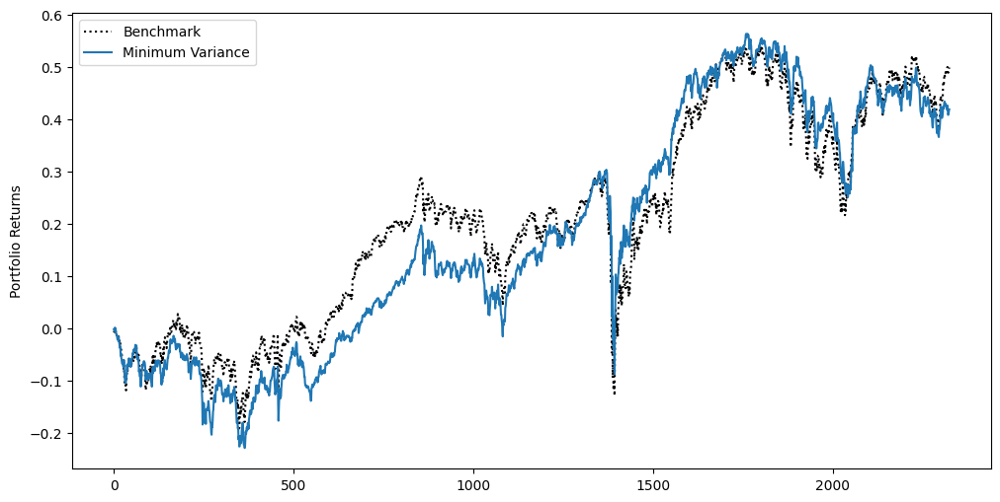

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_minvar_vis).cumsum(), label="Minimum Variance")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

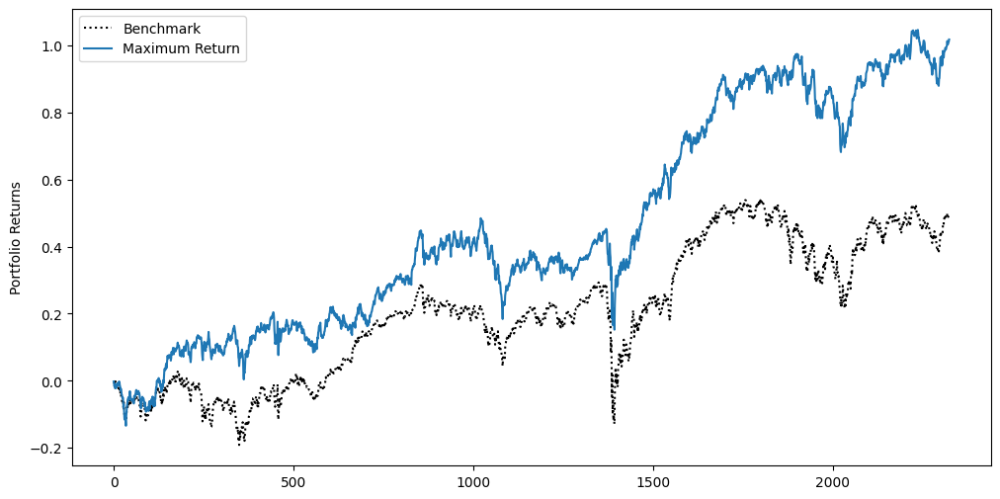

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_returns_vis).cumsum(), label="Maximum Return")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

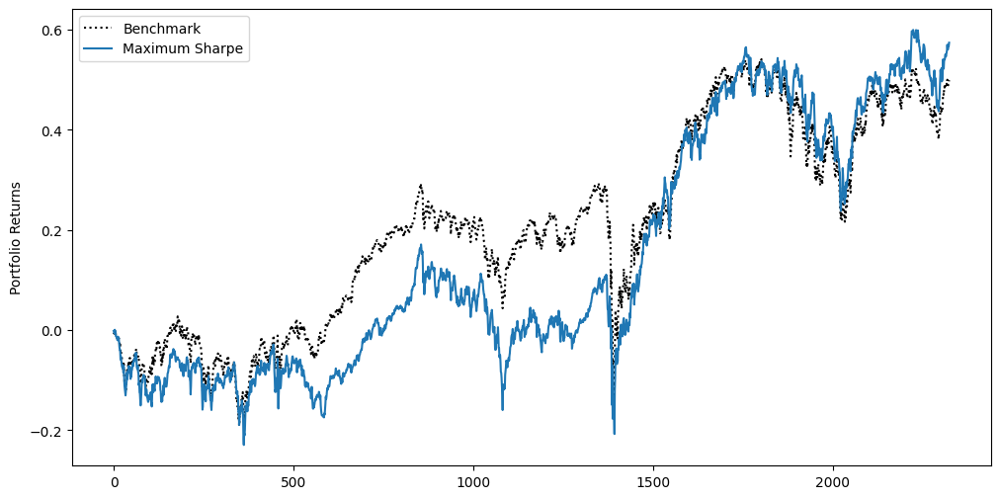

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_maxsharpe_vis).cumsum(), label="Maximum Sharpe")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

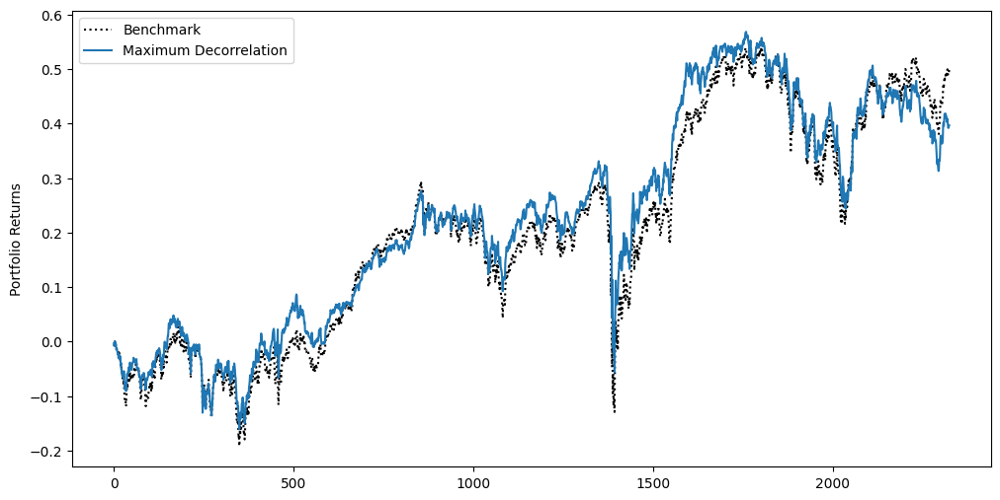

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_maxdecorr_vis).cumsum(), label="Maximum Decorrelation")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('MINVAR', print_stats(result_minvar_vis, result_equal_vis))
print('MAXRET', print_stats(result_returns_vis, result_equal_vis))
print('MAXSHRAPE', print_stats(result_maxsharpe_vis, result_equal_vis))
print('MAXDECORR', print_stats(result_maxdecorr_vis, result_equal_vis))

EQUAL ('Returns:', 0.0002, 'Volatility:', 0.0112, 'Sharpe', 0.3064, 'Alpha:', 0.0, 'Beta:', 1.0)
MINVAR ('Returns:', 0.0002, 'Volatility:', 0.0101, 'Sharpe', 0.2833, 'Alpha:', 0.0, 'Beta:', 0.8349)
MAXRET ('Returns:', 0.0004, 'Volatility:', 0.0121, 'Sharpe', 0.5753, 'Alpha:', 0.0002, 'Beta:', 0.9007)
MAXSHRAPE ('Returns:', 0.0002, 'Volatility:', 0.0116, 'Sharpe', 0.3374, 'Alpha:', 0.0001, 'Beta:', 0.9148)
MAXDECORR ('Returns:', 0.0002, 'Volatility:', 0.0103, 'Sharpe', 0.2644, 'Alpha:', -0.0, 'Beta:', 0.8767)


### PCA portfolio

In [ ]:
agent_pca = PCAAgent(N_ASSETS, allow_short=False, pc_id=0)

In [ ]:
actions_equal, actions_pca = [], []
result_equal, result_pca = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):

    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_pca = agent_pca.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)

    r = np.dot(state_action, action_pca)
    result_pca.append(r.tolist())
    actions_pca.append(action_pca)


In [ ]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_pca_vis = [item for sublist in result_pca for item in sublist]

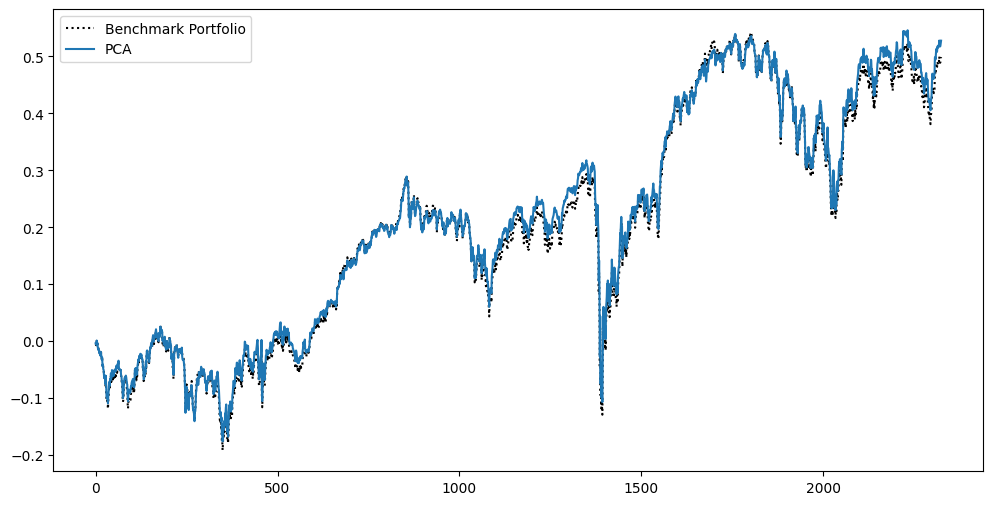

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_pca_vis).cumsum(), label = "PCA")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('PCA', print_stats(result_pca_vis, result_equal_vis))

EQUAL ('Returns:', 0.0002, 'Volatility:', 0.0112, 'Sharpe', 0.3064, 'Alpha:', 0.0, 'Beta:', 1.0)
PCA ('Returns:', 0.0002, 'Volatility:', 0.011, 'Sharpe', 0.33, 'Alpha:', 0.0, 'Beta:', 0.9748)


### HRP Portfolio

In [ ]:
agent_hrp = HRPAgent(N_ASSETS, allow_short=False)

In [ ]:
actions_equal, actions_hrp = [], []
result_equal, result_hrp = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):

    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_hrp = agent_hrp.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)

    r = np.dot(state_action, action_hrp)
    result_hrp.append(r.tolist())
    actions_hrp.append(action_hrp)

In [ ]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_hrp_vis = [item for sublist in result_hrp for item in sublist]

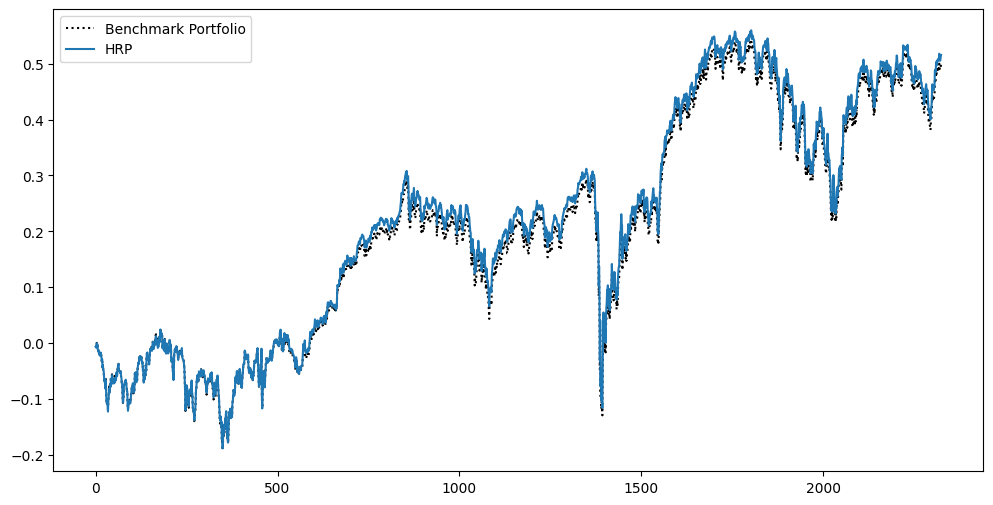

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_hrp_vis).cumsum(), label = "HRP")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('HRP', print_stats(result_hrp_vis, result_equal_vis))

EQUAL ('Returns:', 0.0002, 'Volatility:', 0.0112, 'Sharpe', 0.3064, 'Alpha:', 0.0, 'Beta:', 1.0)
HRP ('Returns:', 0.0002, 'Volatility:', 0.0113, 'Sharpe', 0.3147, 'Alpha:', 0.0, 'Beta:', 1.0068)


### Holt Portfolio

In [ ]:
agent_smooth = SmoothingAgent(N_ASSETS, allow_short=False, forecast_horizon = WINDOW_HOLD)

In [ ]:
actions_equal, actions_smooth = [], []
result_equal, result_smooth = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)

    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_smooth = agent_smooth.act(state)

    state_action = env.get_state(i + WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)

    r = np.dot(state_action, action_smooth)
    result_smooth.append(r.tolist())
    actions_smooth.append(action_smooth)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-p

In [ ]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_smooth_vis = [item for sublist in result_smooth for item in sublist]

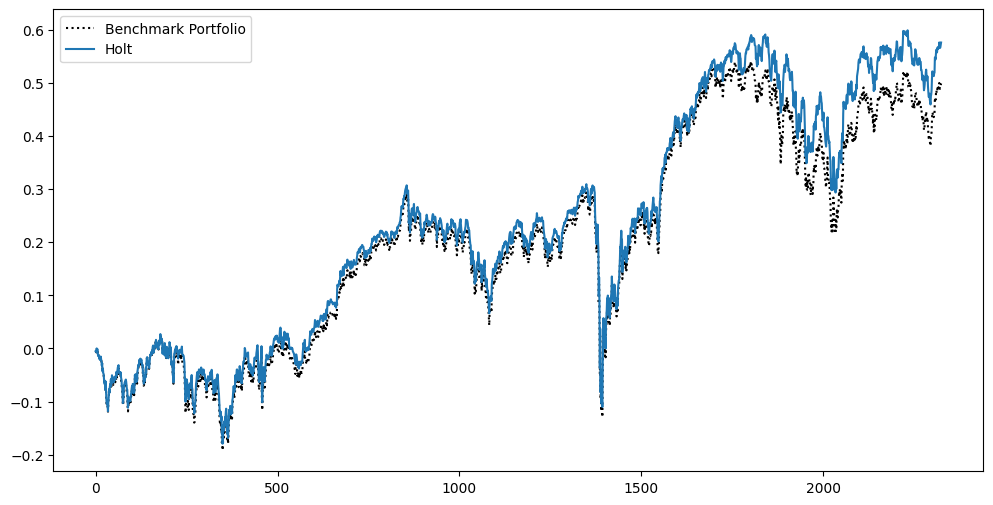

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_smooth_vis).cumsum(), label = "Holt")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('HOLT SMOOTHENING', print_stats(result_smooth_vis, result_equal_vis))

EQUAL ('Returns:', 0.0002, 'Volatility:', 0.0112, 'Sharpe', 0.3064, 'Alpha:', 0.0, 'Beta:', 1.0)
HOLT SMOOTHENING ('Returns:', 0.0002, 'Volatility:', 0.0113, 'Sharpe', 0.3526, 'Alpha:', 0.0, 'Beta:', 0.9947)


### Autoencoder Portfolio

In [ ]:
agent_ae = AutoencoderAgent(N_ASSETS, allow_short=False, encoding_dim = 5)

In [ ]:
actions_equal, actions_ae = [], []
result_equal, result_ae = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)

    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_ae = agent_ae.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)

    r = np.dot(state_action, action_ae)
    result_ae.append(r.tolist())
    actions_ae.append(action_ae)

6/6 [==============================] - 0s 5ms/step


In [ ]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_ae_vis = [item for sublist in result_ae for item in sublist]

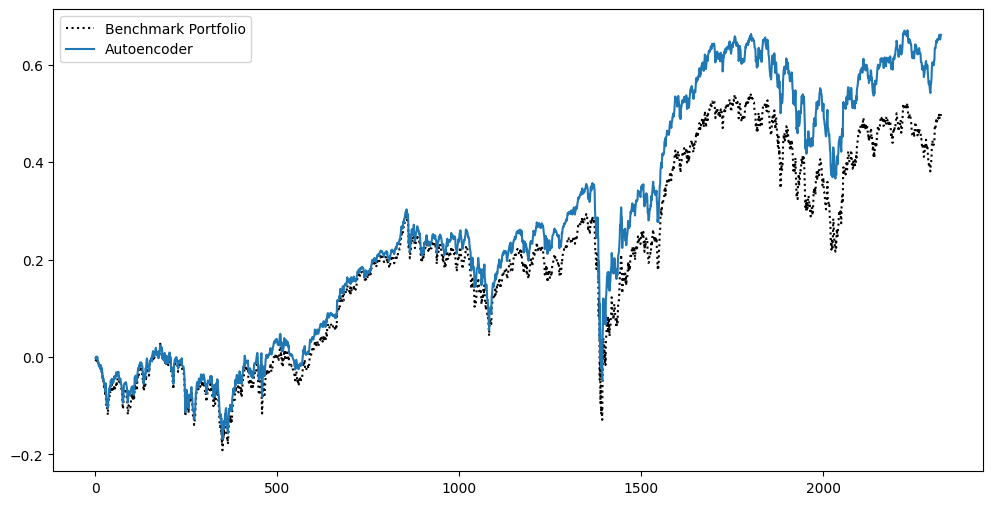

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_ae_vis).cumsum(), label = "Autoencoder")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('AUTOENCODER', print_stats(result_ae_vis, result_equal_vis))

EQUAL ('Returns:', 0.0002, 'Volatility:', 0.0112, 'Sharpe', 0.3064, 'Alpha:', 0.0, 'Beta:', 1.0)
AUTOENCODER ('Returns:', 0.0003, 'Volatility:', 0.011, 'Sharpe', 0.4126, 'Alpha:', 0.0001, 'Beta:', 0.9644)



###Summary Plots

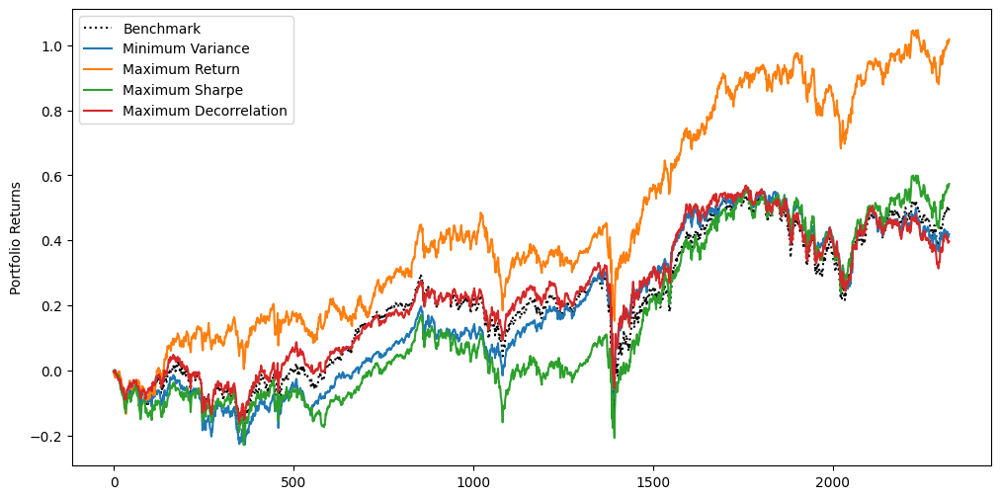

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_minvar_vis).cumsum(), label="Minimum Variance")
plt.plot(np.array(result_returns_vis).cumsum(), label="Maximum Return")
plt.plot(np.array(result_maxsharpe_vis).cumsum(), label="Maximum Sharpe")
plt.plot(np.array(result_maxdecorr_vis).cumsum(), label="Maximum Decorrelation")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

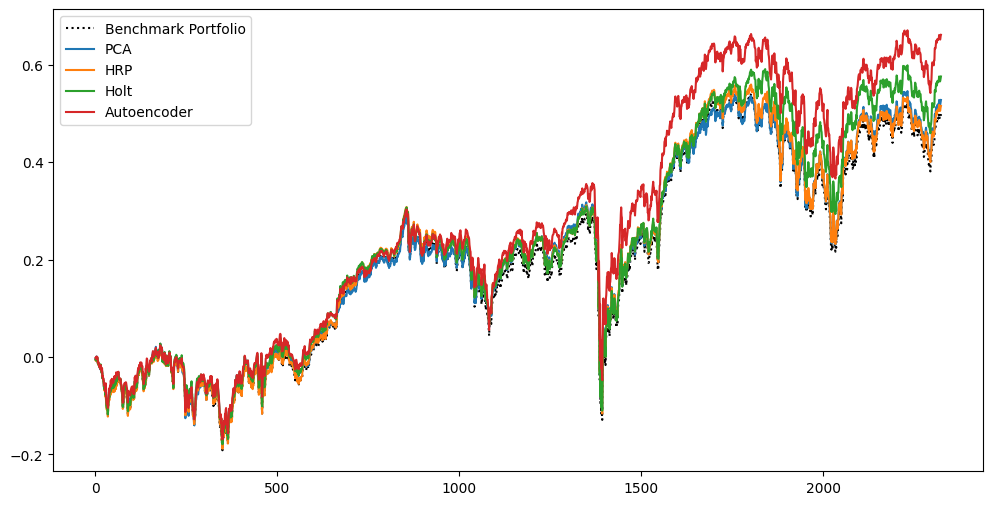

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_pca_vis).cumsum(), label = "PCA")
plt.plot(np.array(result_hrp_vis).cumsum(), label = "HRP")
plt.plot(np.array(result_smooth_vis).cumsum(), label = "Holt")
plt.plot(np.array(result_ae_vis).cumsum(), label = "Autoencoder")
plt.legend()
plt.show()

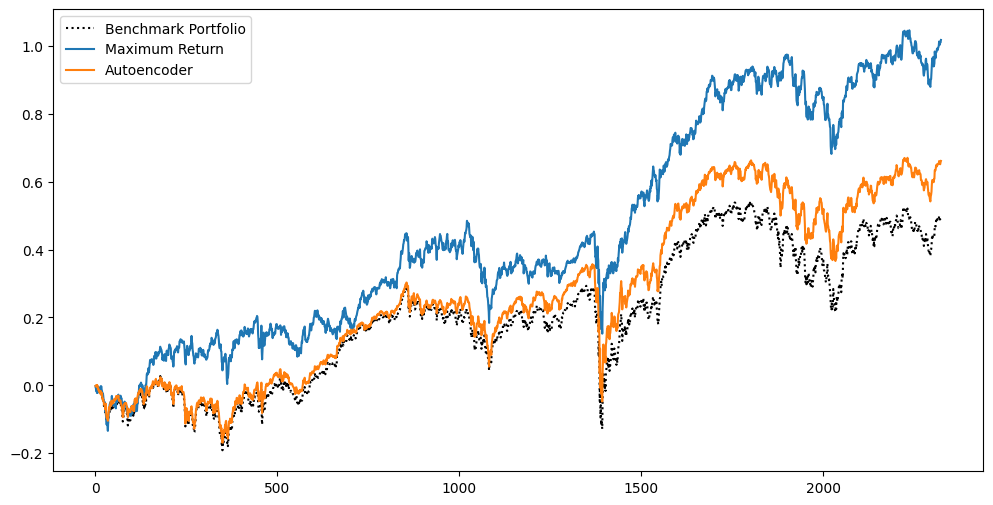

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_returns_vis).cumsum(), label="Maximum Return")
plt.plot(np.array(result_ae_vis).cumsum(), label = "Autoencoder")
plt.legend()
plt.show()

In [ ]:
result_equal_vis_array = np.array(result_equal_vis)
cumulative_sum = np.cumsum(result_equal_vis_array)
print(cumulative_sum)

[-0.00524894 -0.00658913 -0.00730155 ...  0.48952045  0.49480095
  0.49884999]


##Visualisation (using Global Equity Data)

### Plotting code

In [ ]:
current_cmap = matplotlib.cm.get_cmap()
current_cmap.set_bad(color='red')

In [ ]:
def plot_results(benchmark_series,
                 target_series,
                 target_balances,
                 n_assets,
                 columns,
                 name2plot = '',
                 path2save = './',
                 base_name_series = 'series'):

    N = len(np.array([item for sublist in benchmark_series for item in sublist]).cumsum())

    if not os.path.exists(path2save):
        os.makedirs(path2save)

    for i in range(0, len(target_balances)):

        current_range = np.arange(0, N)
        current_ts = np.zeros(N)
        current_ts2 = np.zeros(N)

        ts_benchmark = np.array([item for sublist in benchmark_series[:i + 1] for item in sublist]).cumsum()
        ts_target = np.array([item for sublist in target_series[:i + 1] for item in sublist]).cumsum()
        #ts_benchmark = np.array(benchmark_series[:i+1]).flatten().cumsum()
        #ts_target = np.array(target_series[:i+1]).flatten().cumsum()

        t = len(ts_benchmark)
        current_ts[:t] = ts_benchmark
        current_ts2[:t] = ts_target


        current_ts[current_ts == 0] = ts_benchmark[-1]
        current_ts2[current_ts2 == 0] = ts_target[-1]

        plt.figure(figsize = (12, 10))

        plt.subplot(2, 1, 1)
        plt.bar(np.arange(n_assets), target_balances[i], color = 'grey')
        plt.xticks(np.arange(n_assets), columns, rotation='vertical')

        plt.subplot(2, 1, 2)
        plt.colormaps = current_cmap
        plt.plot(current_range[:t], current_ts[:t], color = 'black', label = 'Benchmark')
        plt.plot(current_range[:t], current_ts2[:t], color = 'red', label = name2plot)
        plt.plot(current_range[t:], current_ts[t:], ls = '--', lw = .1, color = 'black')
        #plt.autoscale(False)
        plt.legend(loc='upper left')
        plt.savefig(path2save + base_name_series + str(i) + '.jpg')

### Standard Optimizers

####Maximum Returns Portfolio

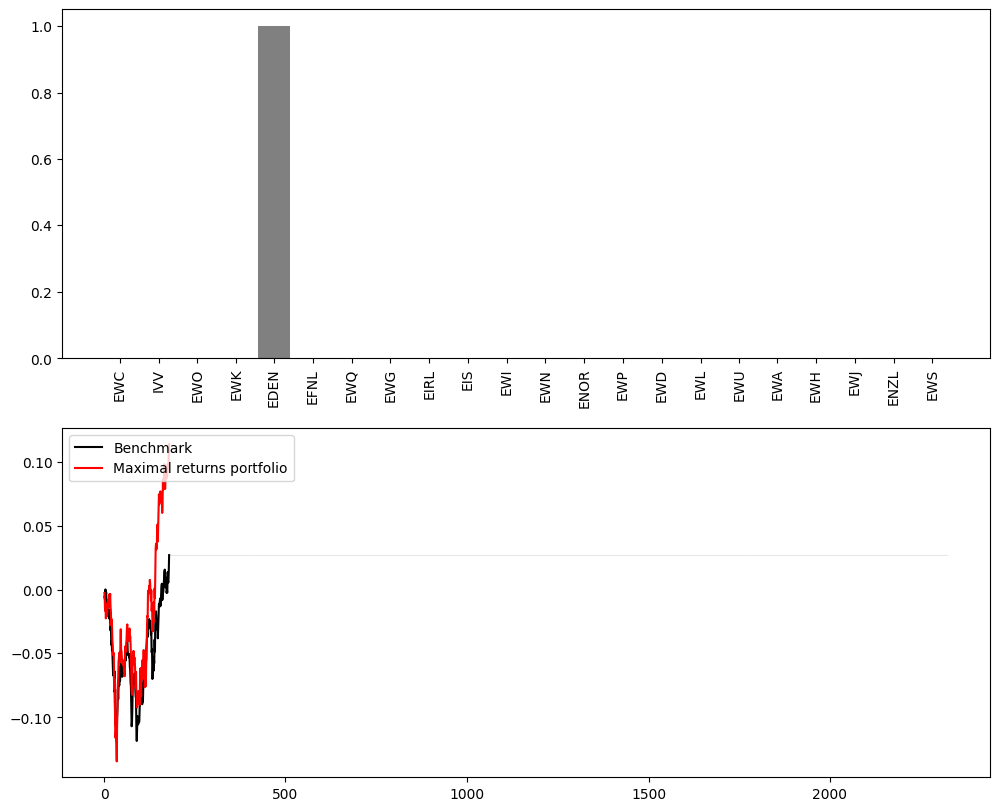

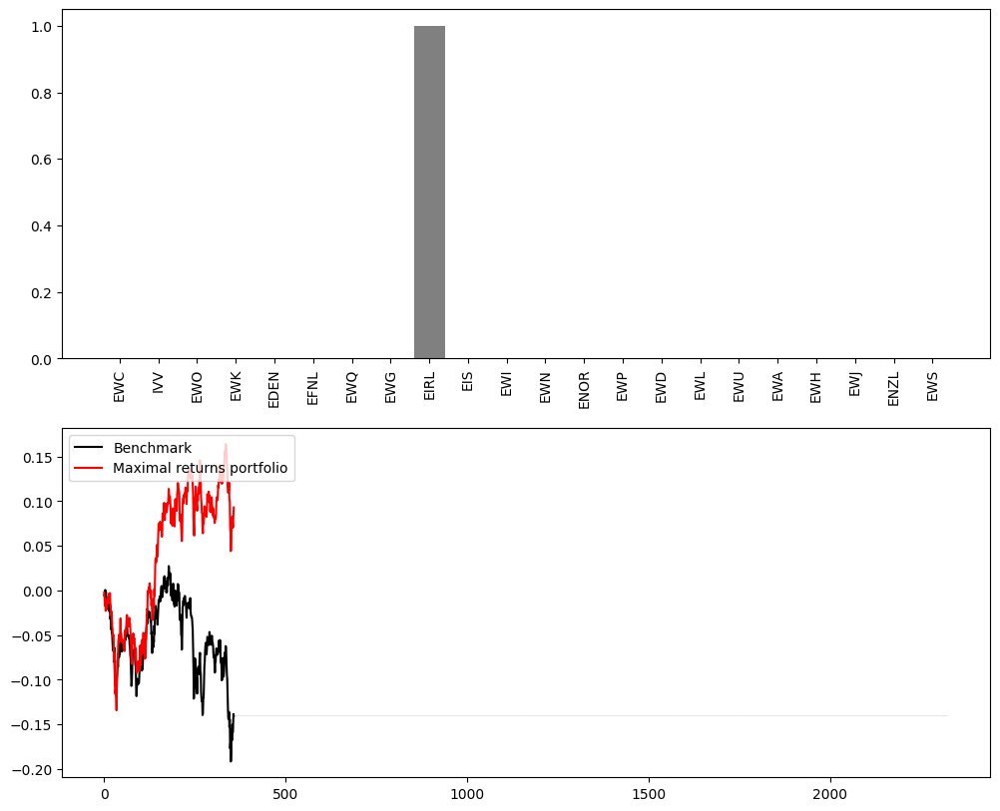

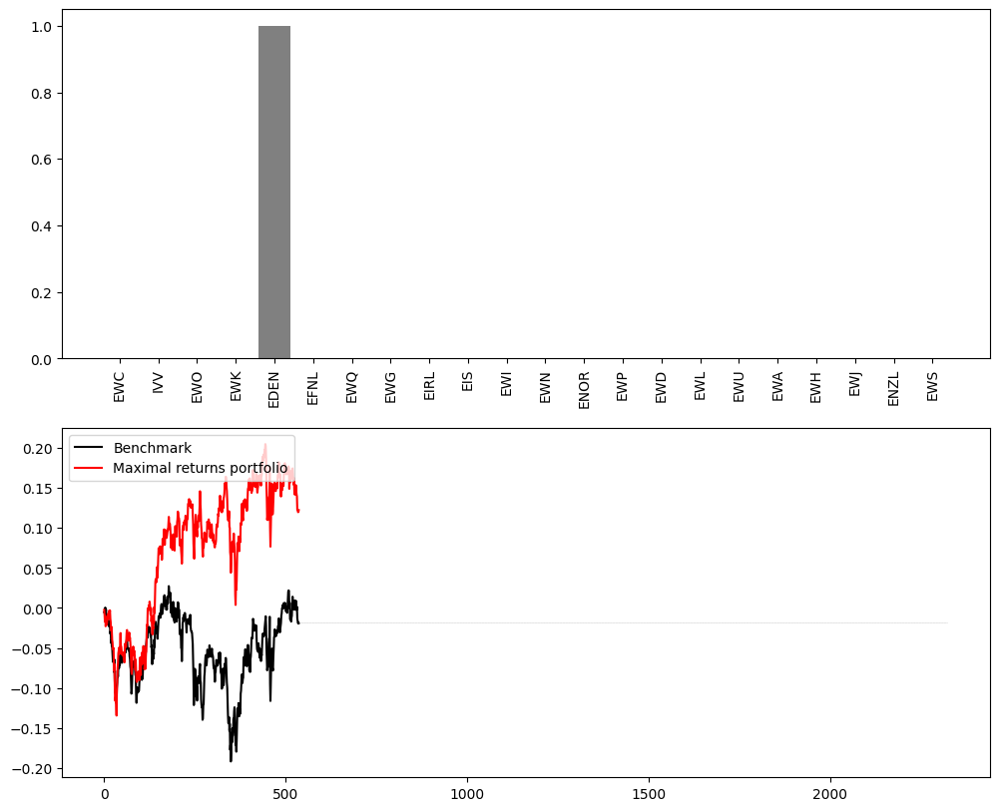

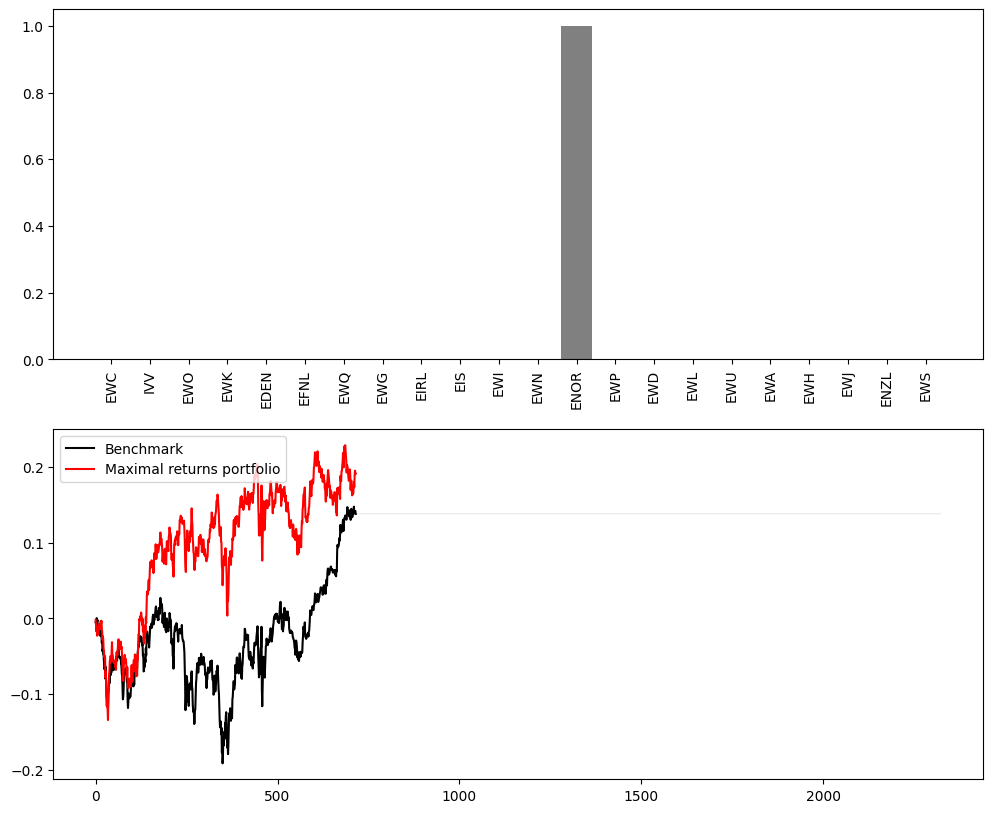

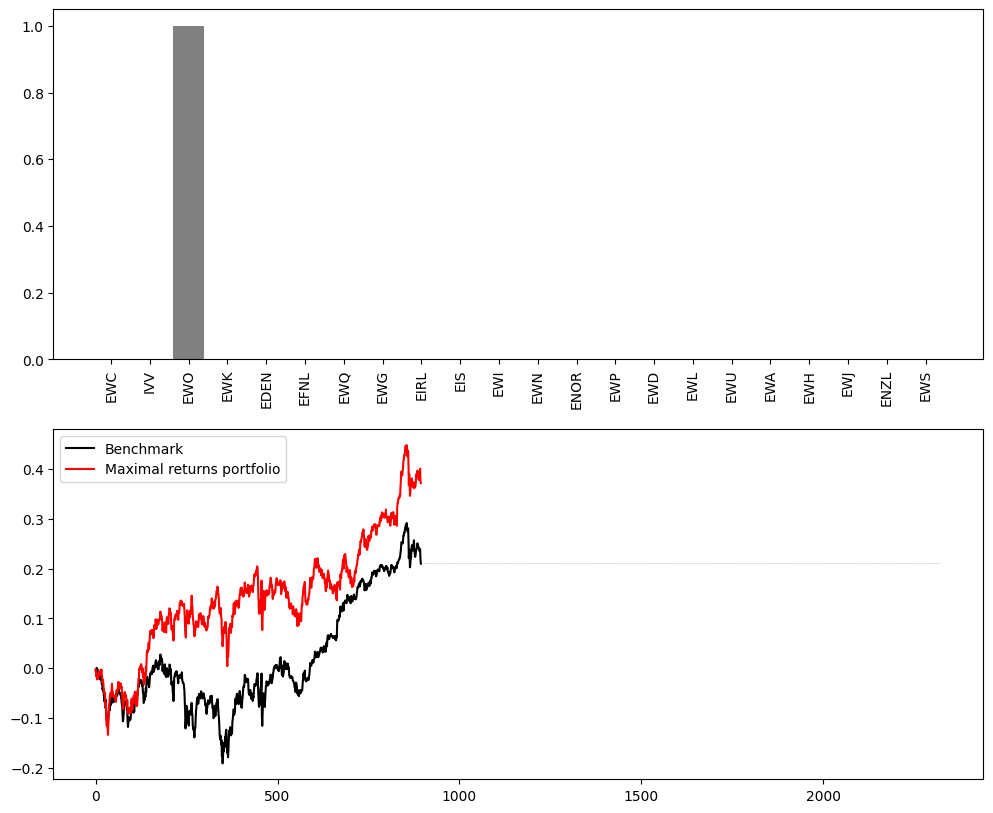

...

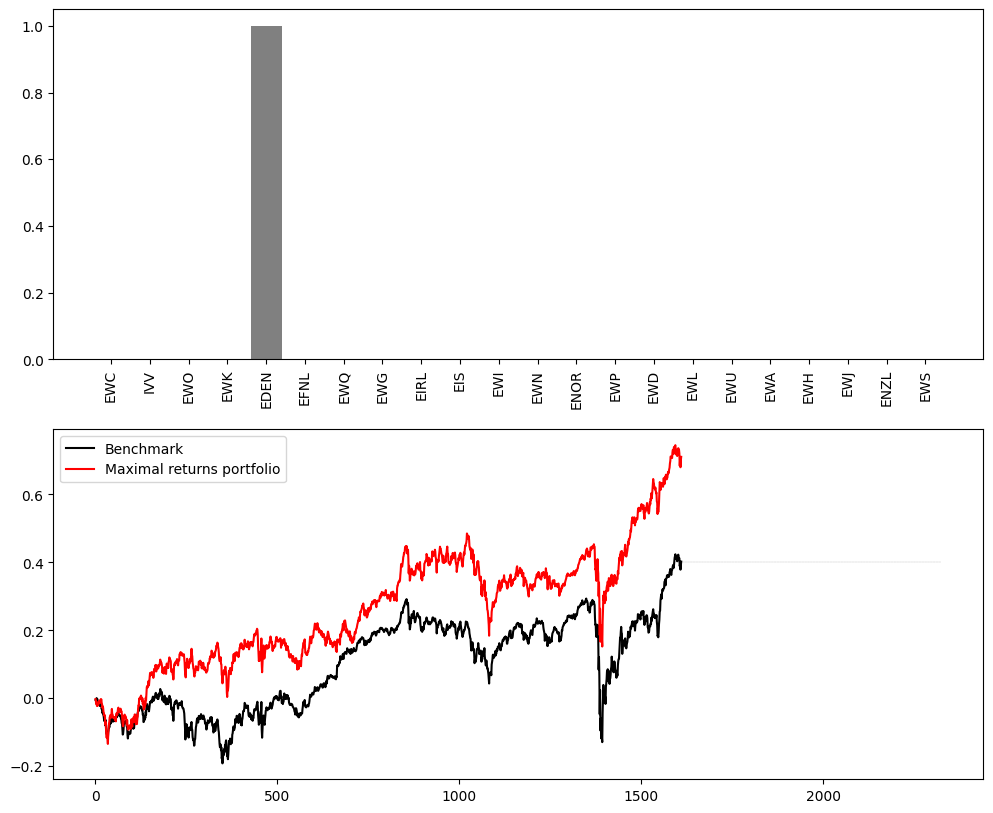

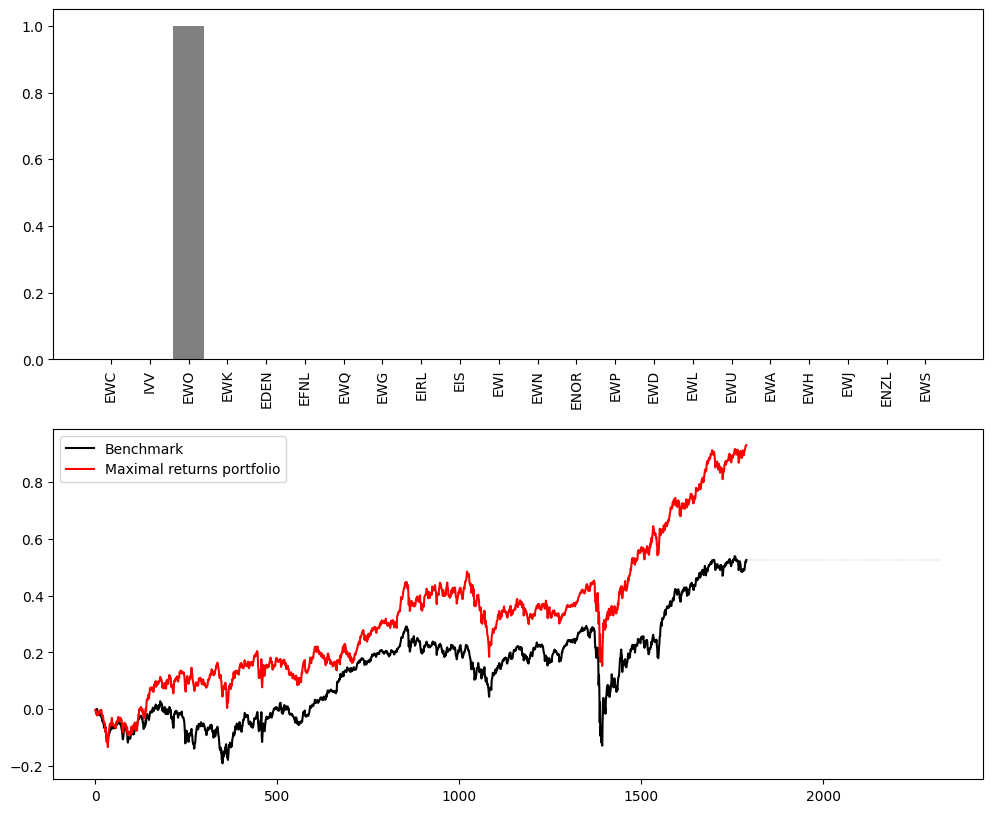

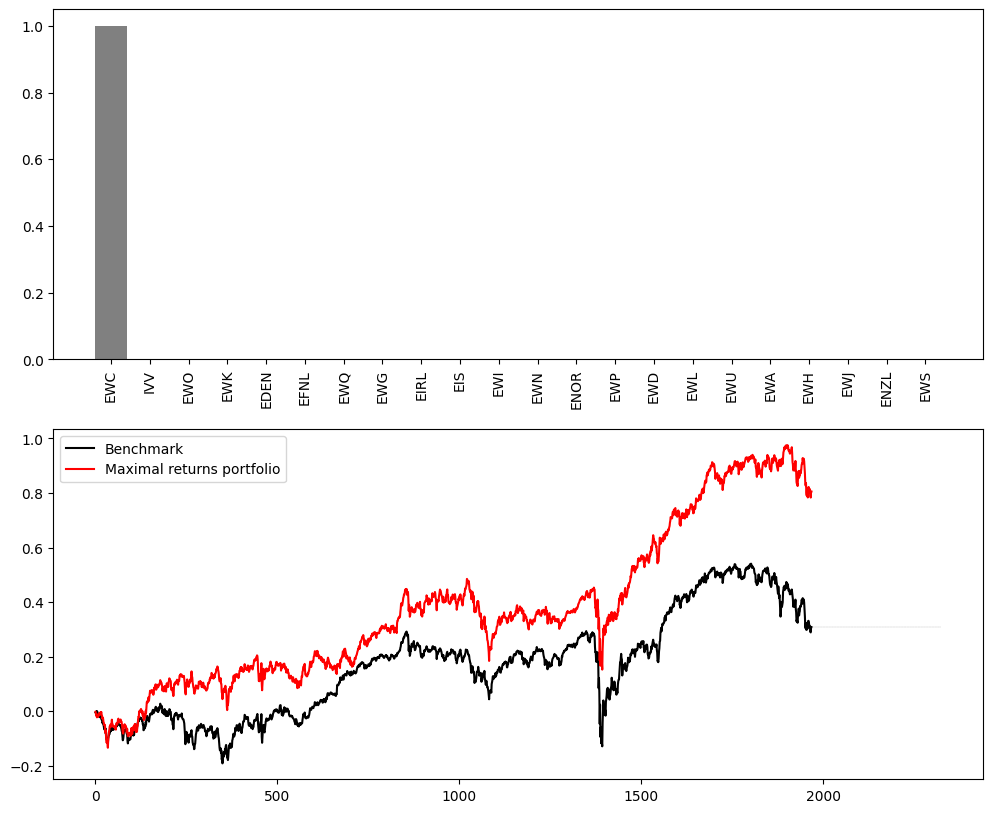

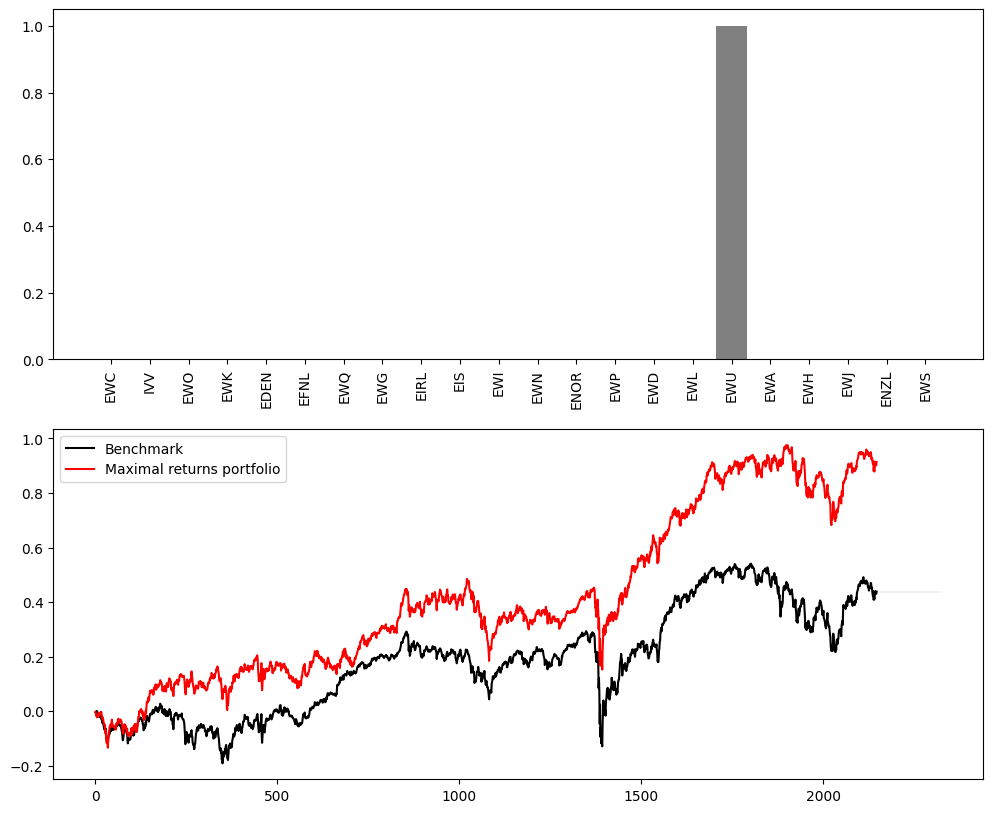

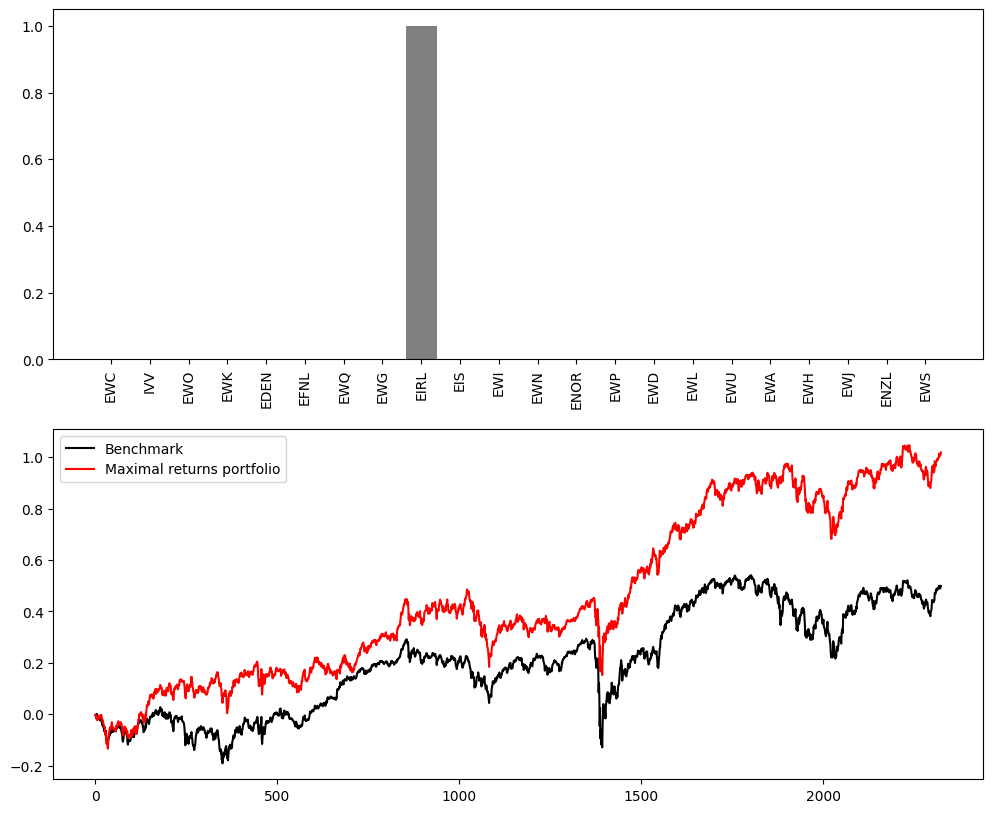

In [ ]:
plot_results(result_equal,
             result_returns,
             actions_returns,
             N_ASSETS,
             state.columns.tolist(),
             'Maximal returns portfolio', './images_etf/maxret/', 'series')

####Minimum Variance Portfolio

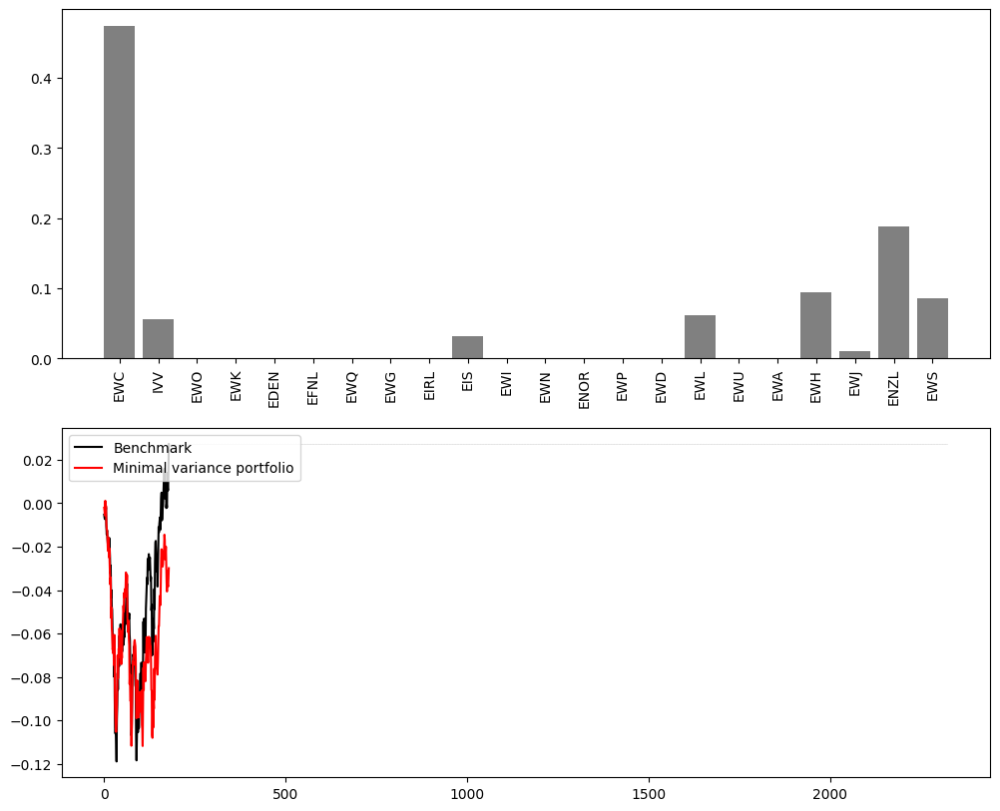

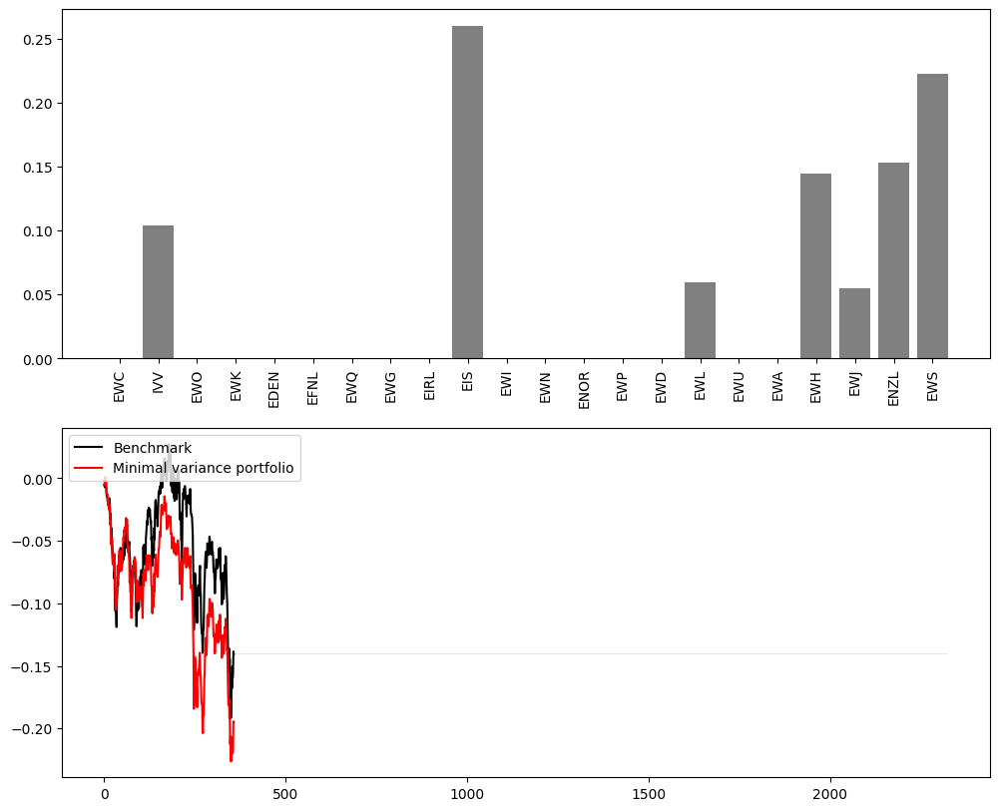

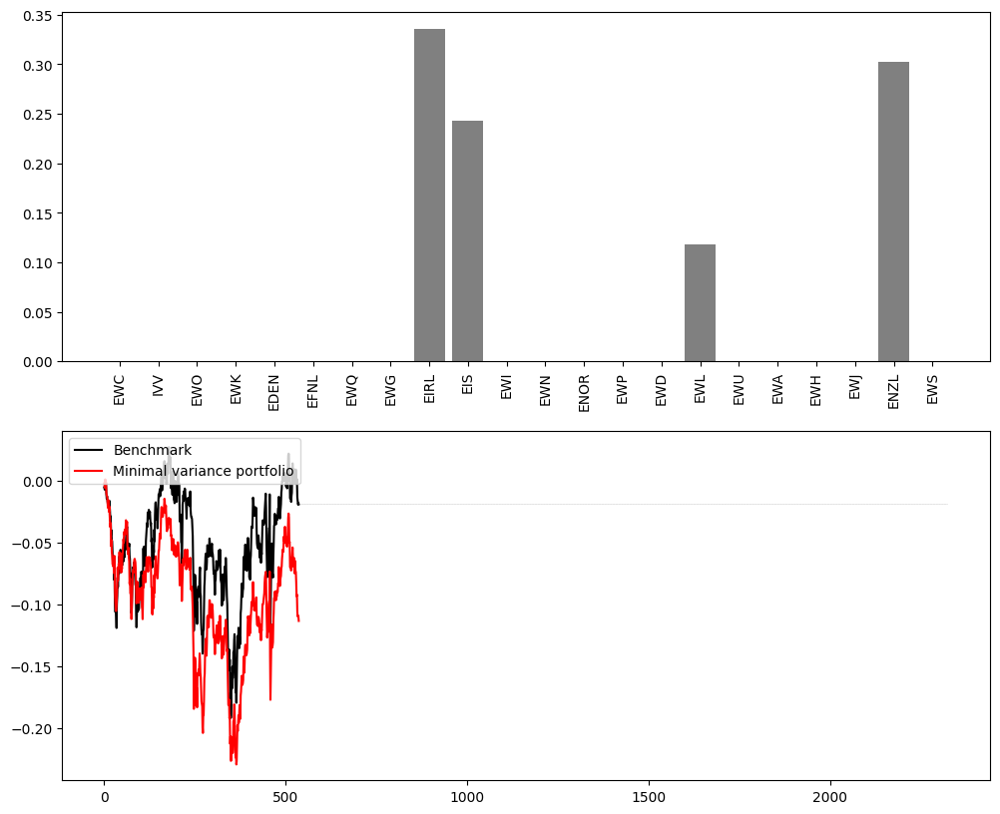

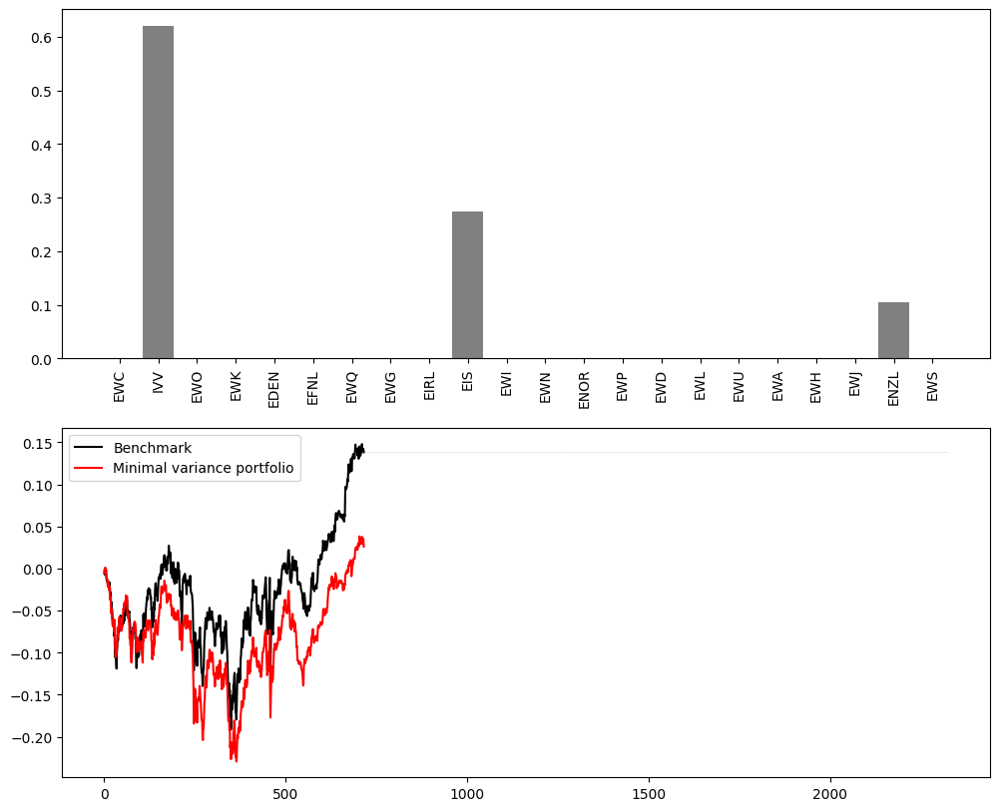

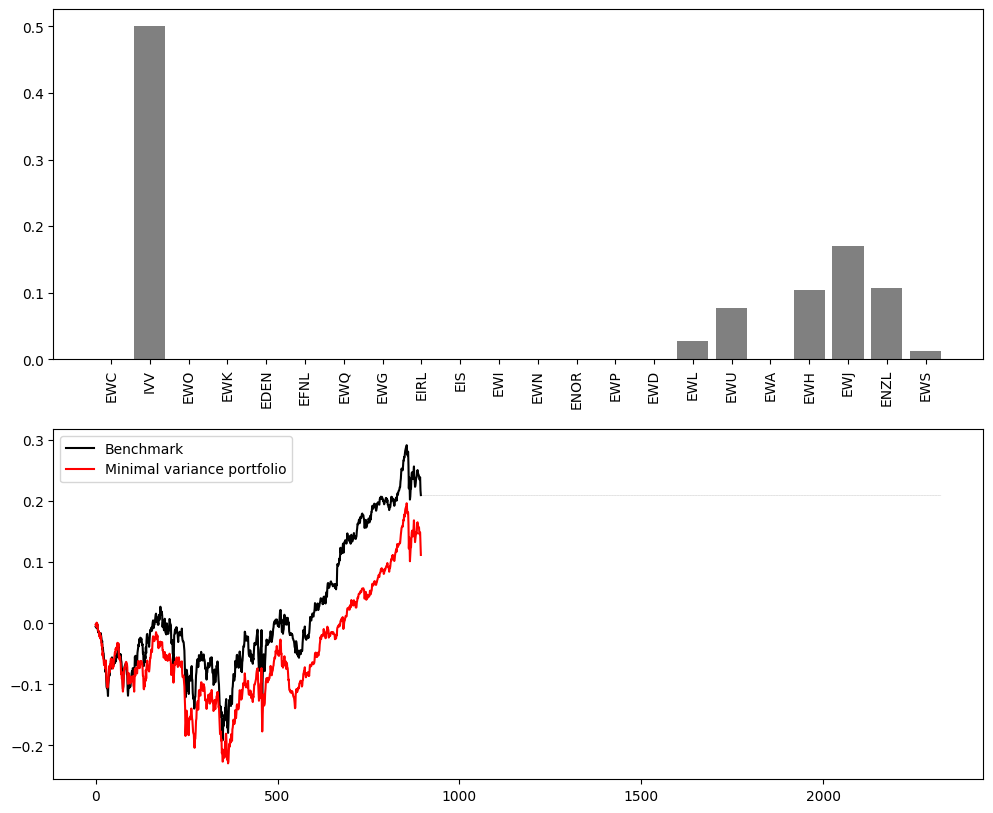

...

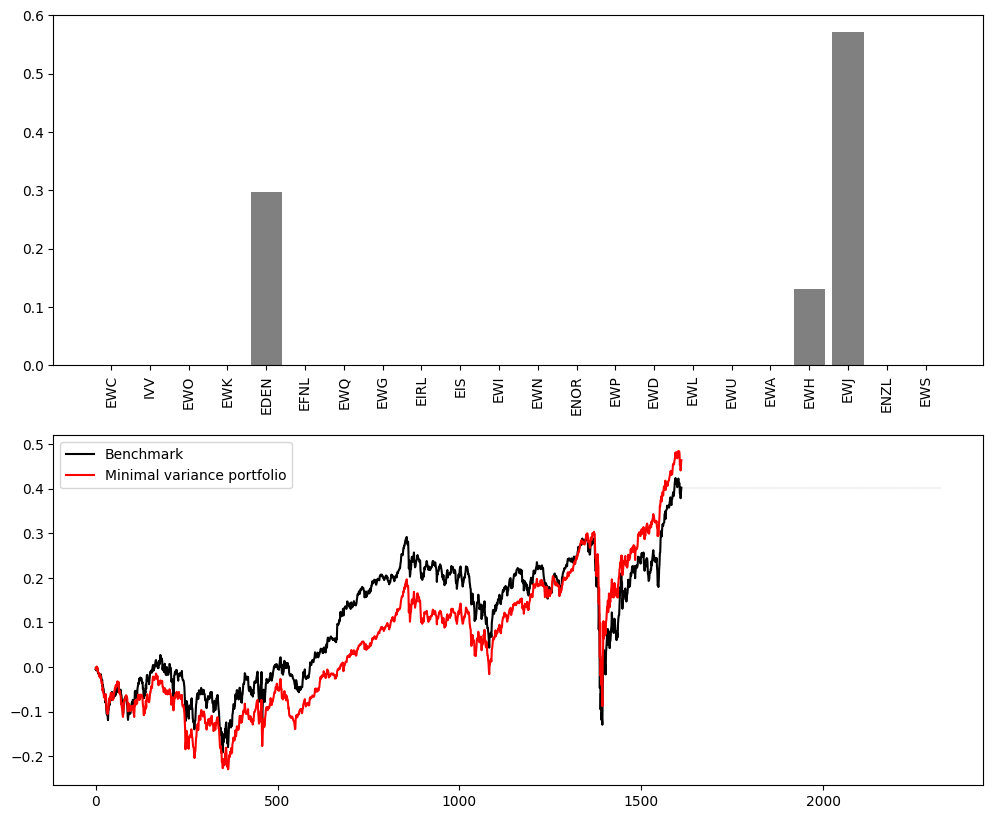

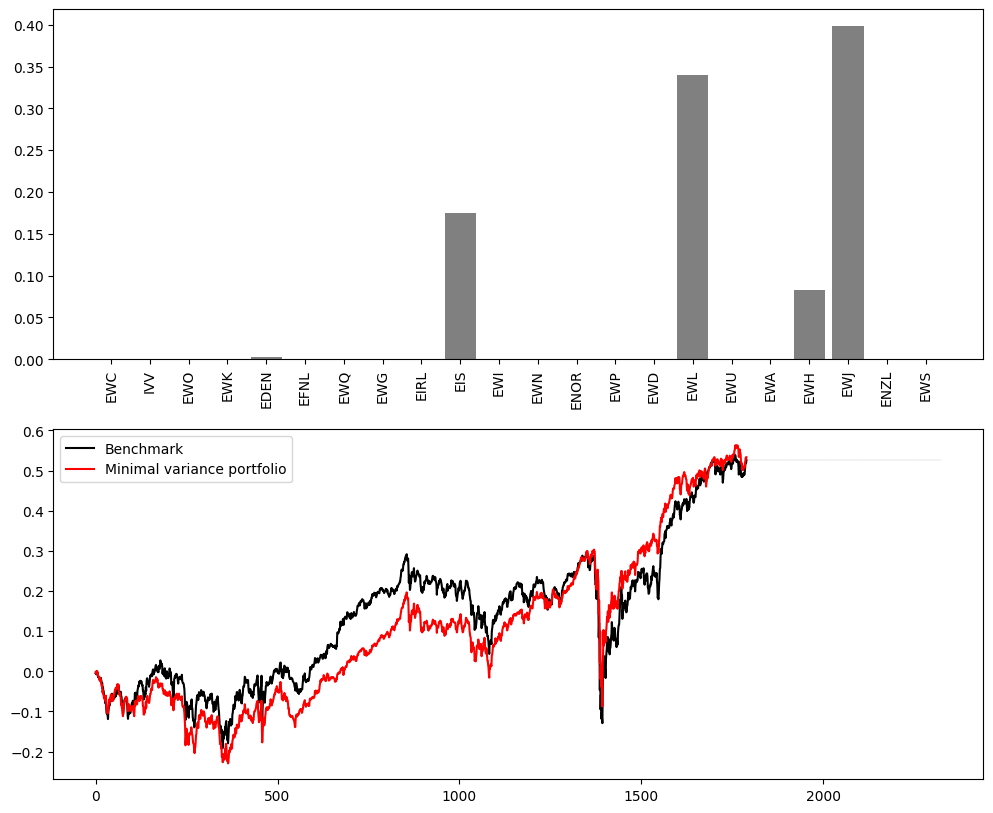

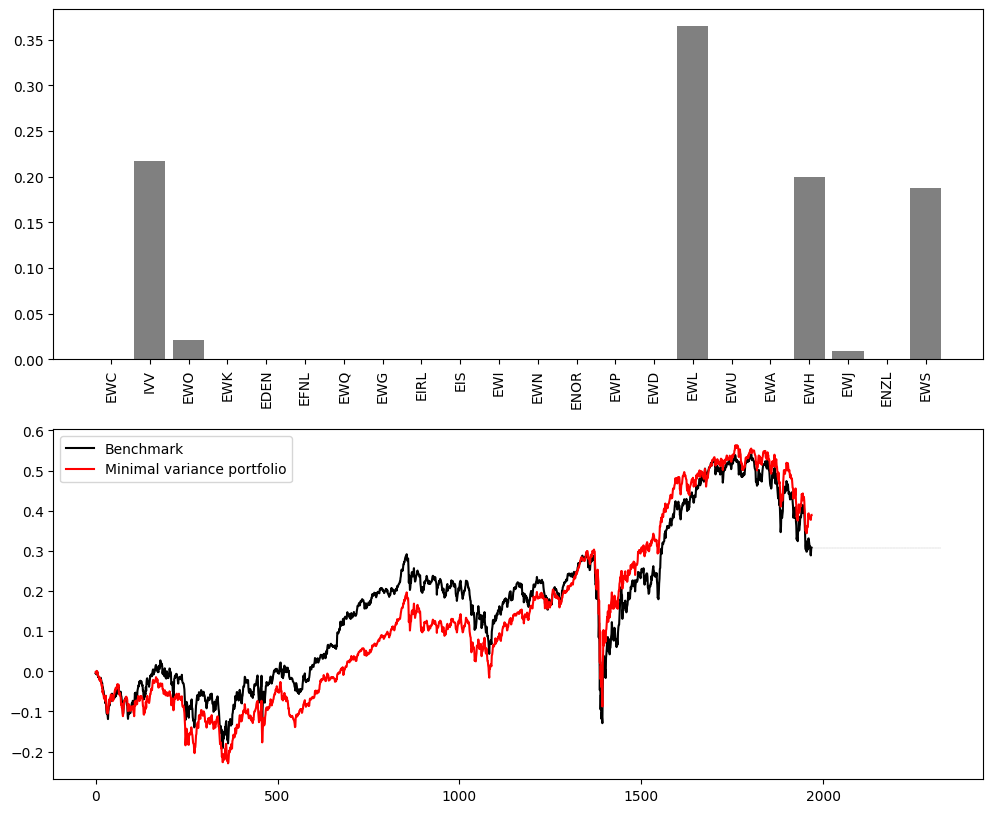

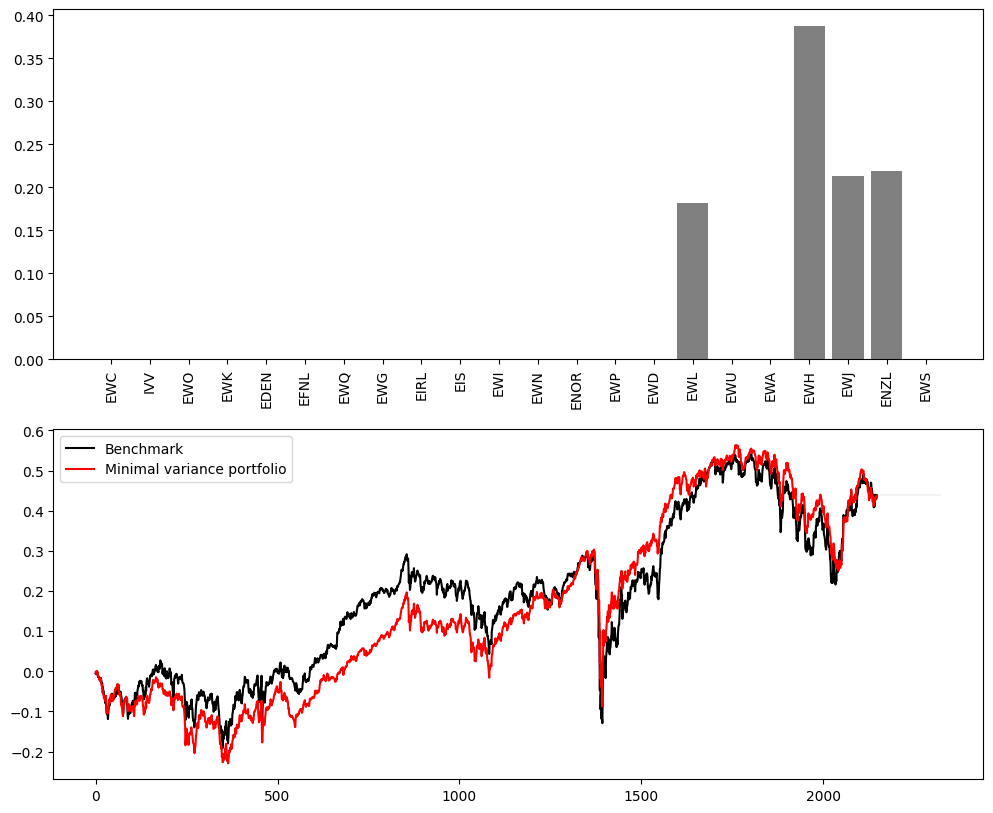

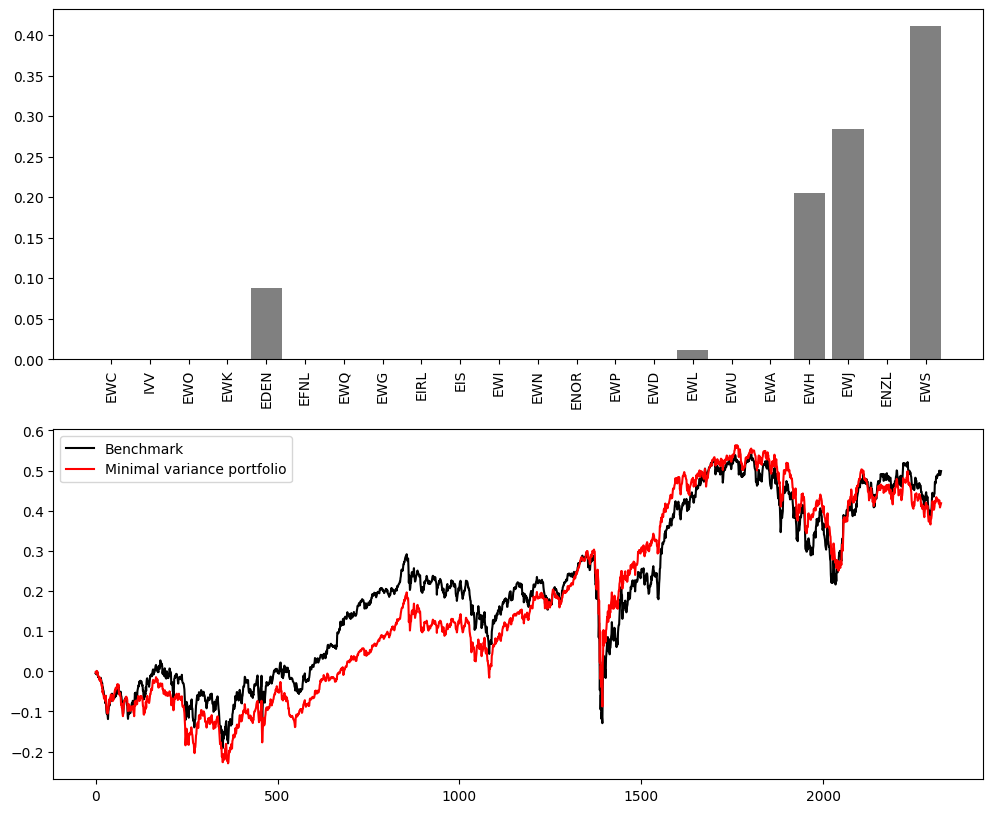

In [ ]:
plot_results(result_equal,
             result_minvar,
             actions_minvar,
             N_ASSETS,
             state.columns.tolist(),
             'Minimal variance portfolio', './images_etf/minvar/', 'series')

####Maximum Sharpe Portfolio

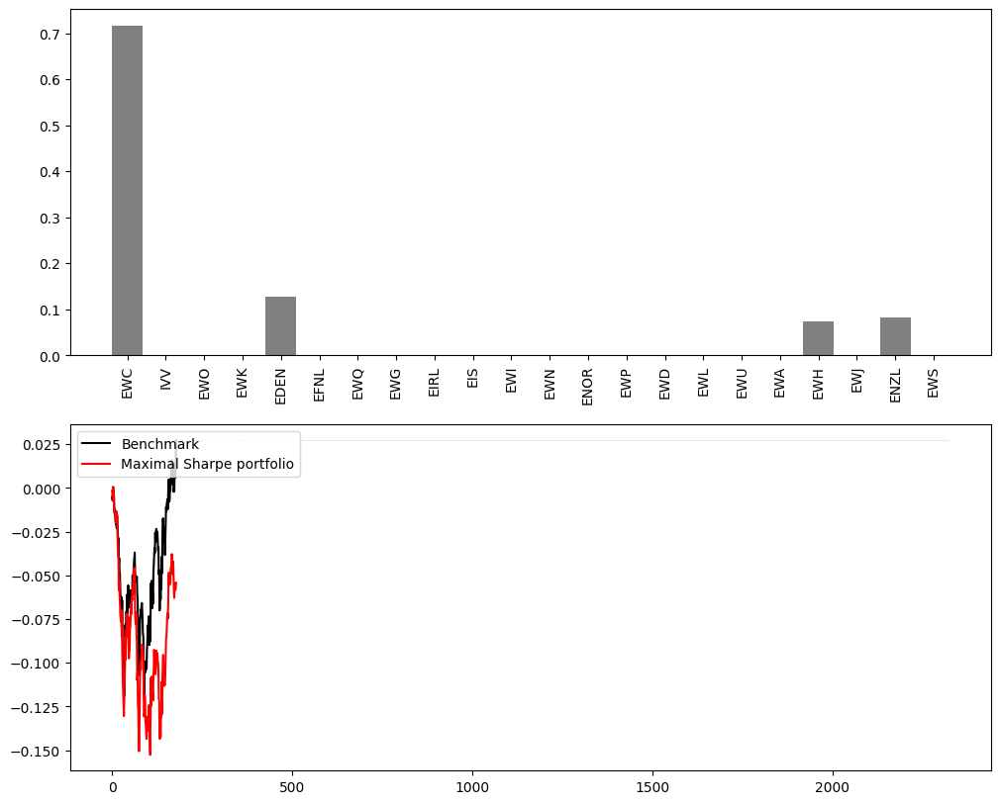

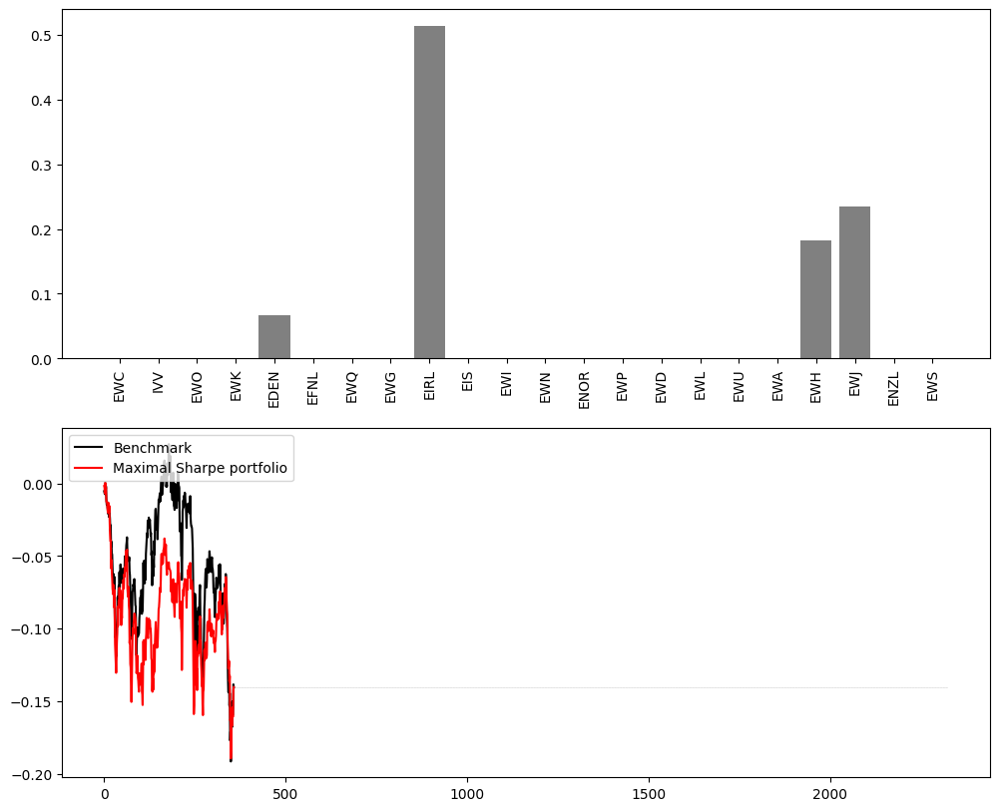

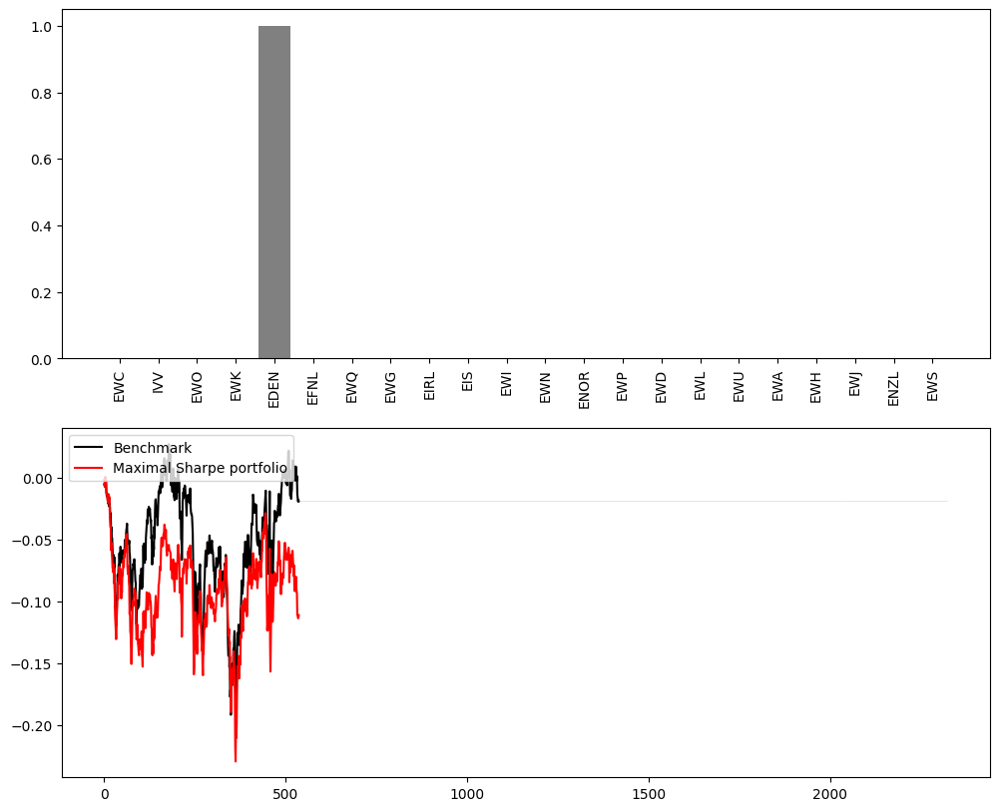

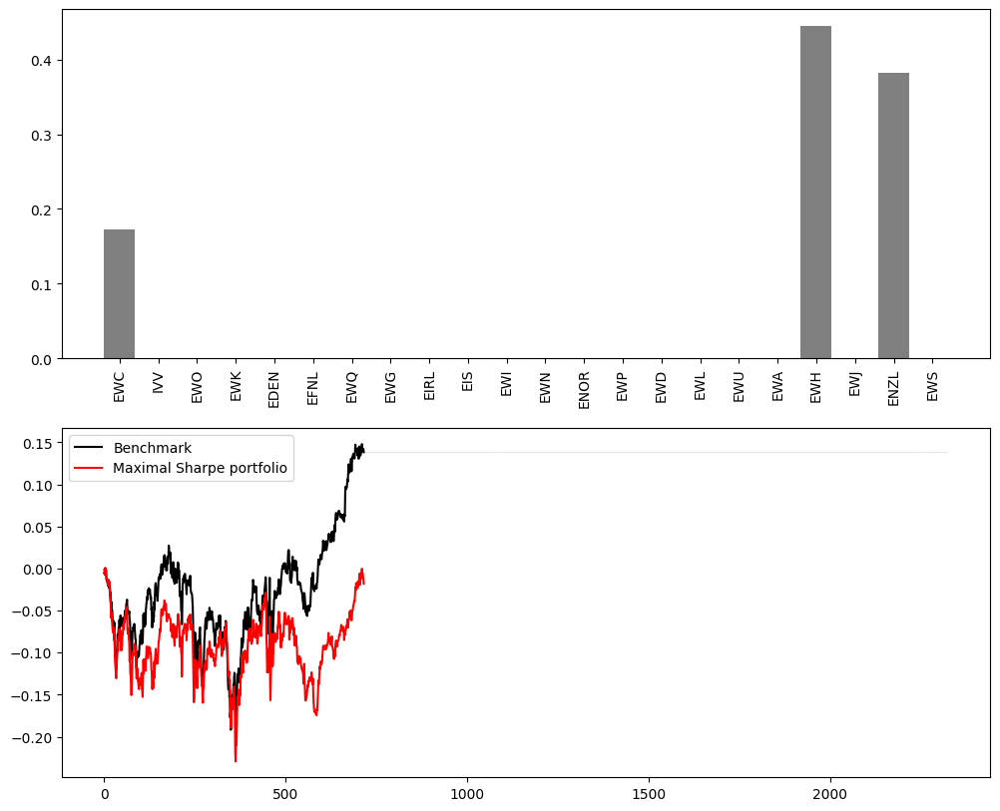

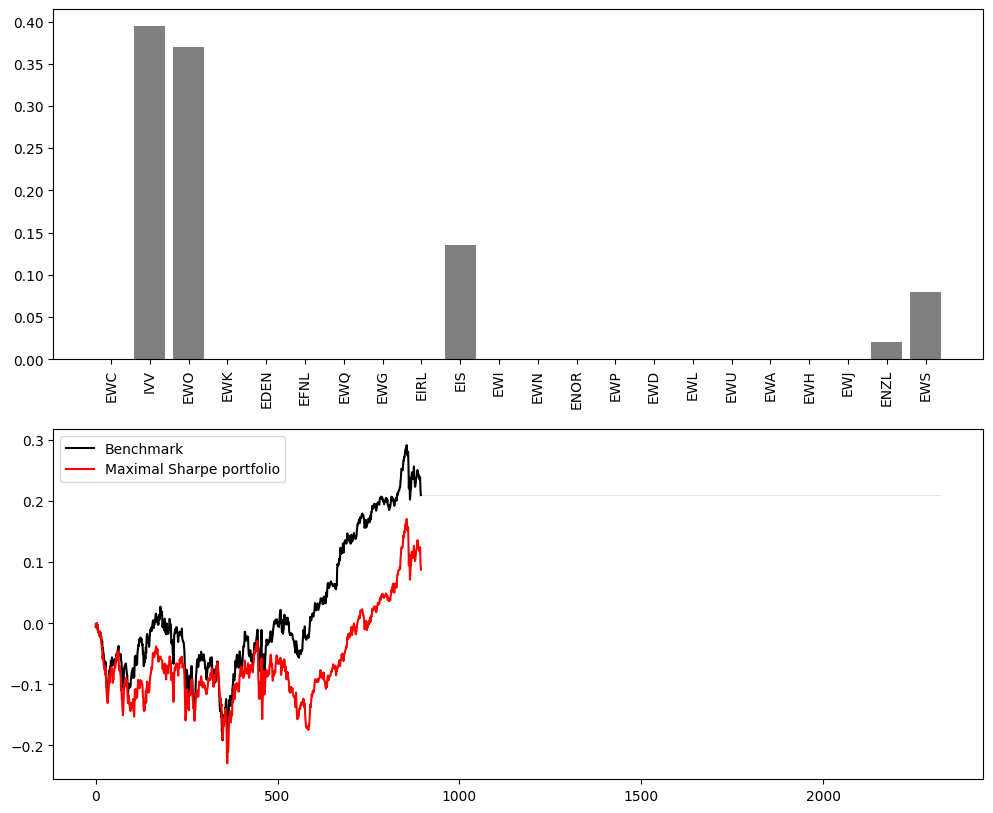

...

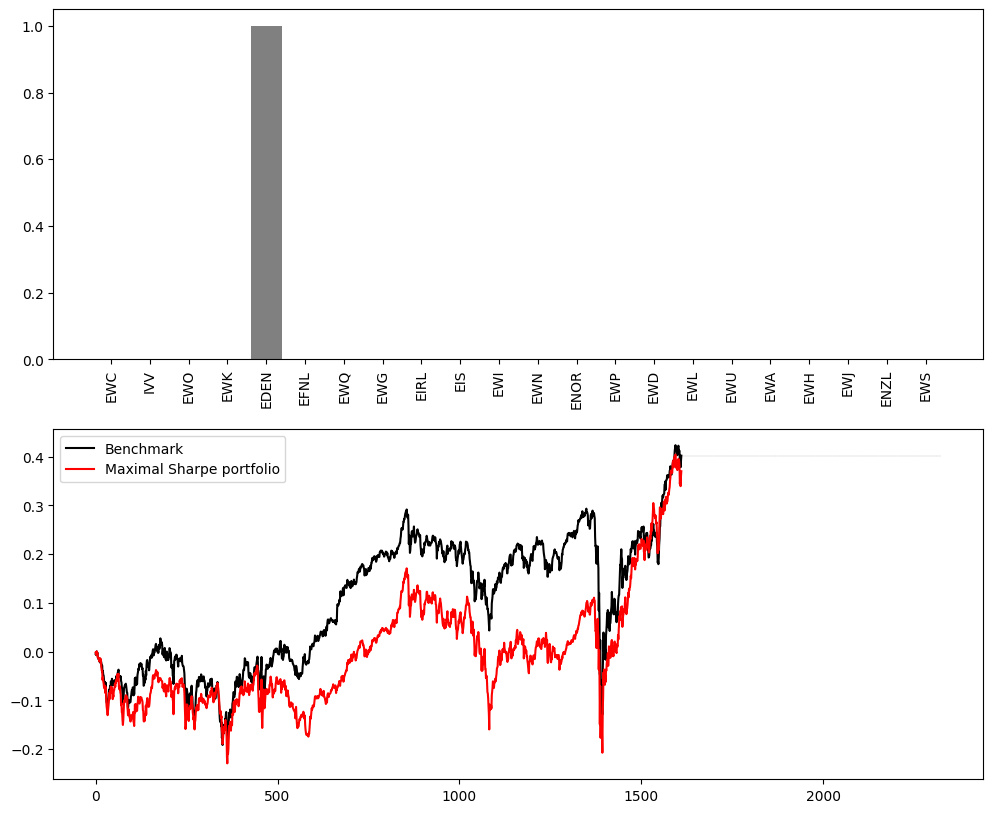

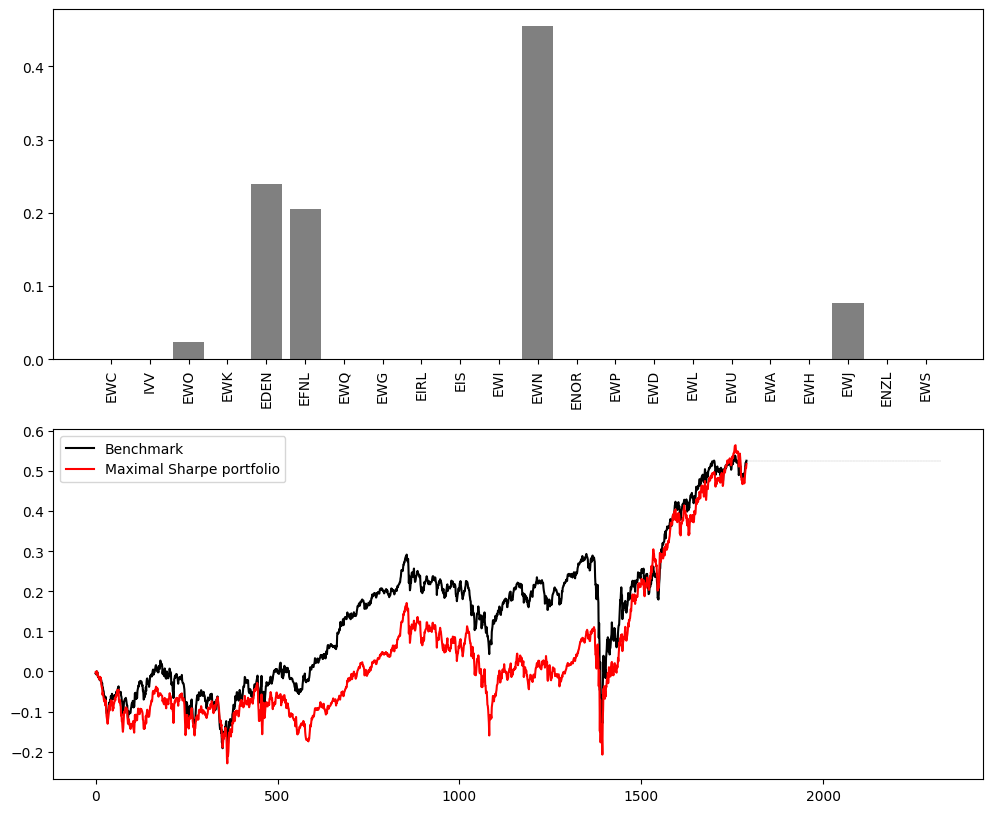

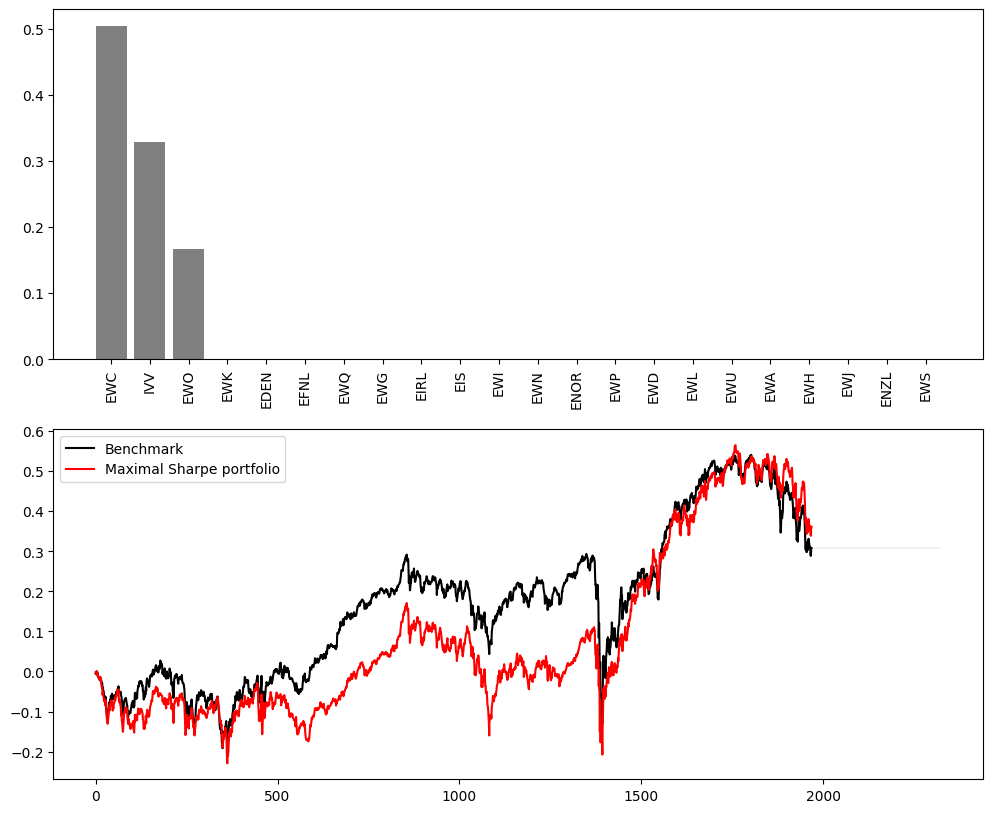

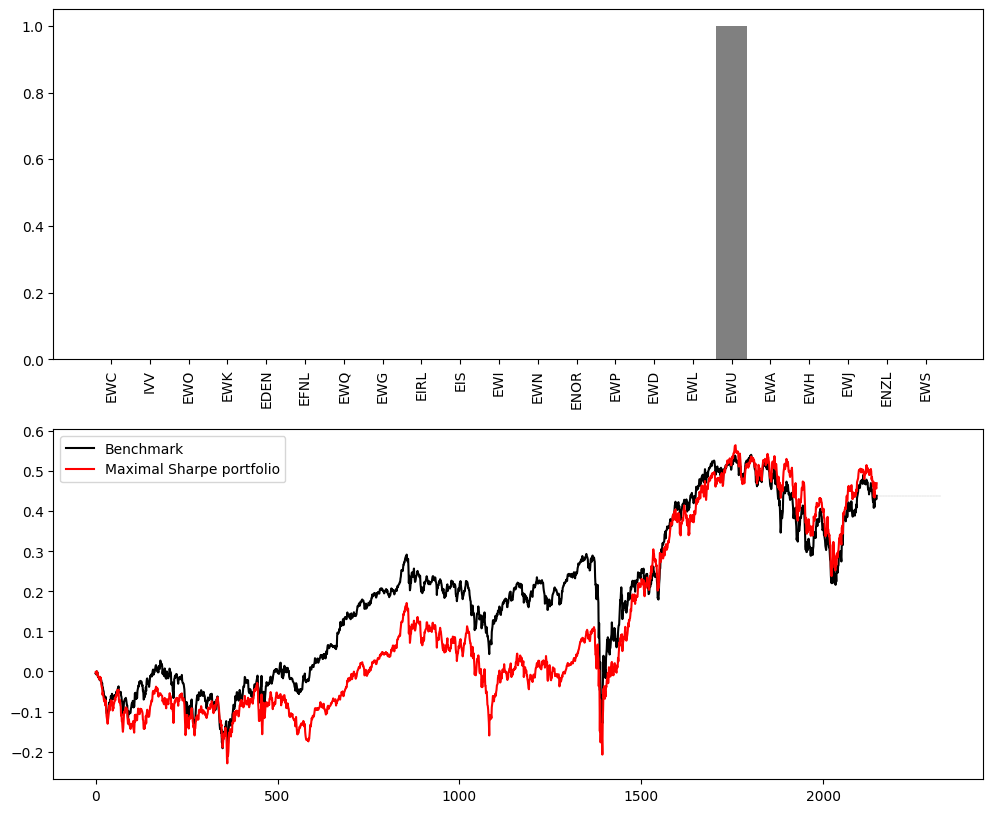

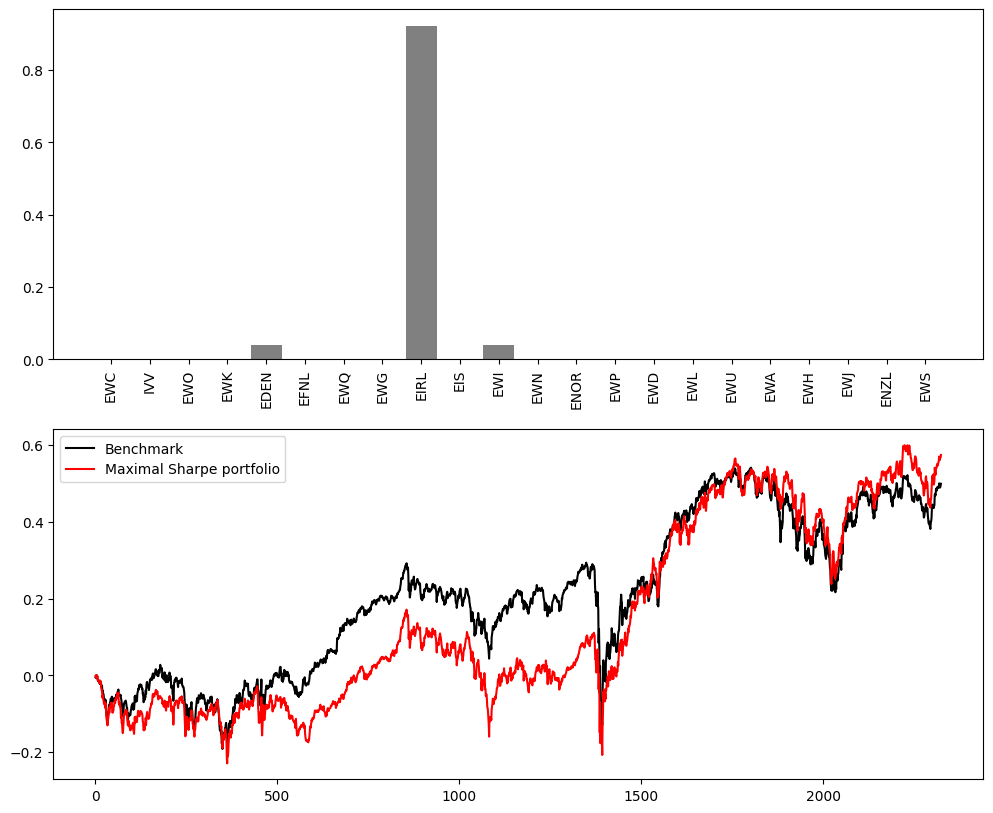

In [ ]:
plot_results(result_equal,
             result_maxsharpe,
             actions_maxsharpe,
             N_ASSETS,
             state.columns.tolist(),
             'Maximal Sharpe portfolio', './images_etf/sharpe/', 'series')

####Maximum Decorrelation Portfolio

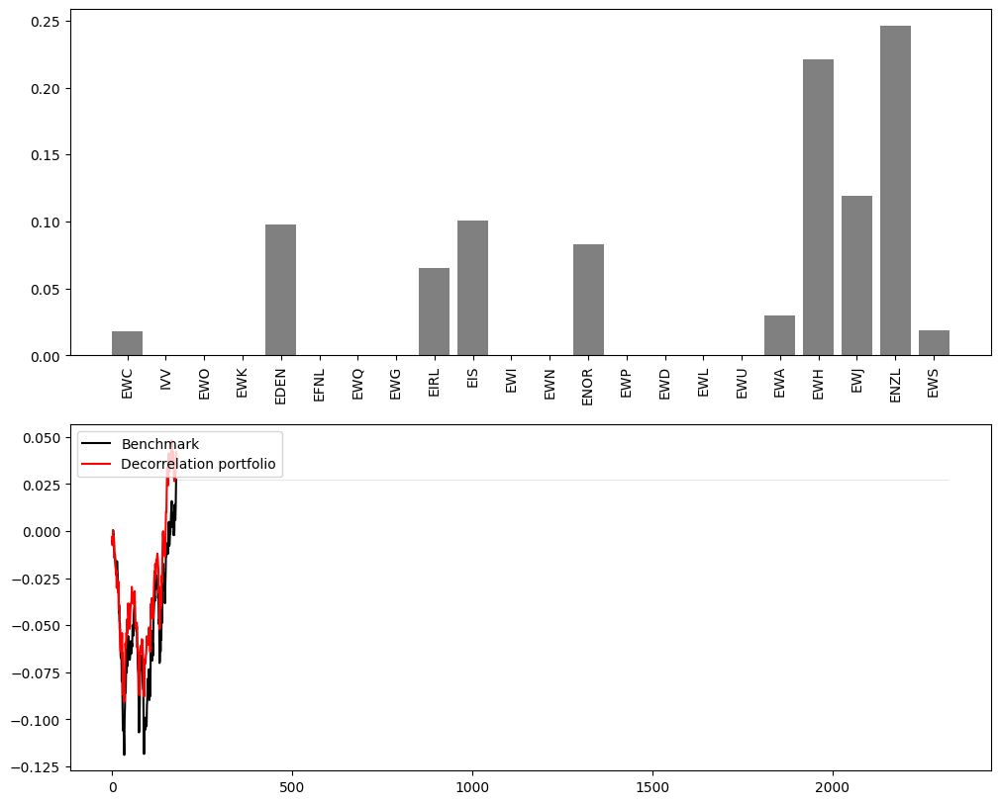

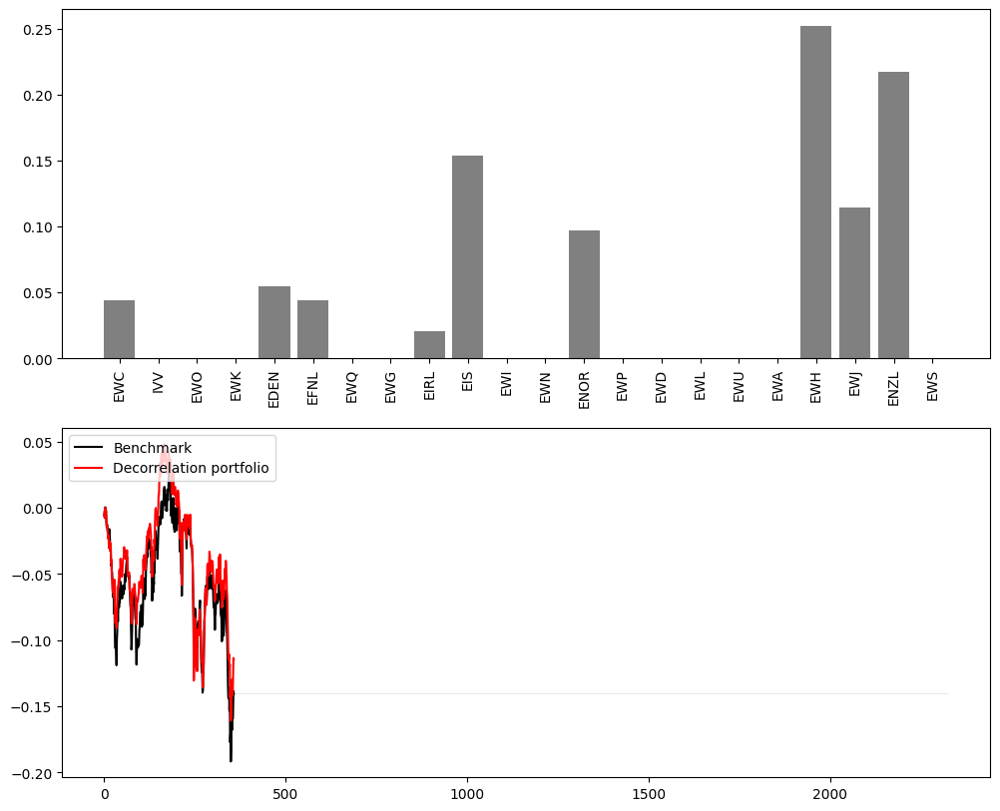

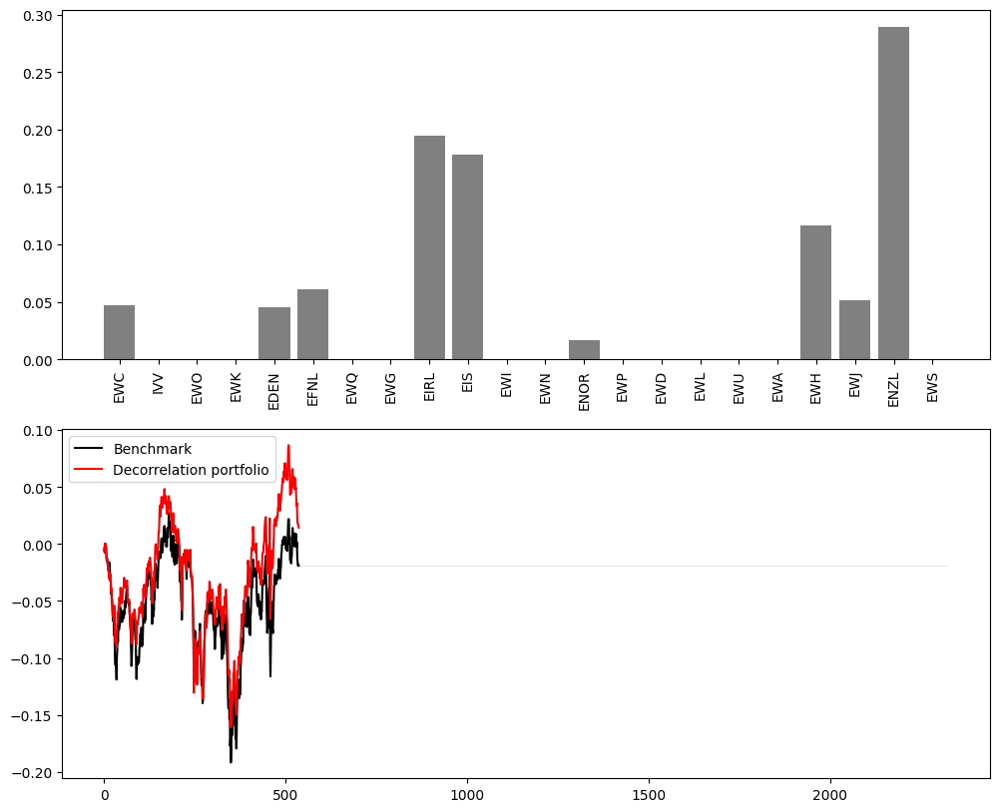

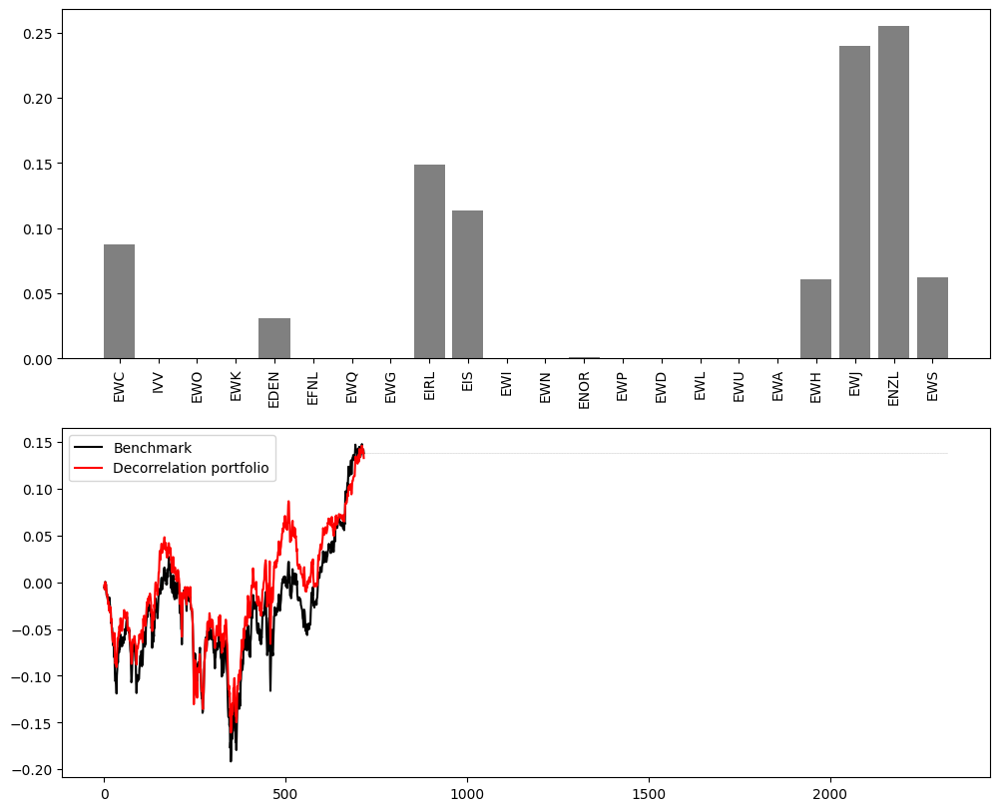

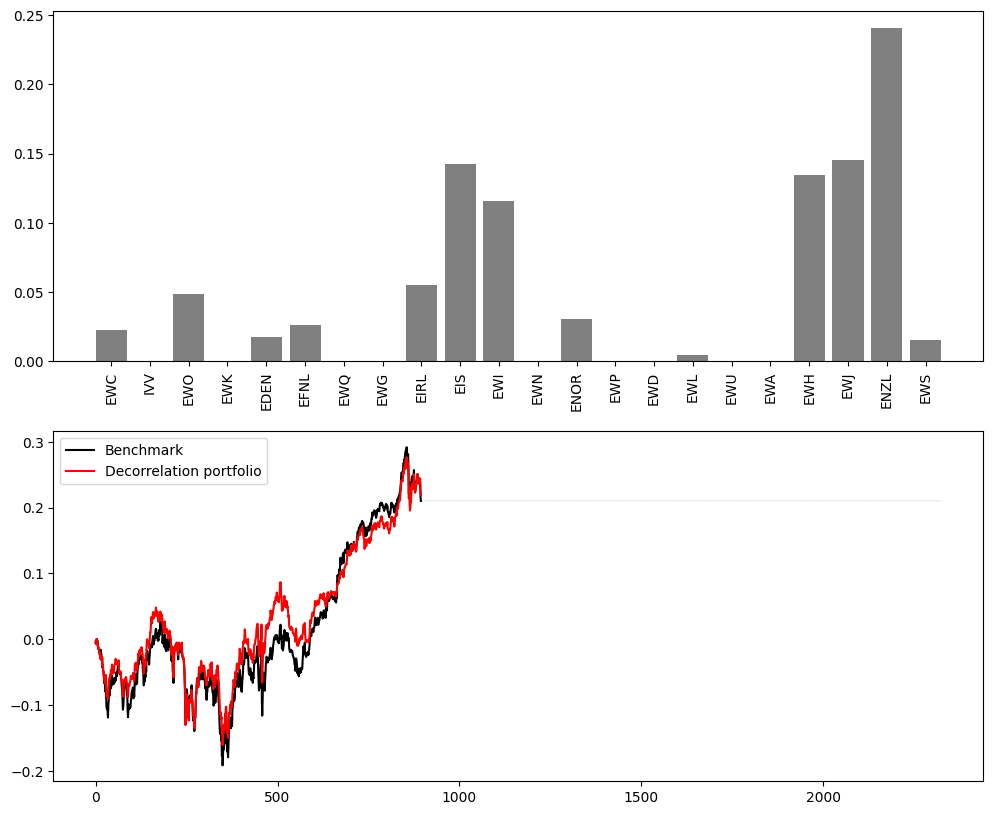

...

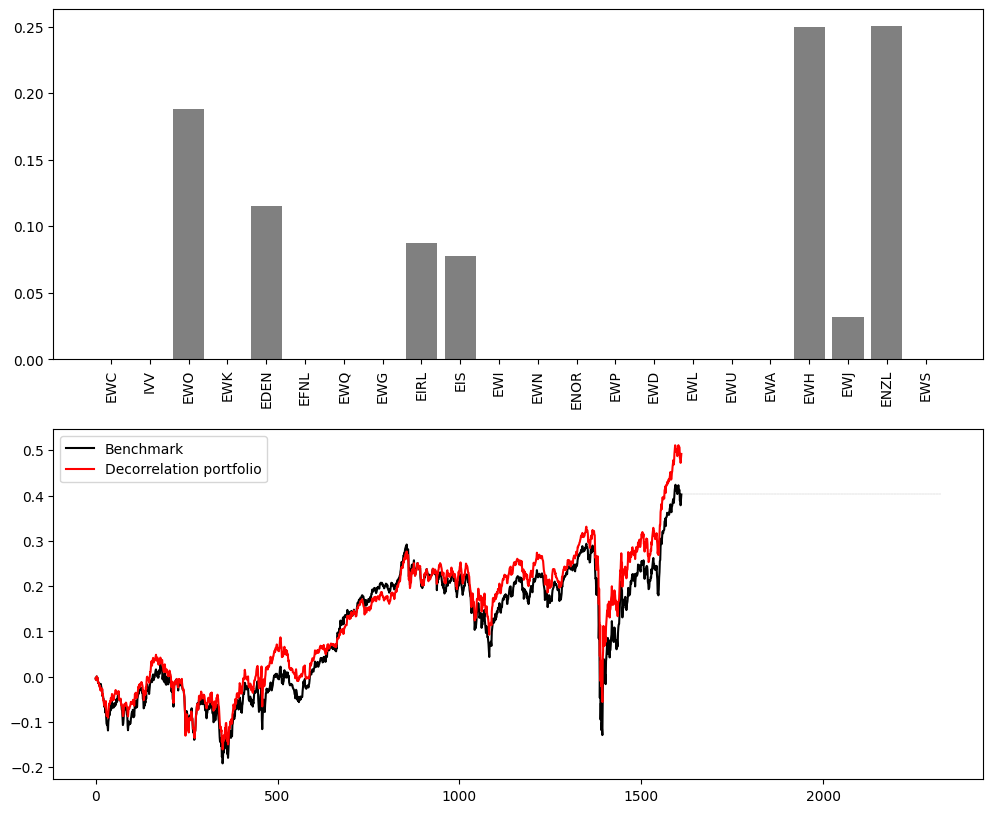

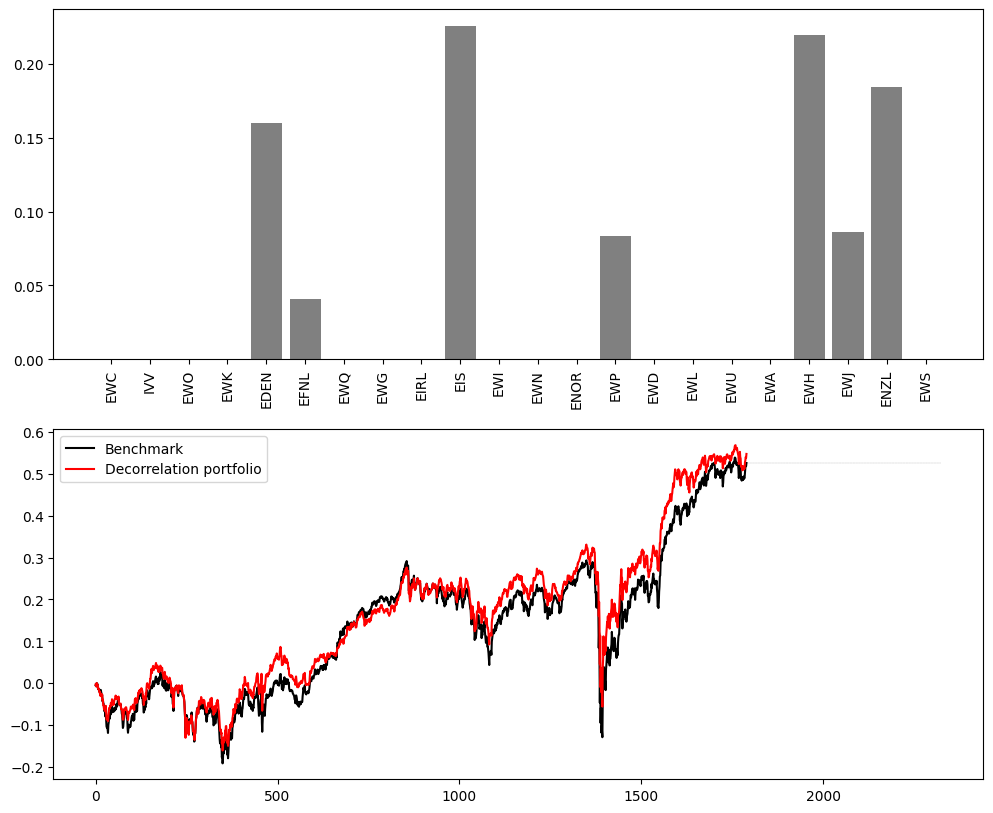

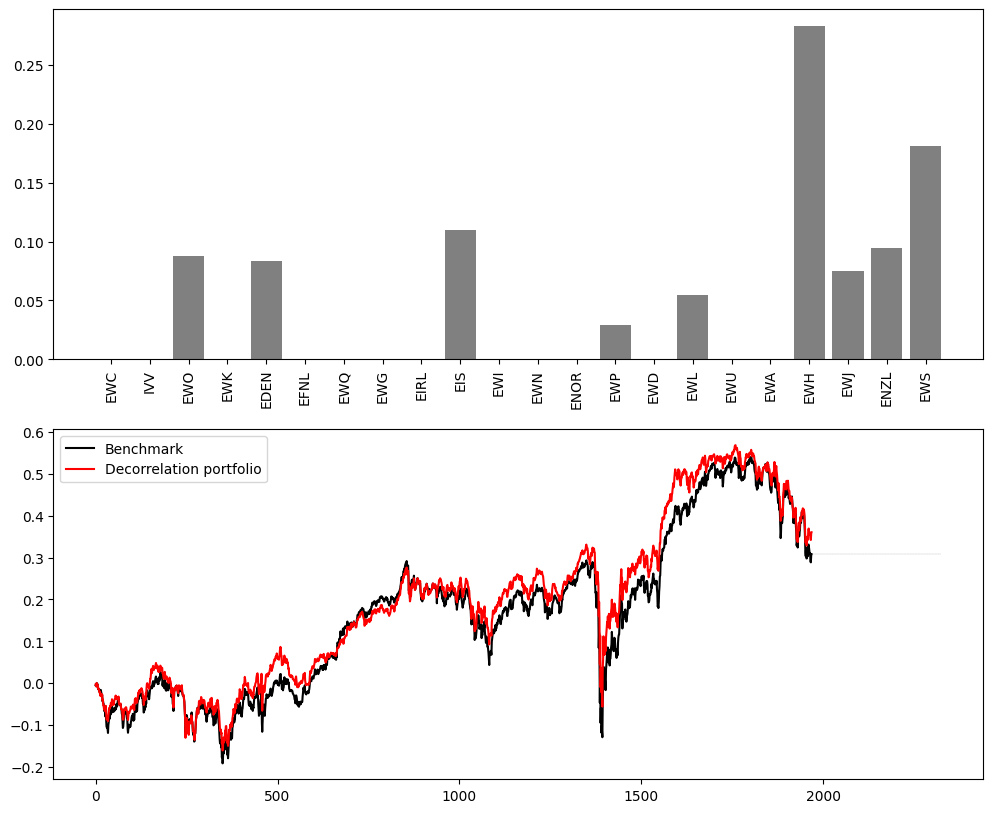

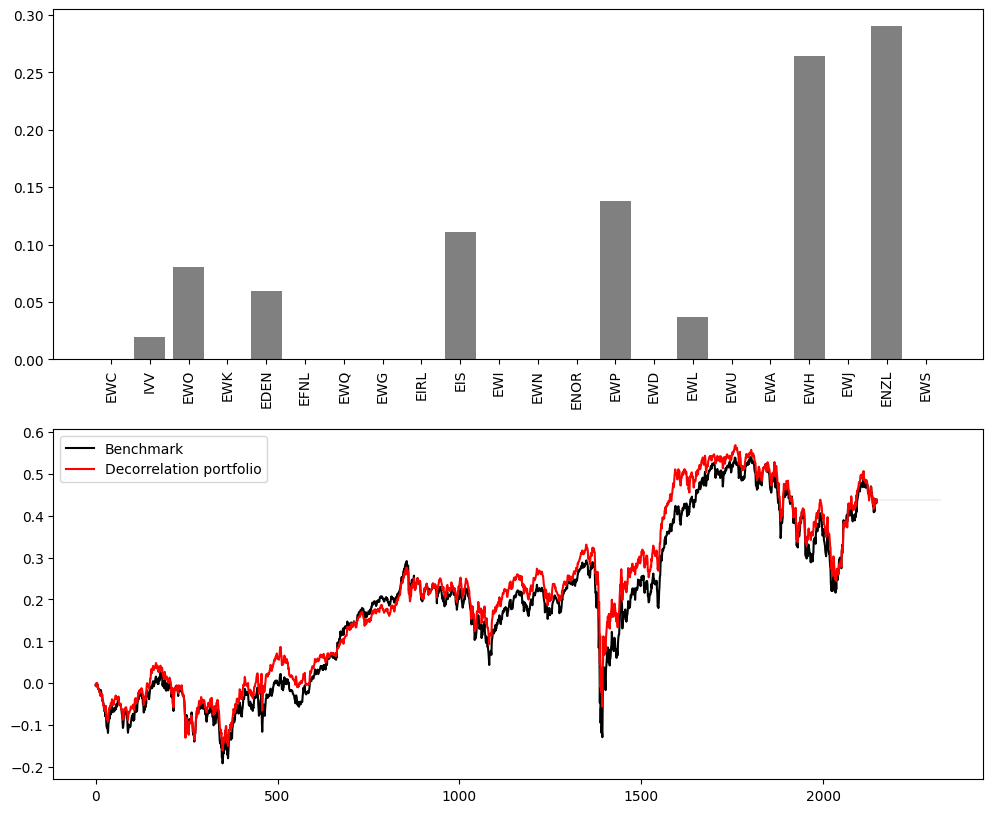

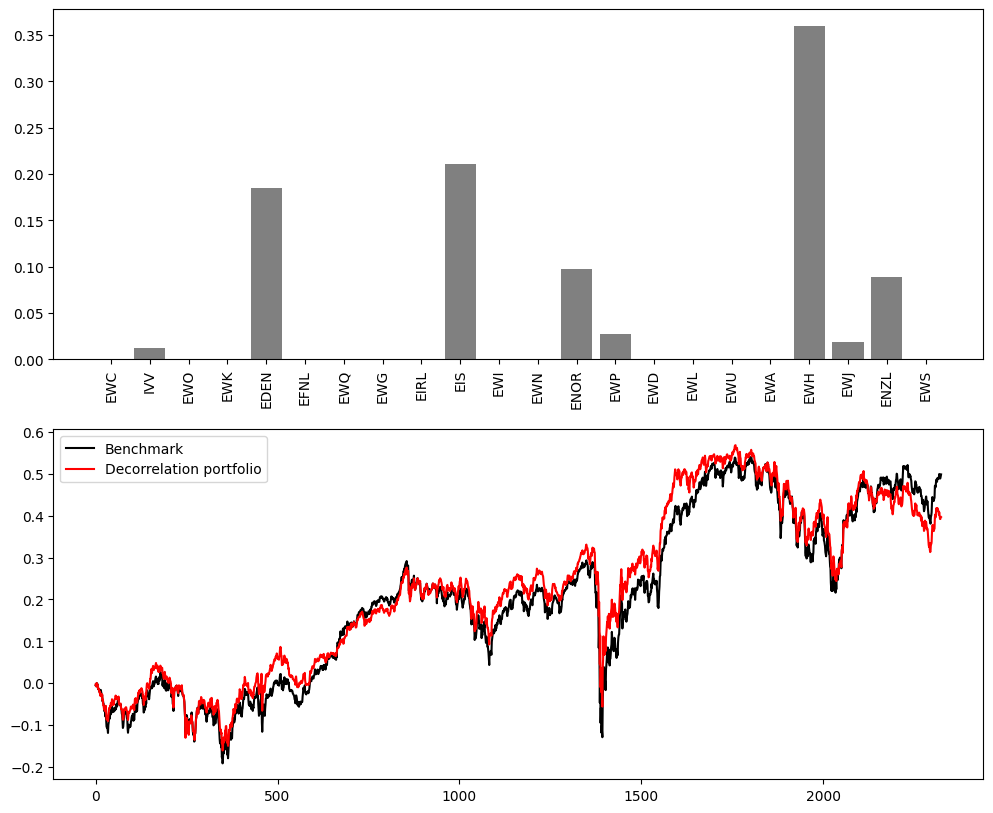

In [ ]:
plot_results(result_equal,
             result_maxdecorr,
             actions_maxdecorr,
             N_ASSETS,
             state.columns.tolist(),
             'Decorrelation portfolio', './images_etf/decorr/', 'series')

### Machine Learning Optimizers

####PCA Portfolio

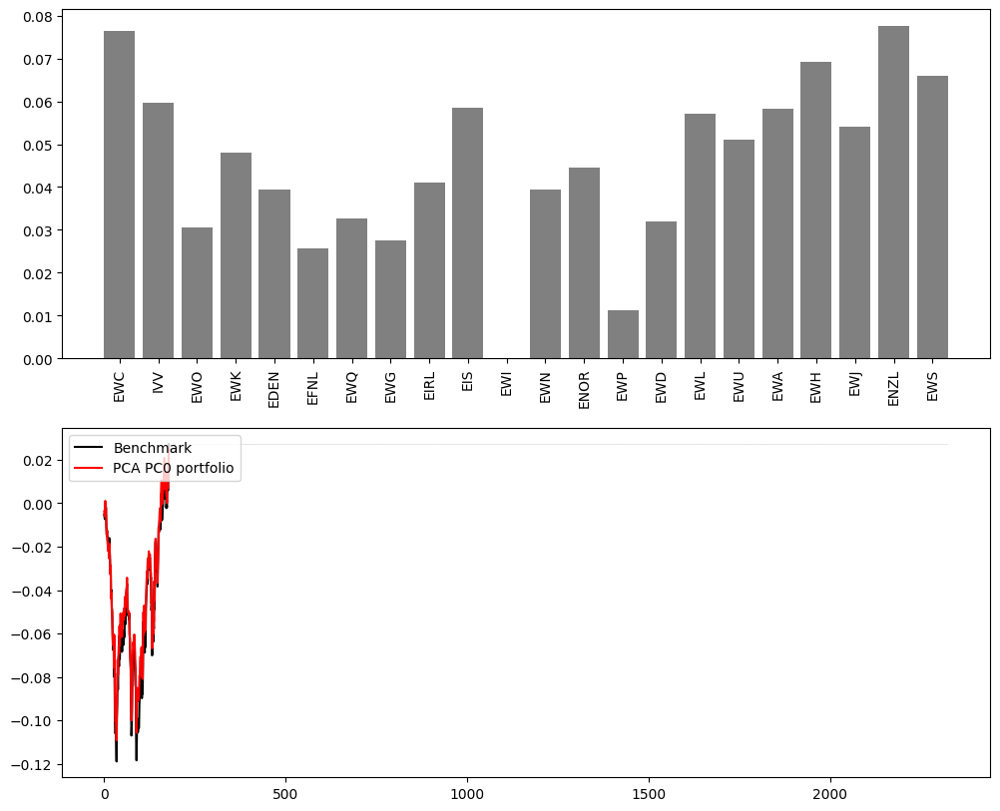

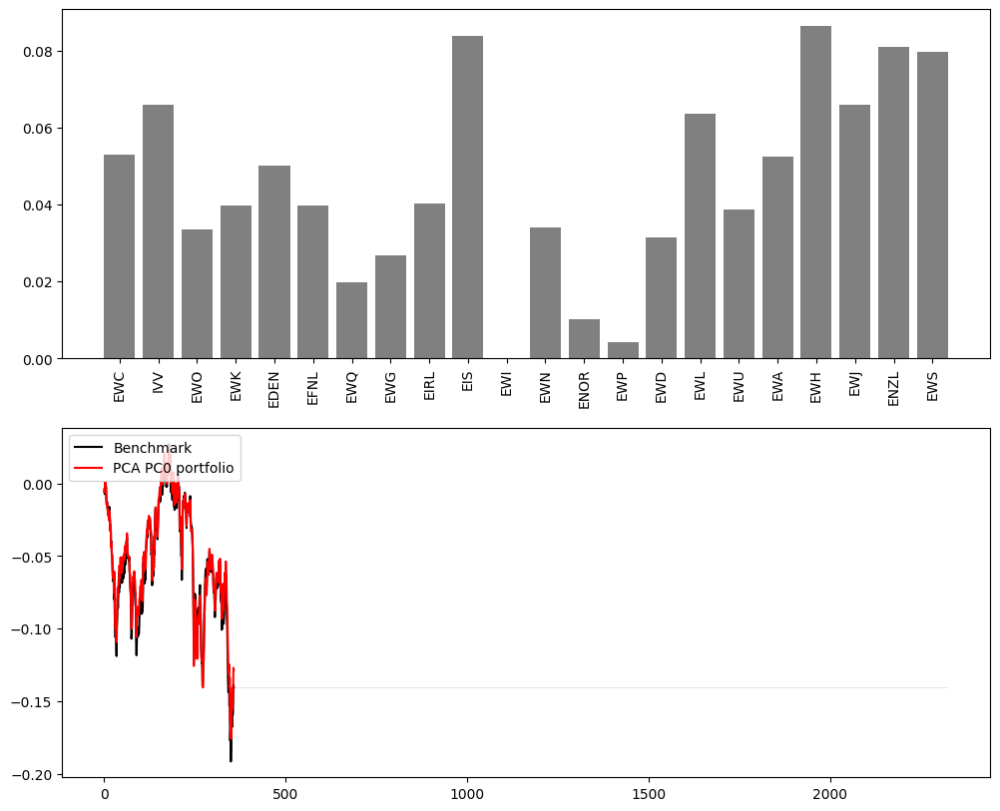

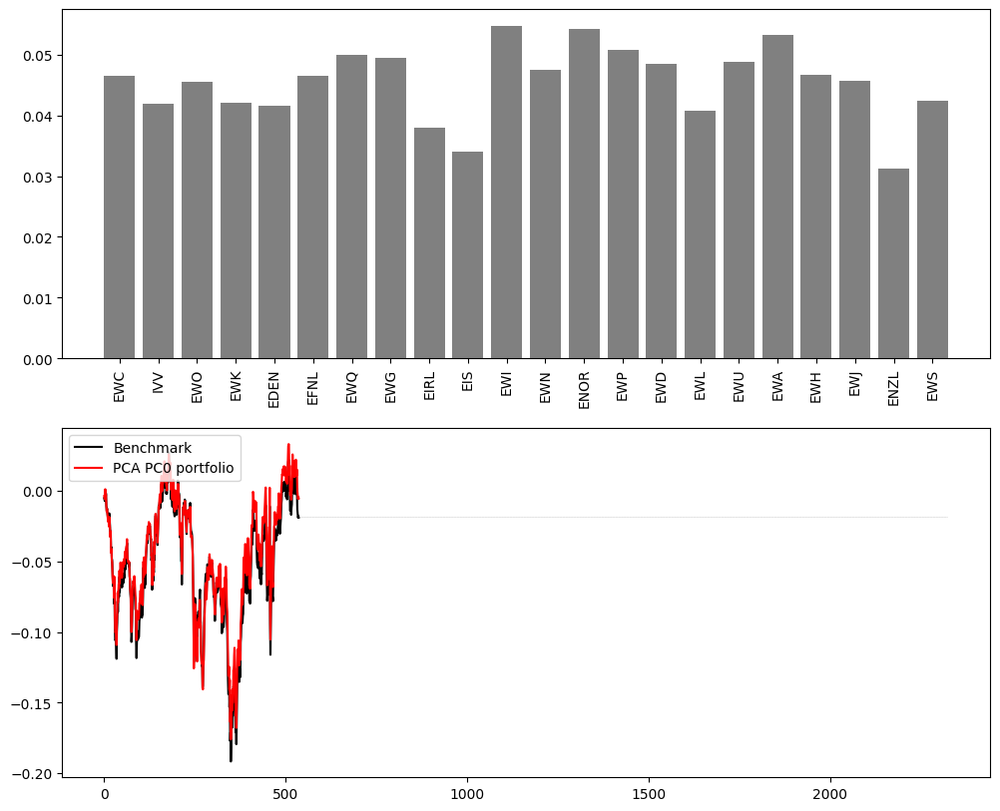

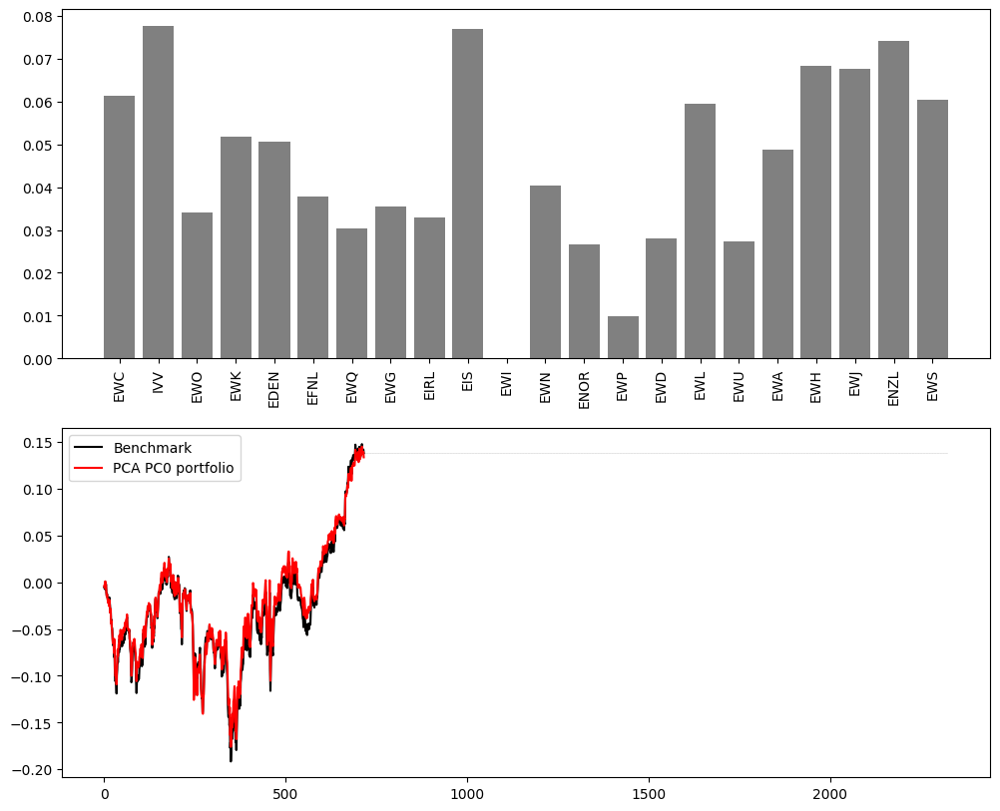

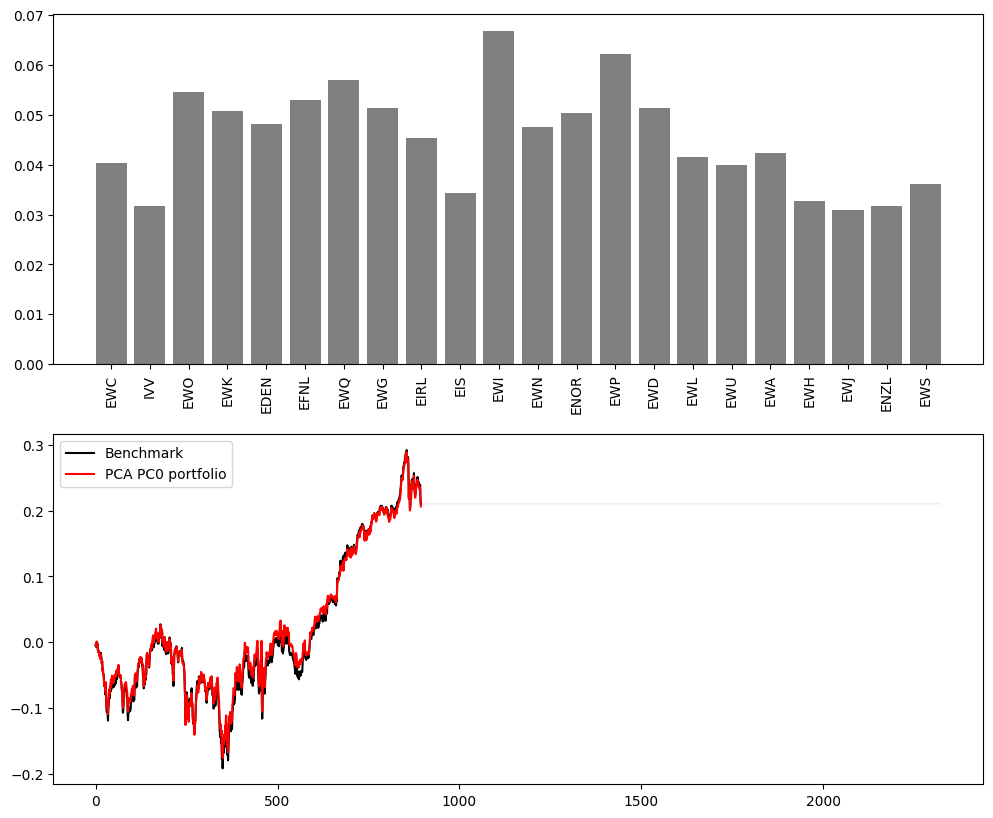

...

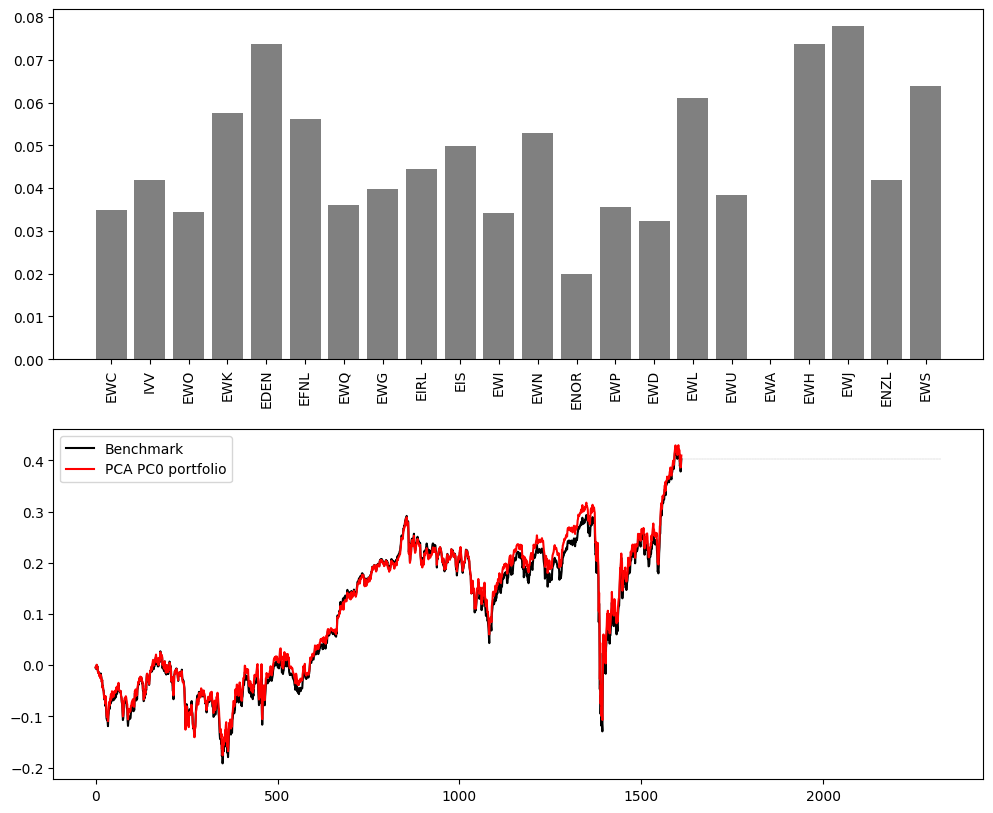

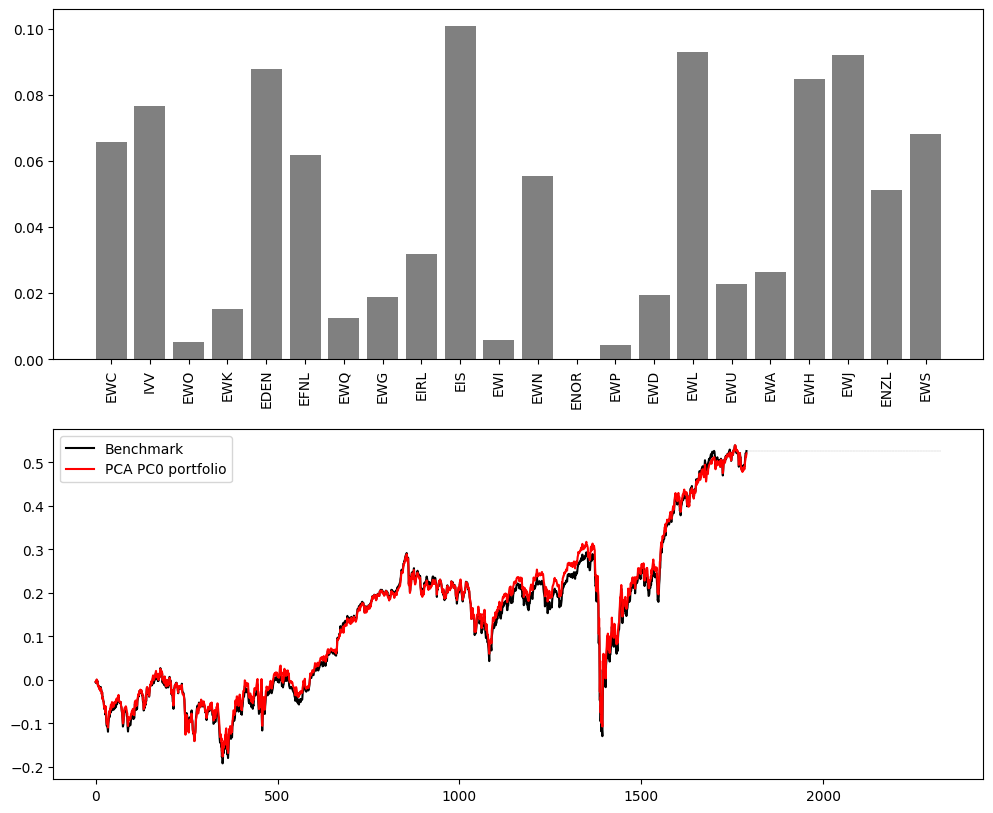

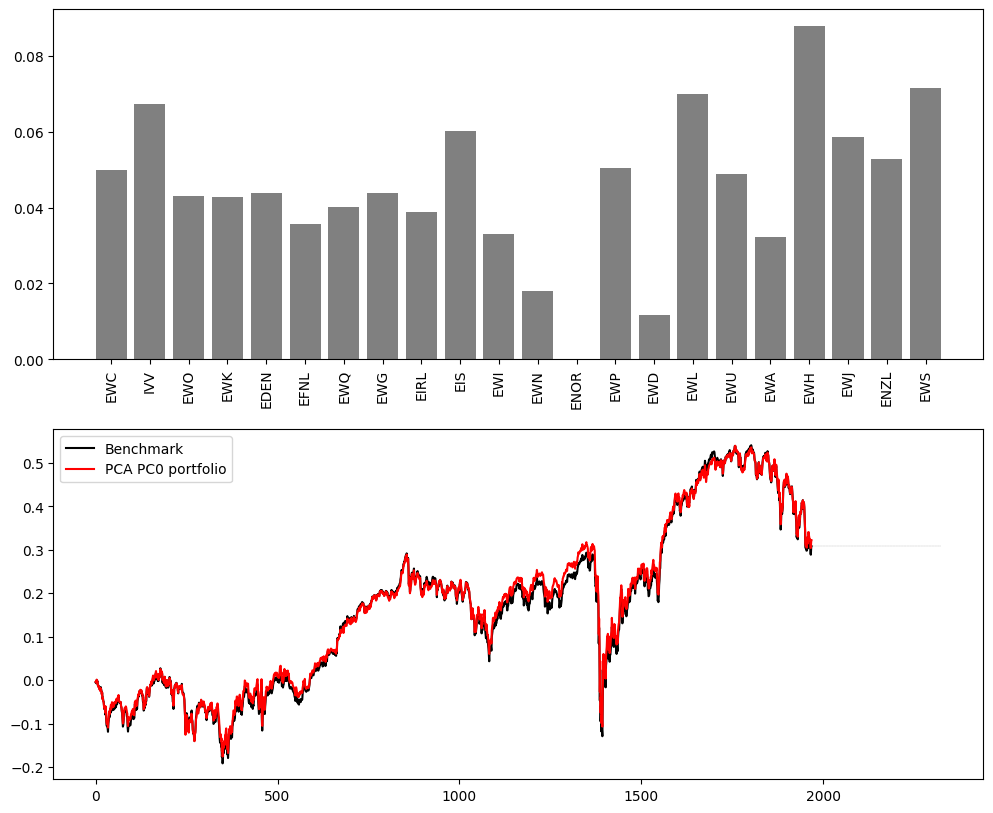

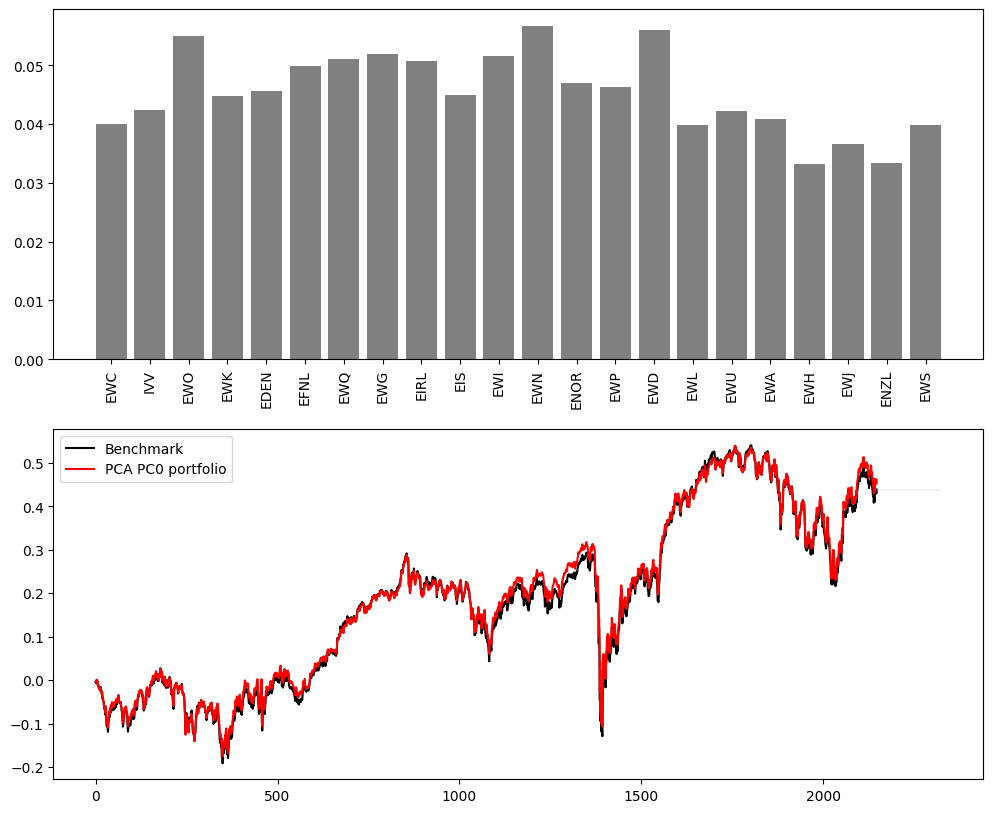

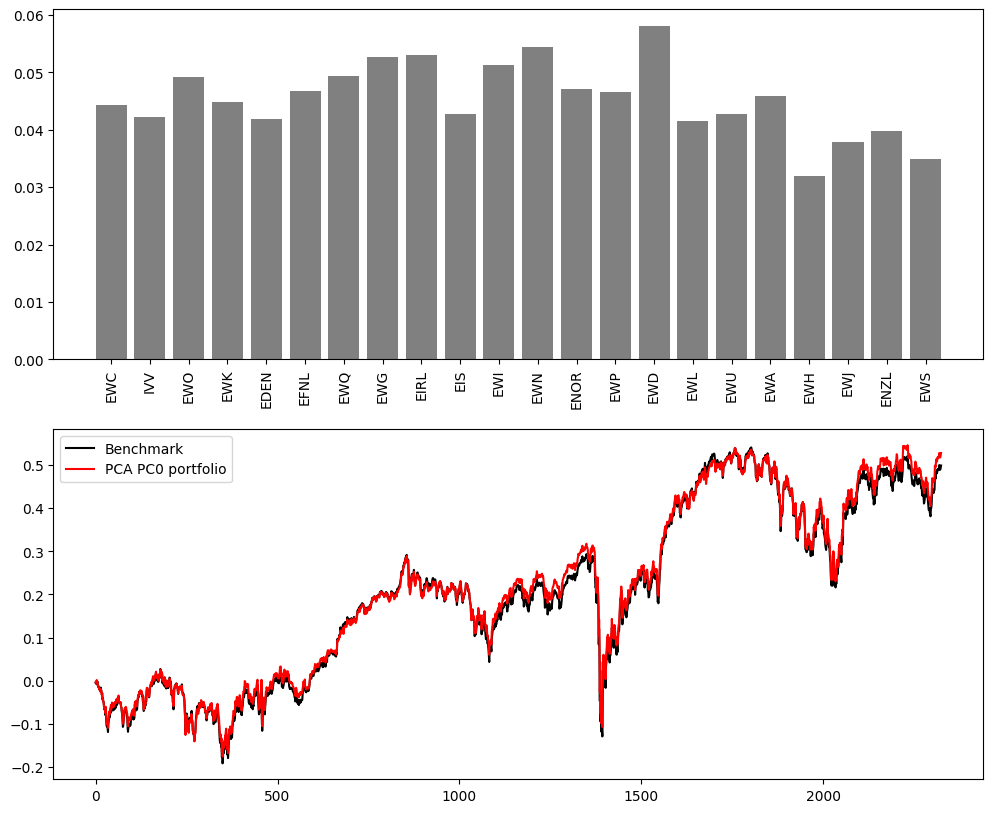

In [64]:
plot_results(result_equal,
             result_pca,
             actions_pca,
             N_ASSETS,
             state.columns,
             'PCA PC0 portfolio', './images_etf/pca/', 'series')

#### HRP Portfolio

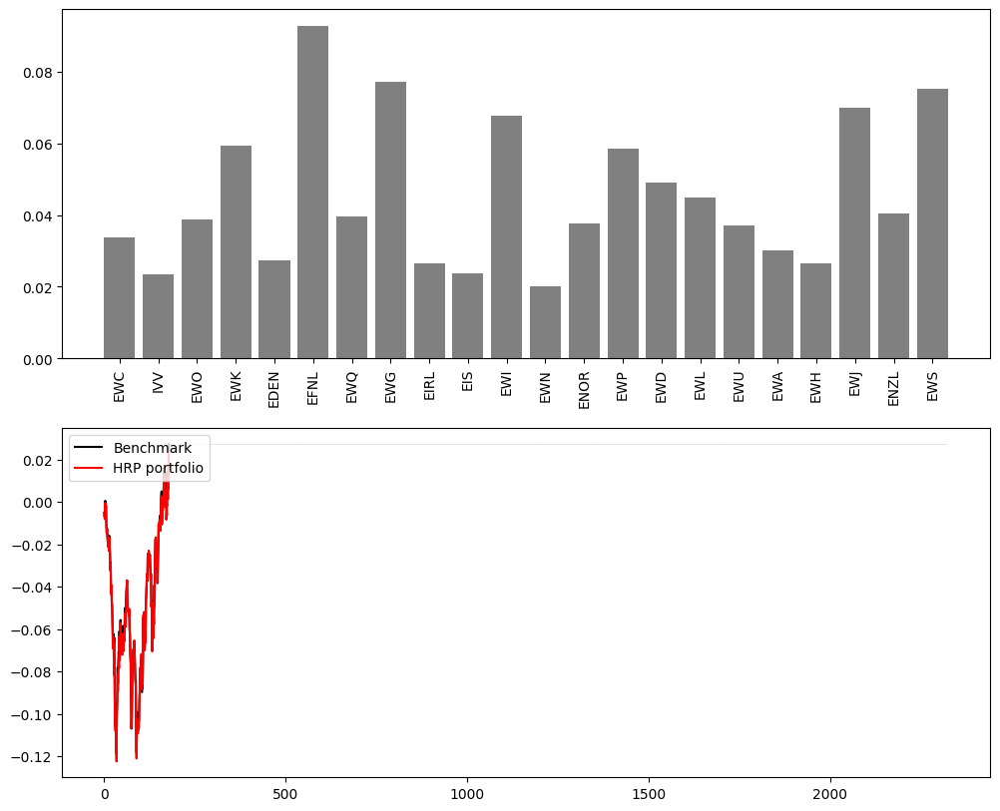

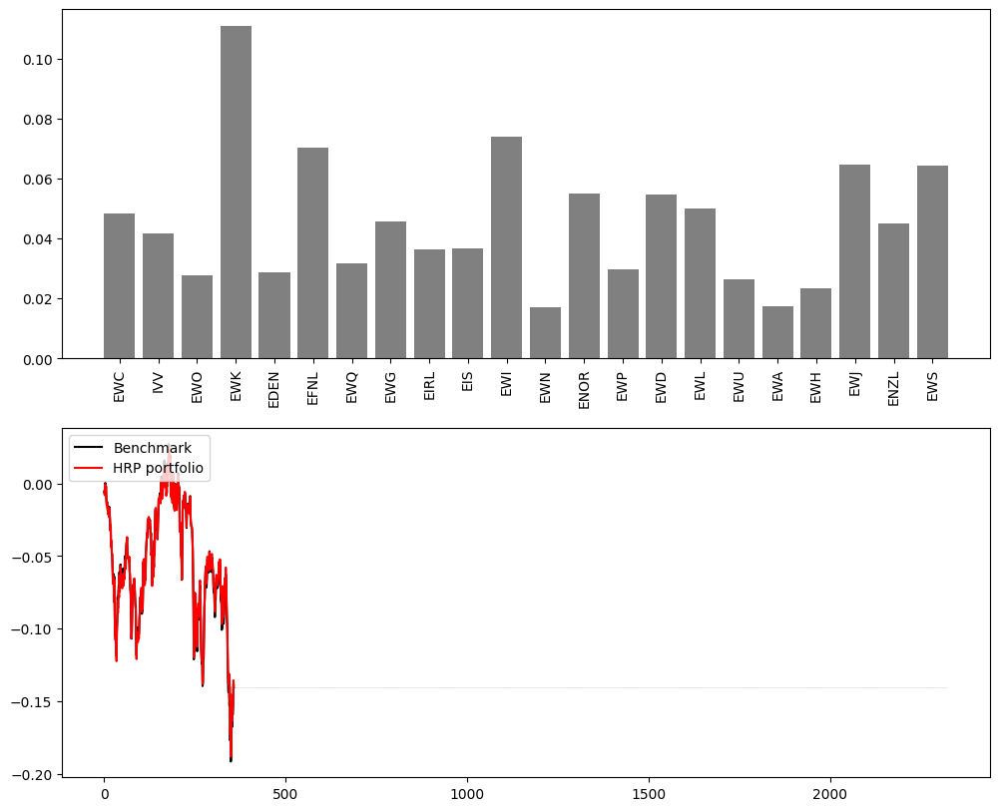

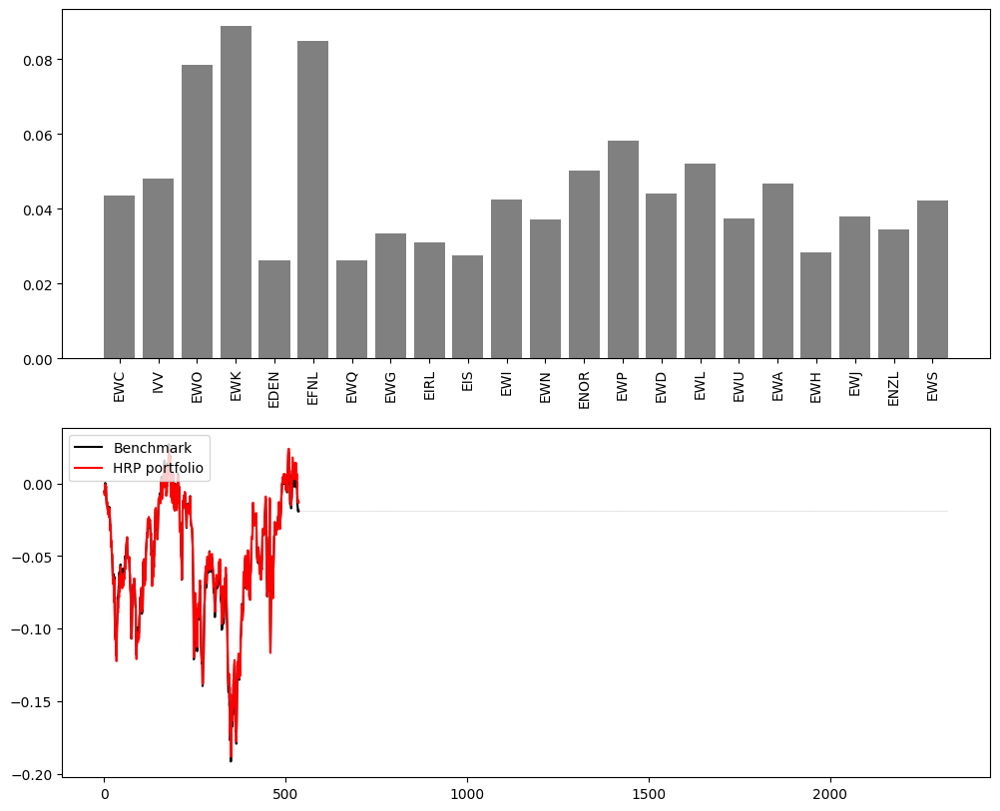

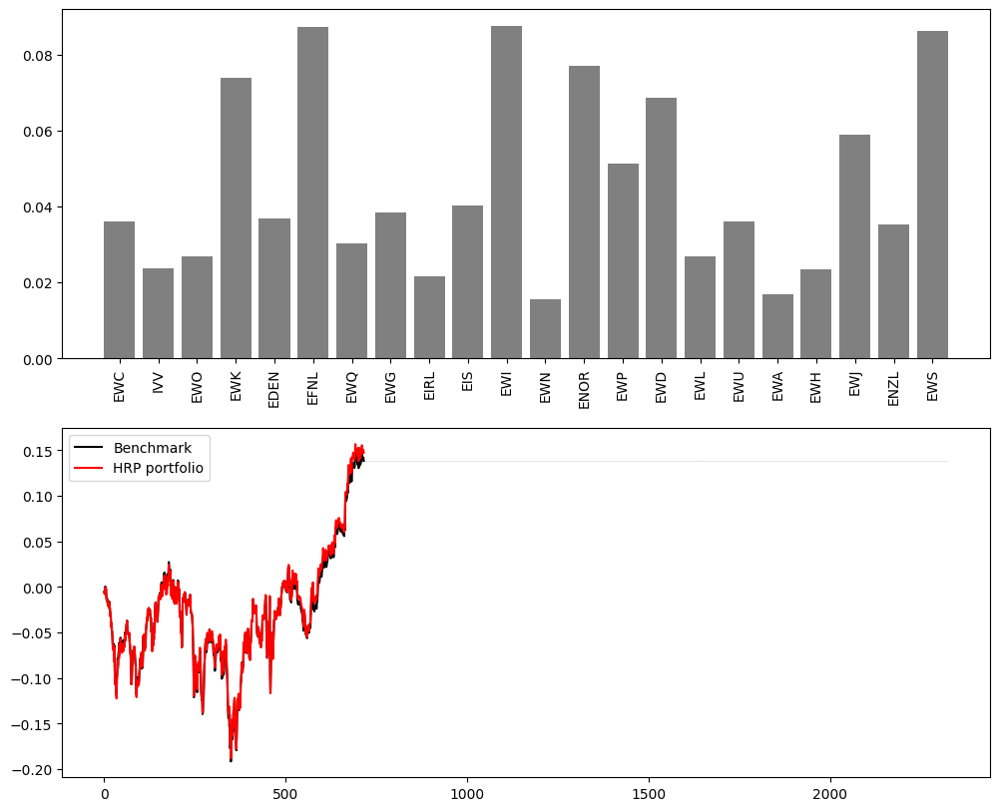

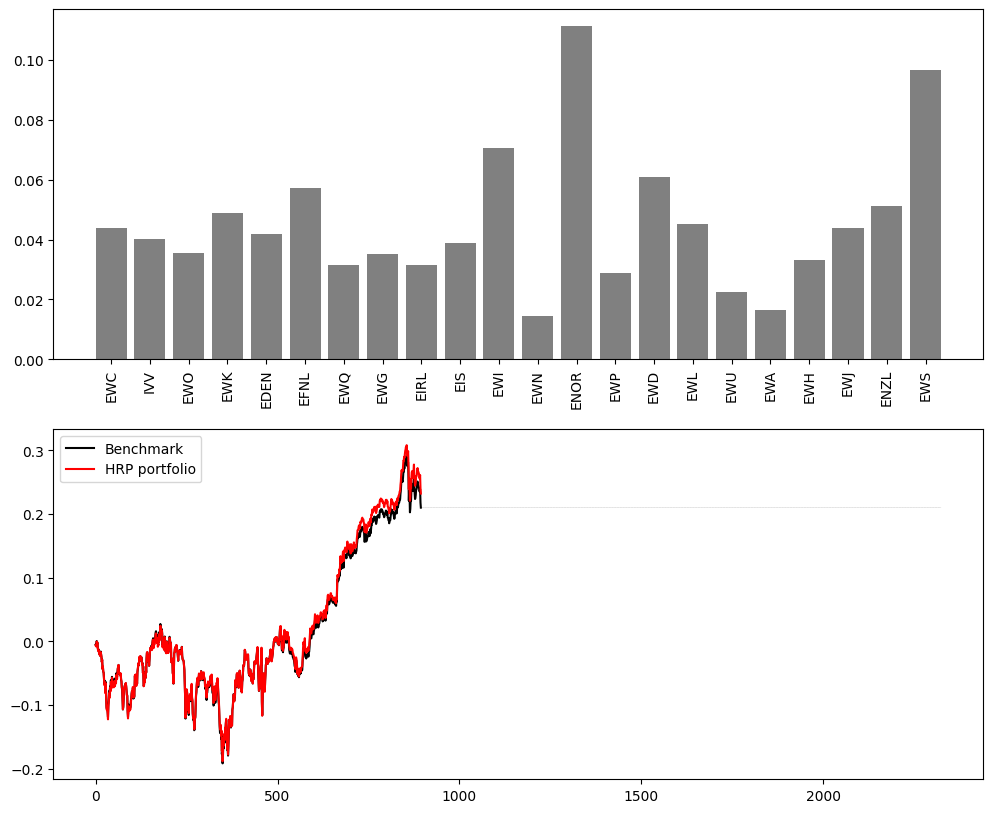

...

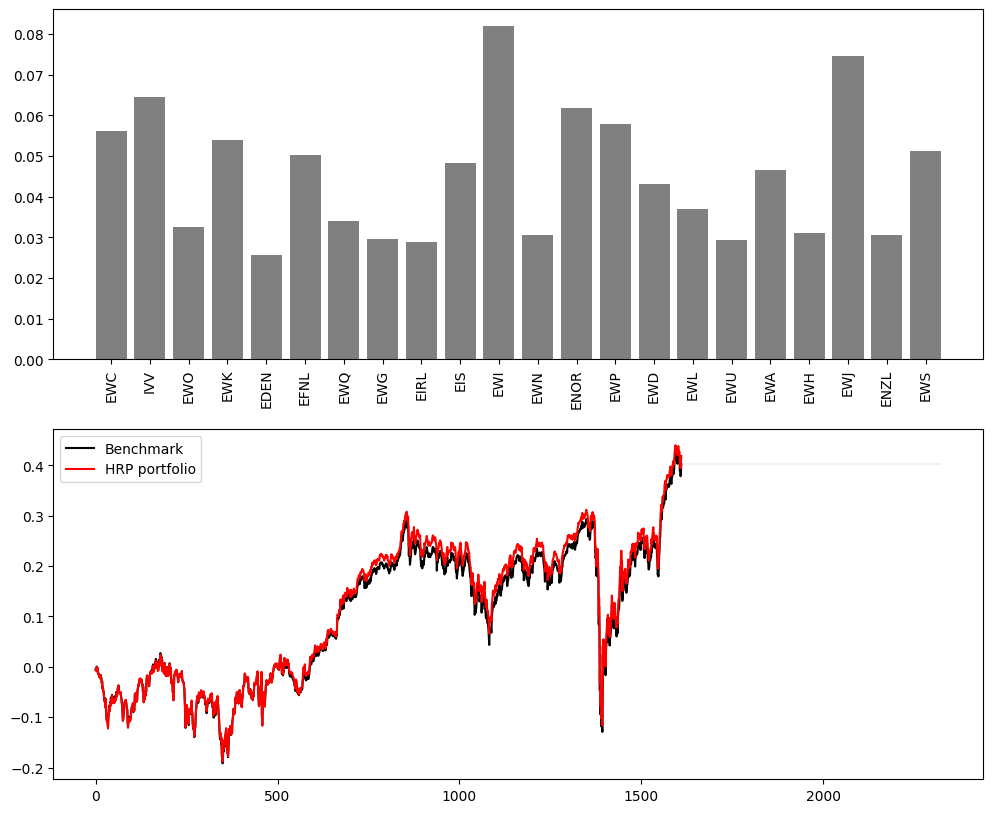

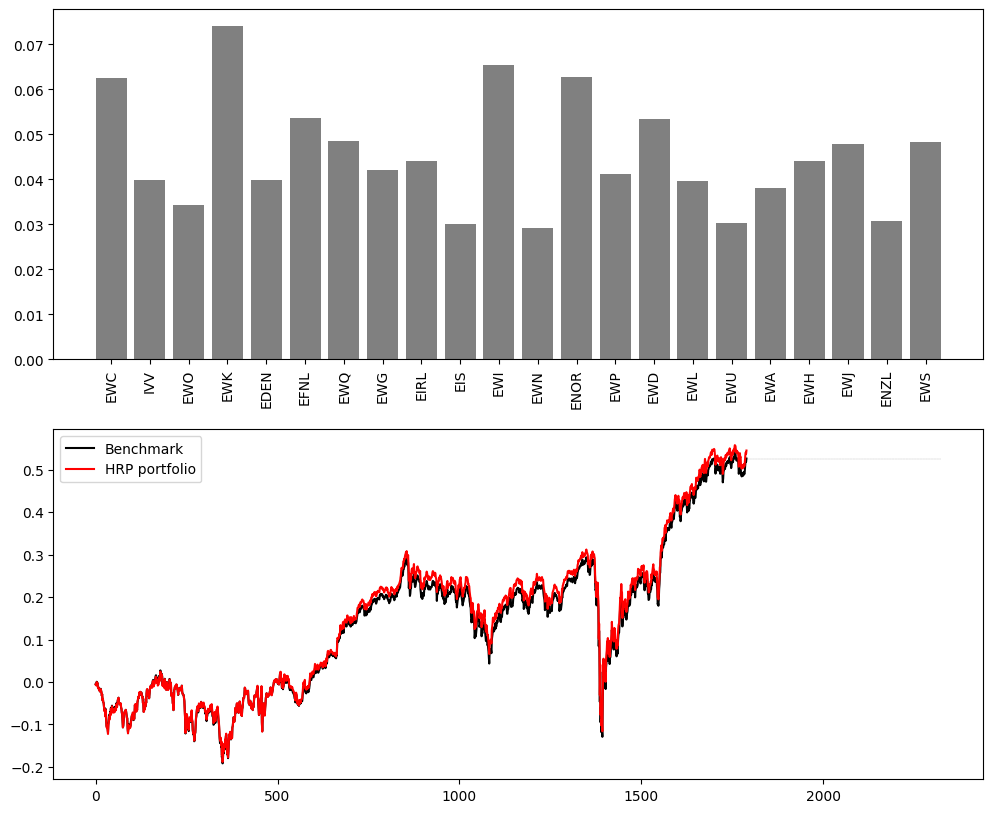

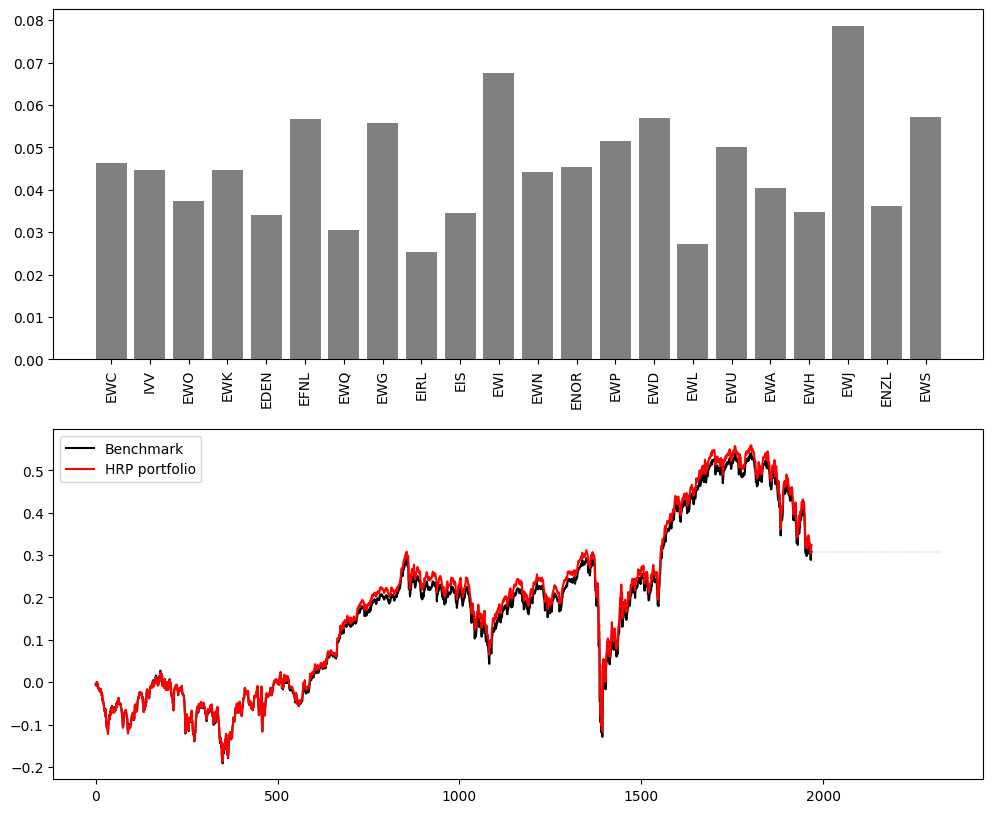

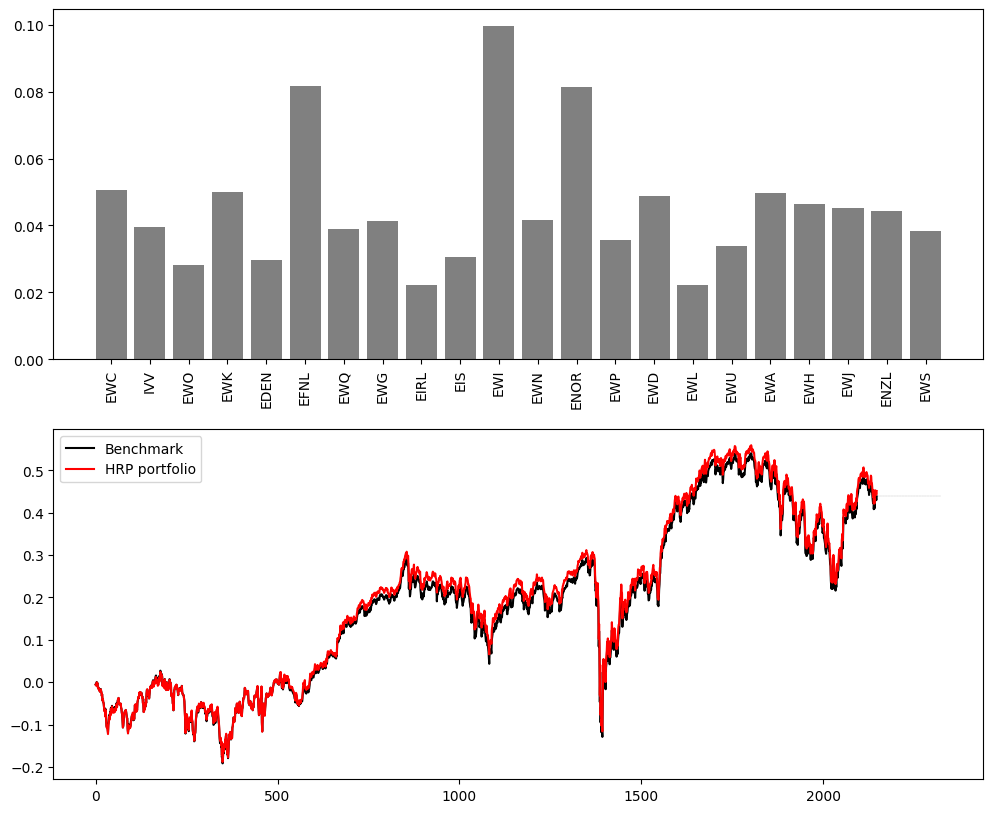

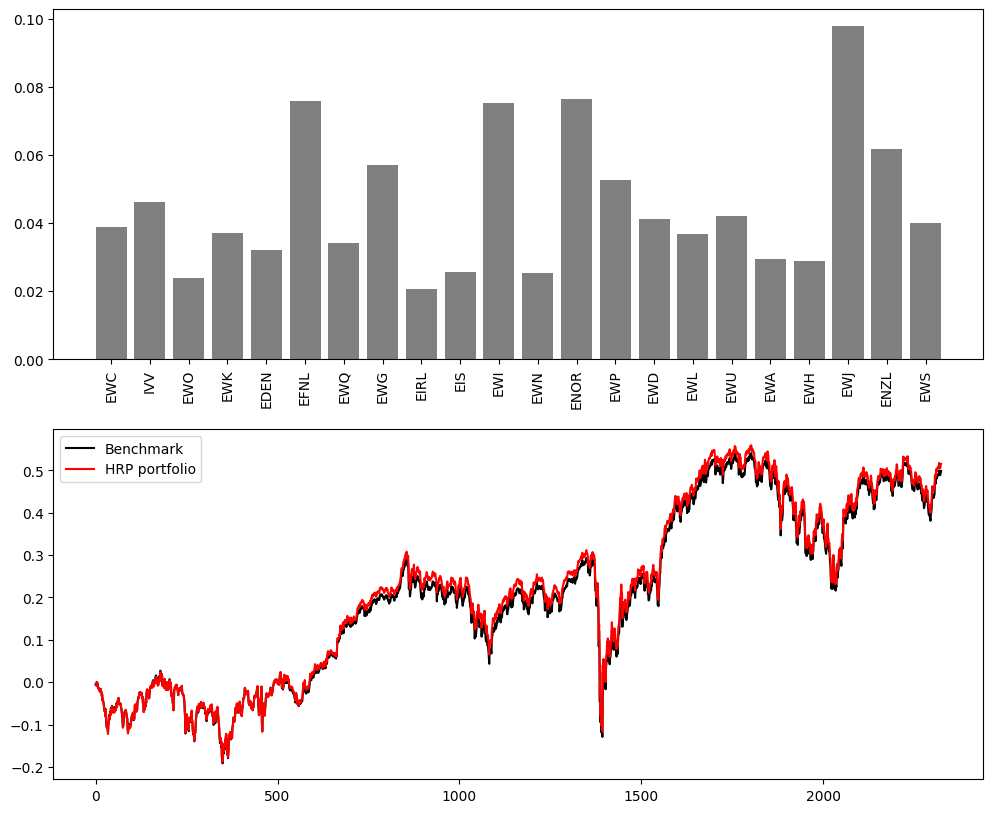

In [65]:
plot_results(result_equal,
             result_hrp,
             actions_hrp,
             N_ASSETS,
             state.columns,
             'HRP portfolio', './images_etf/hrp/', 'series')

####Holt Portfolio

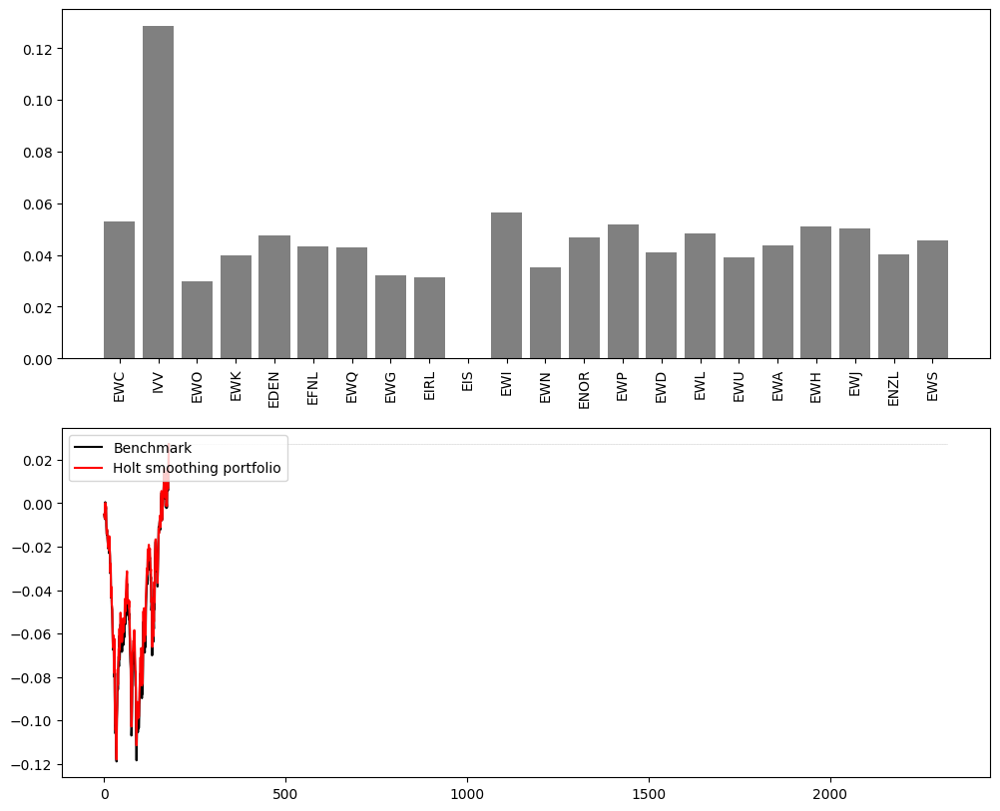

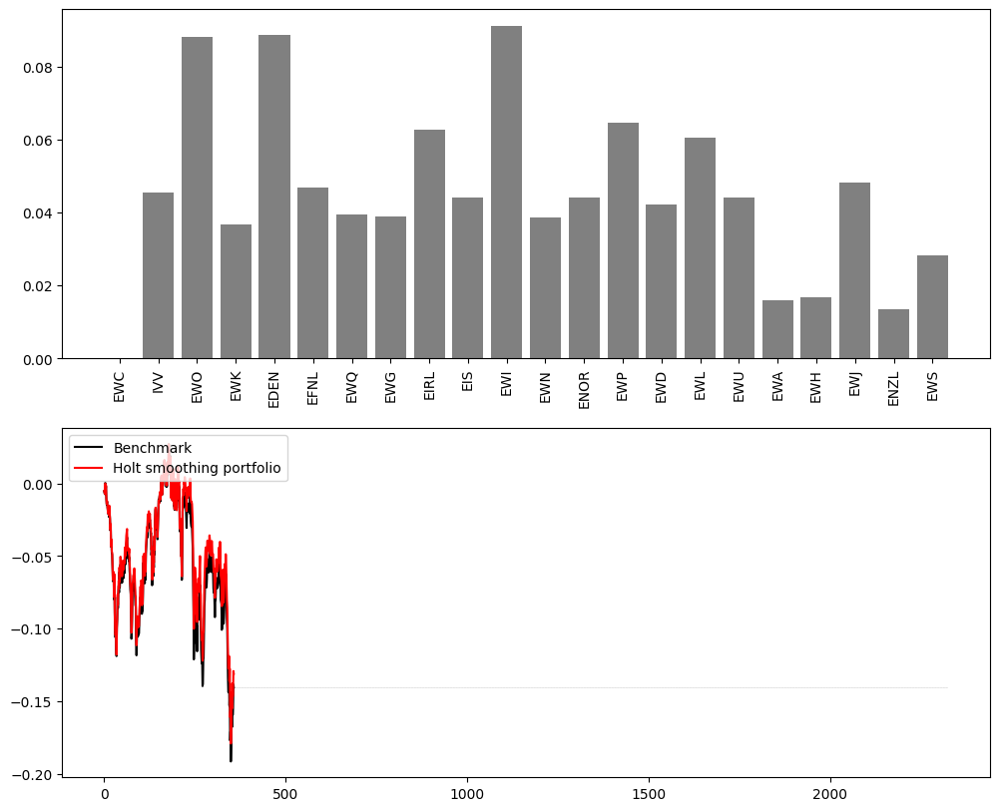

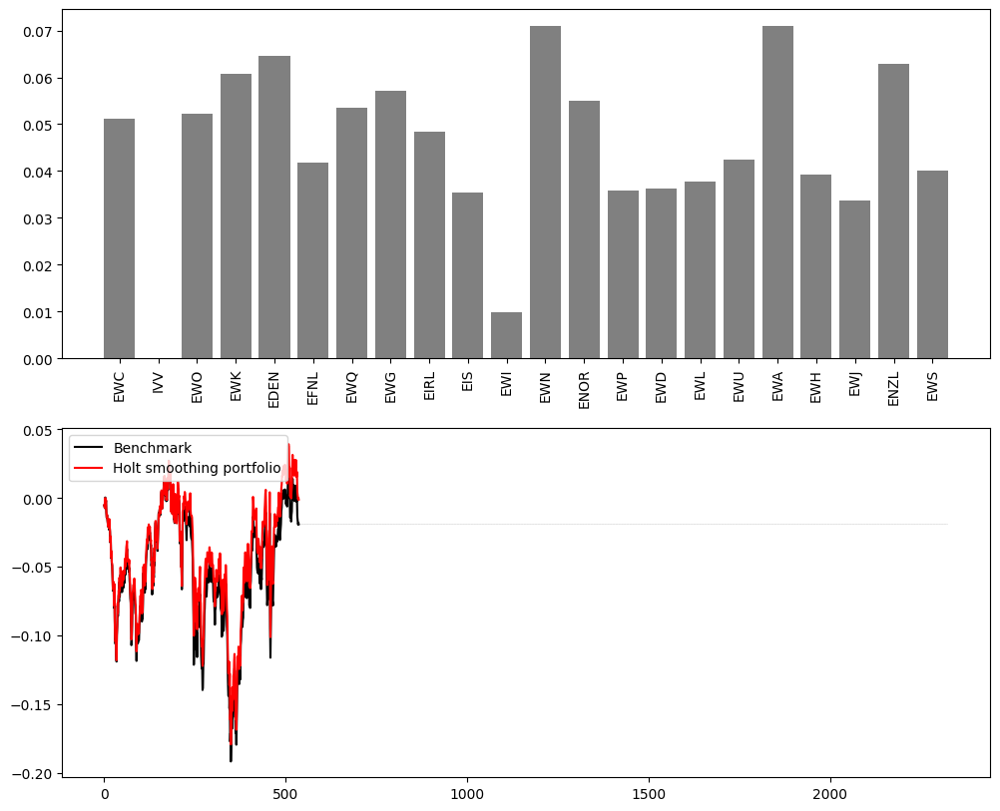

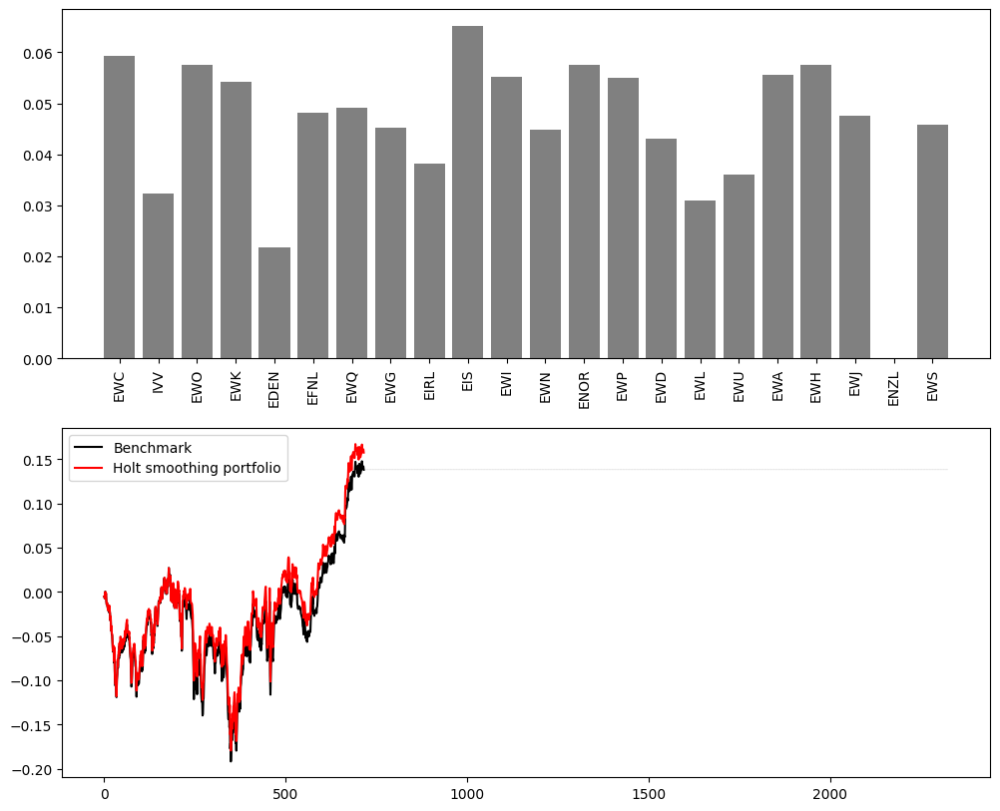

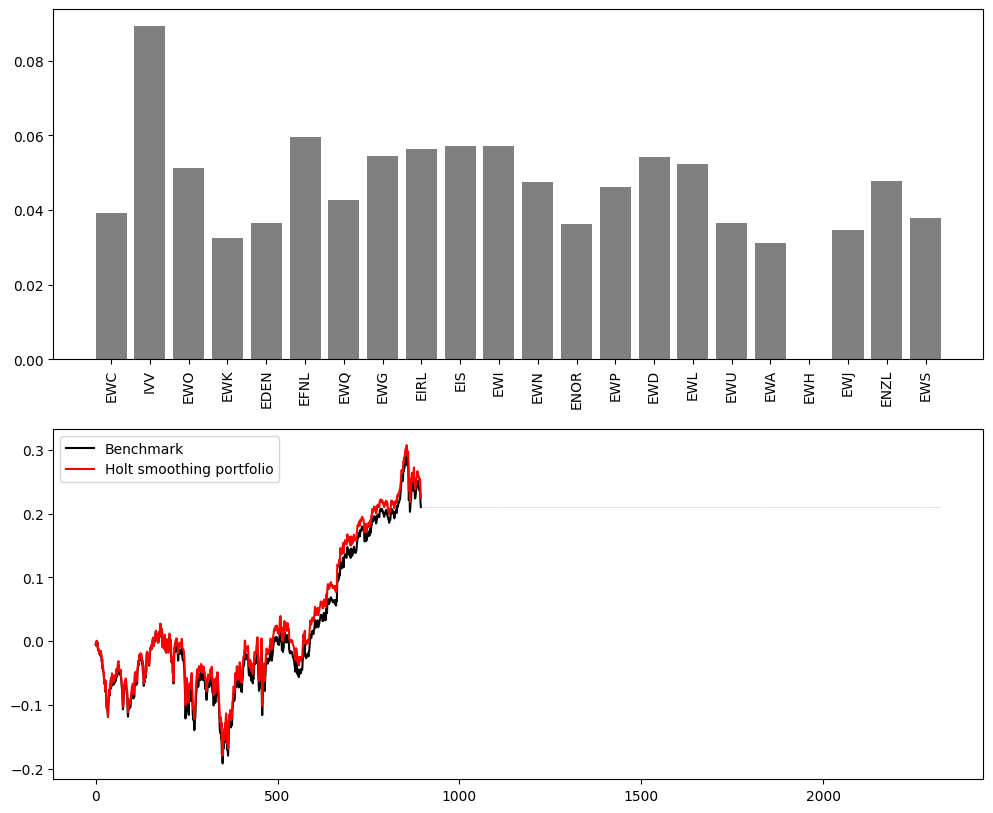

...

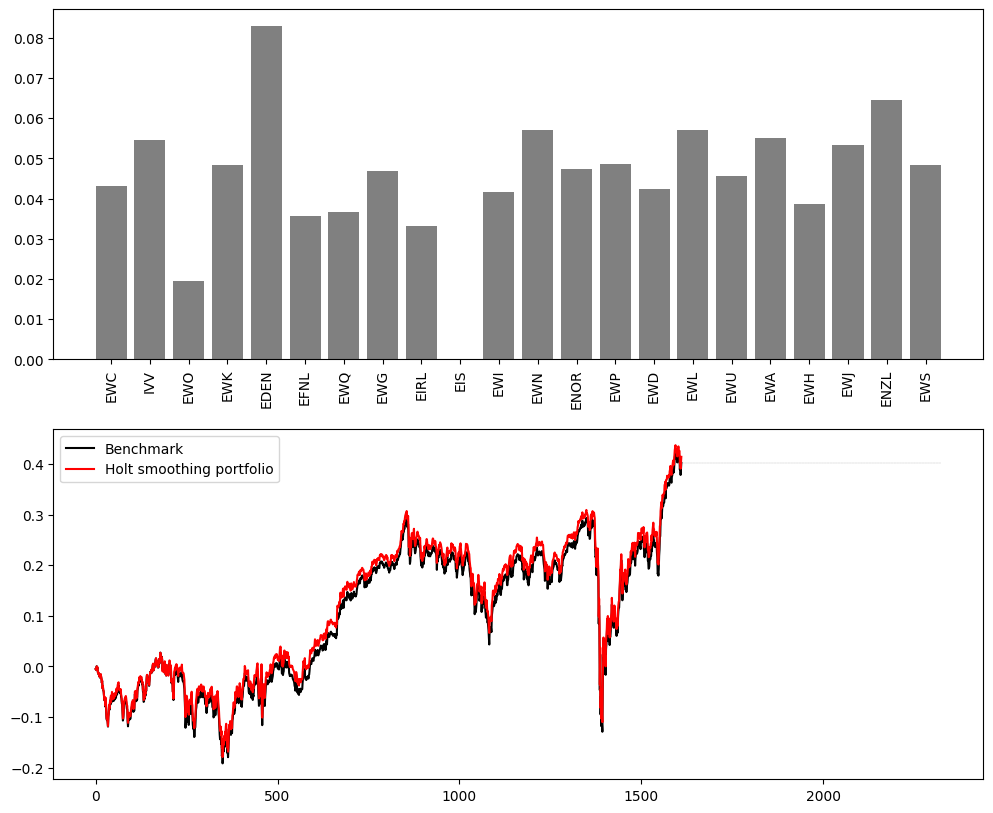

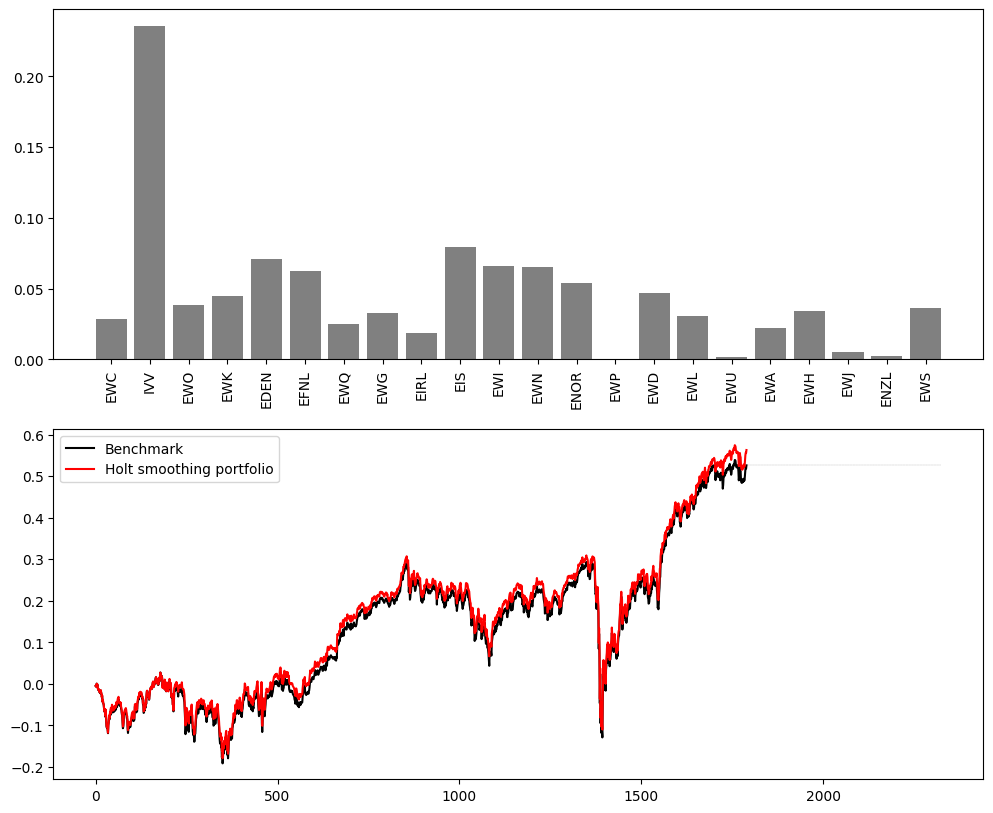

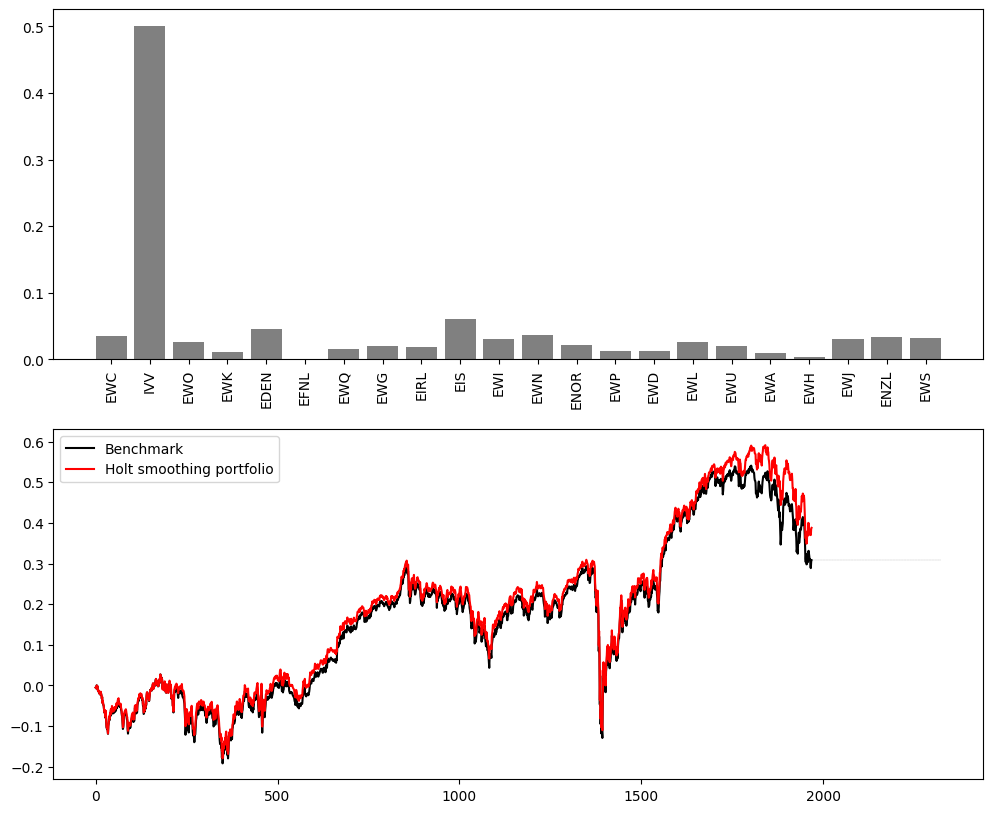

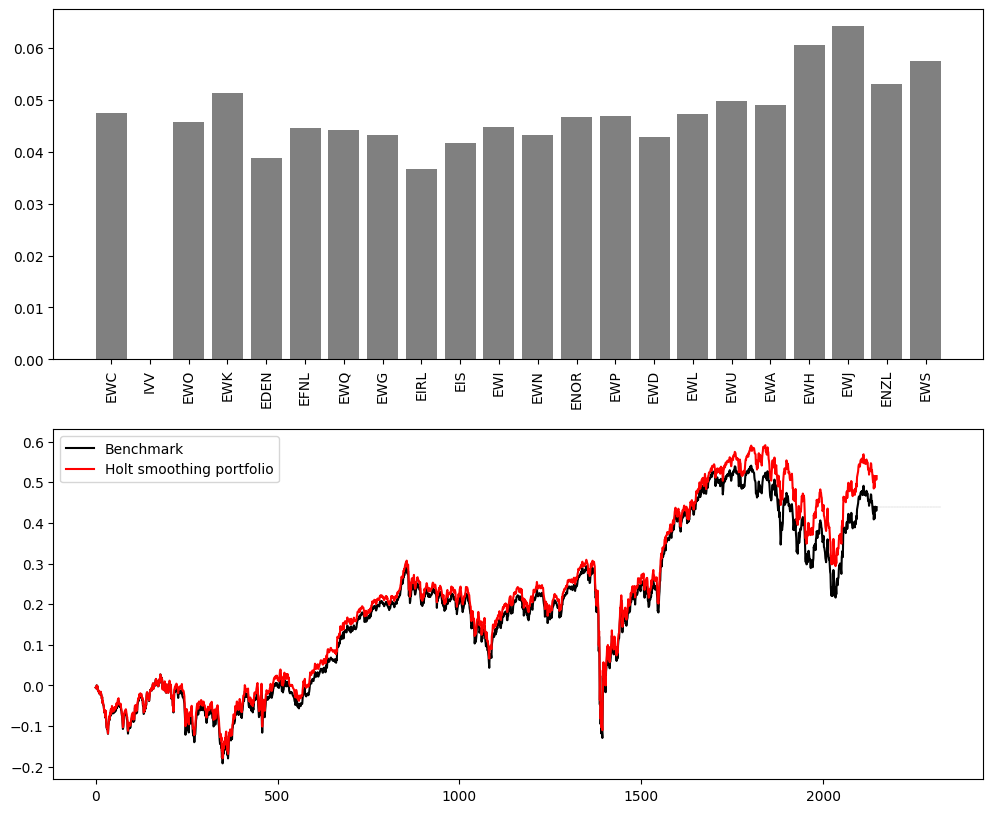

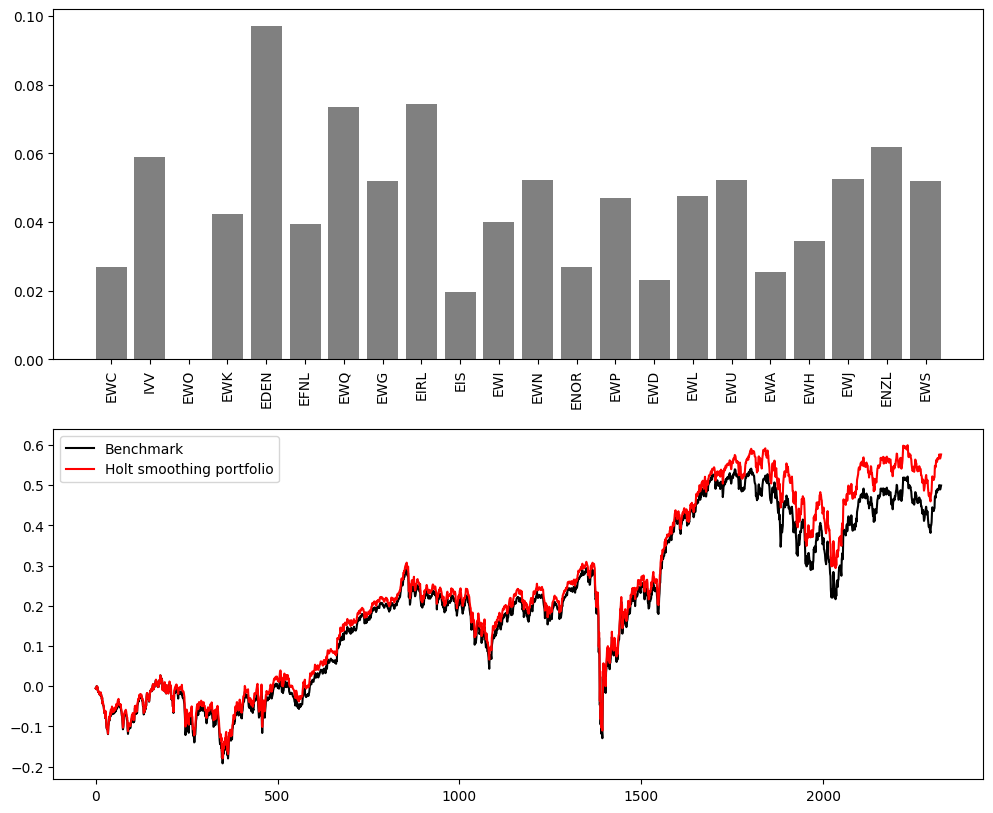

In [66]:
plot_results(result_equal,
             result_smooth,
             actions_smooth,
             N_ASSETS,
             state.columns,
             'Holt smoothing portfolio', './images_etf/smoothing/', 'series')

####Autoencoder Portfolio

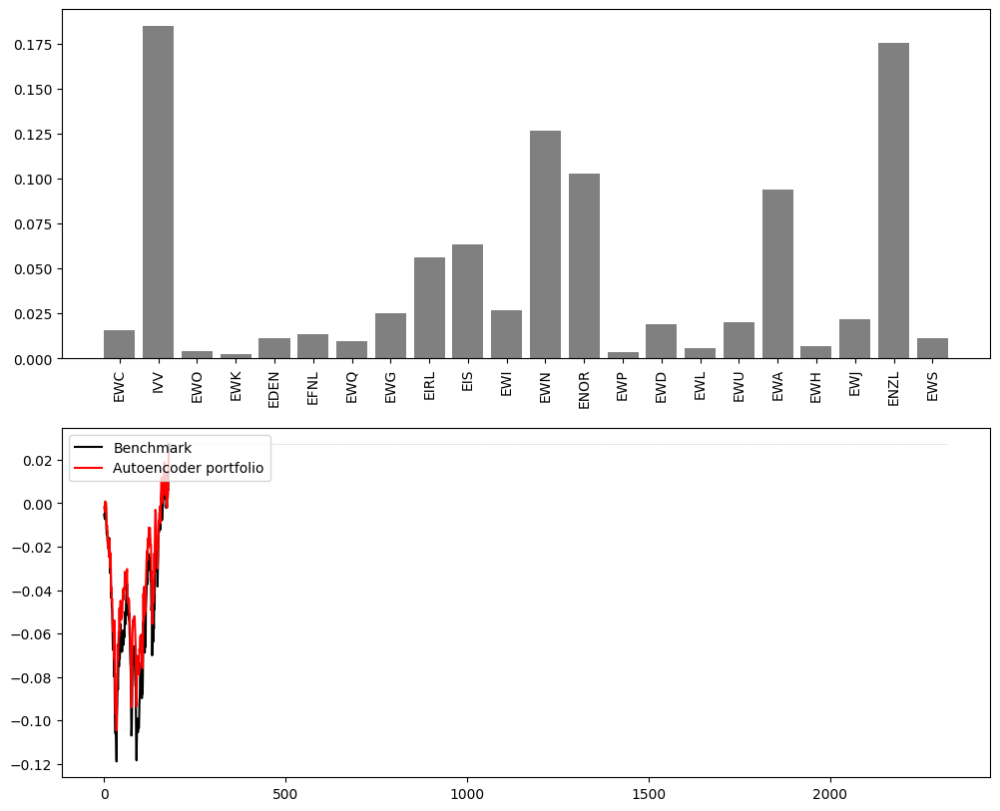

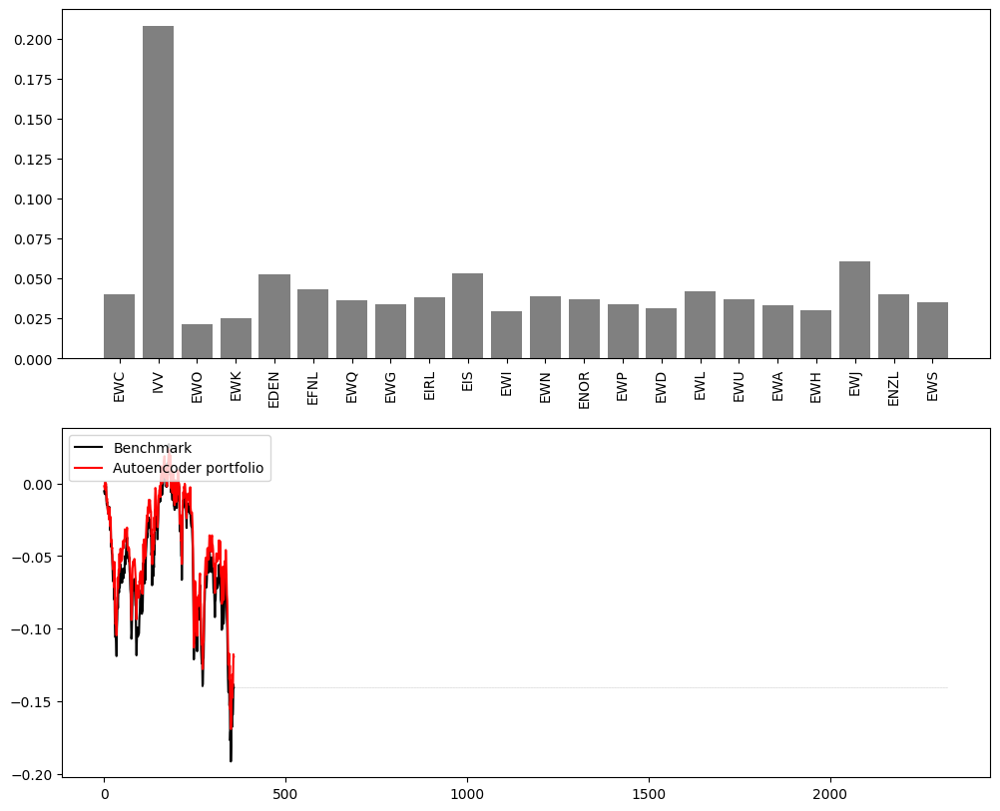

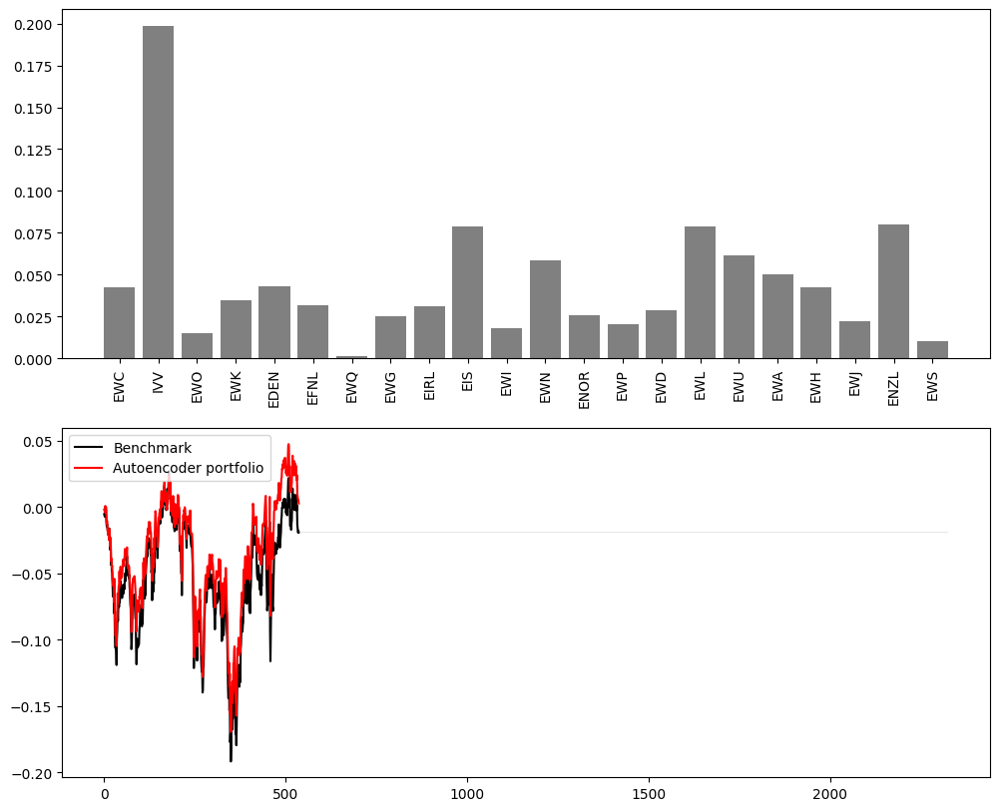

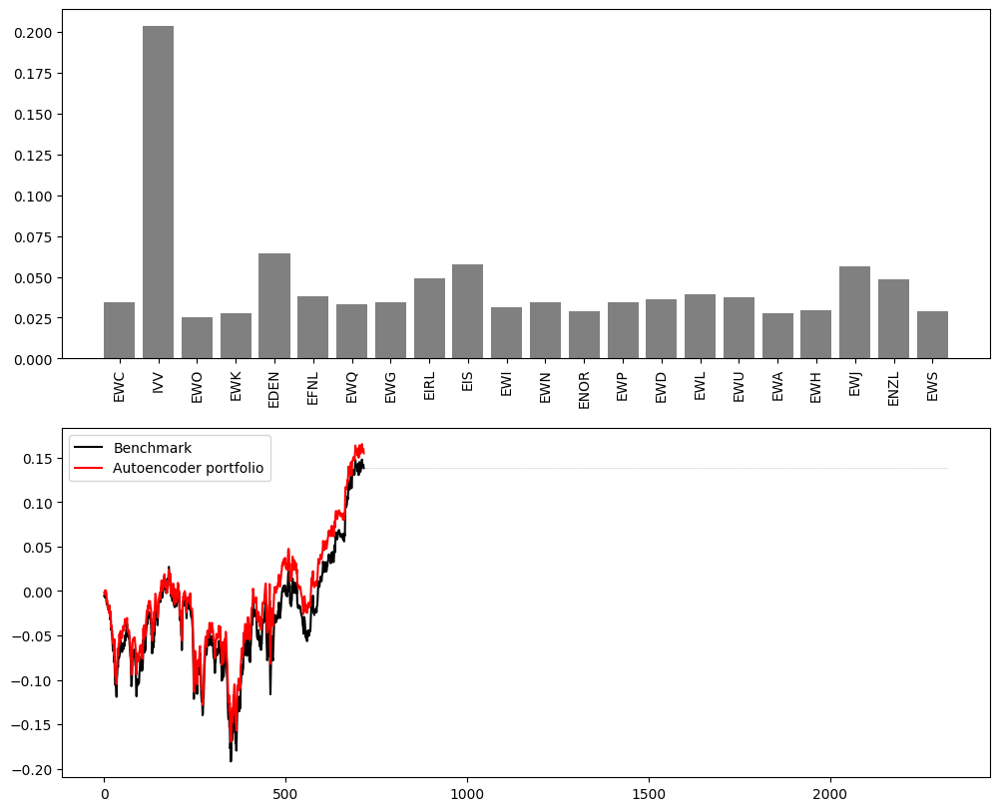

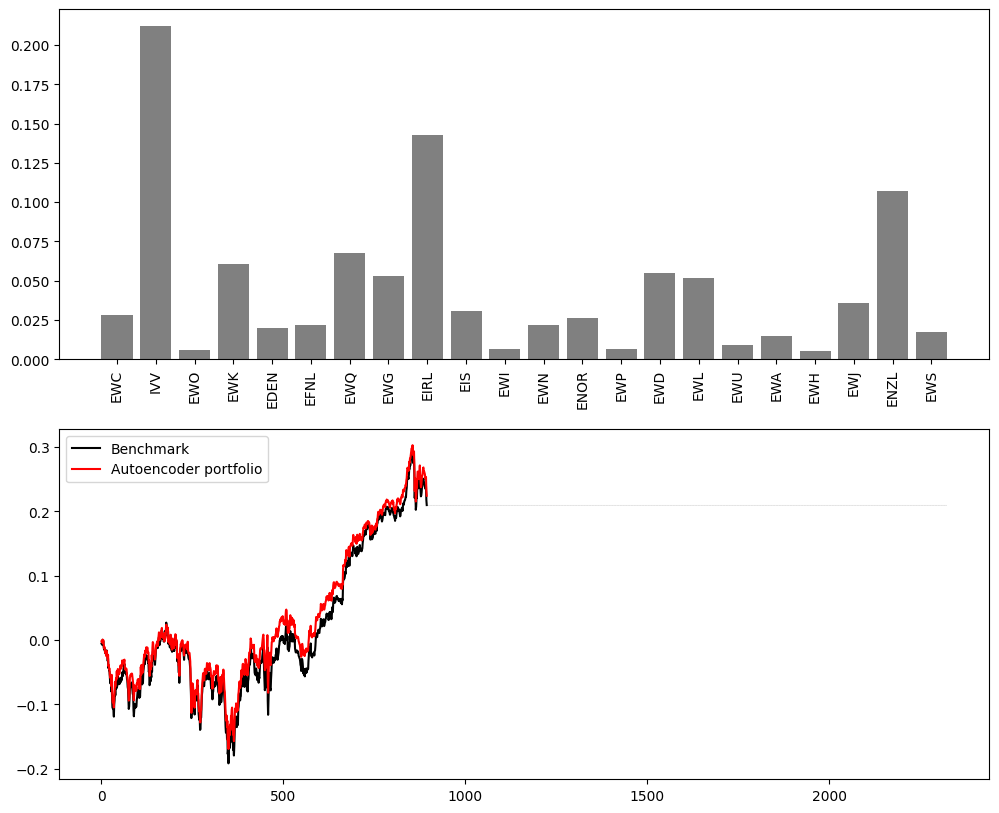

...

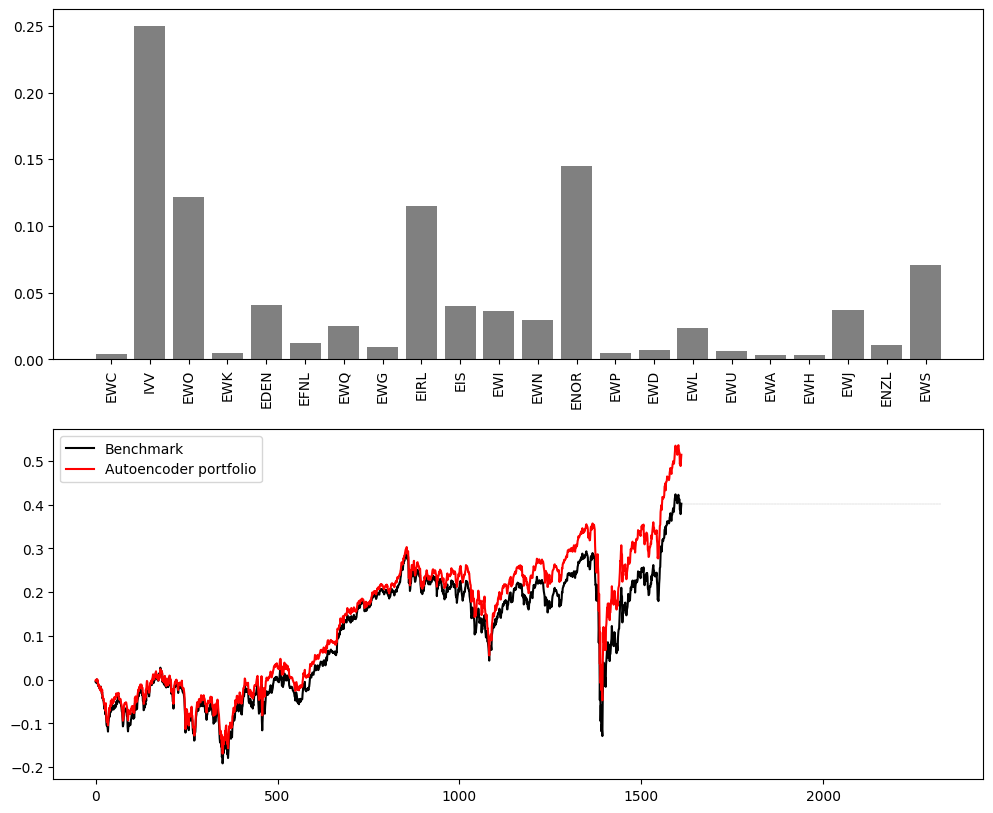

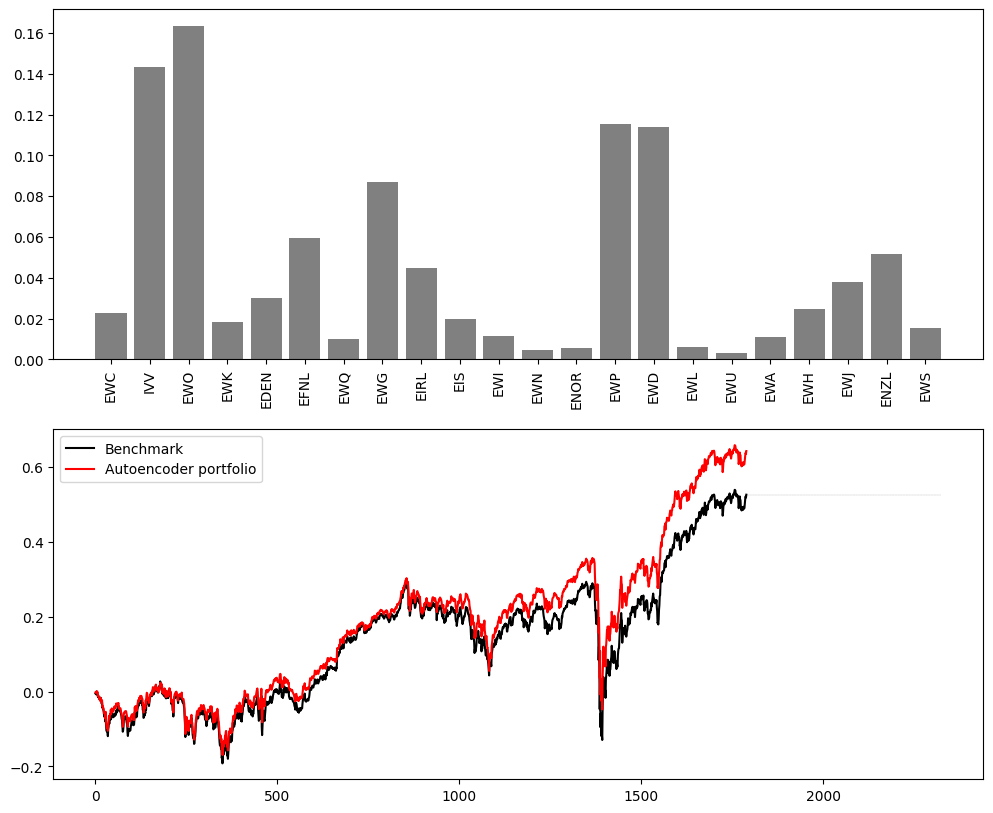

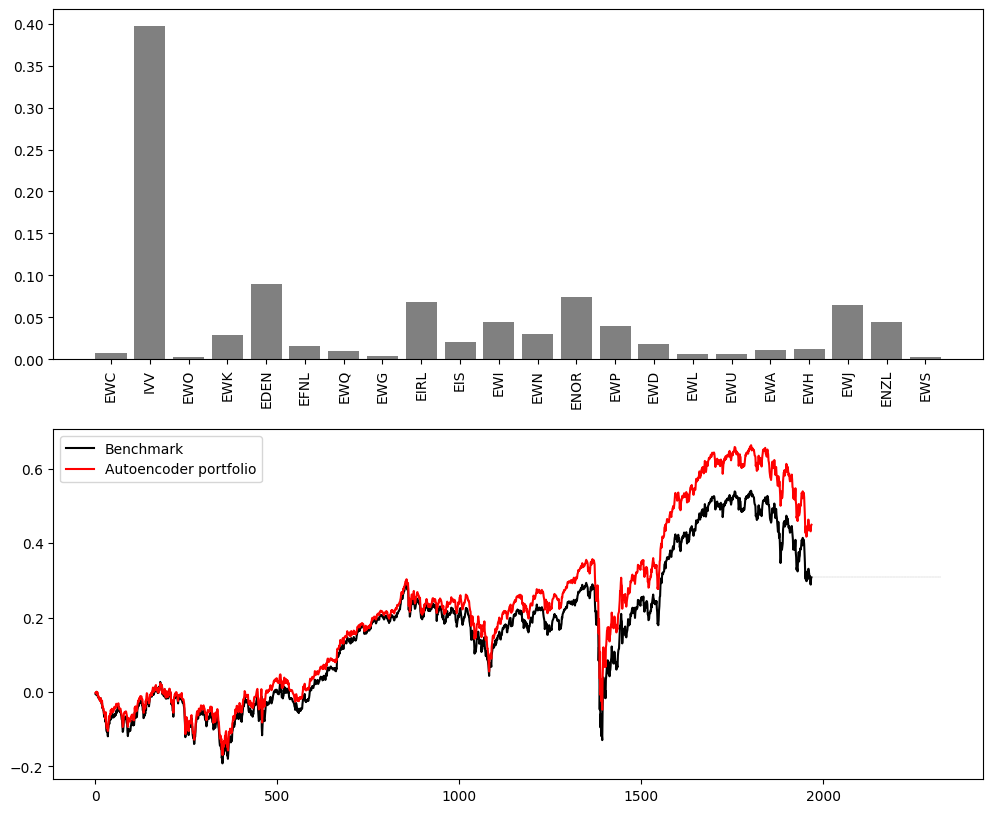

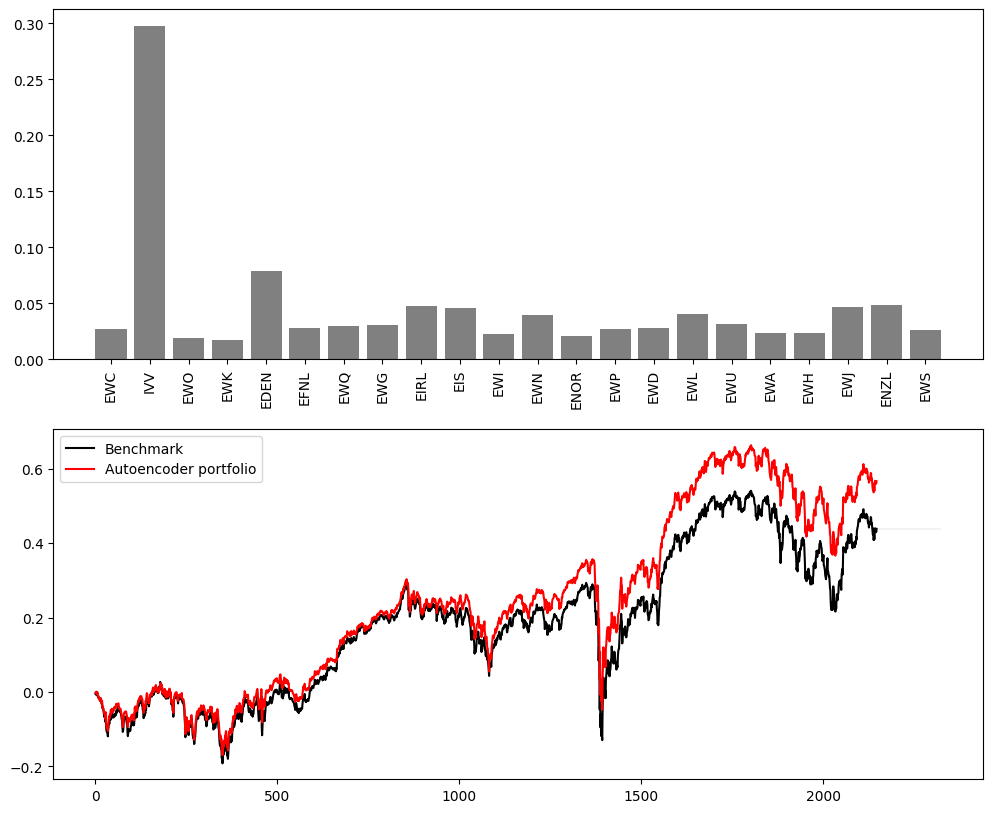

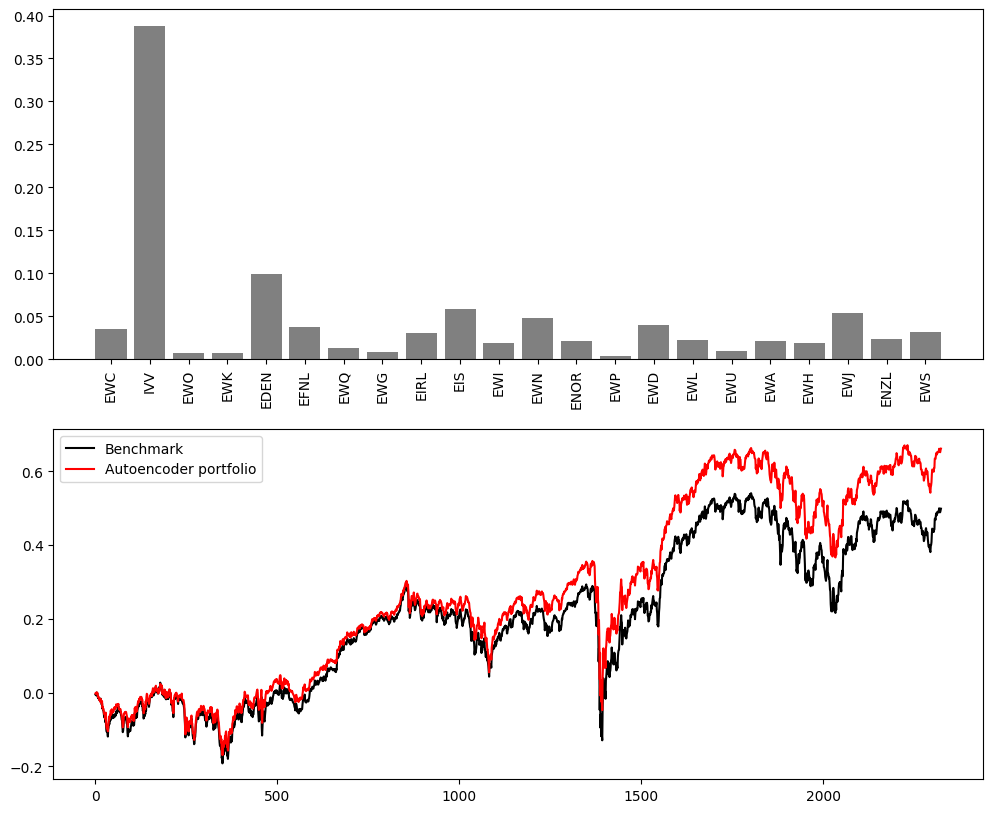

In [67]:
plot_results(result_equal,
             result_ae,
             actions_ae,
             N_ASSETS,
             state.columns,
             'Autoencoder portfolio', './images_etf/ae/', 'series')

### Supplement

In [ ]:
name = 'ae'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'decorr'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'hrp'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'maxret'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'minvar'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'pca'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'sharpe'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'smoothing'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

## Evaluation (using US Sector ETFs)

In [ ]:
tickers1 = ['XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB','XLK', 'XLU']
N_ASSETS1 = 9
WINDOW_FIT = 180
WINDOW_HOLD = 180
env1 = ETFEnvironment(tickers1, '2013-12-09', '2023-12-09')

[*********************100%%**********************]  9 of 9 completed


### Standard Portfolios

*   Maximum returns
*   Minimum variance
*   Maximum Sharpe
*   Maximum Decorrelation


In [ ]:
agent_max_returns1 = MaxReturnsAgent(N_ASSETS1, allow_short=False)
agent_minvar1 = MinVarianceAgent(N_ASSETS1, allow_short=False)
agent_maxsharpe1 = MaxSharpeAgent(N_ASSETS1, allow_short=False)
agent_maxdecorr1 = MaxDecorrelationAgent(N_ASSETS1, allow_short=False)

In [ ]:
actions_equal1, actions_returns1, actions_minvar1, actions_maxsharpe1, actions_maxdecorr1 = [], [], [], [], []
result_equal1, result_returns1, result_minvar1, result_maxsharpe1, result_maxdecorr1 = [], [], [], [], []

for i in range(WINDOW_FIT, len(env1.data), WINDOW_HOLD):

    state1 = env1.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal1 = np.ones(N_ASSETS1) / N_ASSETS1
    action_minvar1 = agent_minvar1.act(state1)
    action_max_returns1 = agent_max_returns1.act(state1)
    action_maxsharpe1 = agent_maxsharpe1.act(state1)
    action_maxdecorr1 = agent_maxdecorr1.act(state1)

    state_action1 = env1.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r1 = np.dot(state_action1, action_equal1)
    result_equal1.append(r1.tolist())
    actions_equal1.append(action_equal1)

    r1 = np.dot(state_action1, action_minvar1)
    result_minvar1.append(r1.tolist())
    actions_minvar1.append(action_minvar1)

    r1 = np.dot(state_action1, action_max_returns1)
    result_returns1.append(r1.tolist())
    actions_returns1.append(action_max_returns1)

    r1 = np.dot(state_action1, action_maxsharpe1)
    result_maxsharpe1.append(r1.tolist())
    actions_maxsharpe1.append(action_maxsharpe1)

    r1 = np.dot(state_action1, action_maxdecorr1)
    result_maxdecorr1.append(r1.tolist())
    actions_maxdecorr1.append(action_maxdecorr1)

In [ ]:
result_equal_vis1 = [item for sublist in result_equal1 for item in sublist]
result_returns_vis1 = [item for sublist in result_returns1 for item in sublist]
result_minvar_vis1 = [item for sublist in result_minvar1 for item in sublist]
result_maxsharpe_vis1 = [item for sublist in result_maxsharpe1 for item in sublist]
result_maxdecorr_vis1 = [item for sublist in result_maxdecorr1 for item in sublist]

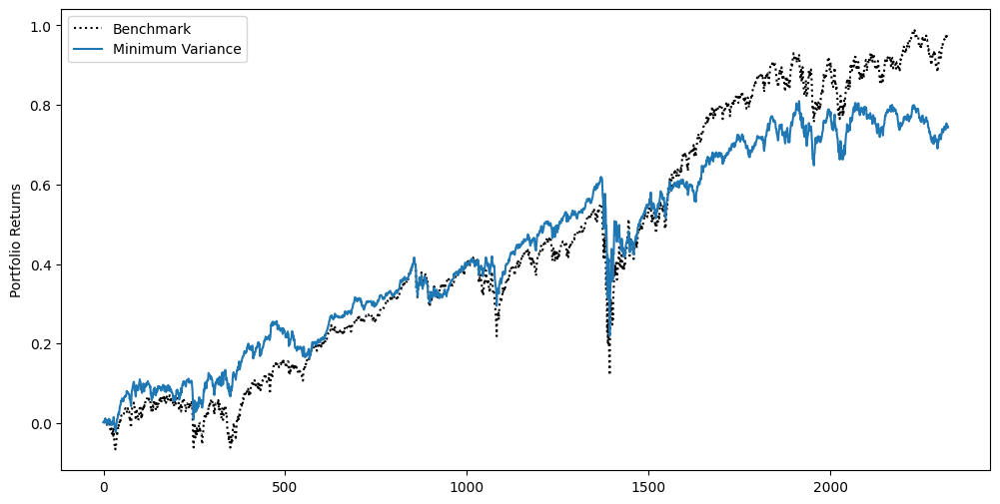

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_minvar_vis1).cumsum(), label="Minimum Variance")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

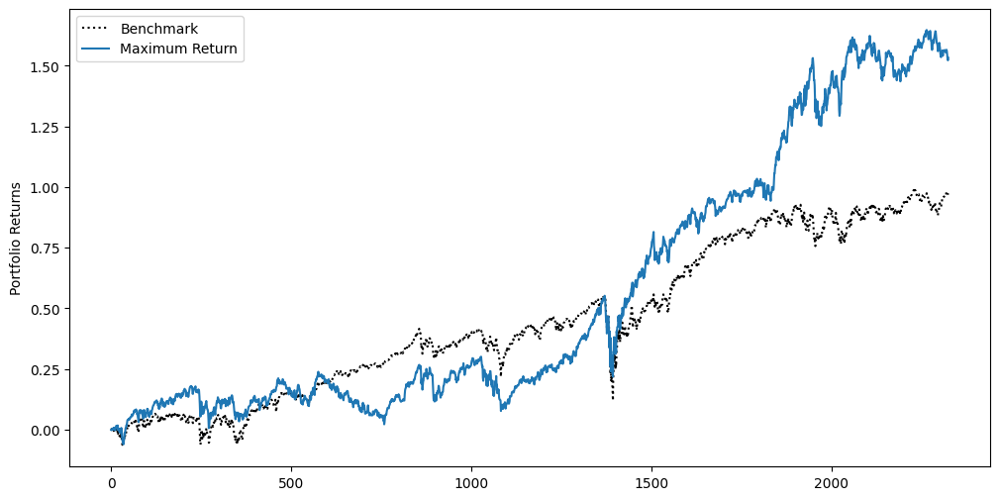

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_returns_vis1).cumsum(), label="Maximum Return")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

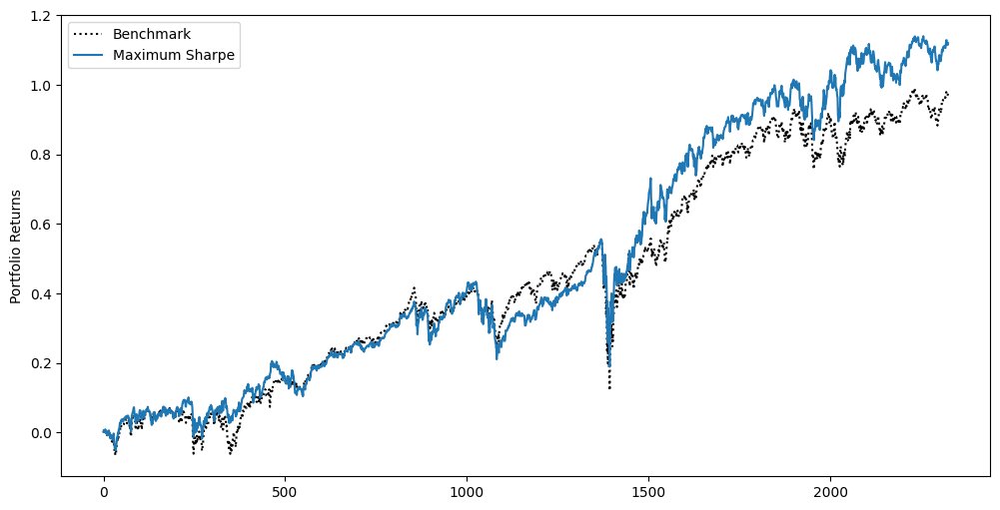

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_maxsharpe_vis1).cumsum(), label="Maximum Sharpe")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

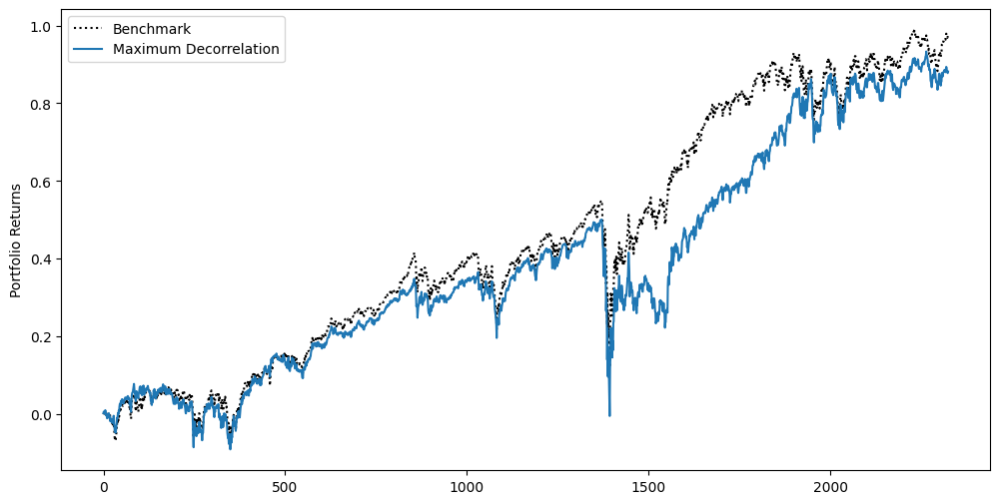

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_maxdecorr_vis1).cumsum(), label="Maximum Decorrelation")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis1, result_equal_vis1))
print('MINVAR', print_stats(result_minvar_vis1, result_equal_vis1))
print('MAXRET', print_stats(result_returns_vis1, result_equal_vis1))
print('MAXSHRAPE', print_stats(result_maxsharpe_vis1, result_equal_vis1))
print('MAXDECORR', print_stats(result_maxdecorr_vis1, result_equal_vis1))

EQUAL ('Returns:', 0.0004, 'Volatility:', 0.011, 'Sharpe', 0.6024, 'Alpha:', 0.0, 'Beta:', 1.0)
MINVAR ('Returns:', 0.0003, 'Volatility:', 0.01, 'Sharpe', 0.5065, 'Alpha:', -0.0, 'Beta:', 0.8061)
MAXRET ('Returns:', 0.0007, 'Volatility:', 0.015, 'Sharpe', 0.7005, 'Alpha:', 0.0002, 'Beta:', 0.9813)
MAXSHRAPE ('Returns:', 0.0005, 'Volatility:', 0.0121, 'Sharpe', 0.6324, 'Alpha:', 0.0001, 'Beta:', 0.9286)
MAXDECORR ('Returns:', 0.0004, 'Volatility:', 0.012, 'Sharpe', 0.5015, 'Alpha:', -0.0, 'Beta:', 1.0208)


### PCA portfolio

In [ ]:
agent_pca1 = PCAAgent(N_ASSETS1, allow_short=False, pc_id=0)

In [ ]:
actions_equal1, actions_pca1 = [], []
result_equal1, result_pca1 = [], []

for i in range(WINDOW_FIT, len(env1.data), WINDOW_HOLD):

    state1 = env1.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal1 = np.ones(N_ASSETS1) / N_ASSETS1
    action_pca1 = agent_pca1.act(state1)

    state_action1 = env1.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r1 = np.dot(state_action1, action_equal1)
    result_equal1.append(r1.tolist())
    actions_equal1.append(action_equal1)

    r1 = np.dot(state_action1, action_pca1)
    result_pca1.append(r1.tolist())
    actions_pca1.append(action_pca1)

In [ ]:
result_equal_vis1 = [item for sublist in result_equal1 for item in sublist]
result_pca_vis1 = [item for sublist in result_pca1 for item in sublist]

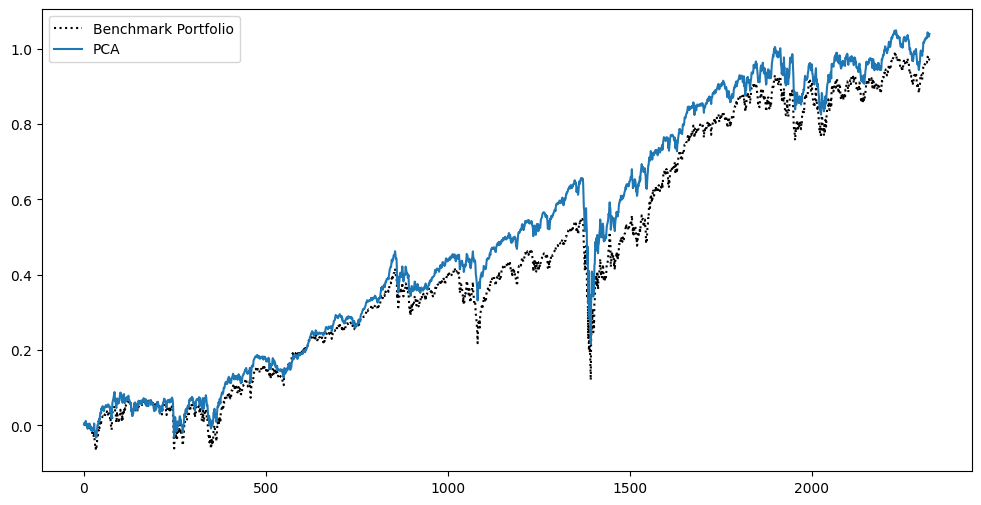

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_pca_vis1).cumsum(), label = "PCA")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis1, result_equal_vis1))
print('PCA', print_stats(result_pca_vis1, result_equal_vis1))

EQUAL ('Returns:', 0.0004, 'Volatility:', 0.011, 'Sharpe', 0.6024, 'Alpha:', 0.0, 'Beta:', 1.0)
PCA ('Returns:', 0.0004, 'Volatility:', 0.0107, 'Sharpe', 0.6634, 'Alpha:', 0.0001, 'Beta:', 0.9363)


### HRP Portfolio

In [ ]:
agent_hrp1 = HRPAgent(N_ASSETS1, allow_short=False)

In [ ]:
actions_equal1, actions_hrp1 = [], []
result_equal1, result_hrp1 = [], []

for i in range(WINDOW_FIT, len(env1.data), WINDOW_HOLD):

    state1 = env1.get_state(i, WINDOW_FIT, is_cov_matrix=False)

    action_equal1 = np.ones(N_ASSETS1) / N_ASSETS1
    action_hrp1 = agent_hrp1.act(state1)

    state_action1 = env1.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r1 = np.dot(state_action1, action_equal1)
    result_equal1.append(r1.tolist())
    actions_equal1.append(action_equal1)

    r1 = np.dot(state_action1, action_hrp1)
    result_hrp1.append(r1.tolist())
    actions_hrp1.append(action_hrp1)

In [ ]:
result_equal_vis1 = [item for sublist in result_equal1 for item in sublist]
result_hrp_vis1 = [item for sublist in result_hrp1 for item in sublist]

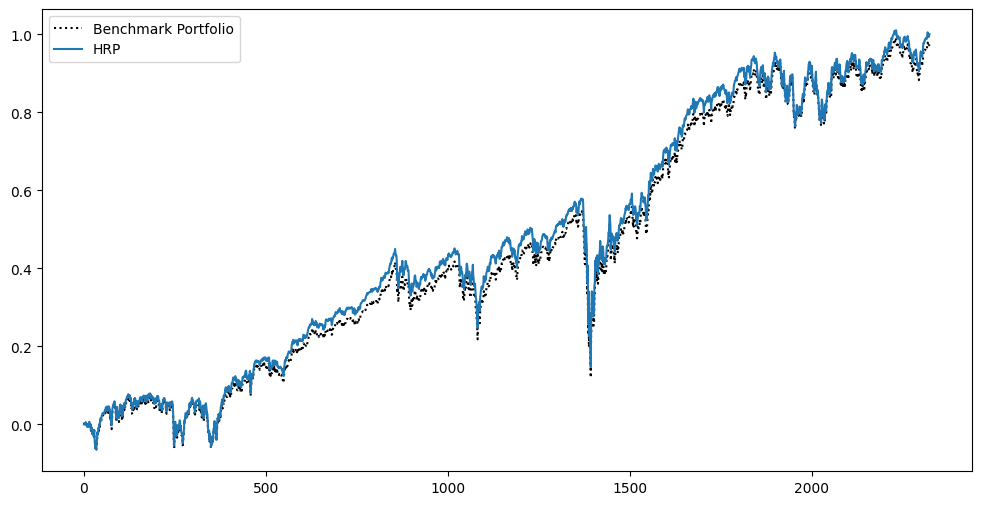

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_hrp_vis1).cumsum(), label = "HRP")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis1, result_equal_vis1))
print('HRP', print_stats(result_hrp_vis1, result_equal_vis1))

EQUAL ('Returns:', 0.0004, 'Volatility:', 0.011, 'Sharpe', 0.6024, 'Alpha:', 0.0, 'Beta:', 1.0)
HRP ('Returns:', 0.0004, 'Volatility:', 0.0113, 'Sharpe', 0.6039, 'Alpha:', 0.0, 'Beta:', 1.0211)


### Holt Portfolio

In [ ]:
agent_smooth1 = SmoothingAgent(N_ASSETS1, allow_short=False, forecast_horizon = WINDOW_HOLD)

In [ ]:
actions_equal1, actions_smooth1 = [], []
result_equal1, result_smooth1 = [], []

for i in range(WINDOW_FIT, len(env1.data), WINDOW_HOLD):
    state1 = env1.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)

    action_equal1 = np.ones(N_ASSETS1) / N_ASSETS1
    action_smooth1 = agent_smooth1.act(state1)

    state_action1 = env1.get_state(i + WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r1 = np.dot(state_action1, action_equal1)
    result_equal1.append(r1.tolist())
    actions_equal1.append(action_equal1)

    r1 = np.dot(state_action1, action_smooth1)
    result_smooth1.append(r1.tolist())
    actions_smooth1.append(action_smooth1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-p

In [ ]:
result_equal_vis1 = [item for sublist in result_equal1 for item in sublist]
result_smooth_vis1 = [item for sublist in result_smooth1 for item in sublist]

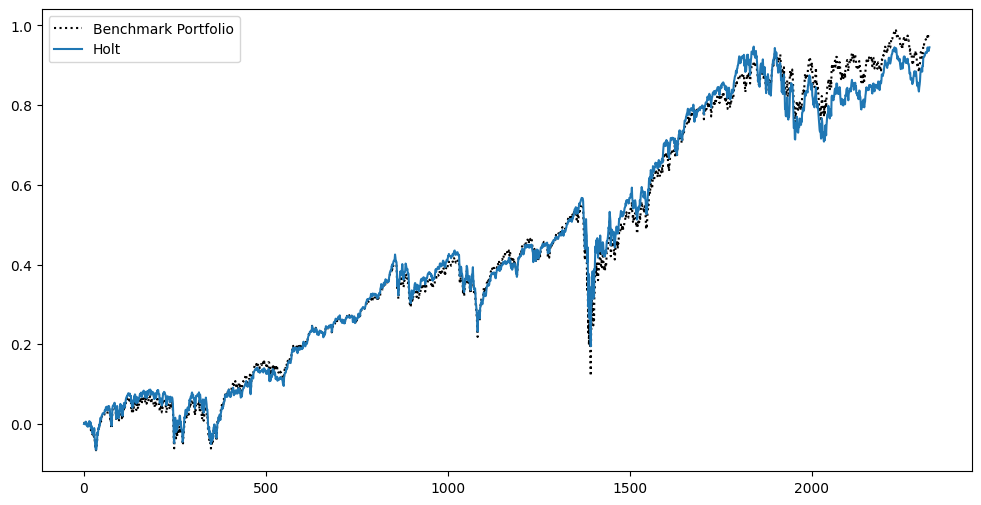

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_smooth_vis1).cumsum(), label = "Holt")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis1, result_equal_vis1))
print('HOLT SMOOTHENING', print_stats(result_smooth_vis1, result_equal_vis1))

EQUAL ('Returns:', 0.0004, 'Volatility:', 0.011, 'Sharpe', 0.6024, 'Alpha:', 0.0, 'Beta:', 1.0)
HOLT SMOOTHENING ('Returns:', 0.0004, 'Volatility:', 0.0112, 'Sharpe', 0.5781, 'Alpha:', -0.0, 'Beta:', 0.9818)


### Autoencoder Portfolio

In [ ]:
agent_ae1 = AutoencoderAgent(N_ASSETS1, allow_short=False, encoding_dim = 5)

In [ ]:
actions_equal1, actions_ae1 = [], []
result_equal1, result_ae1 = [], []

for i in range(WINDOW_FIT, len(env1.data), WINDOW_HOLD):
    state1 = env1.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)

    action_equal1 = np.ones(N_ASSETS1) / N_ASSETS1
    action_ae1 = agent_ae1.act(state1)

    state_action1 = env1.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)

    r1 = np.dot(state_action1, action_equal1)
    result_equal1.append(r1.tolist())
    actions_equal1.append(action_equal1)

    r1 = np.dot(state_action1, action_ae1)
    result_ae1.append(r1.tolist())
    actions_ae1.append(action_ae1)

6/6 [==============================] - 0s 3ms/step


In [ ]:
result_equal_vis1 = [item for sublist in result_equal1 for item in sublist]
result_ae_vis1 = [item for sublist in result_ae1 for item in sublist]

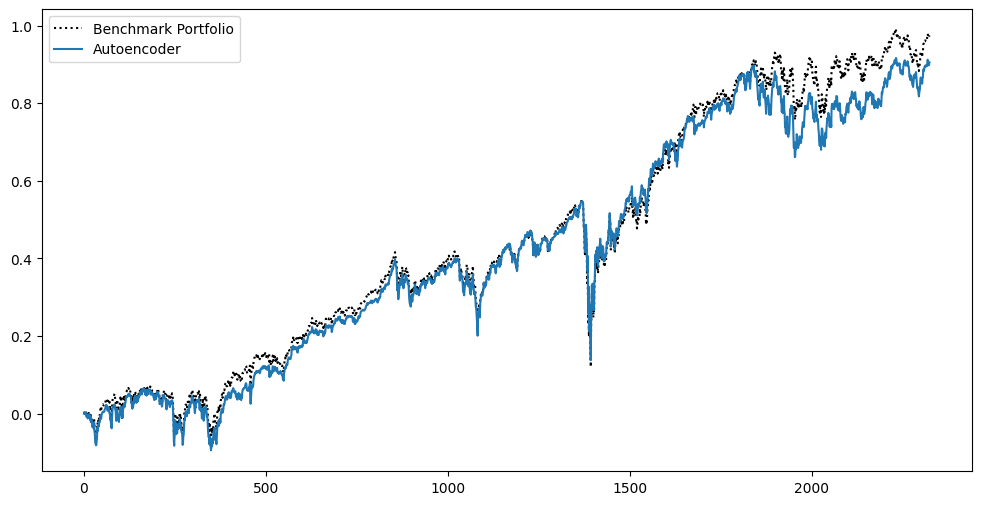

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_ae_vis1).cumsum(), label = "Autoencoder")
plt.legend()
plt.show()

In [ ]:
print('EQUAL', print_stats(result_equal_vis1, result_equal_vis1))
print('AUTOENCODER', print_stats(result_ae_vis1, result_equal_vis1))

EQUAL ('Returns:', 0.0004, 'Volatility:', 0.011, 'Sharpe', 0.6024, 'Alpha:', 0.0, 'Beta:', 1.0)
AUTOENCODER ('Returns:', 0.0004, 'Volatility:', 0.0113, 'Sharpe', 0.5451, 'Alpha:', -0.0, 'Beta:', 1.0056)


###Summary Plots

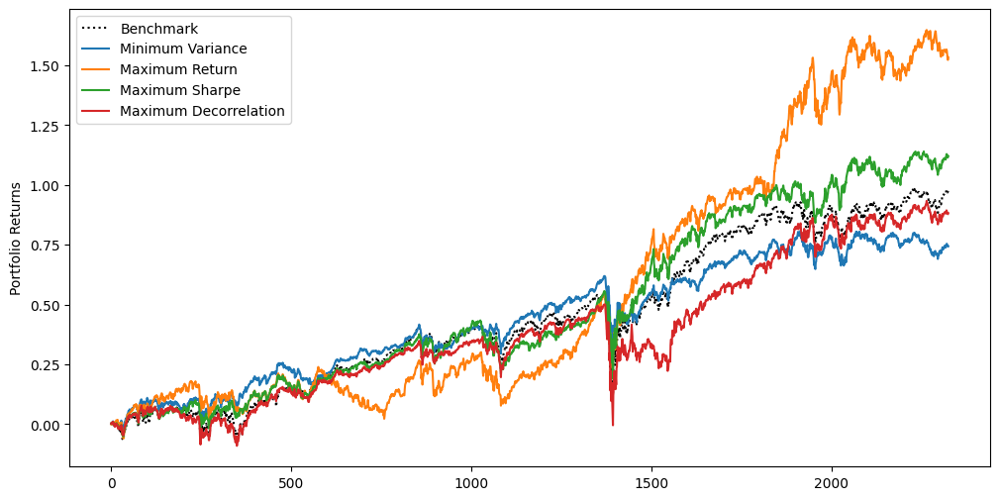

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), label="Benchmark", color ="black", linestyle=":")
plt.plot(np.array(result_minvar_vis1).cumsum(), label="Minimum Variance")
plt.plot(np.array(result_returns_vis1).cumsum(), label="Maximum Return")
plt.plot(np.array(result_maxsharpe_vis1).cumsum(), label="Maximum Sharpe")
plt.plot(np.array(result_maxdecorr_vis1).cumsum(), label="Maximum Decorrelation")
plt.legend()
plt.ylabel("Portfolio Returns")
plt.show()

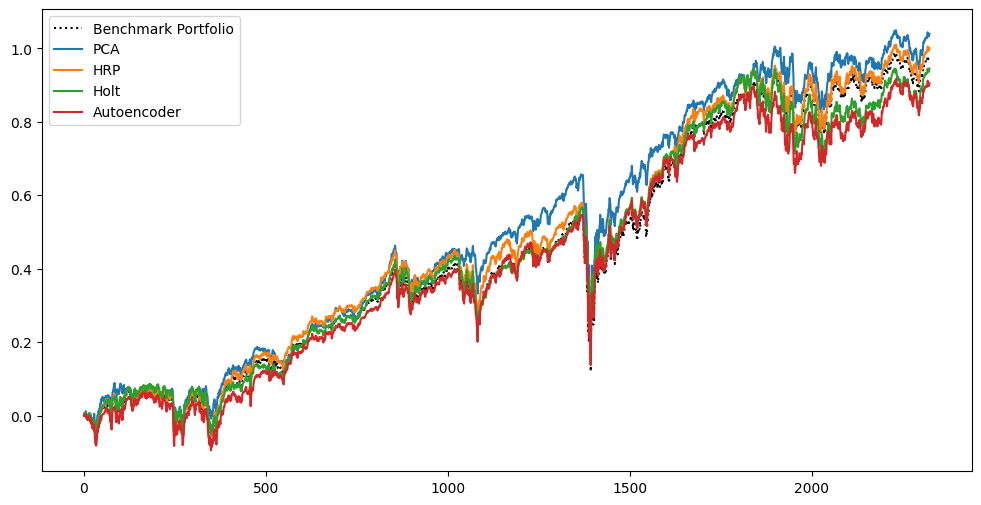

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_pca_vis1).cumsum(), label = "PCA")
plt.plot(np.array(result_hrp_vis1).cumsum(), label = "HRP")
plt.plot(np.array(result_smooth_vis1).cumsum(), label = "Holt")
plt.plot(np.array(result_ae_vis1).cumsum(), label = "Autoencoder")
plt.legend()
plt.show()

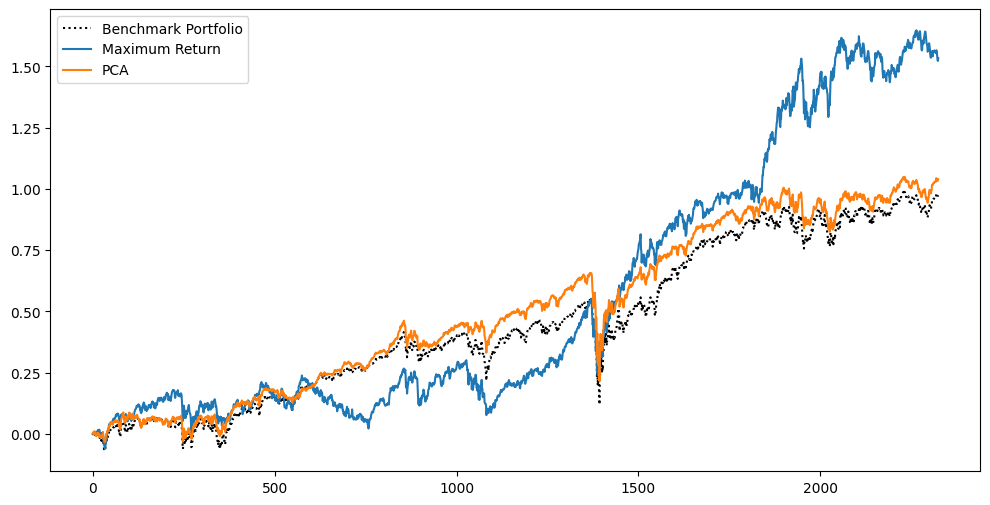

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(np.array(result_equal_vis1).cumsum(), color='black', linestyle=":", label="Benchmark Portfolio")
plt.plot(np.array(result_returns_vis1).cumsum(), label="Maximum Return")
plt.plot(np.array(result_pca_vis1).cumsum(), label = "PCA")
plt.legend()
plt.show()

In [ ]:
result_equal_vis_array = np.array(result_equal_vis1)
cumulative_sum = np.cumsum(result_equal_vis_array)
print(cumulative_sum)

[1.23297150e-04 3.02636542e-03 1.27760632e-03 ... 9.68201524e-01
 9.71186377e-01 9.74393931e-01]


## Visualization (using US Sector ETFs)

###Standard Optimizer

#### Maximum Return Portfolio

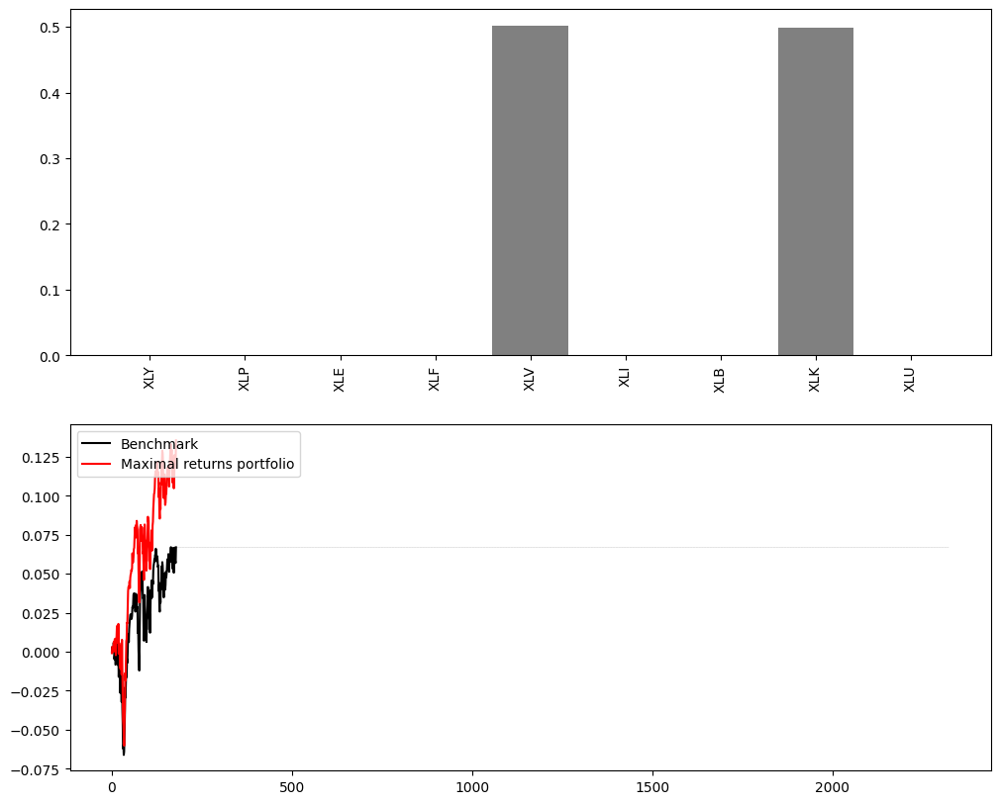

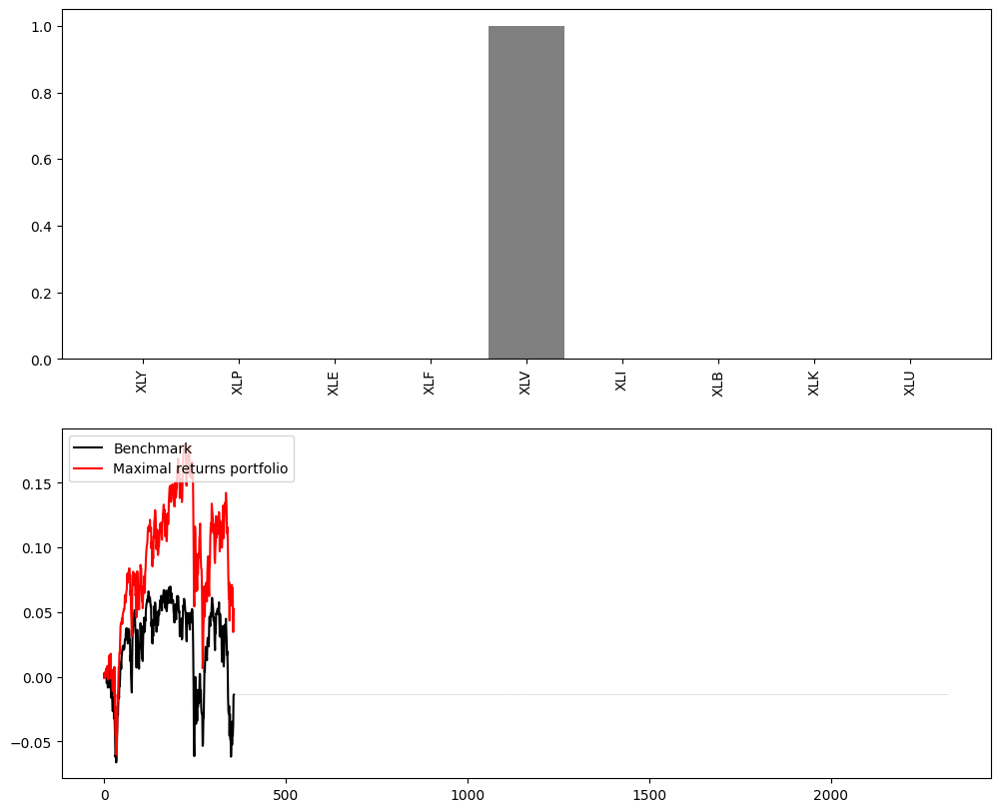

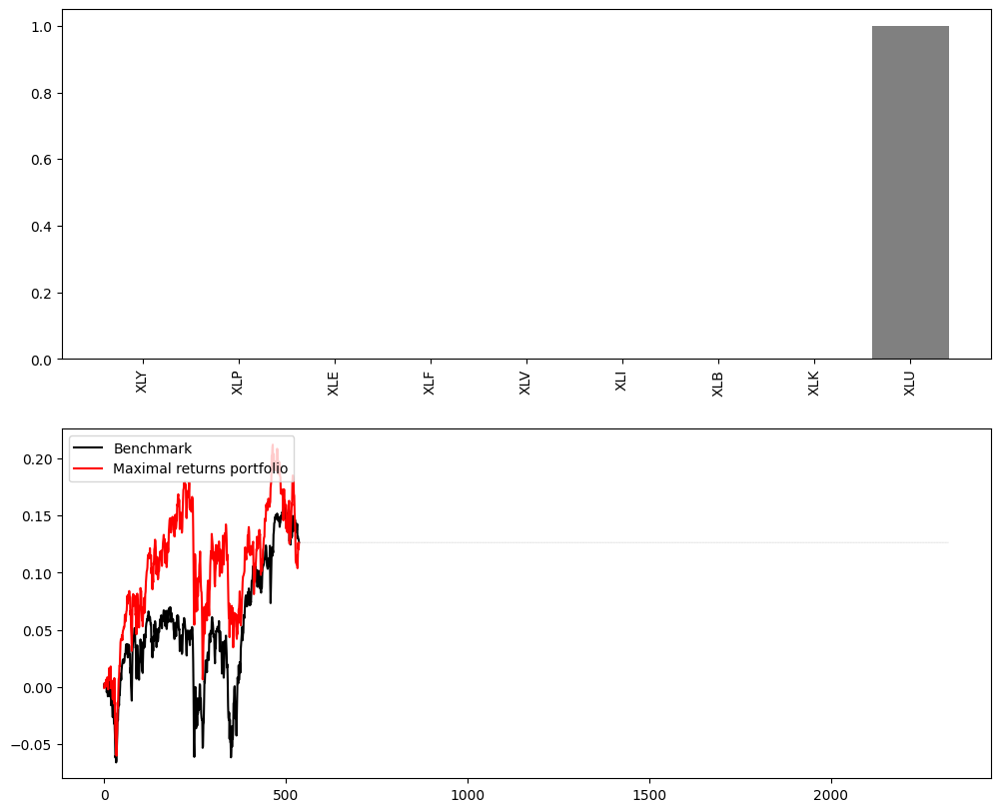

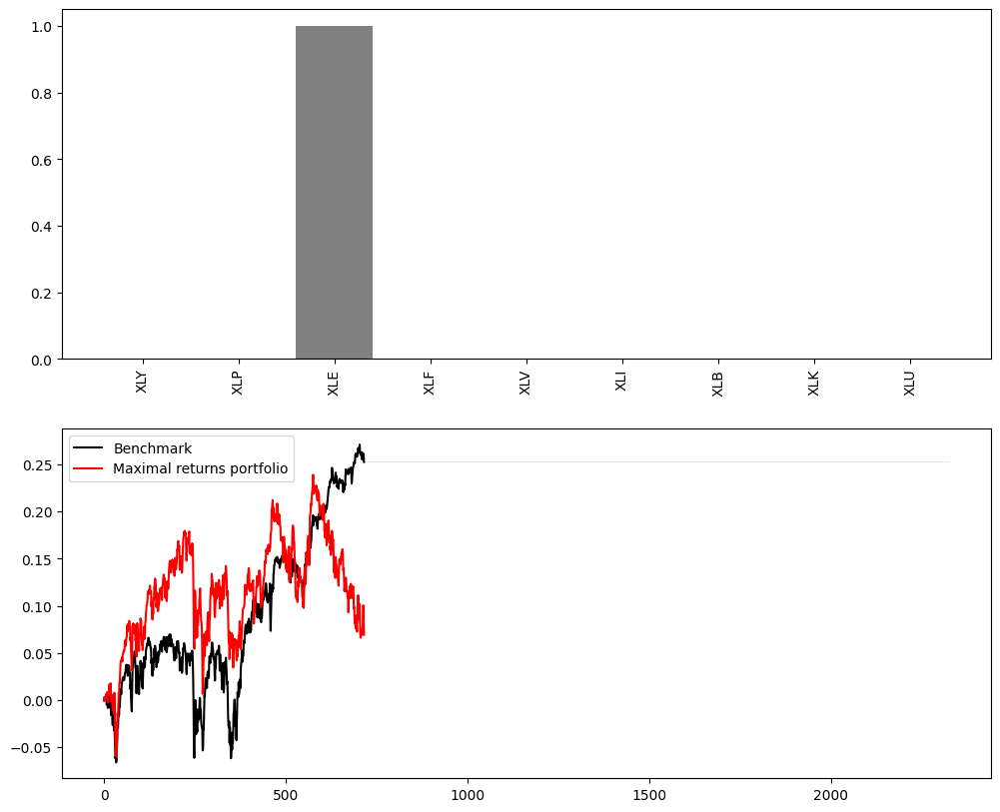

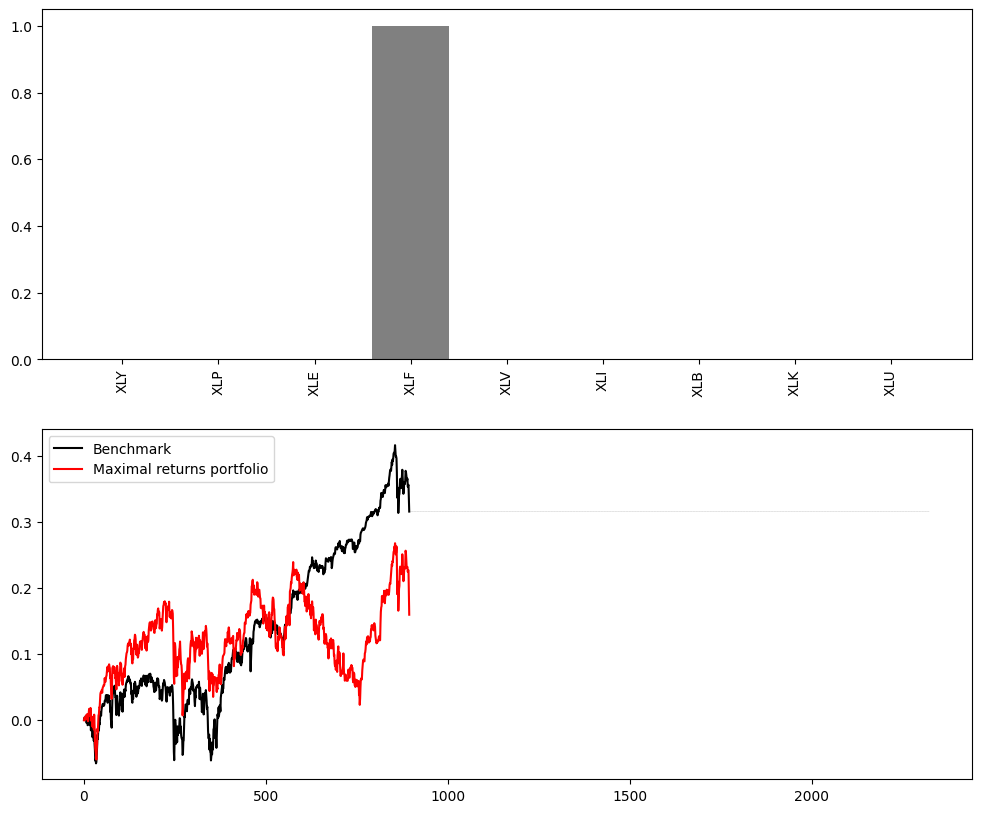

...

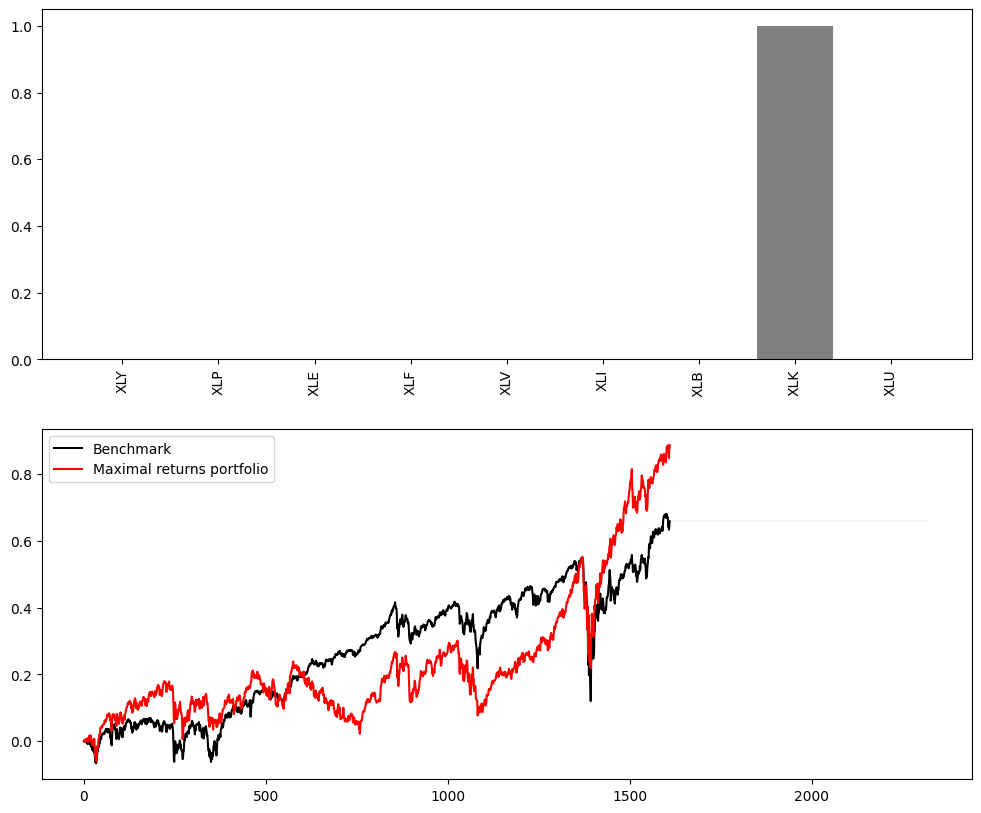

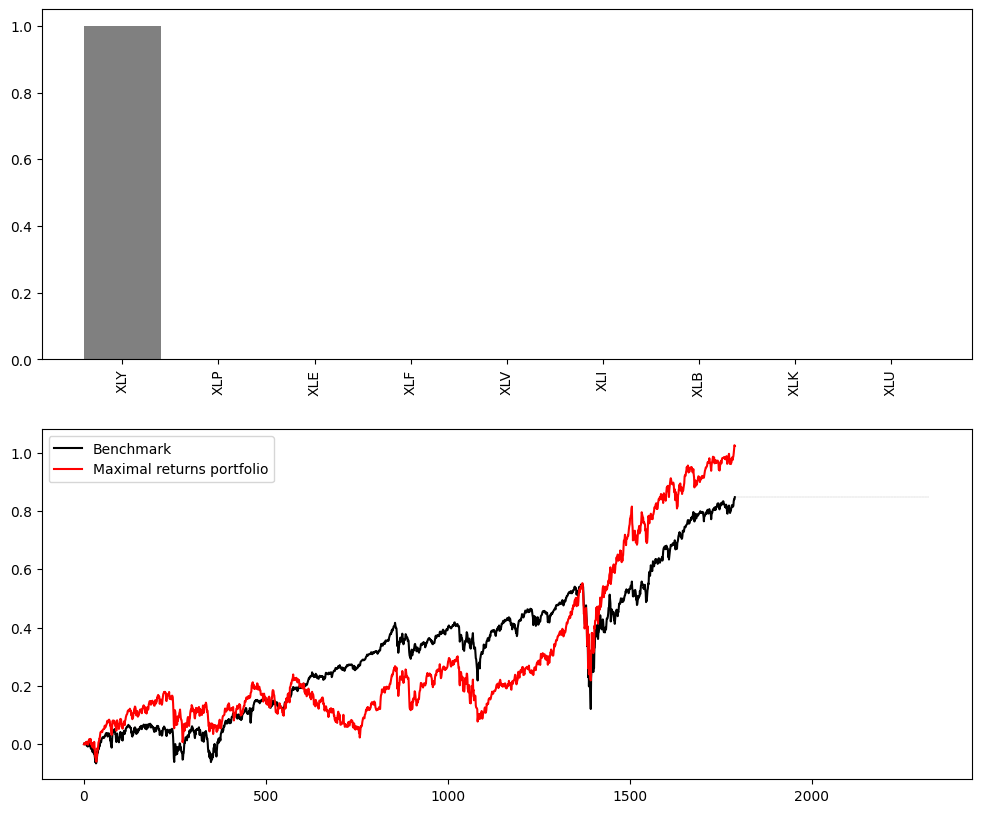

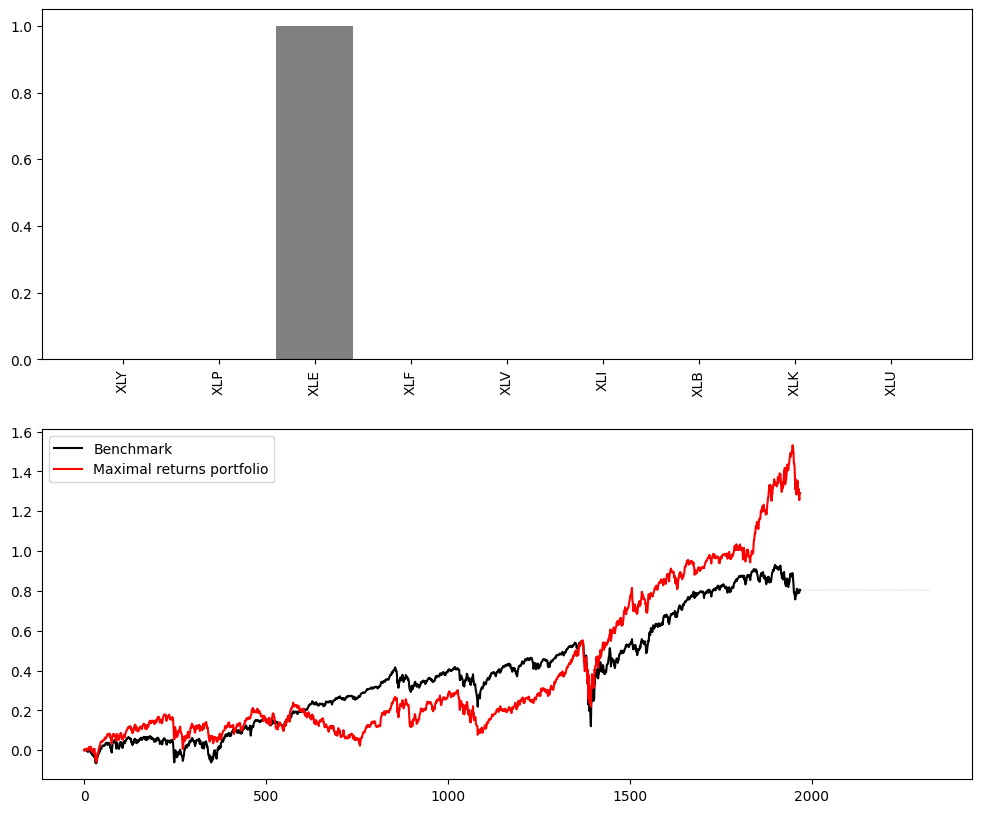

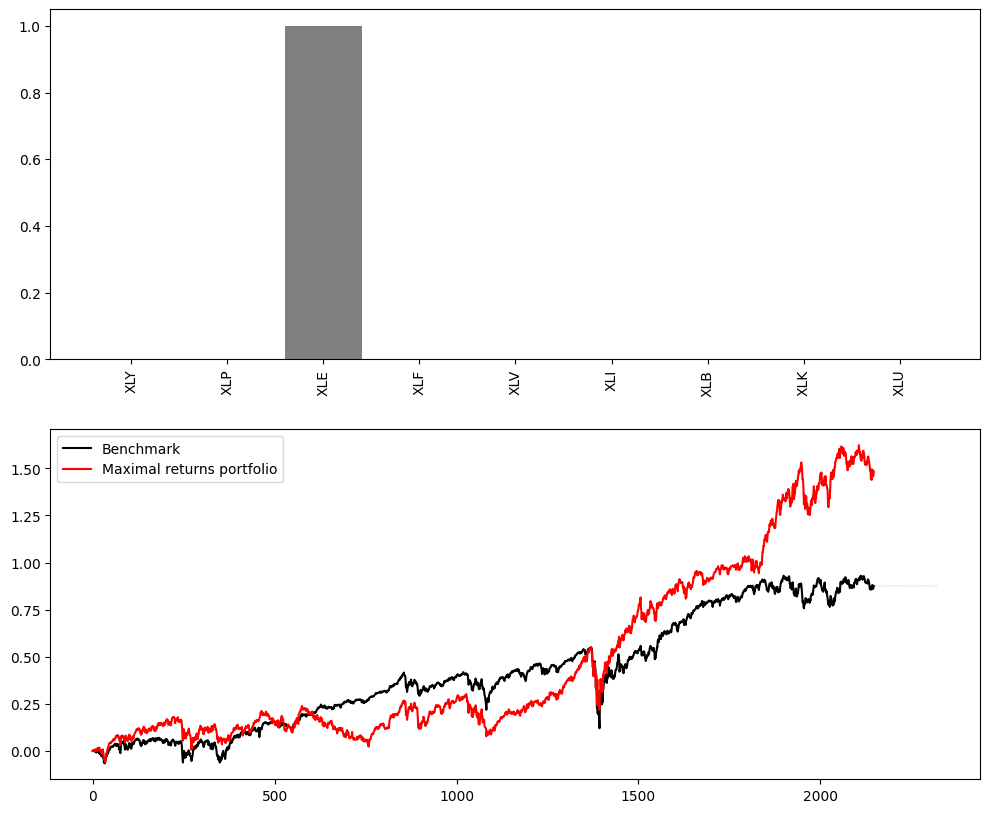

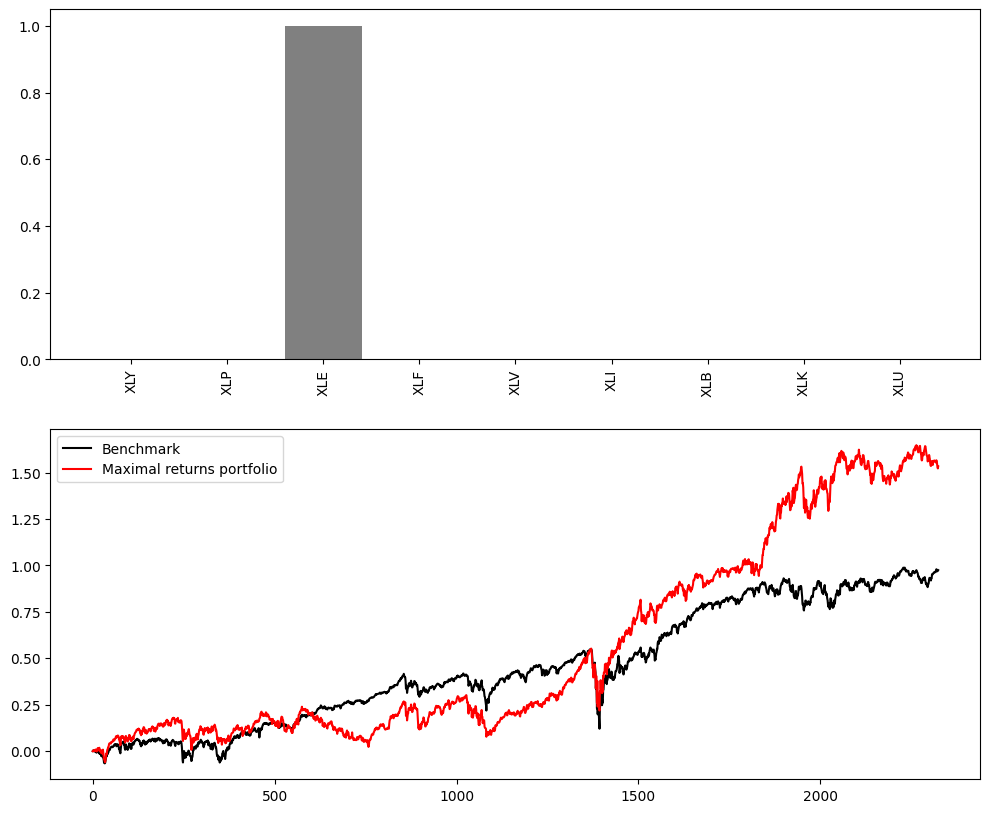

In [ ]:
plot_results(result_equal1,
             result_returns1,
             actions_returns1,
             N_ASSETS1,
             state1.columns.tolist(),
             'Maximal returns portfolio', './images_etf/maxret1/', 'series')

#### Minimum Variance Portfolio

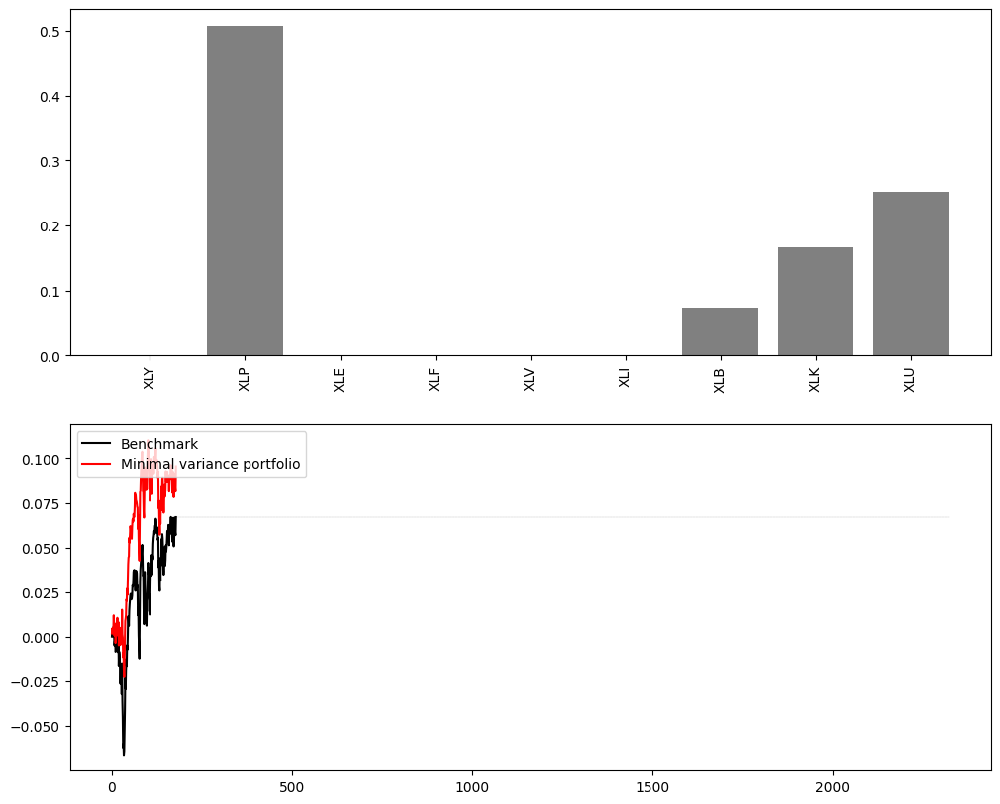

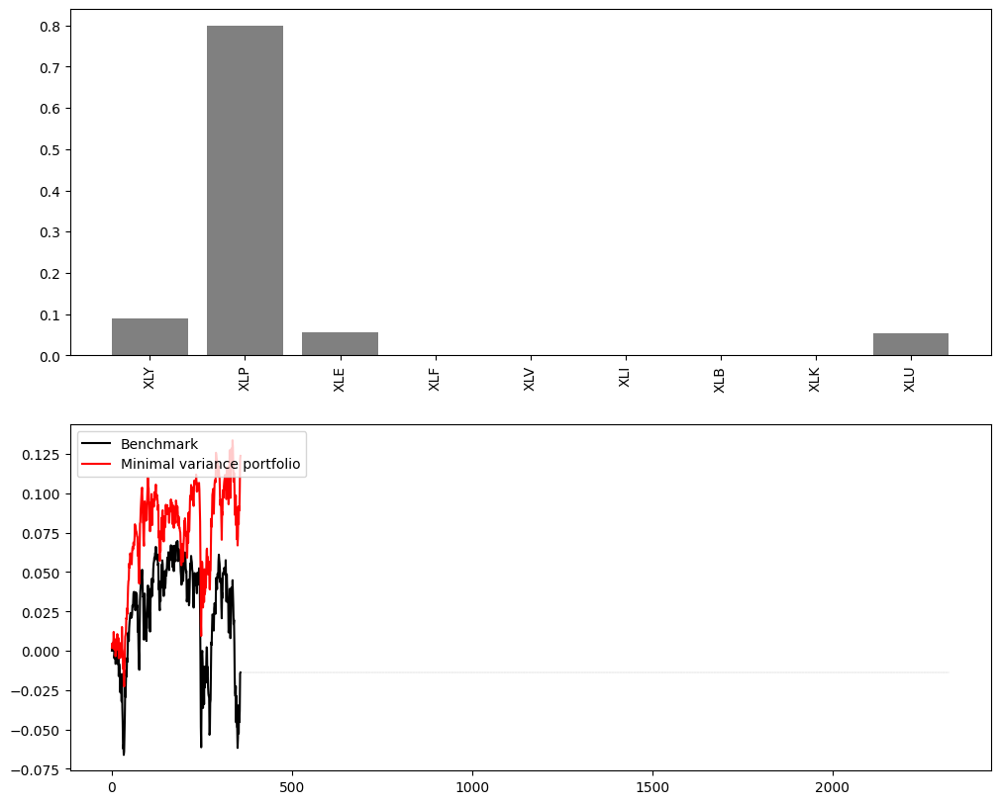

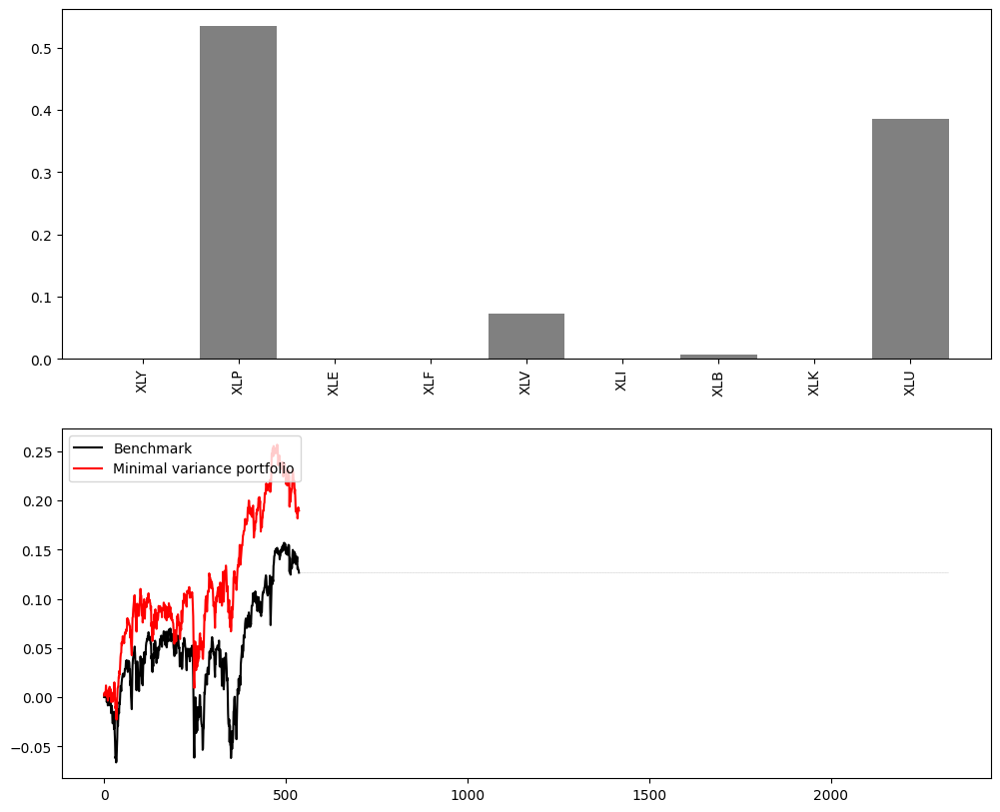

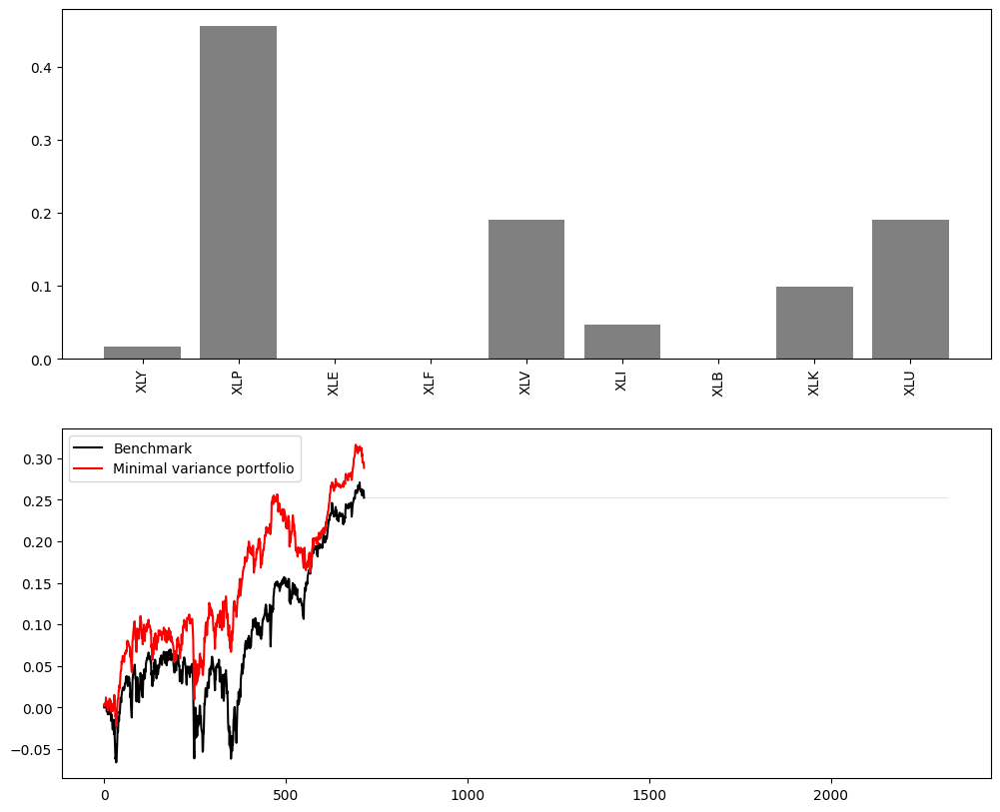

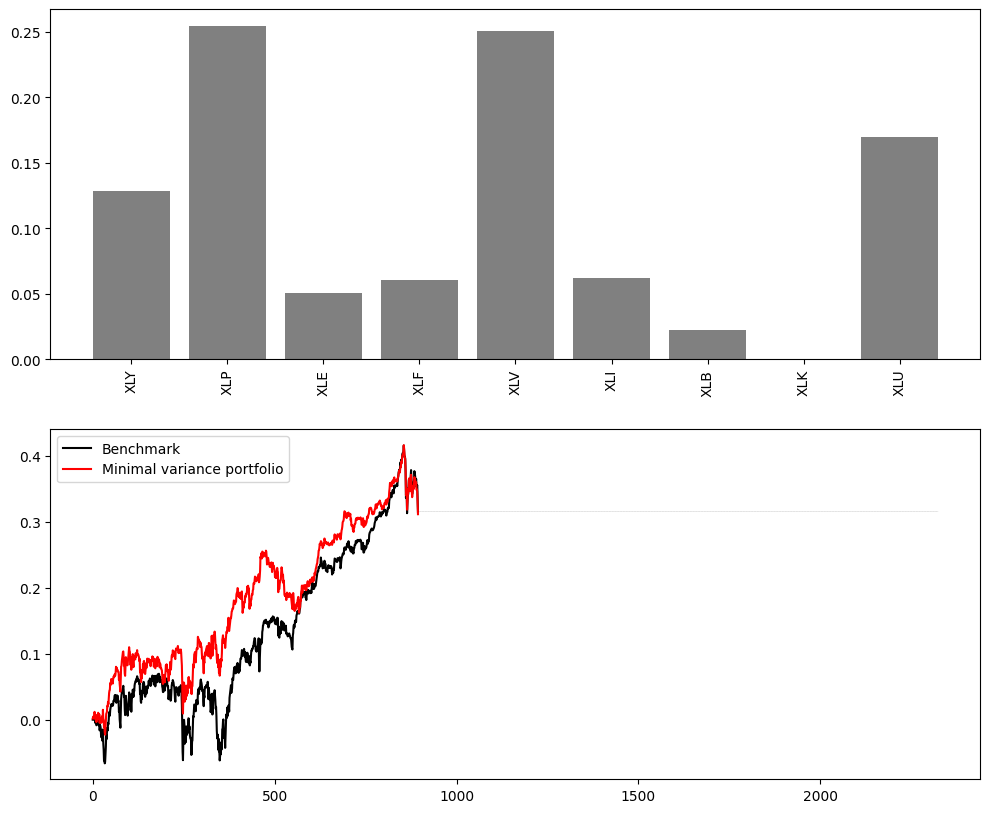

...

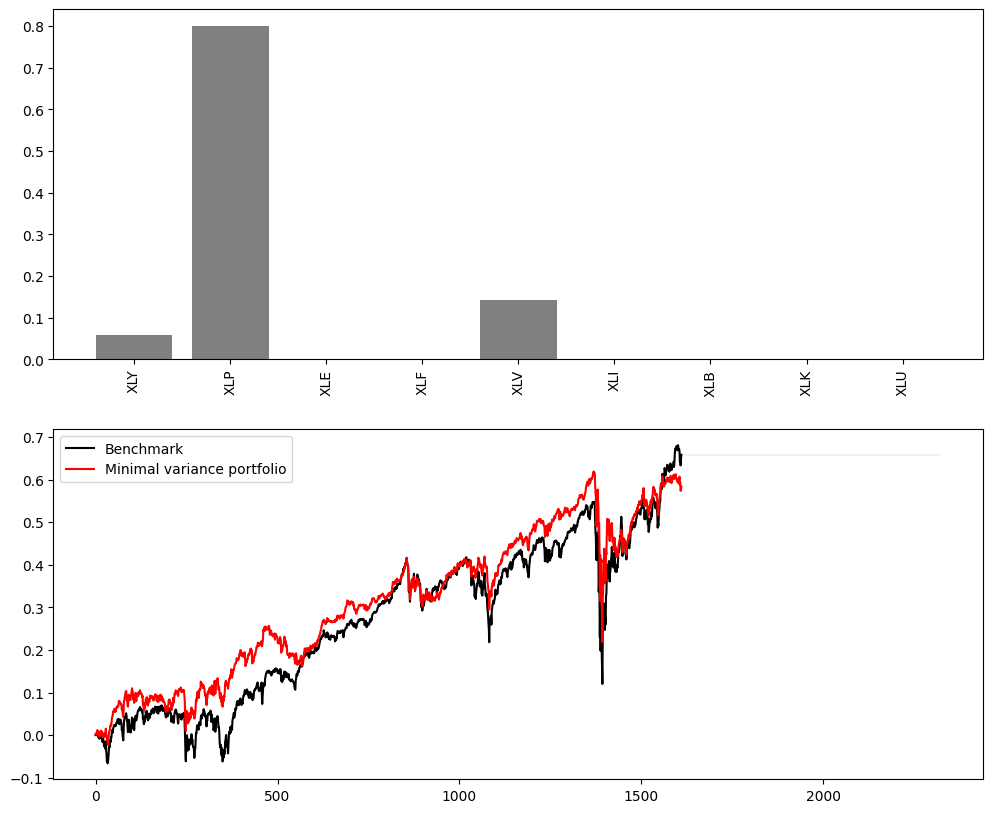

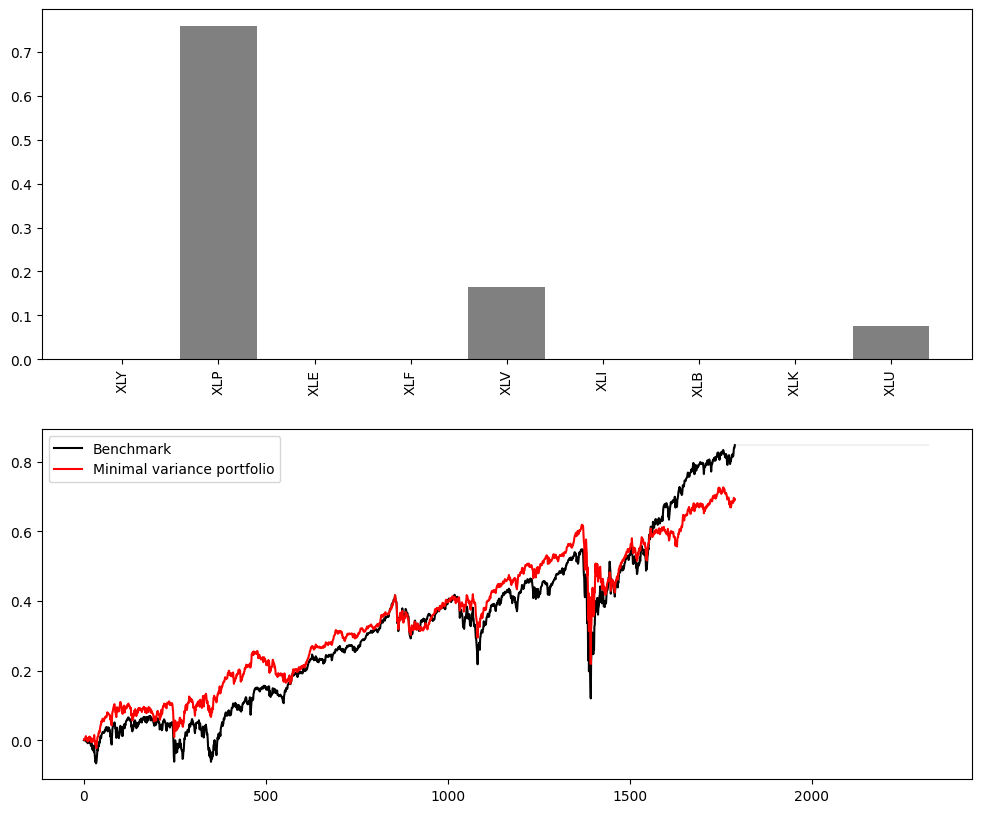

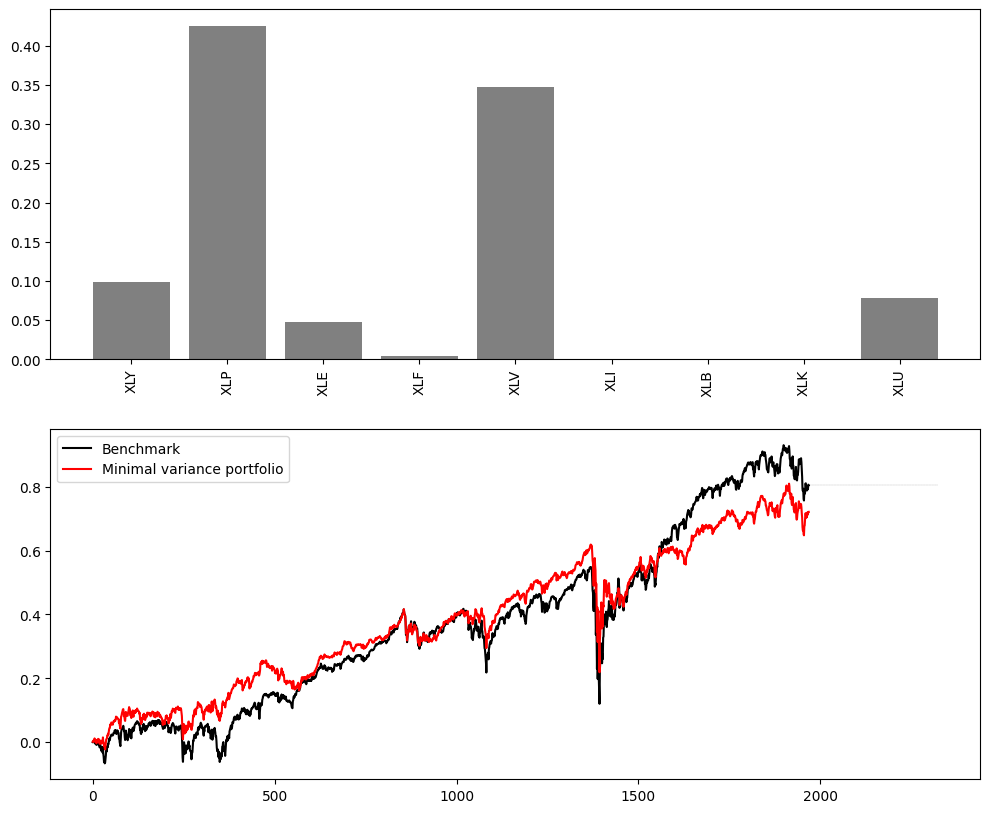

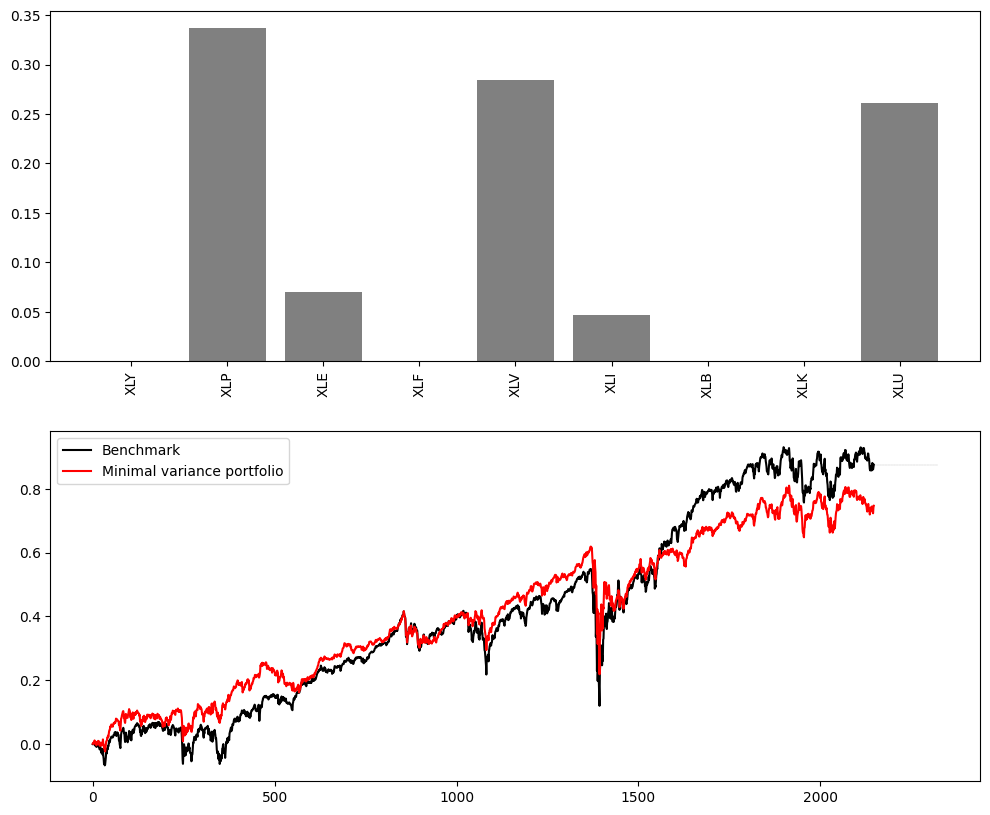

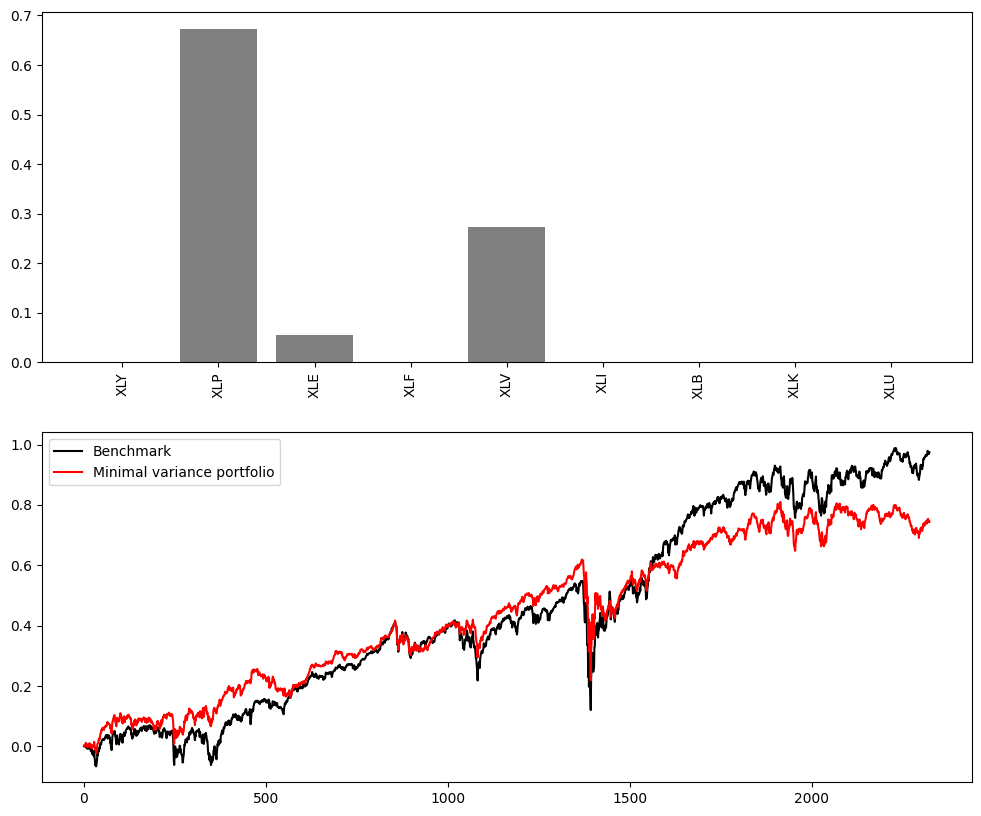

In [ ]:
plot_results(result_equal1,
             result_minvar1,
             actions_minvar1,
             N_ASSETS1,
             state1.columns.tolist(),
             'Minimal variance portfolio', './images_etf/minvar1/', 'series')

#### Maximum Sharpe Portfolio

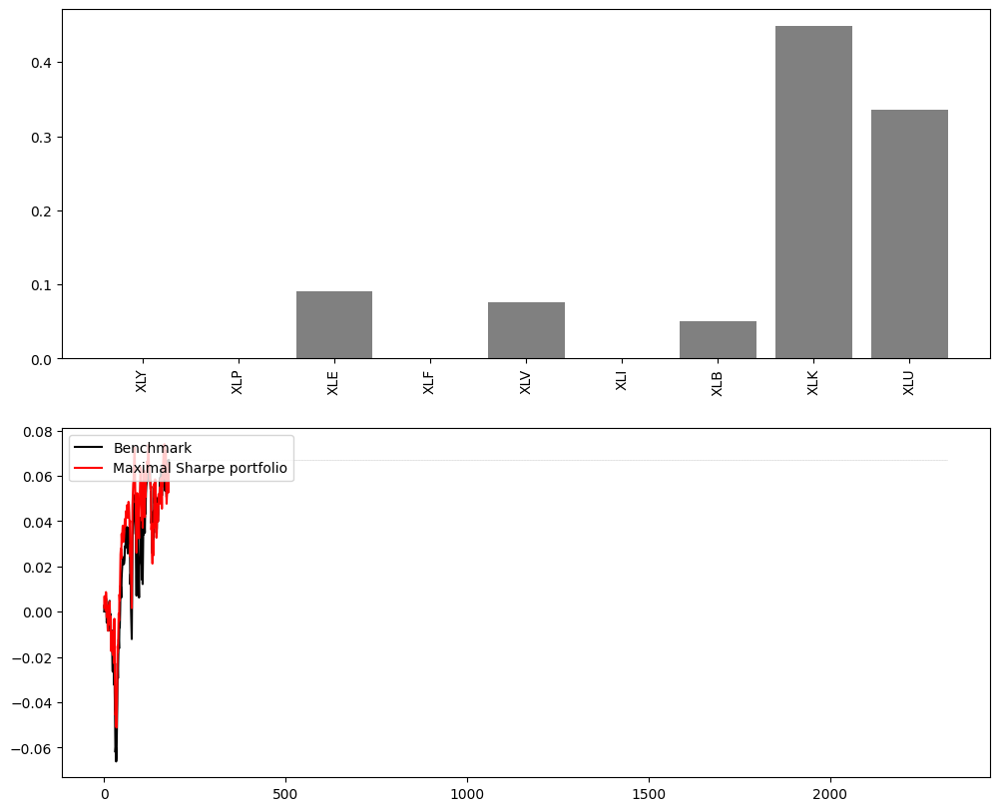

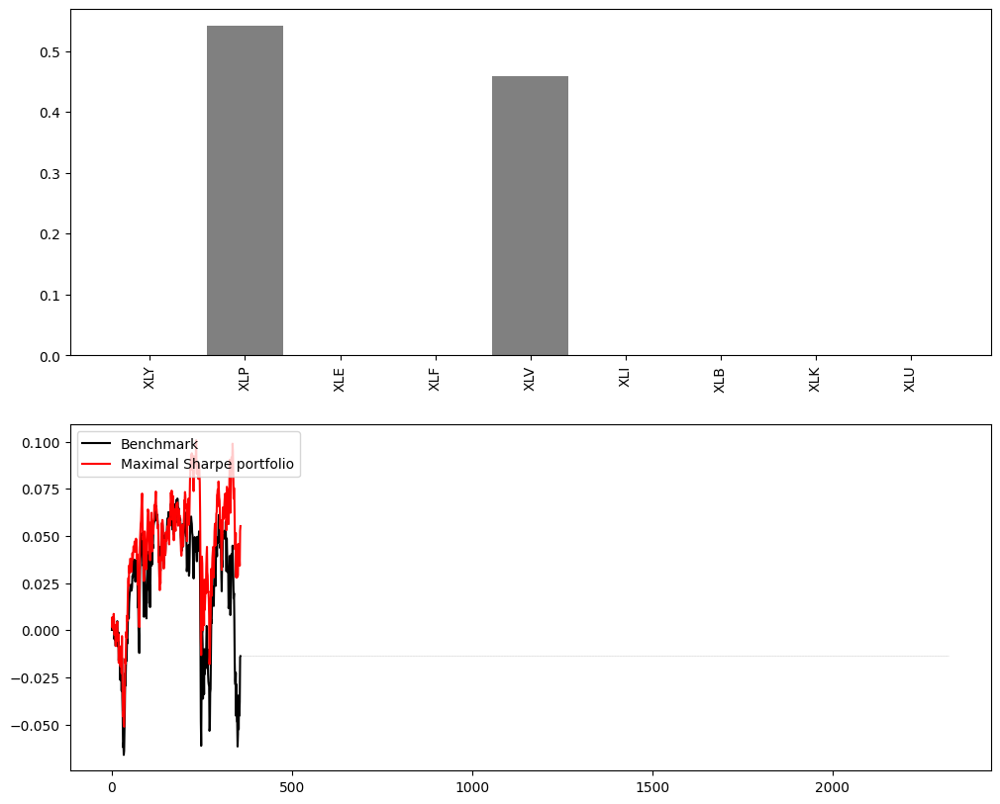

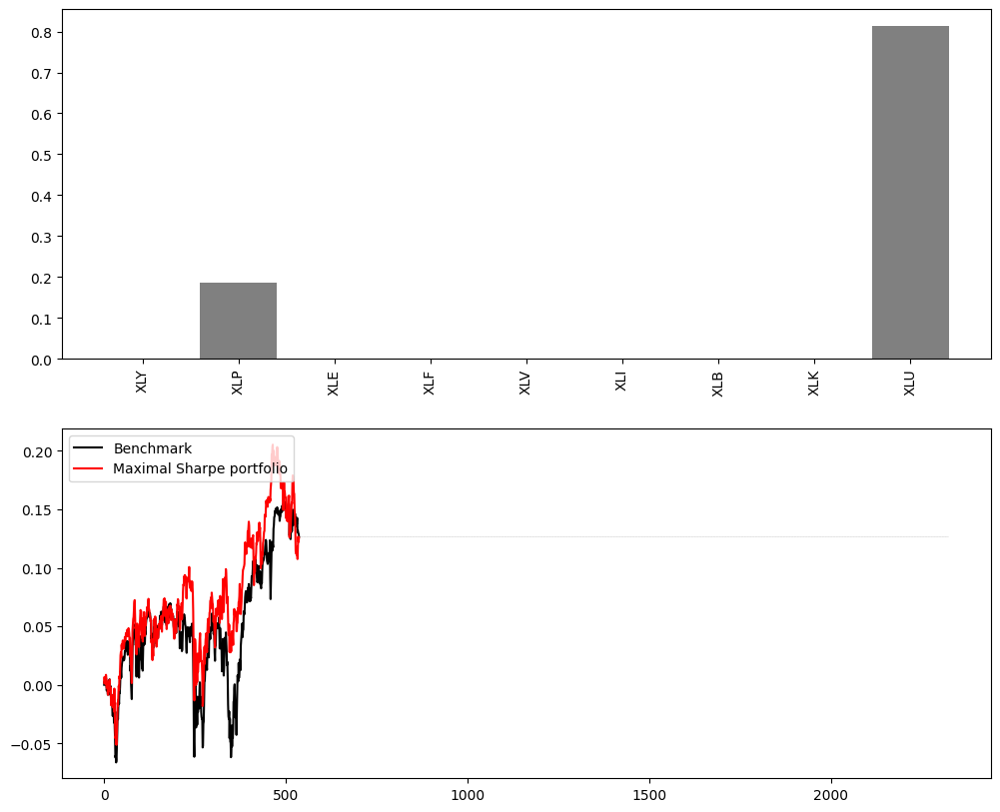

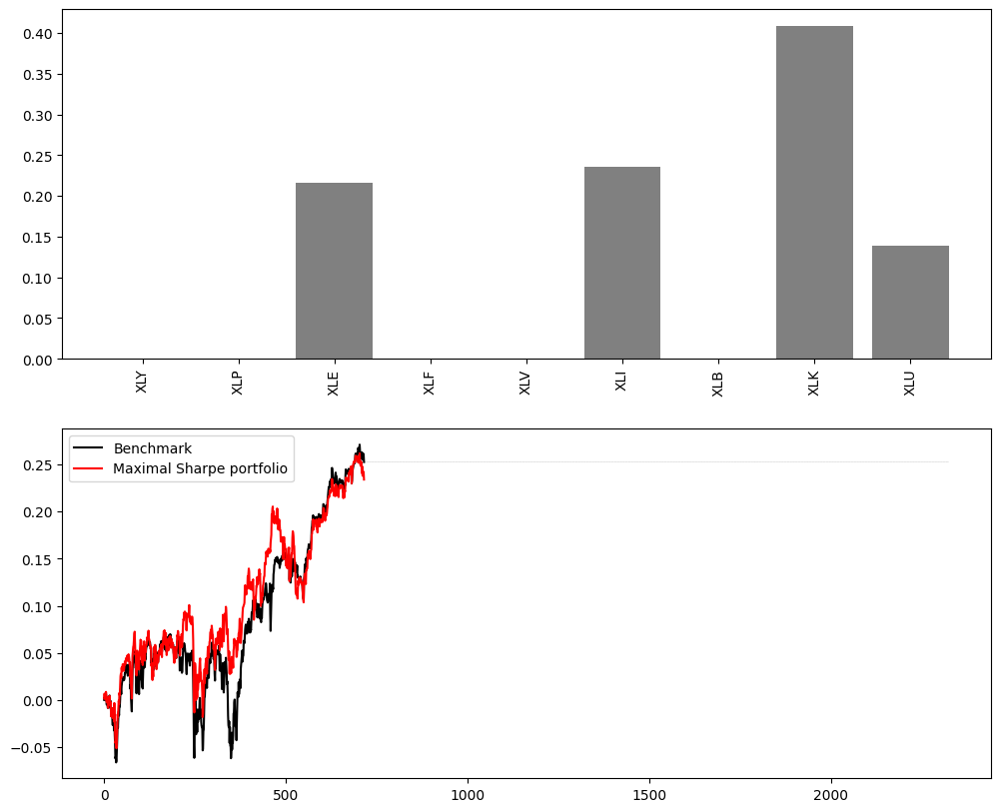

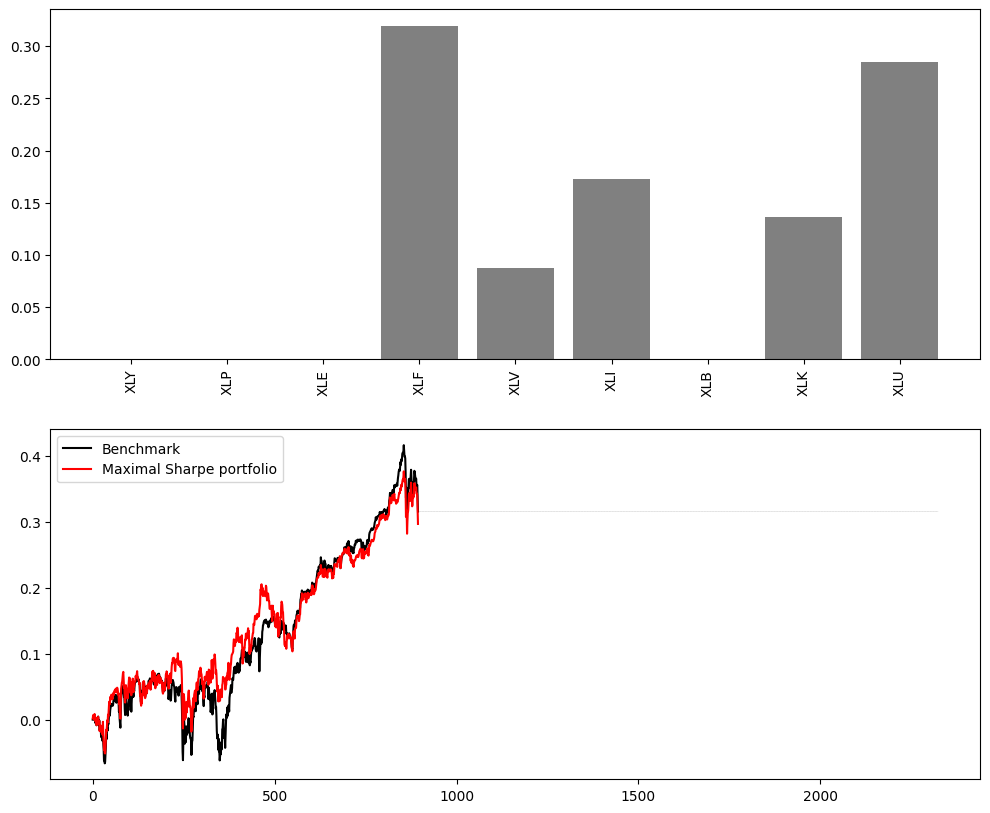

...

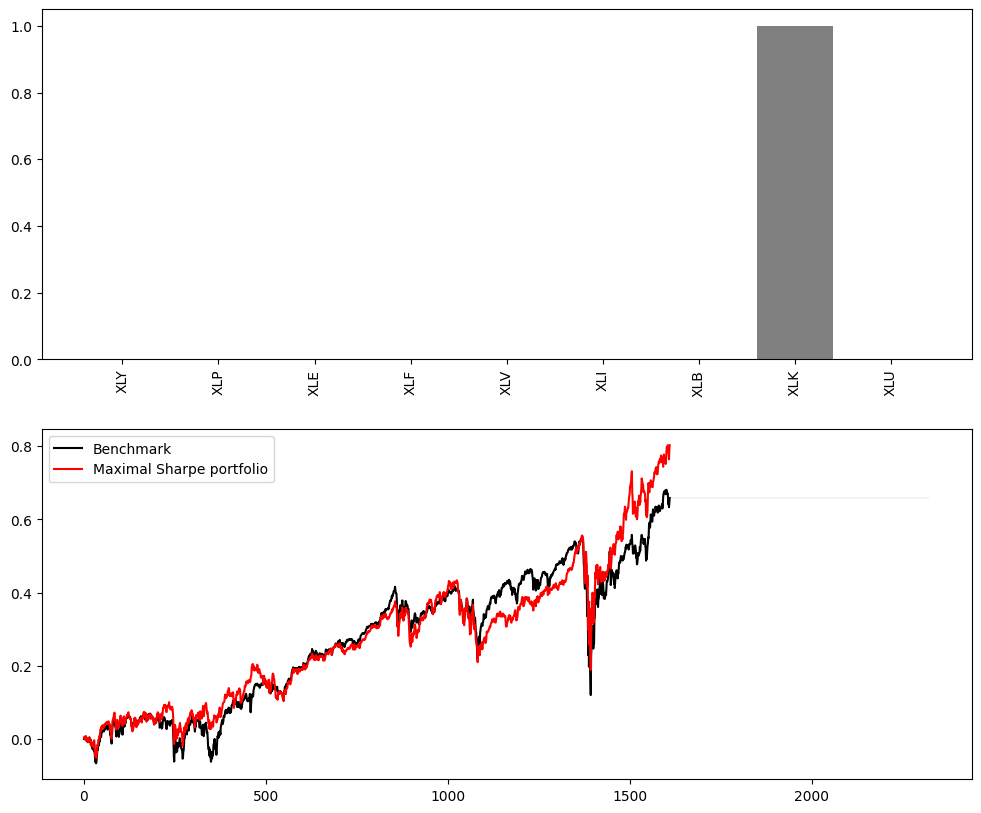

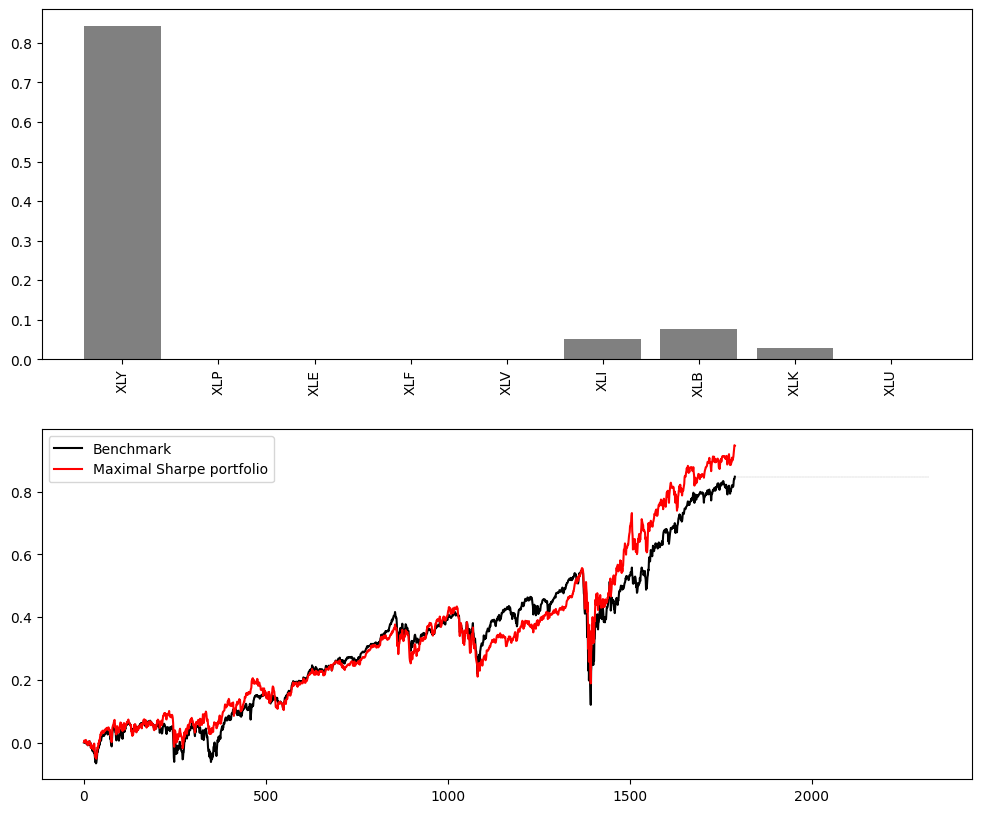

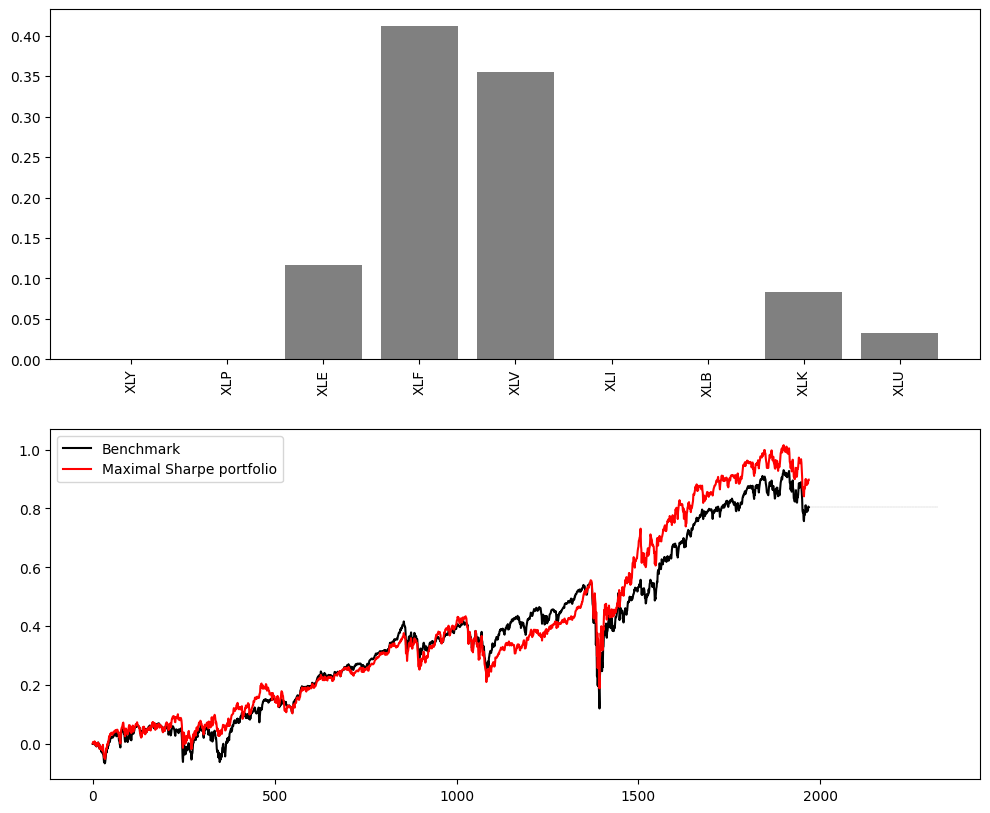

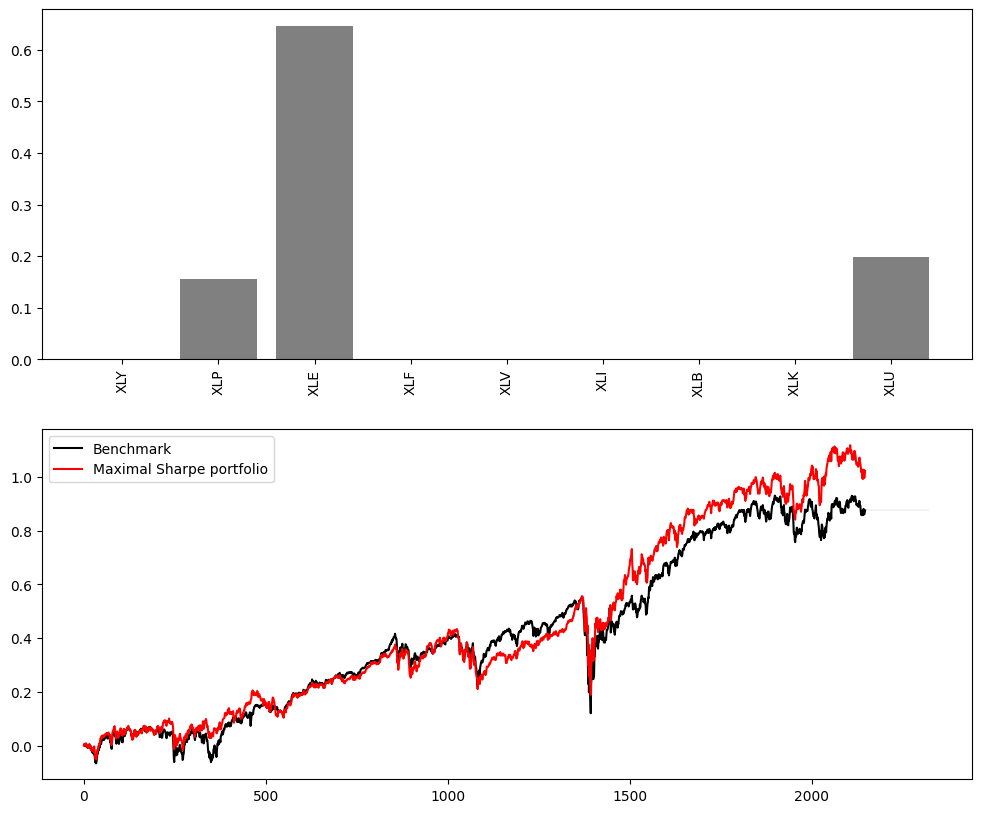

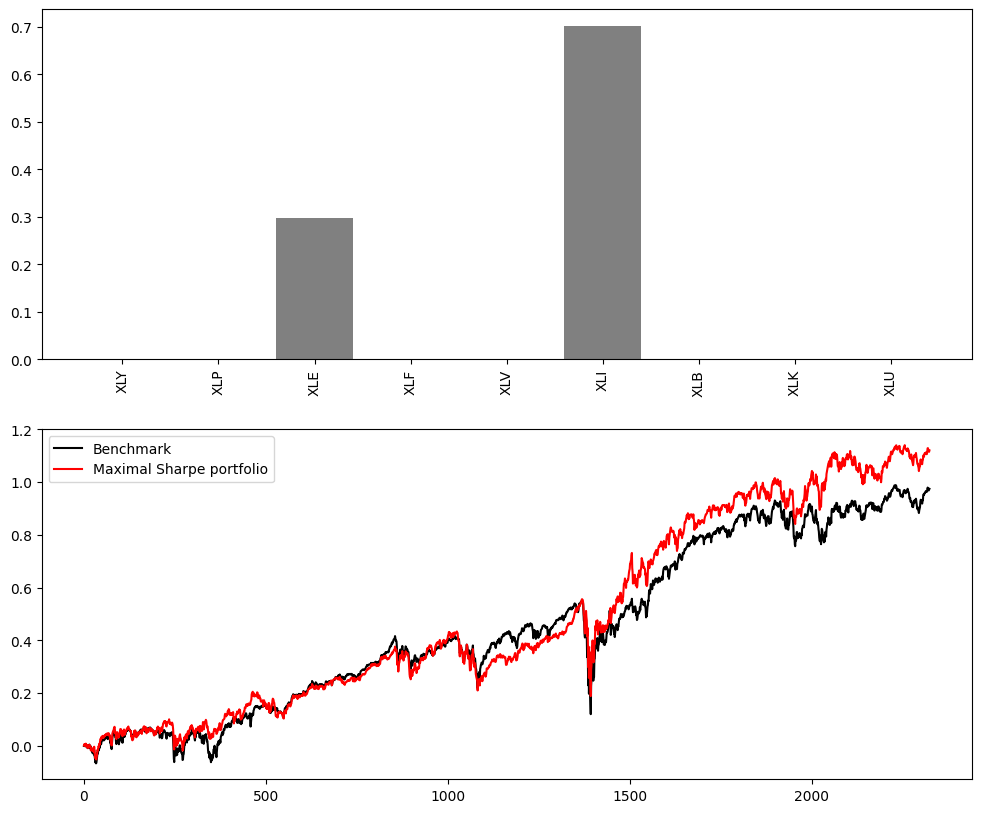

In [ ]:
plot_results(result_equal1,
             result_maxsharpe1,
             actions_maxsharpe1,
             N_ASSETS1,
             state1.columns.tolist(),
             'Maximal Sharpe portfolio', './images_etf/sharpe1/', 'series')

#### Maximum Decorrelation Portfolio

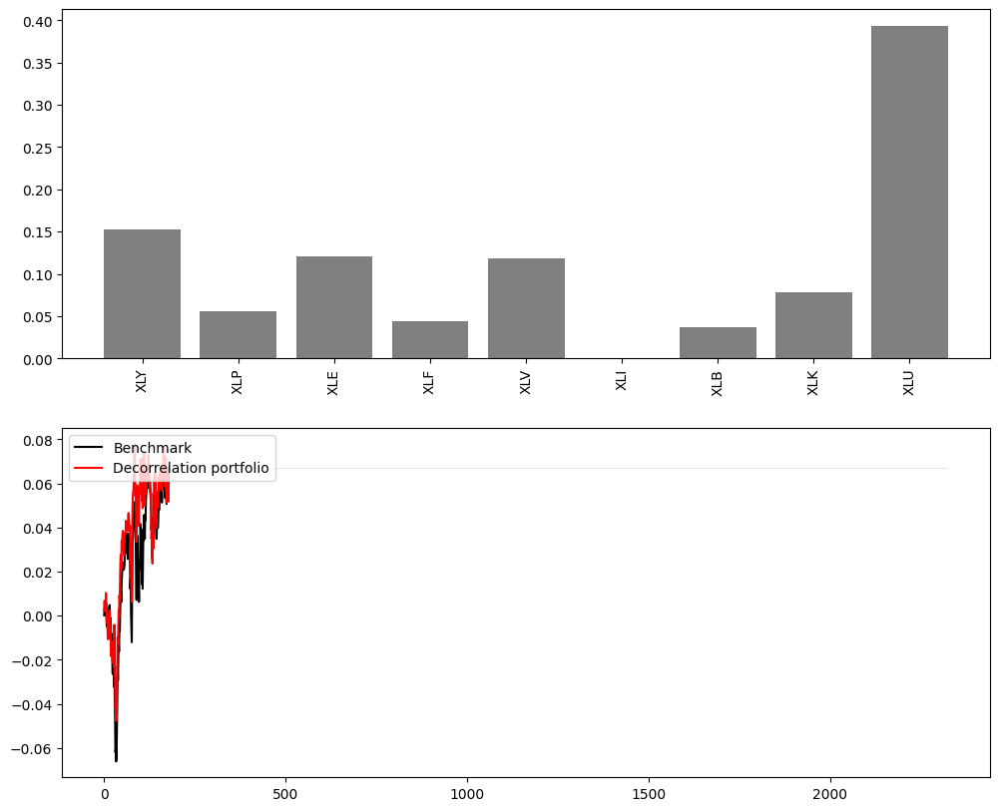

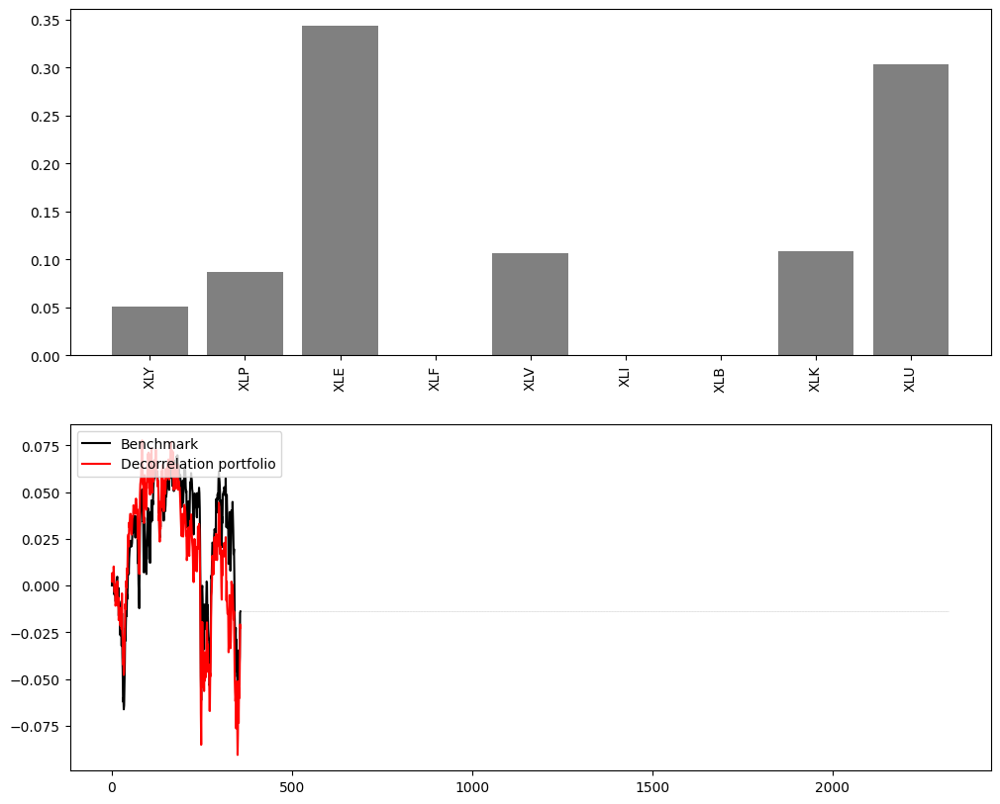

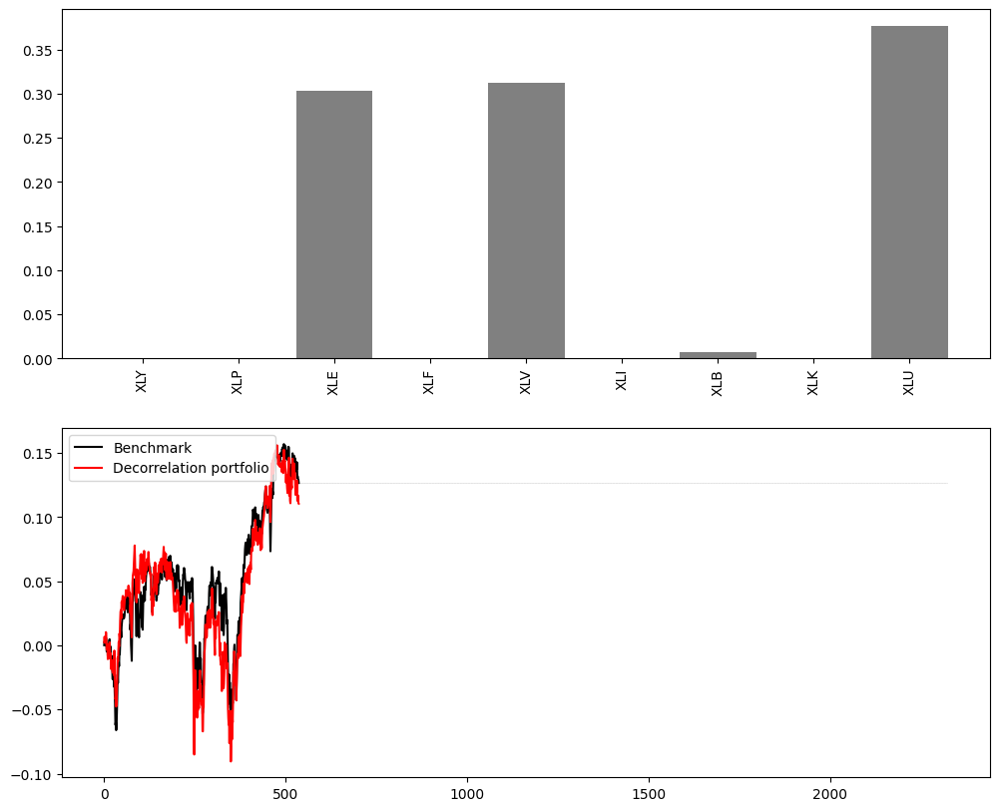

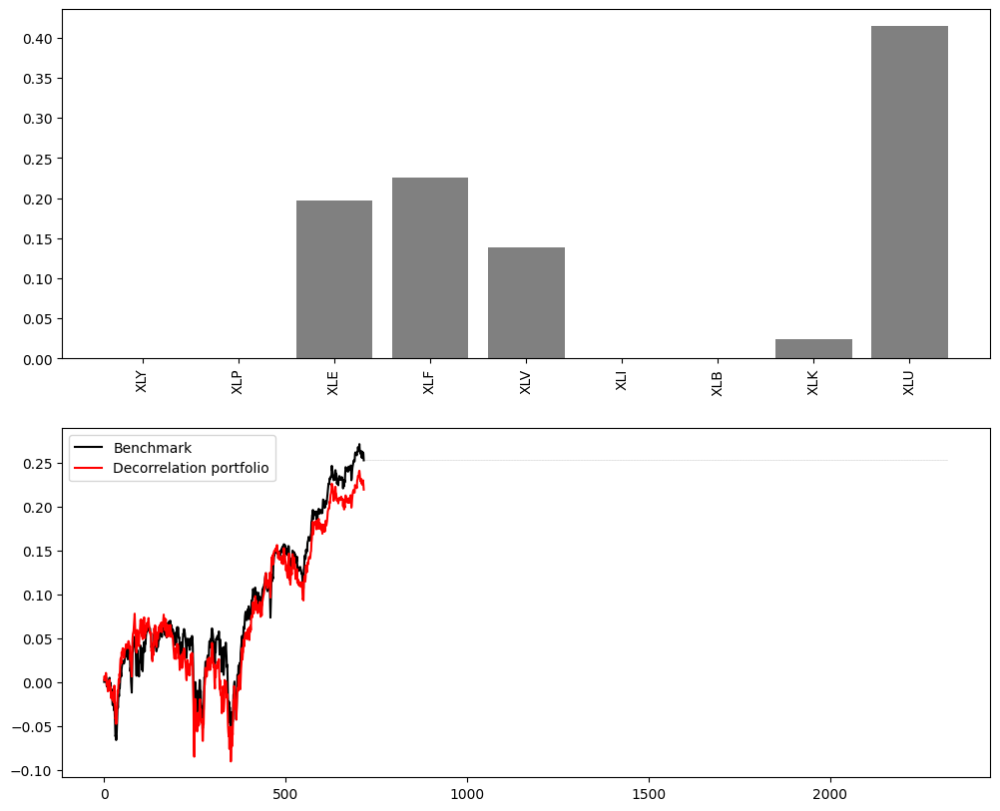

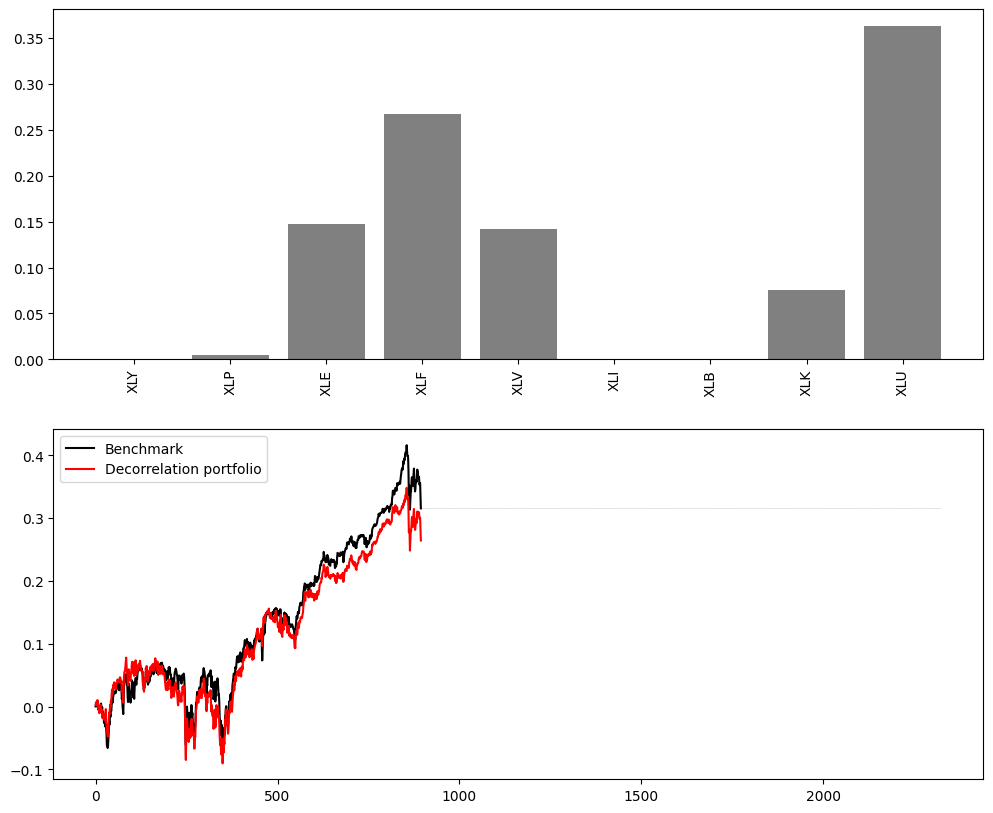

...

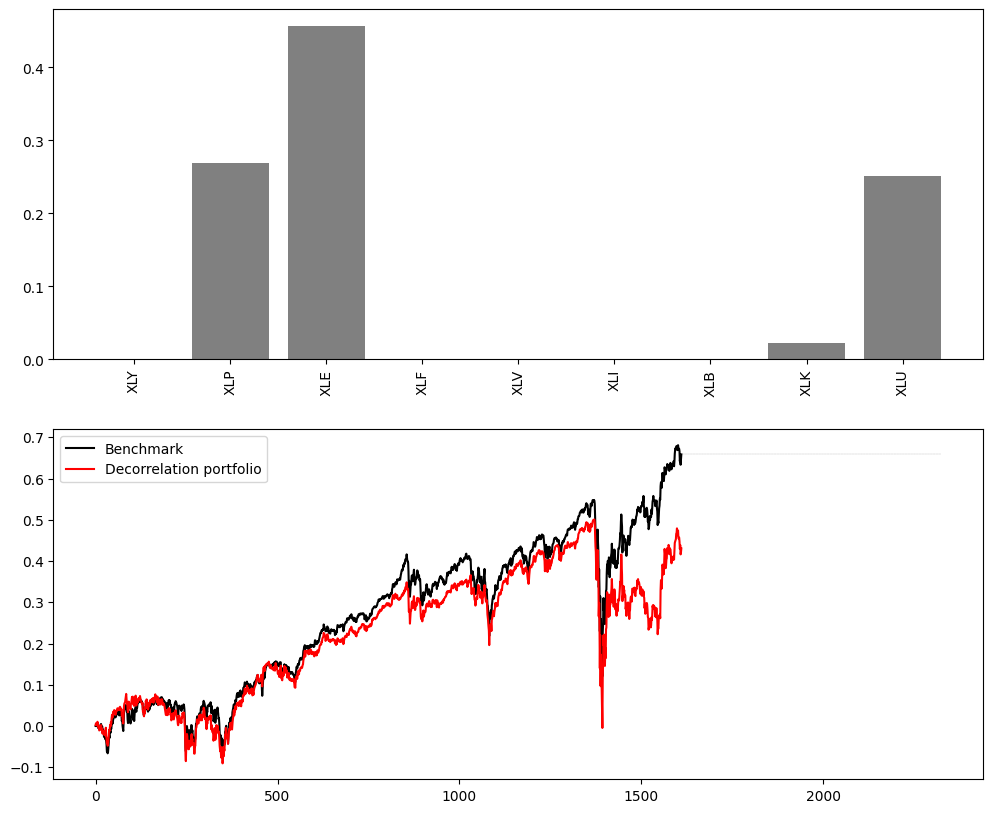

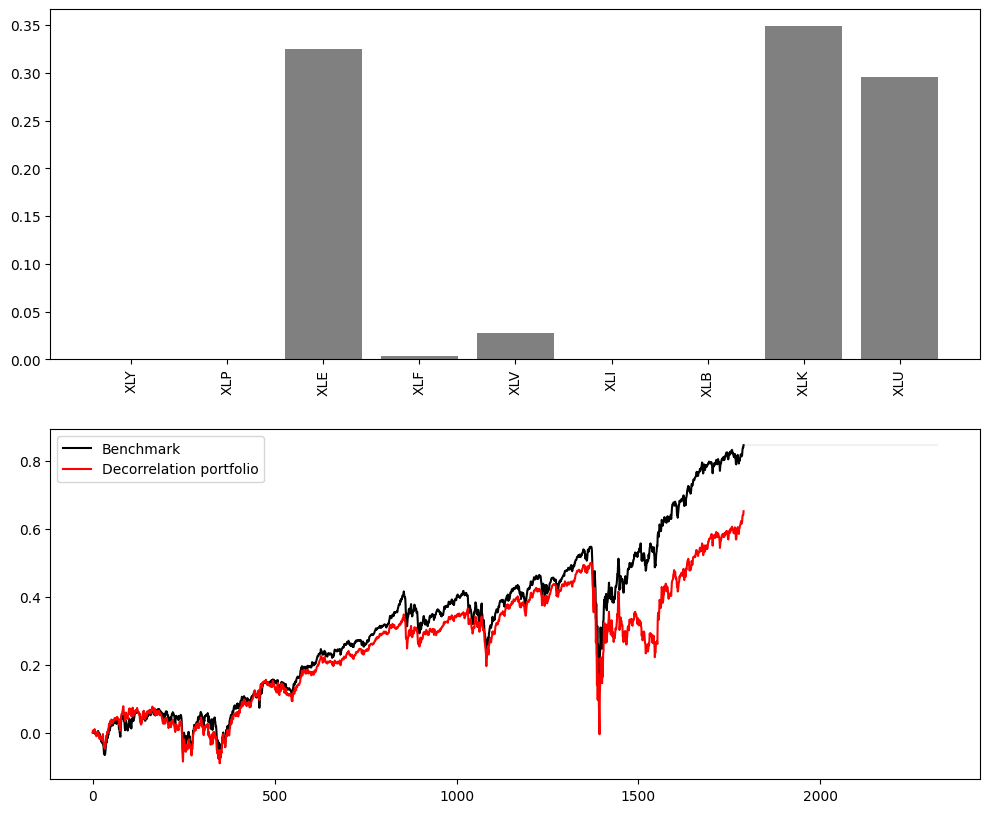

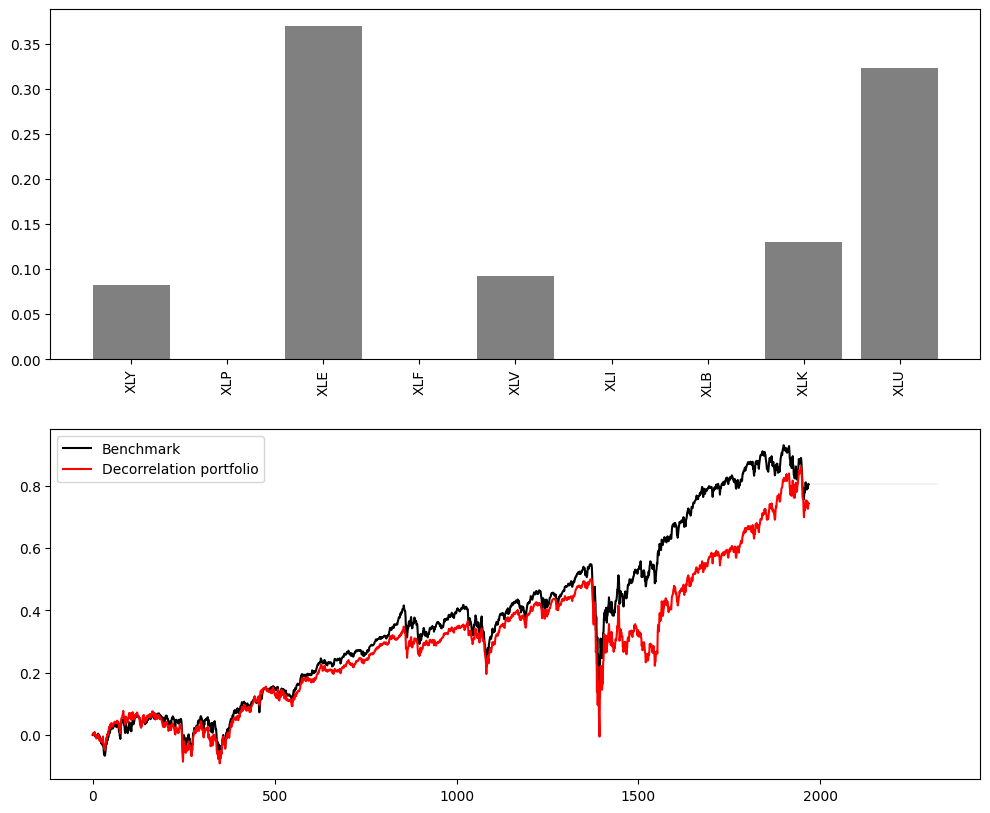

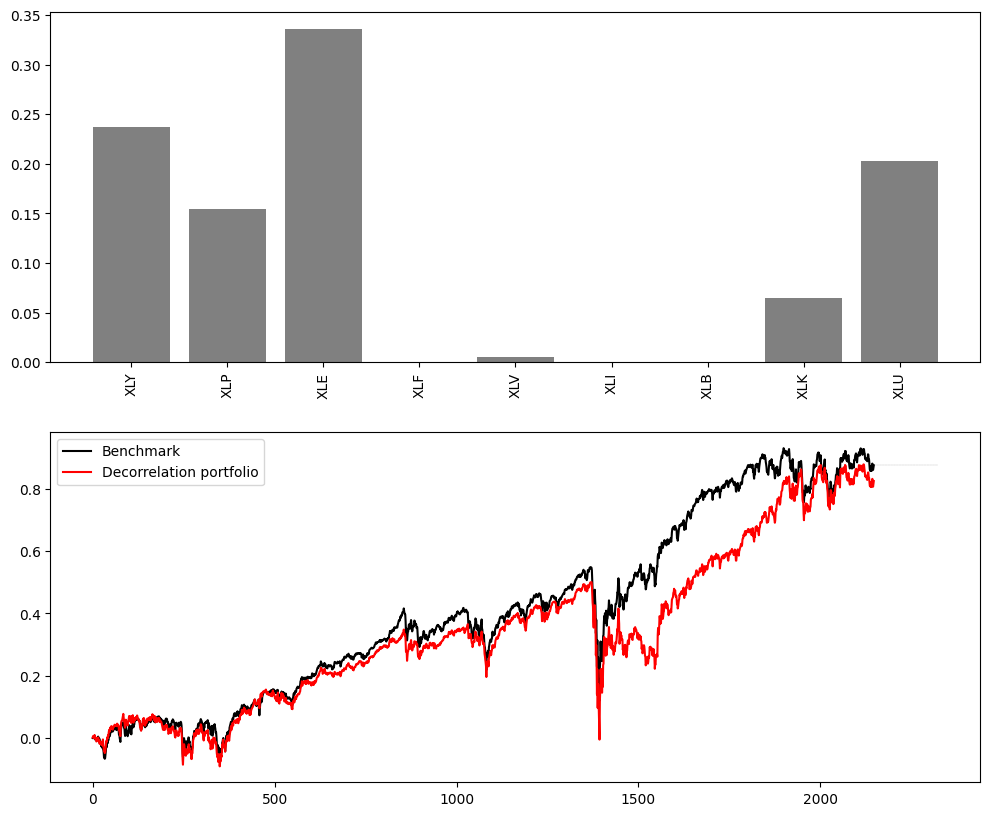

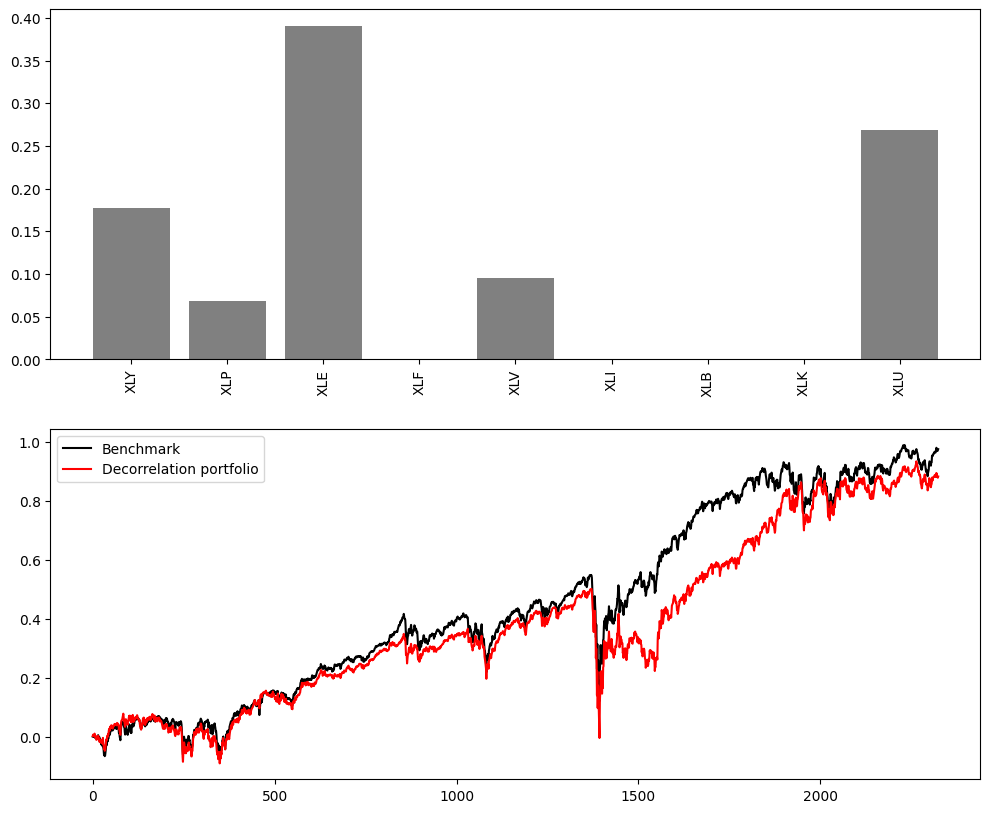

In [ ]:
plot_results(result_equal1,
             result_maxdecorr1,
             actions_maxdecorr1,
             N_ASSETS1,
             state1.columns.tolist(),
             'Decorrelation portfolio', './images_etf/decorr1/', 'series')

### Machine Learning Optimizers

####PCA Portfolio

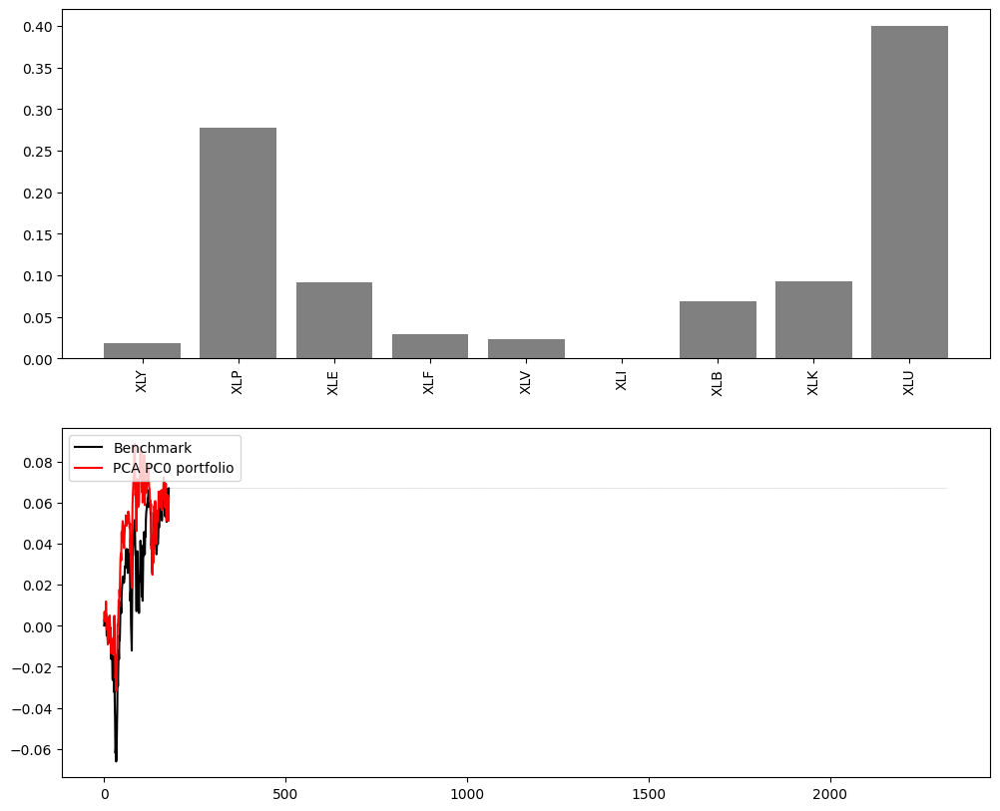

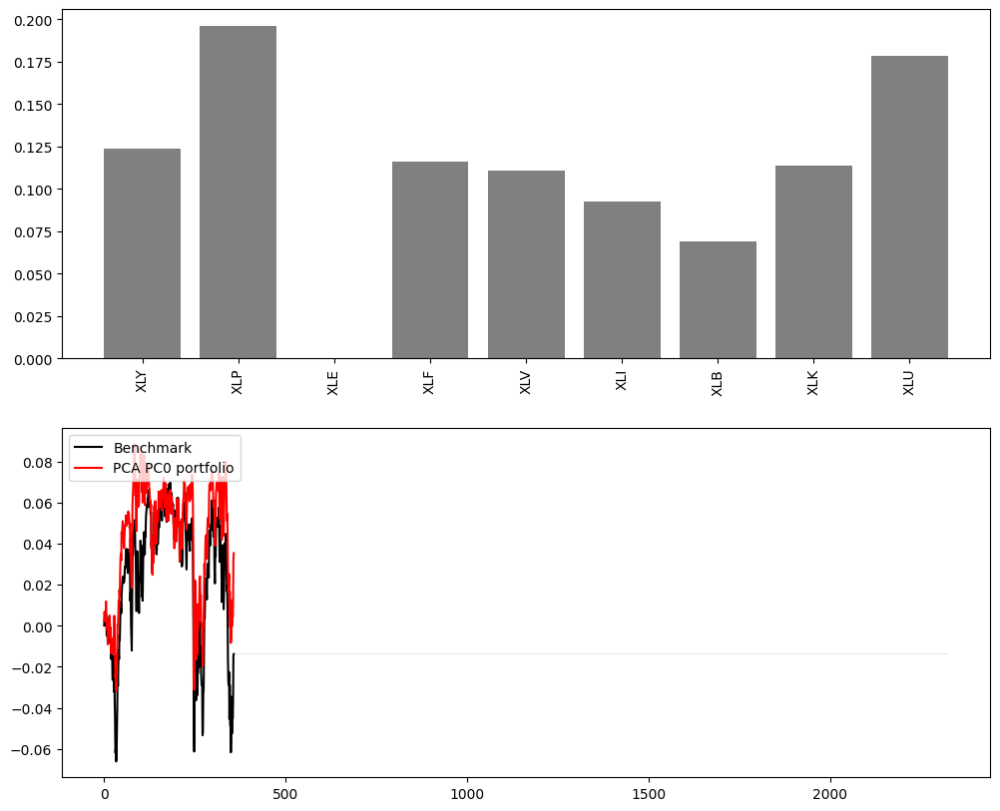

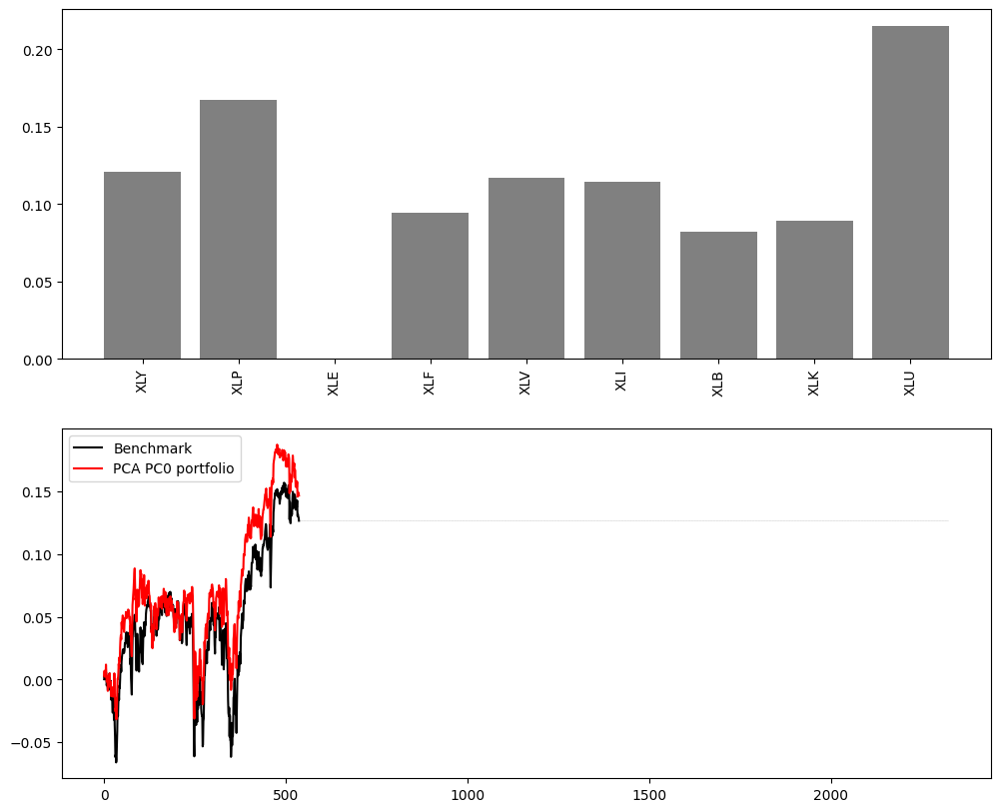

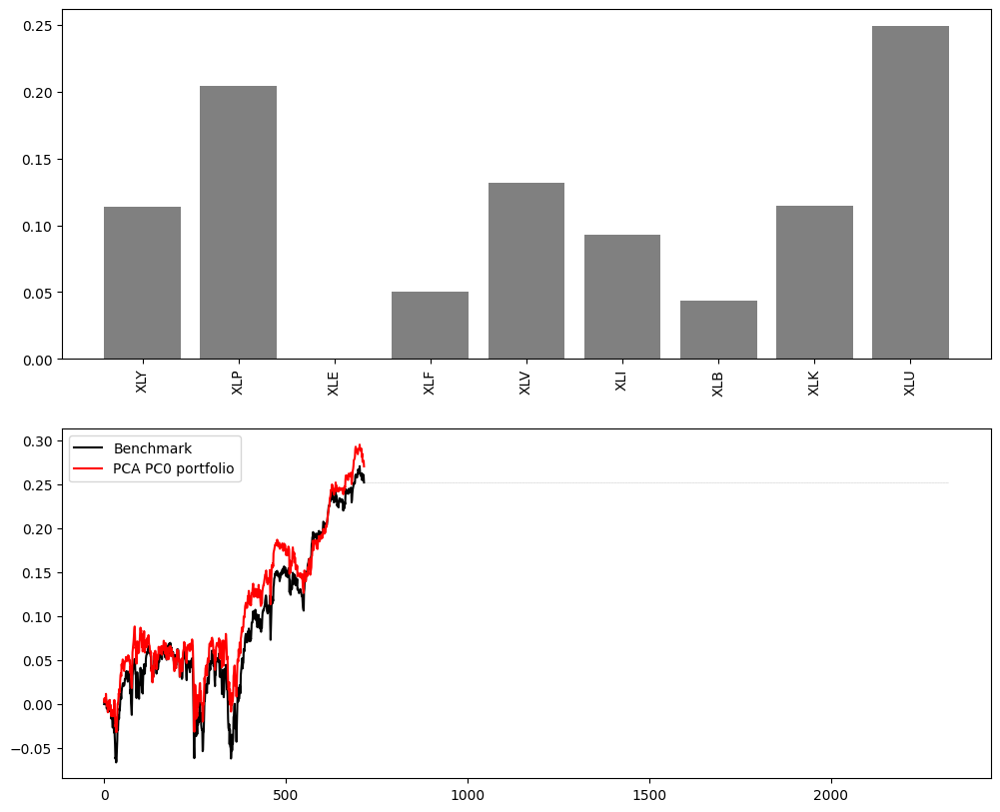

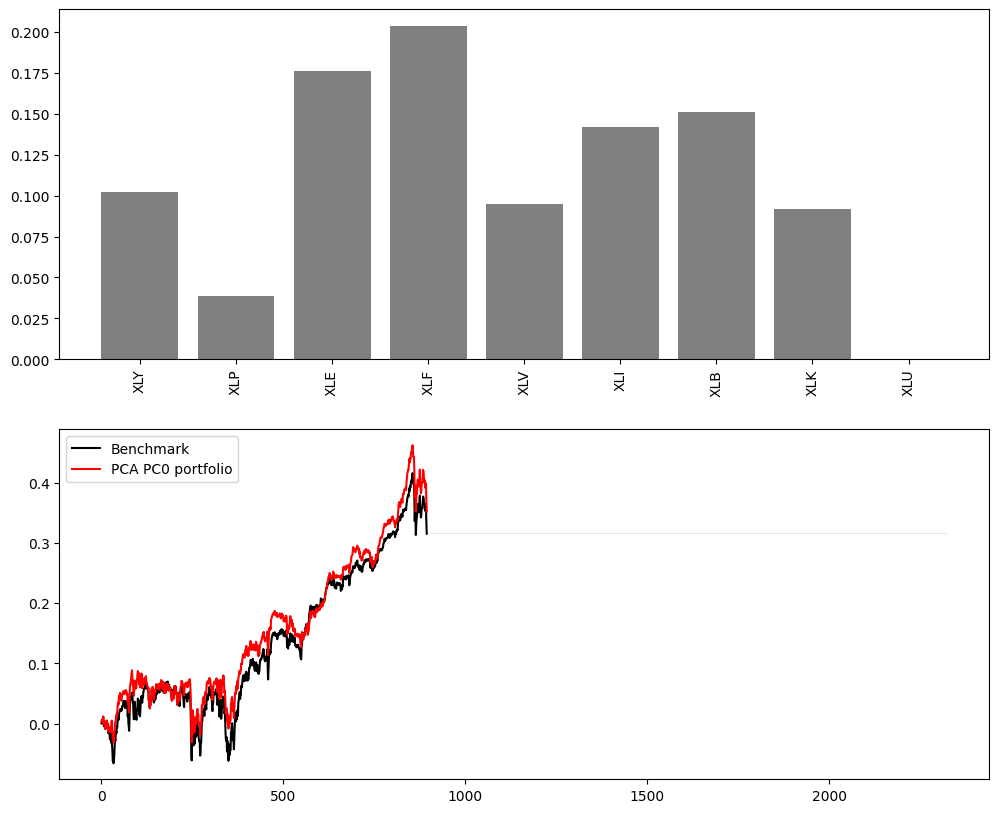

...

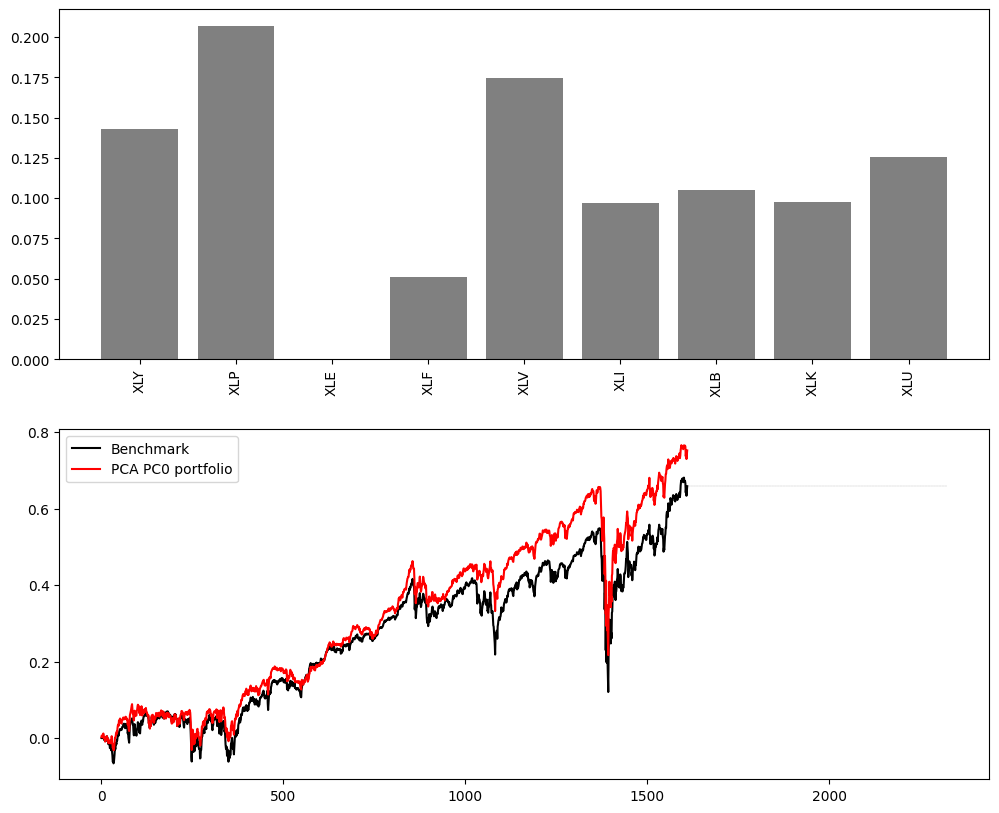

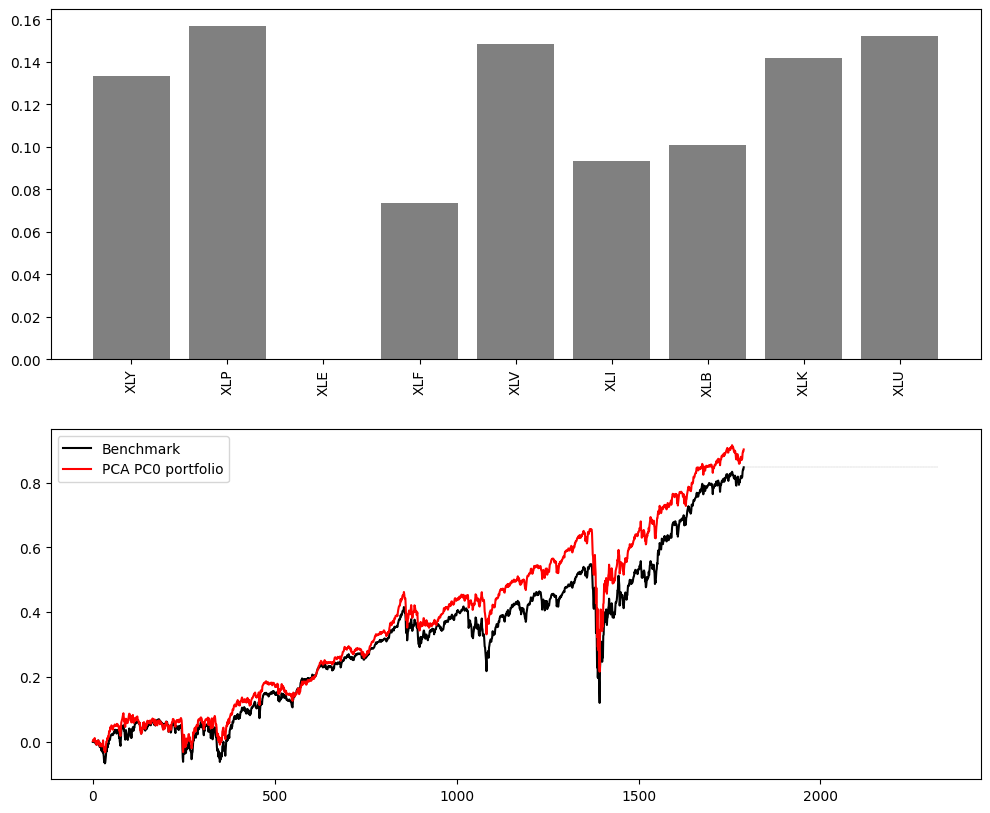

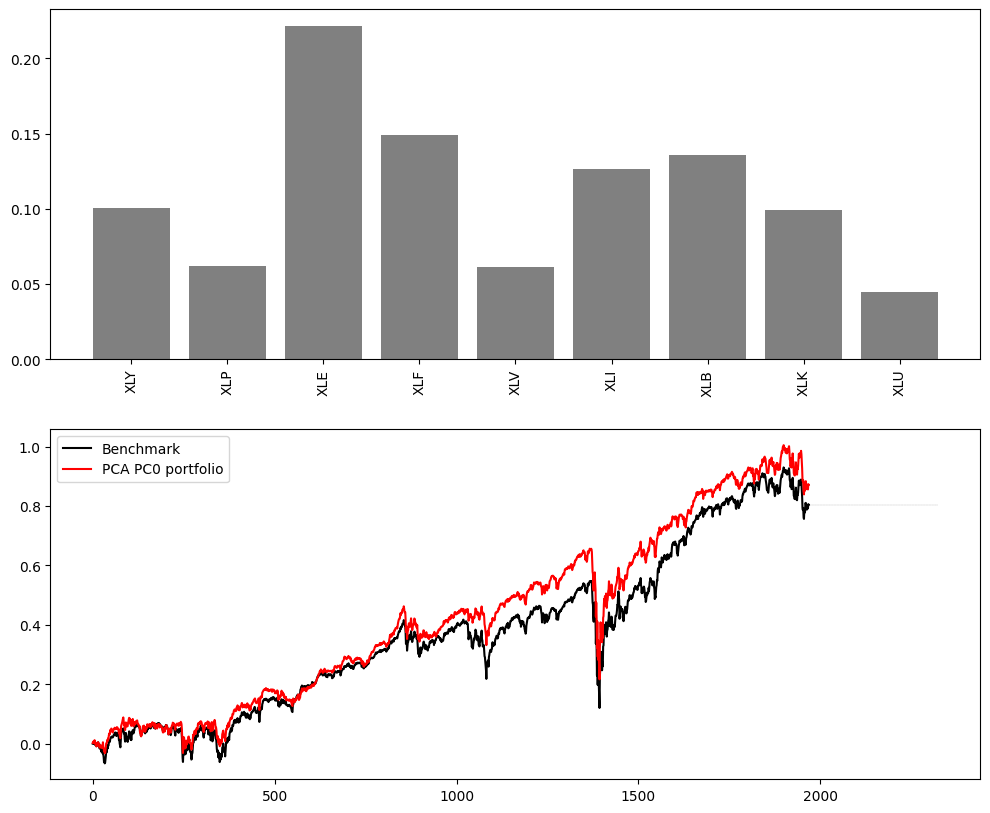

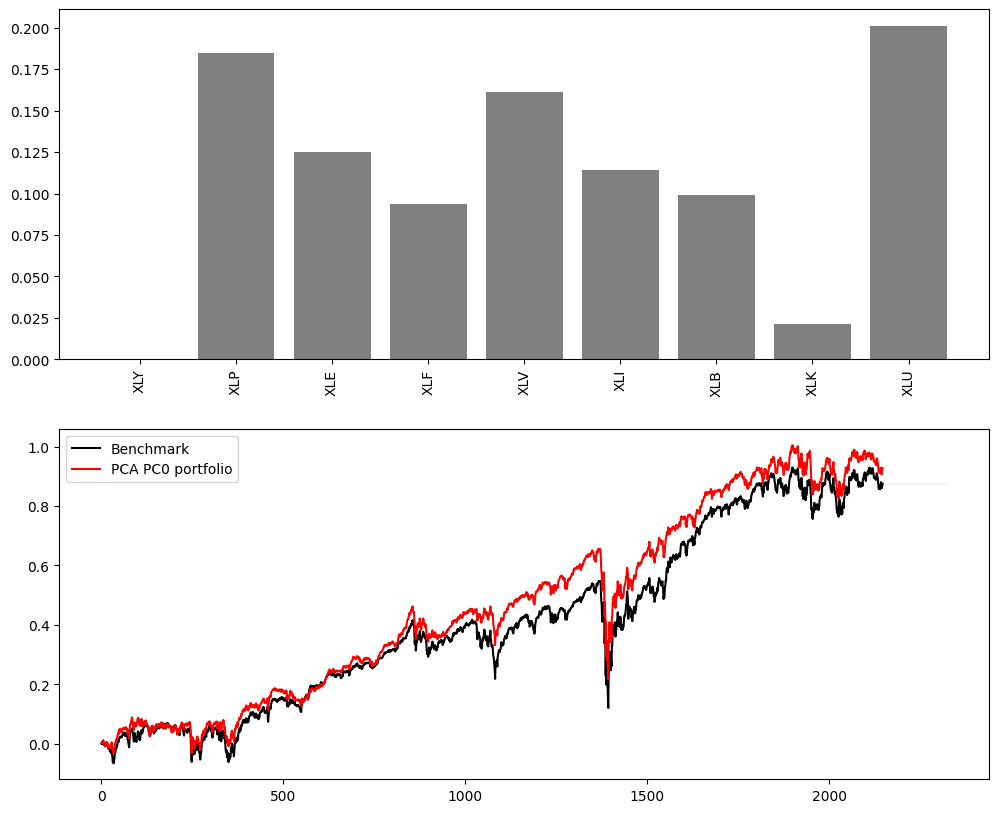

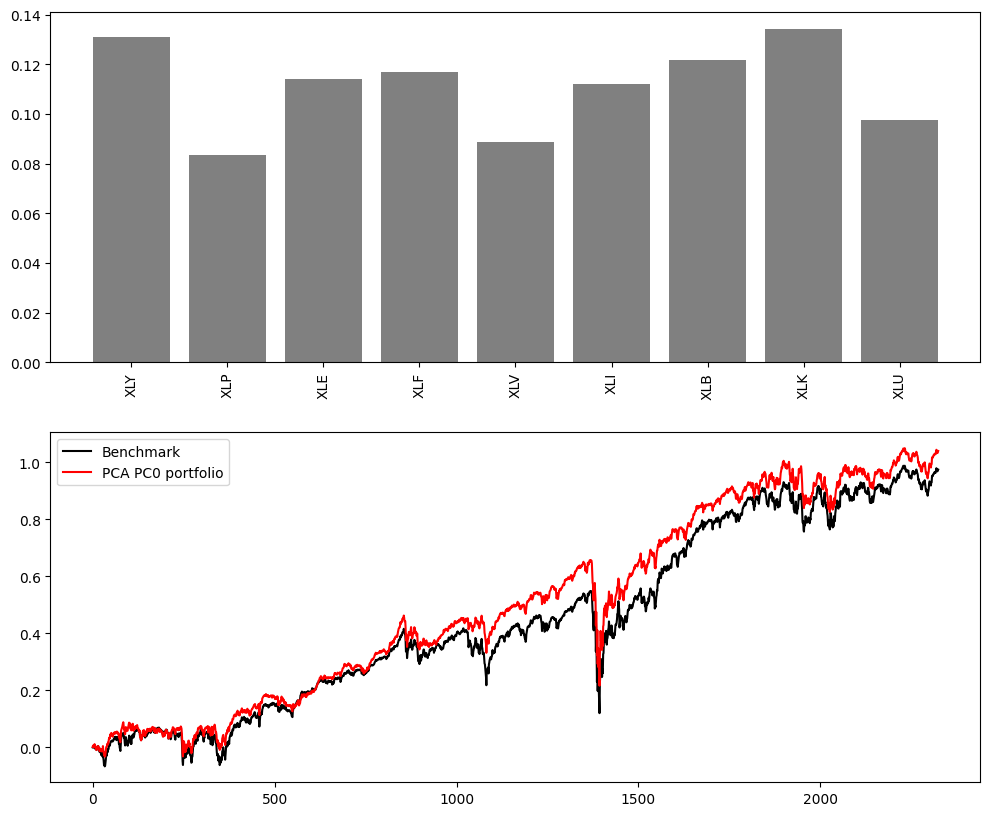

In [ ]:
plot_results(result_equal1,
             result_pca1,
             actions_pca1,
             N_ASSETS1,
             state1.columns,
             'PCA PC0 portfolio', './images_etf/pca1/', 'series')

####HRP Portfolio

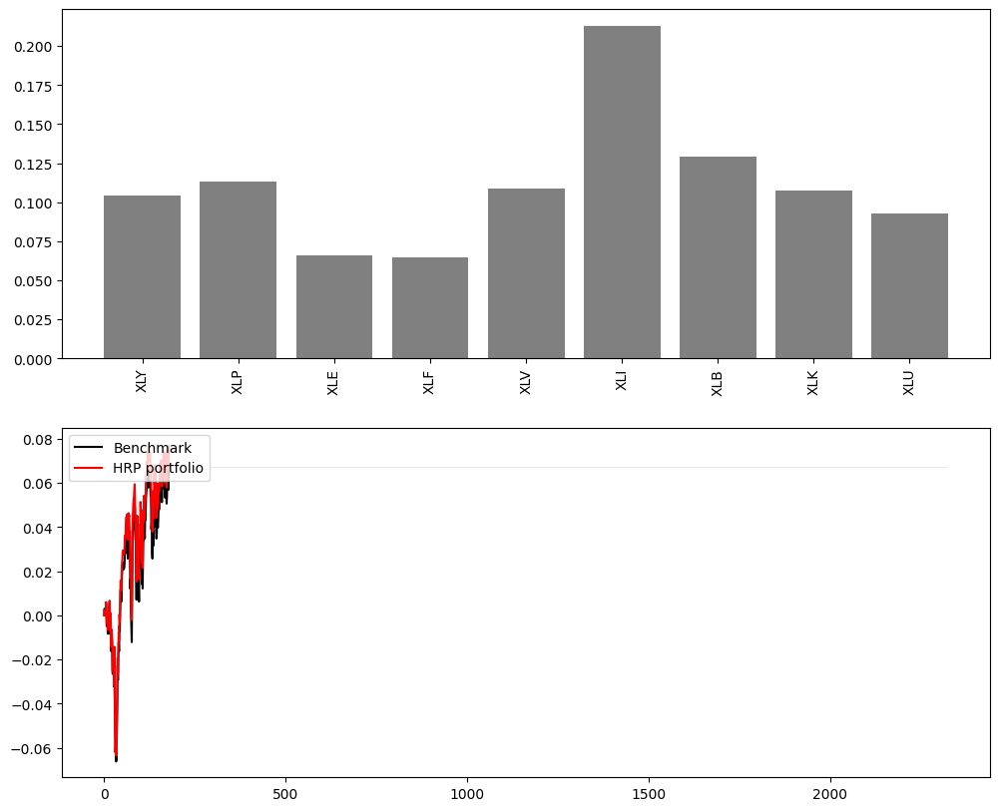

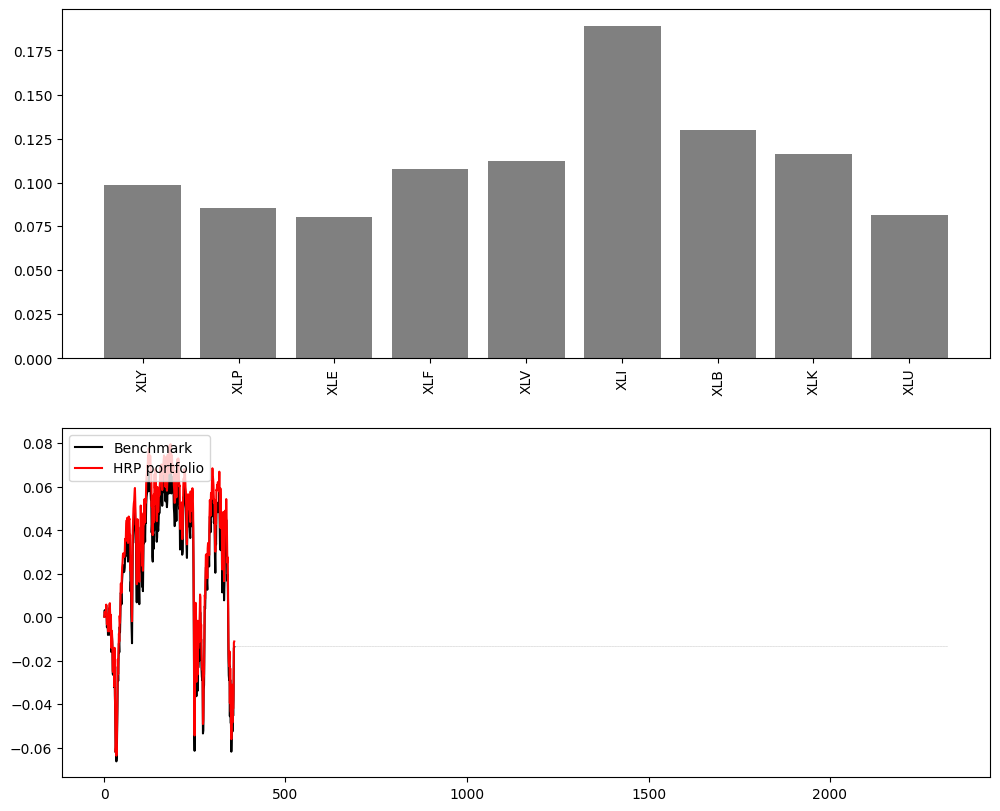

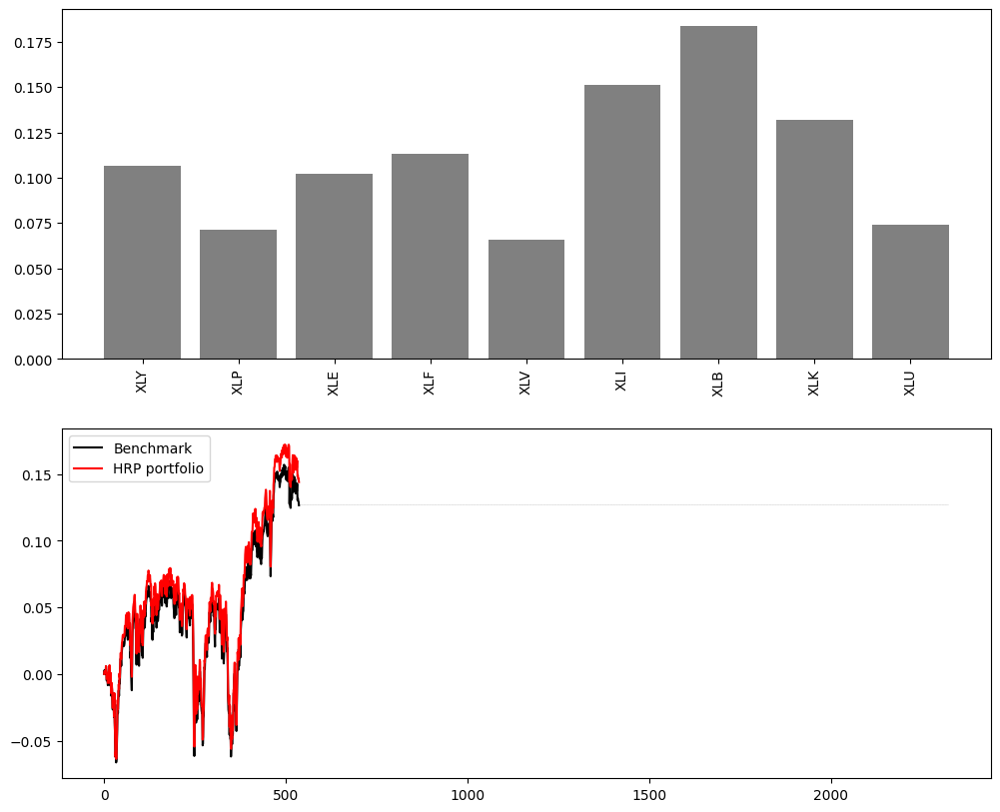

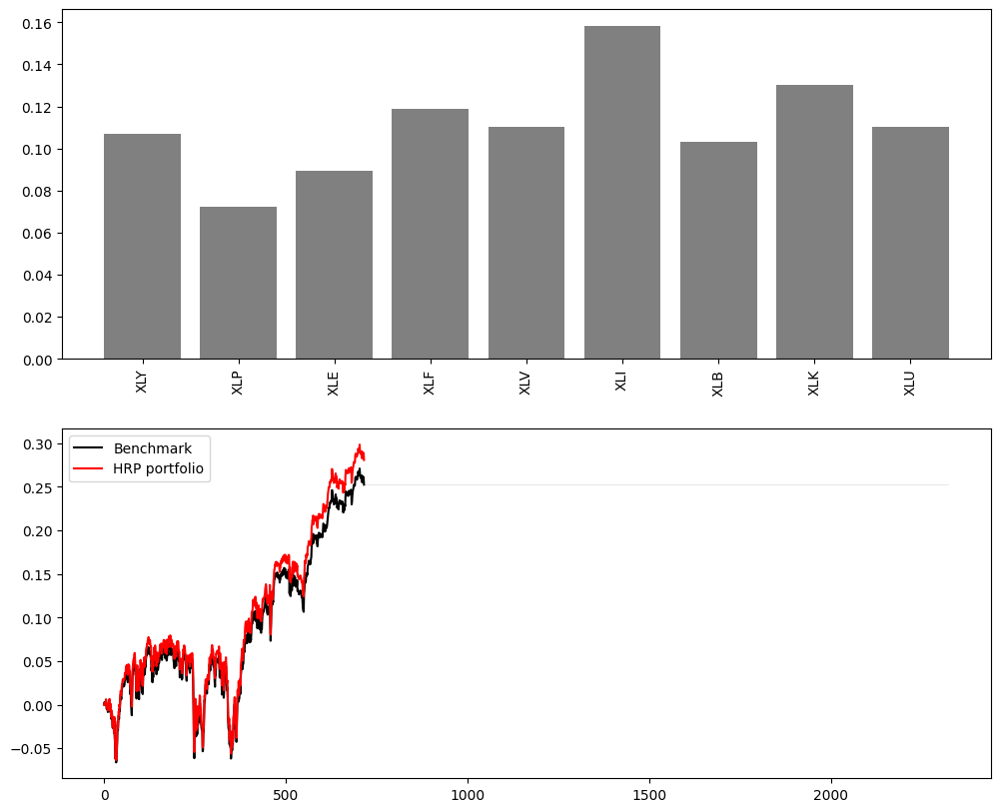

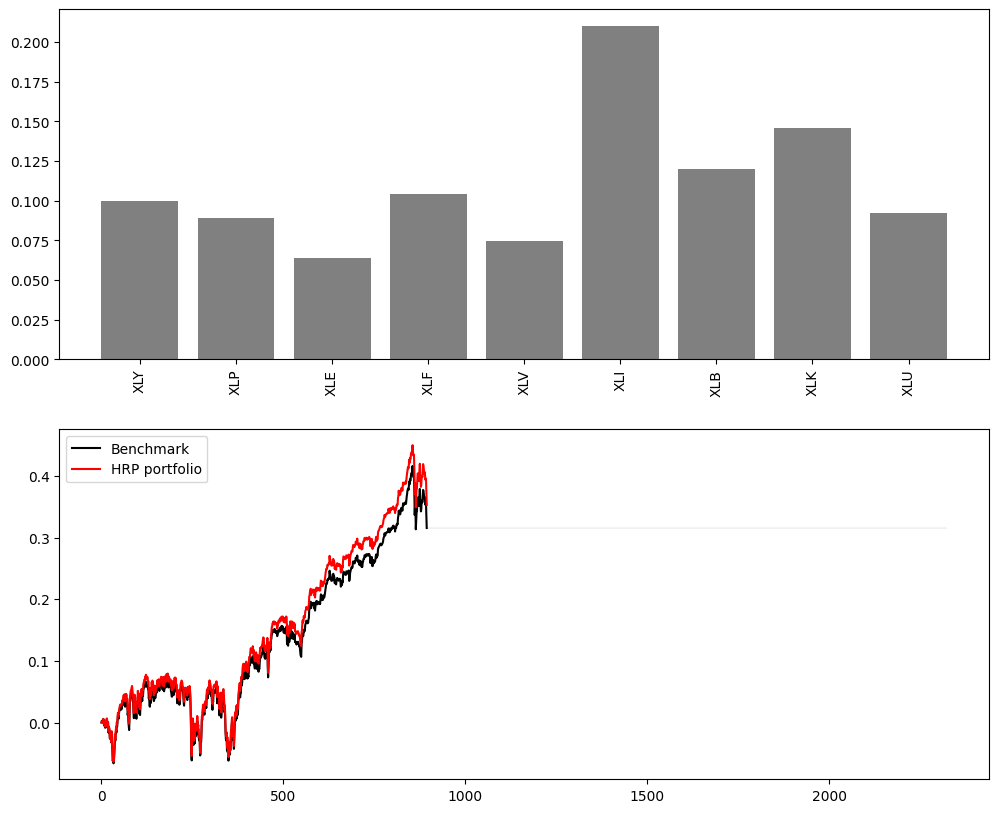

...

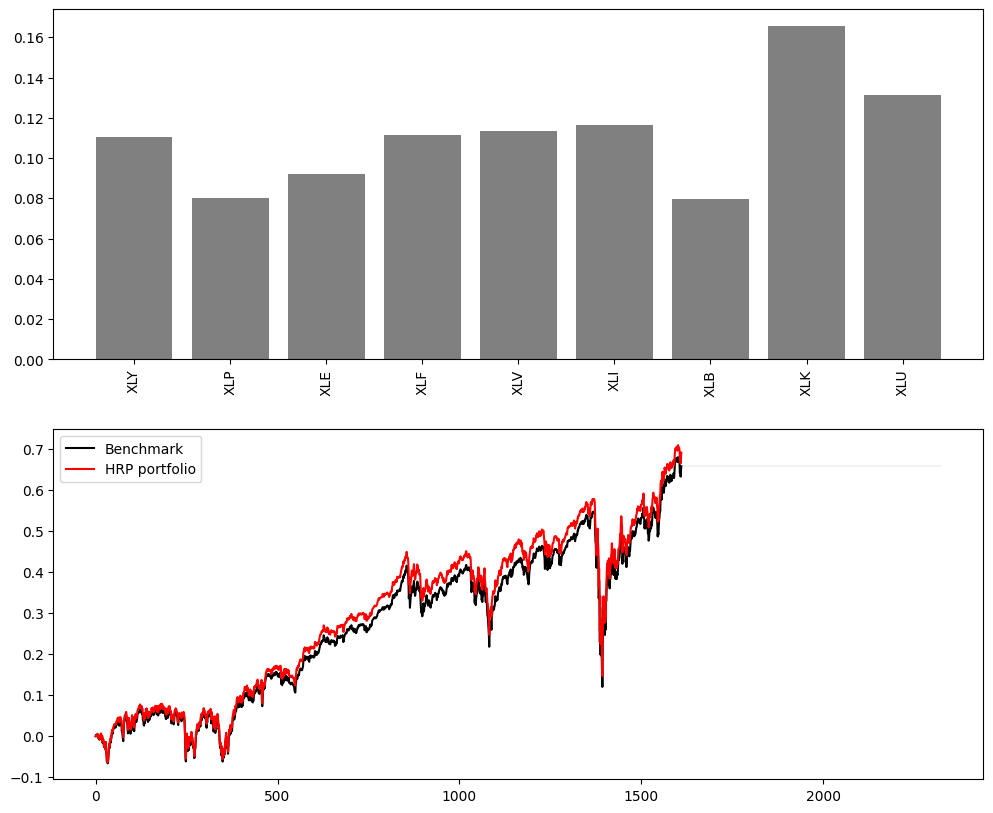

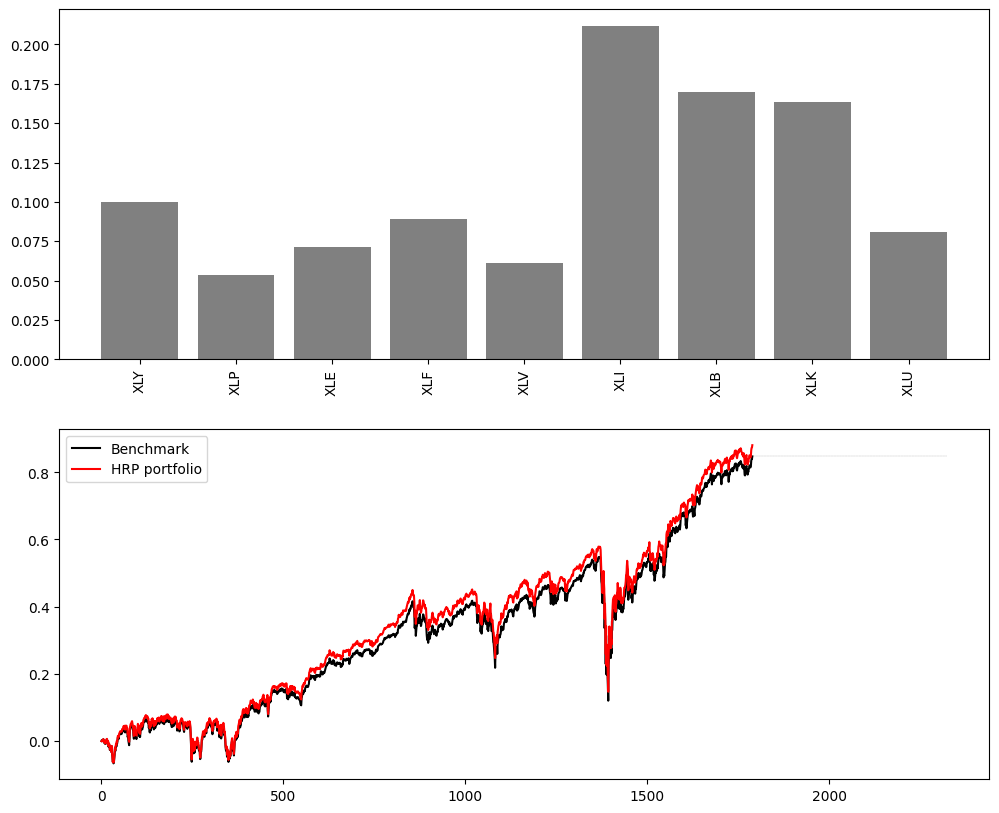

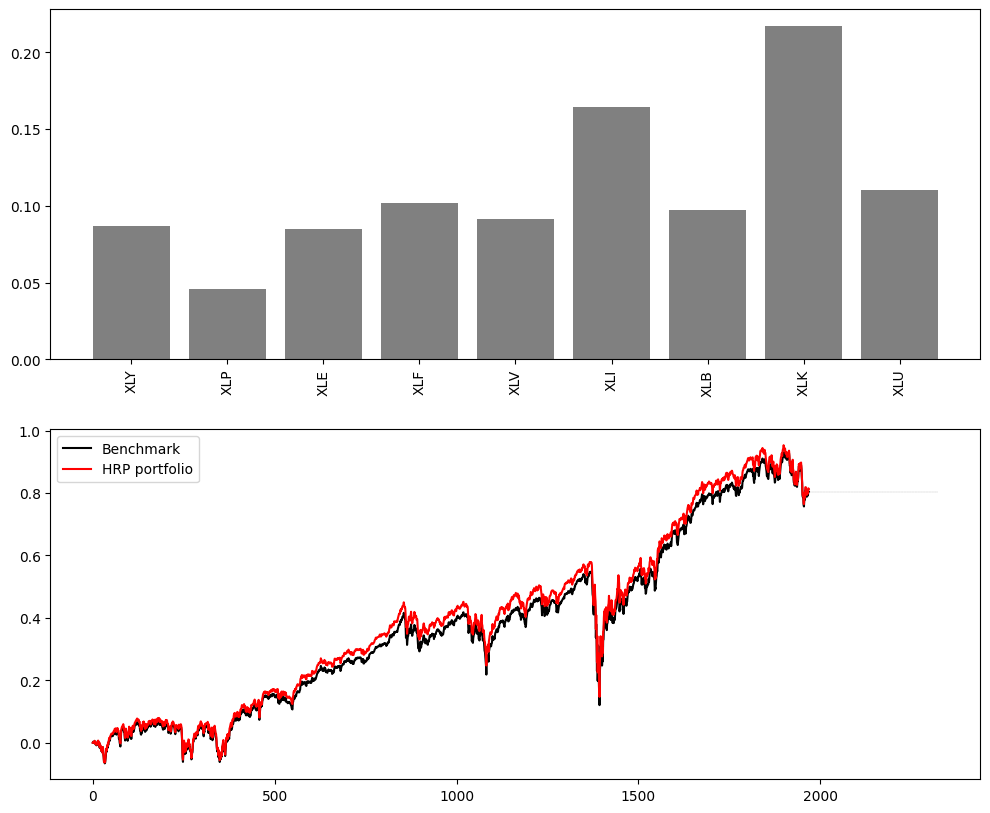

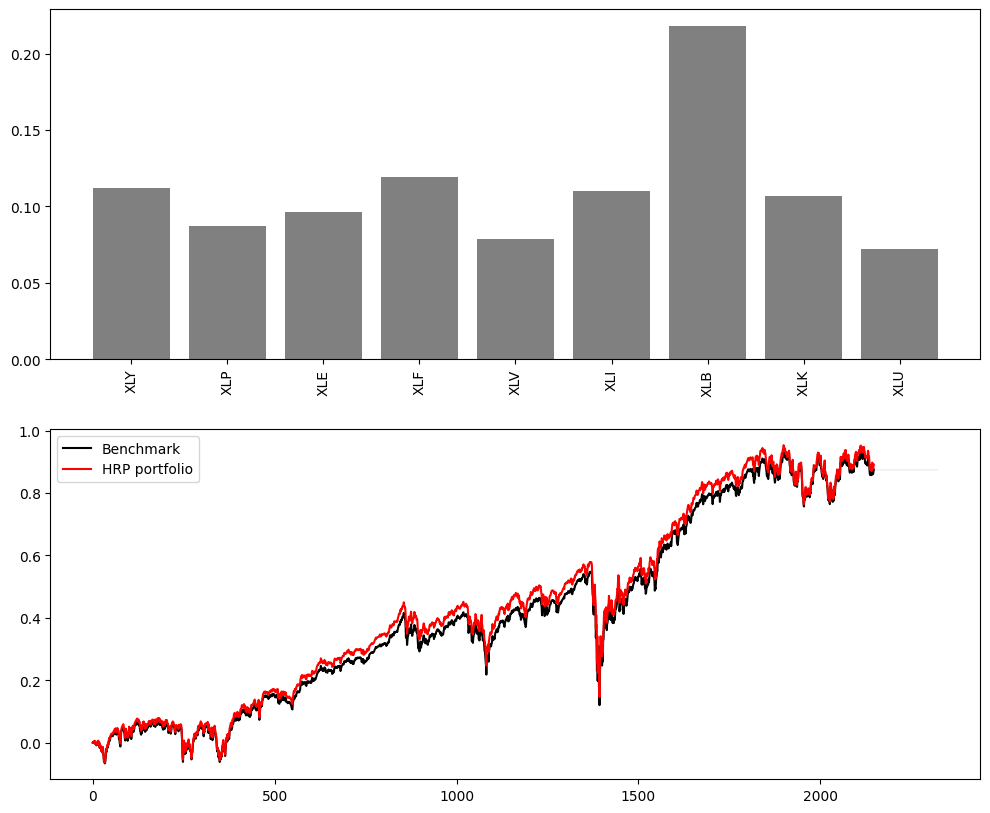

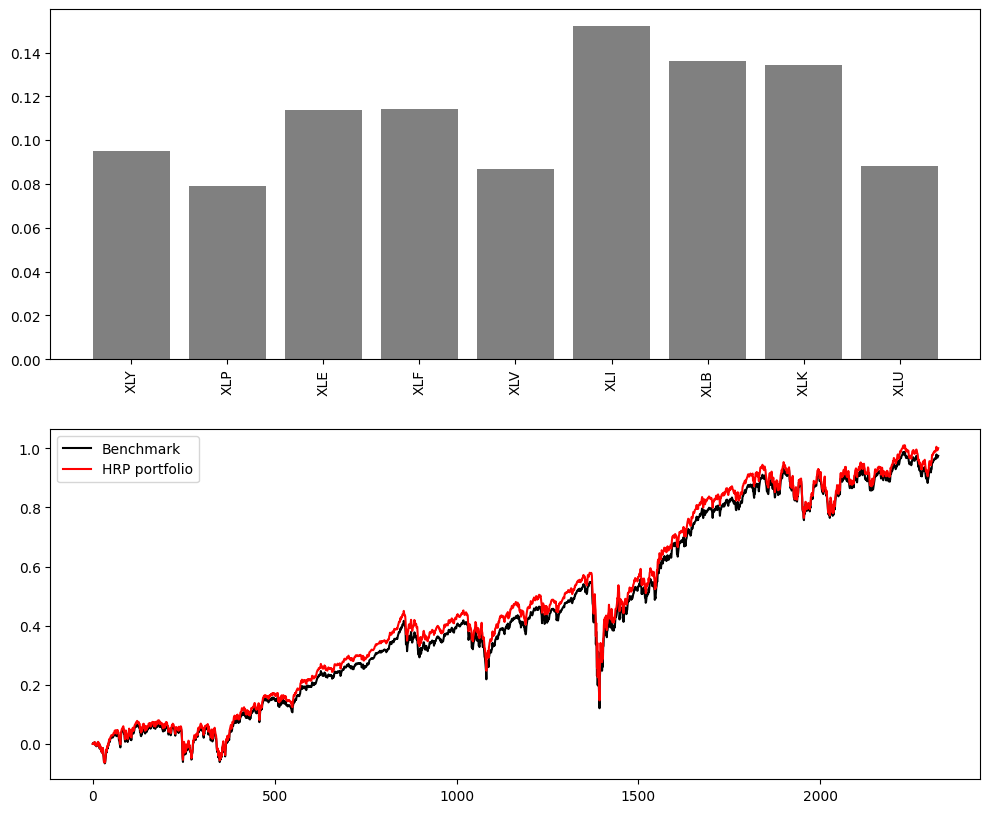

In [ ]:
plot_results(result_equal1,
             result_hrp1,
             actions_hrp1,
             N_ASSETS1,
             state1.columns,
             'HRP portfolio', './images_etf/hrp1/', 'series')

#### Holt Portfolio

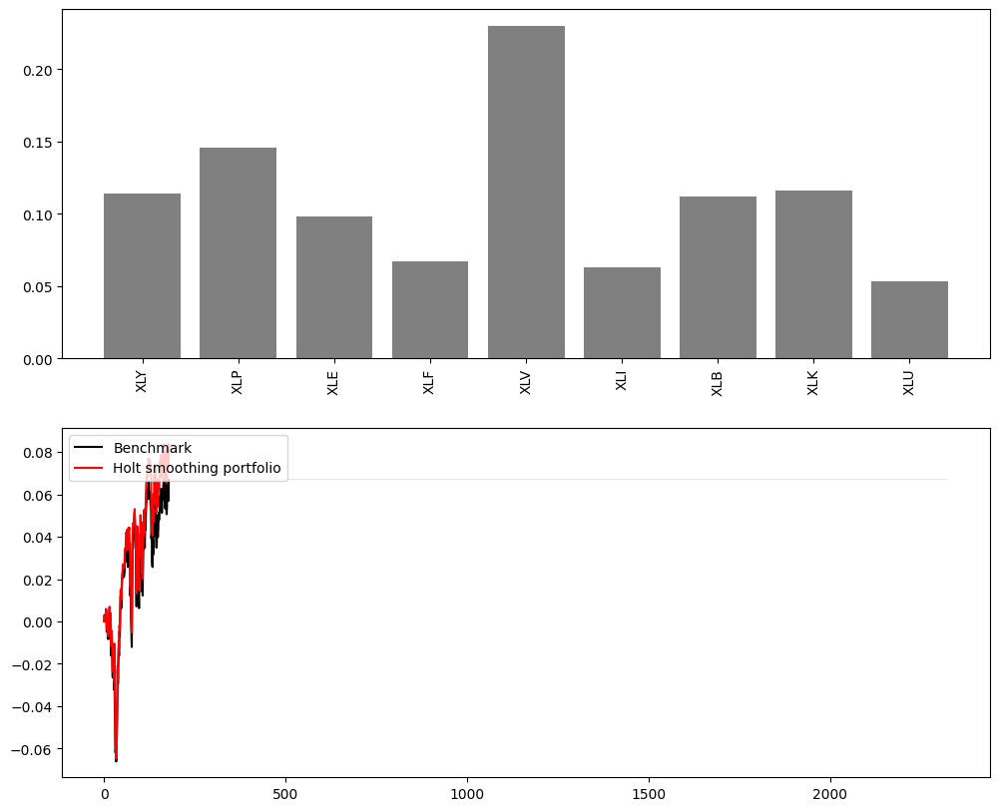

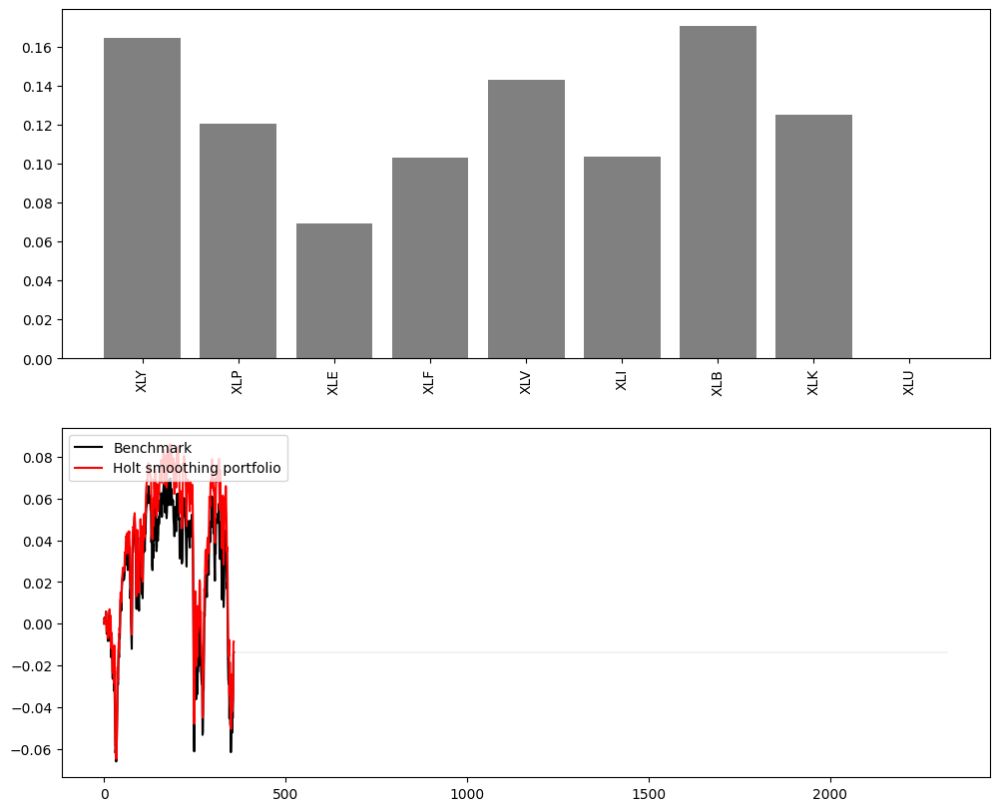

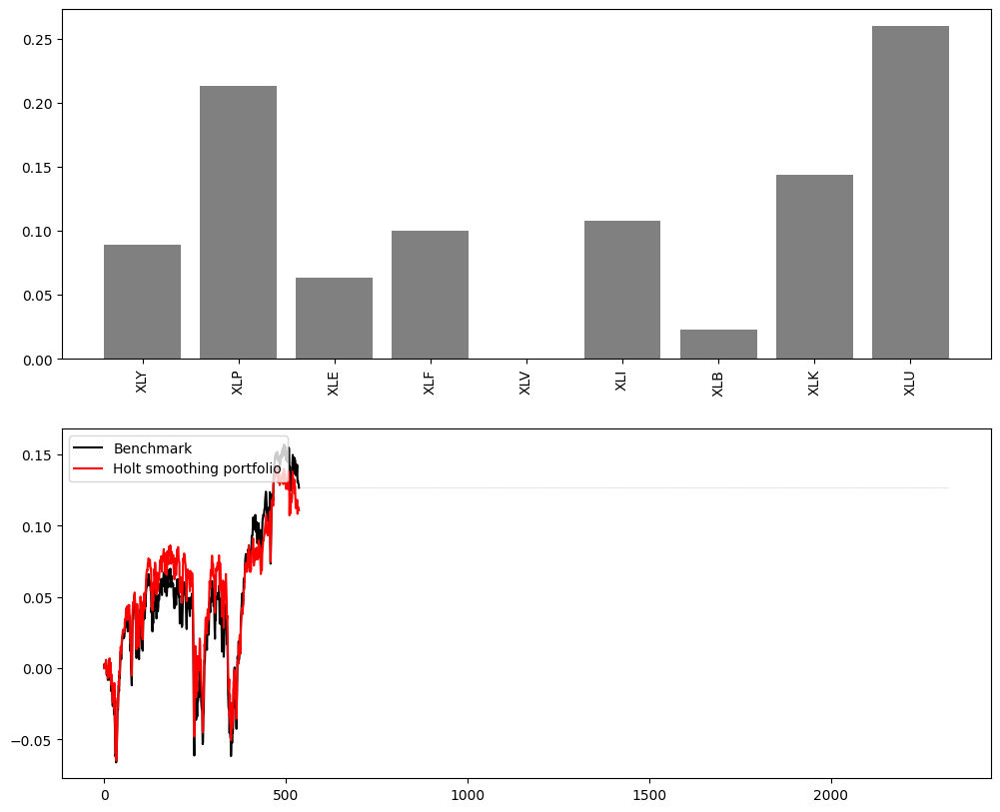

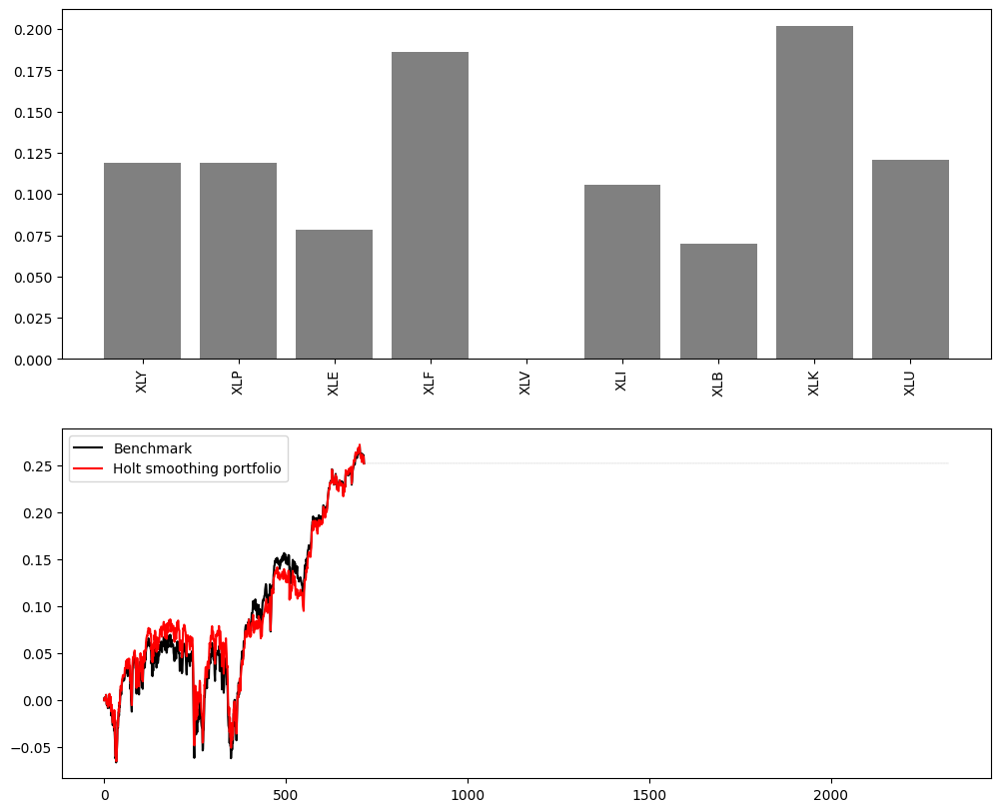

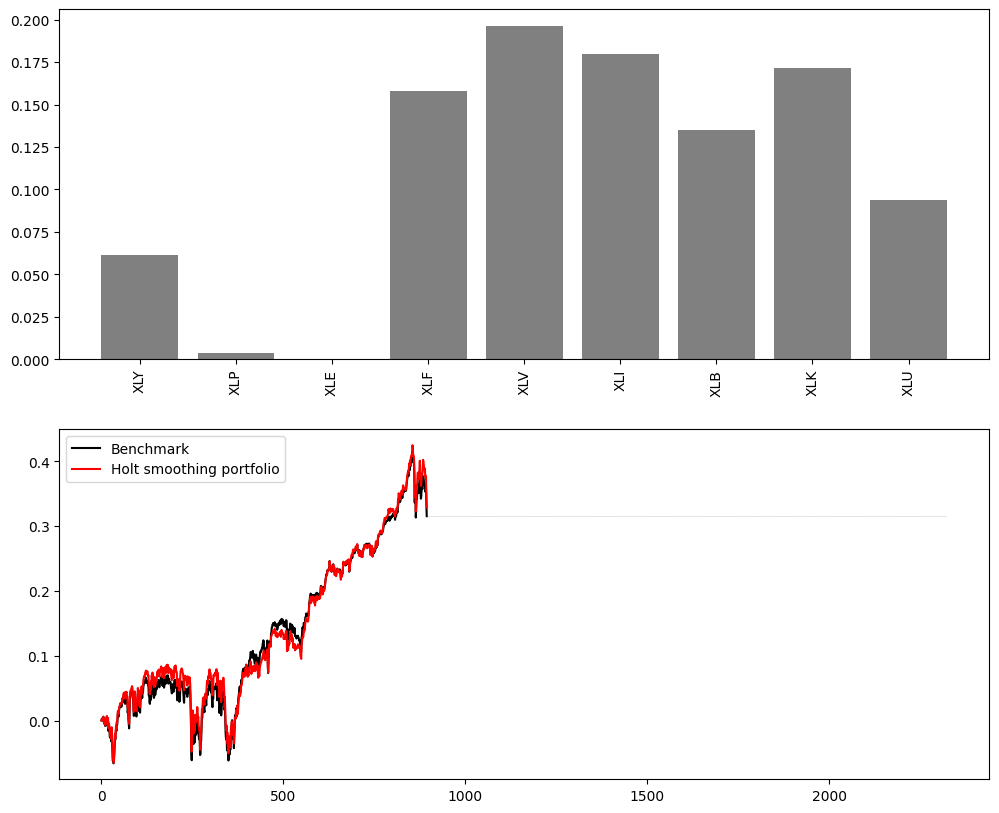

...

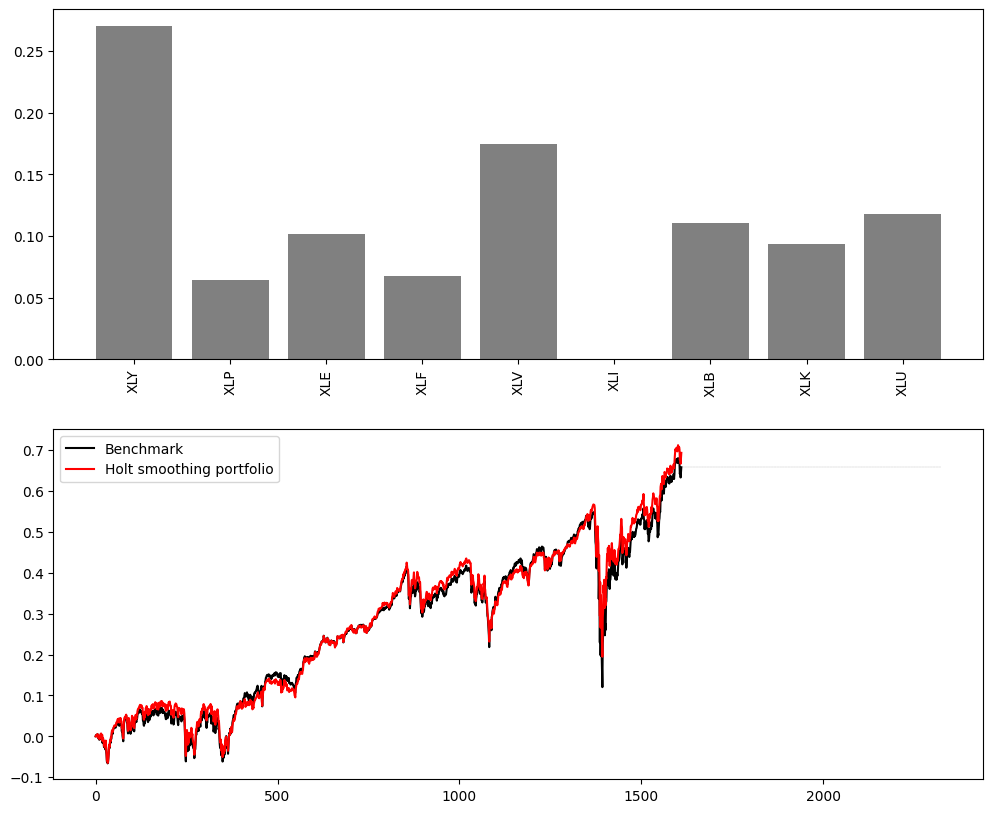

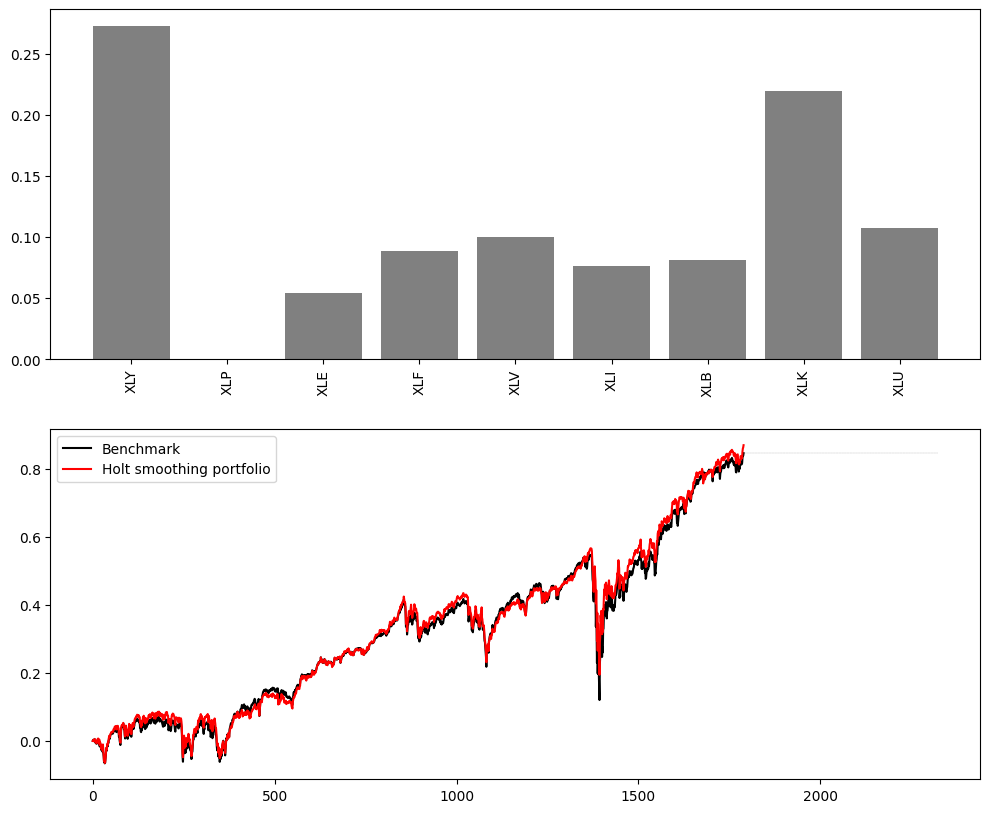

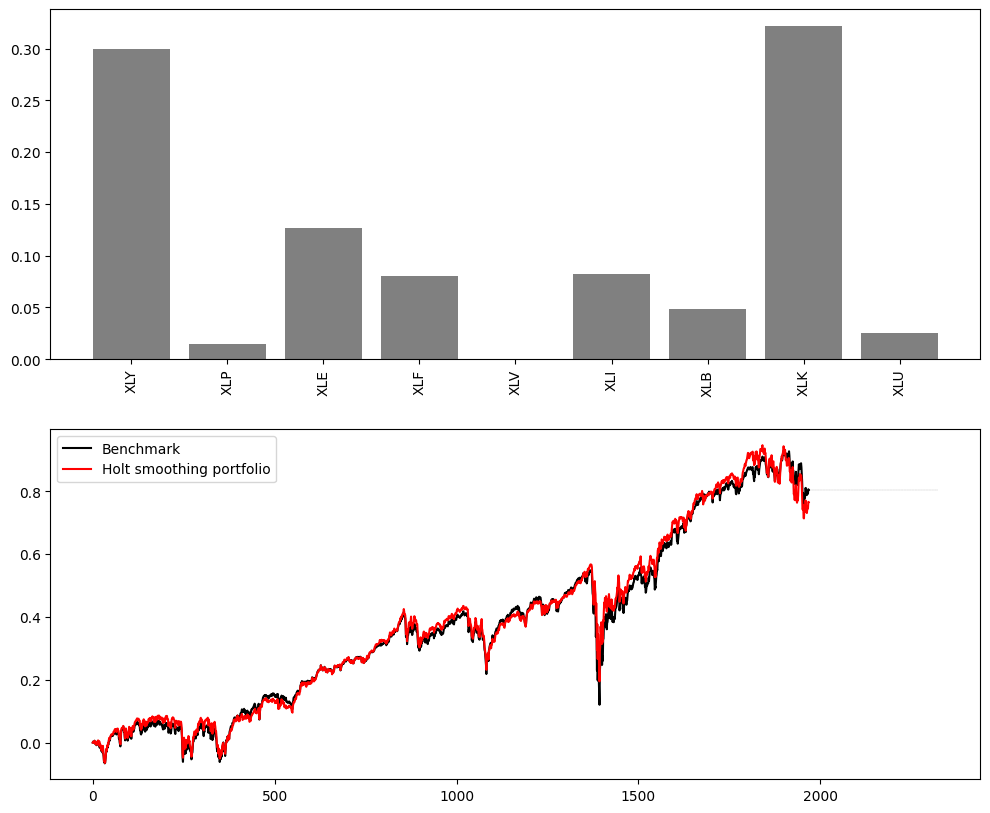

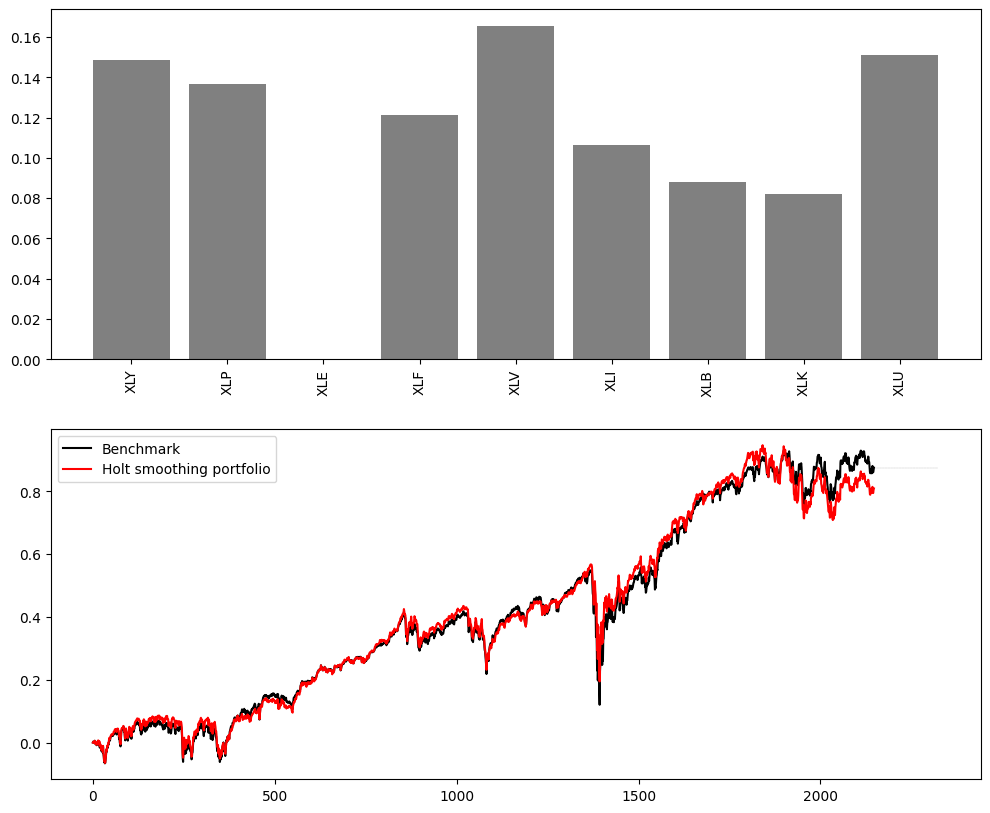

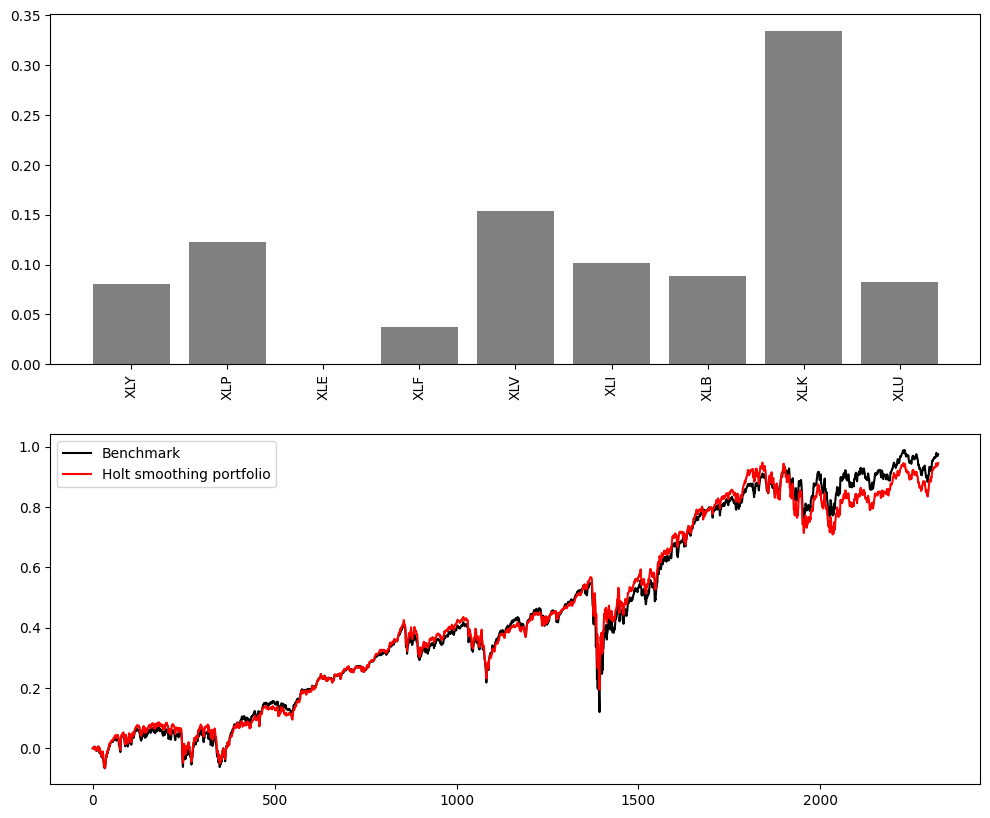

In [ ]:
plot_results(result_equal1,
             result_smooth1,
             actions_smooth1,
             N_ASSETS1,
             state1.columns,
             'Holt smoothing portfolio', './images_etf/smoothing1/', 'series')

####Autoencoder Portfolio

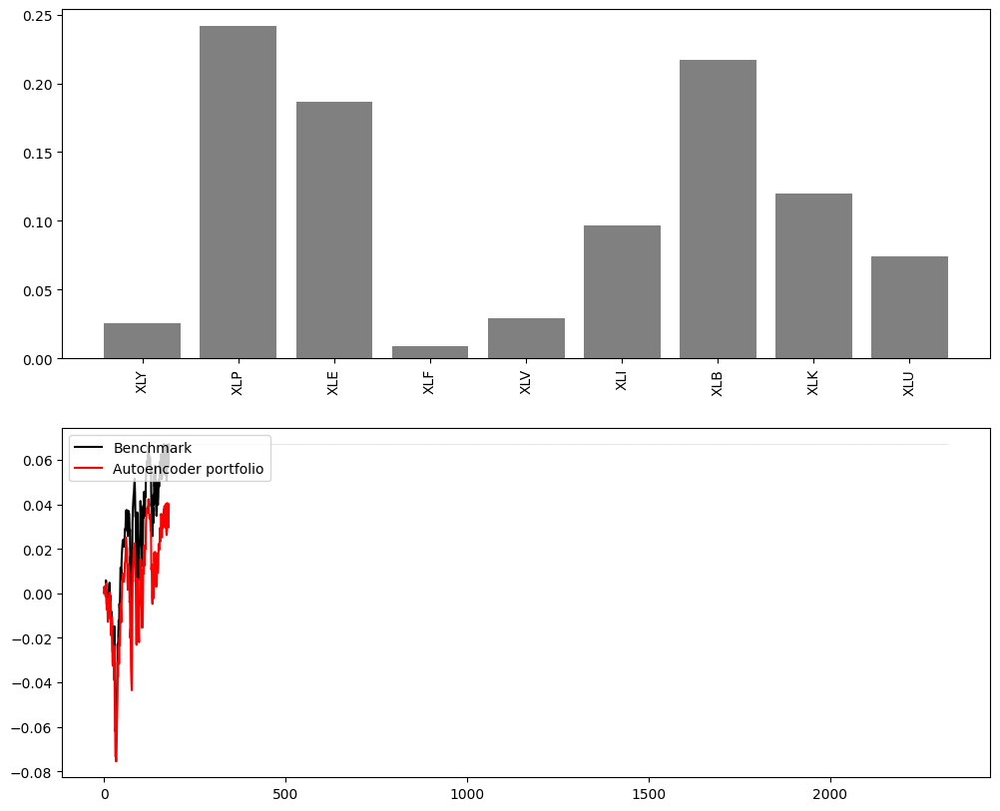

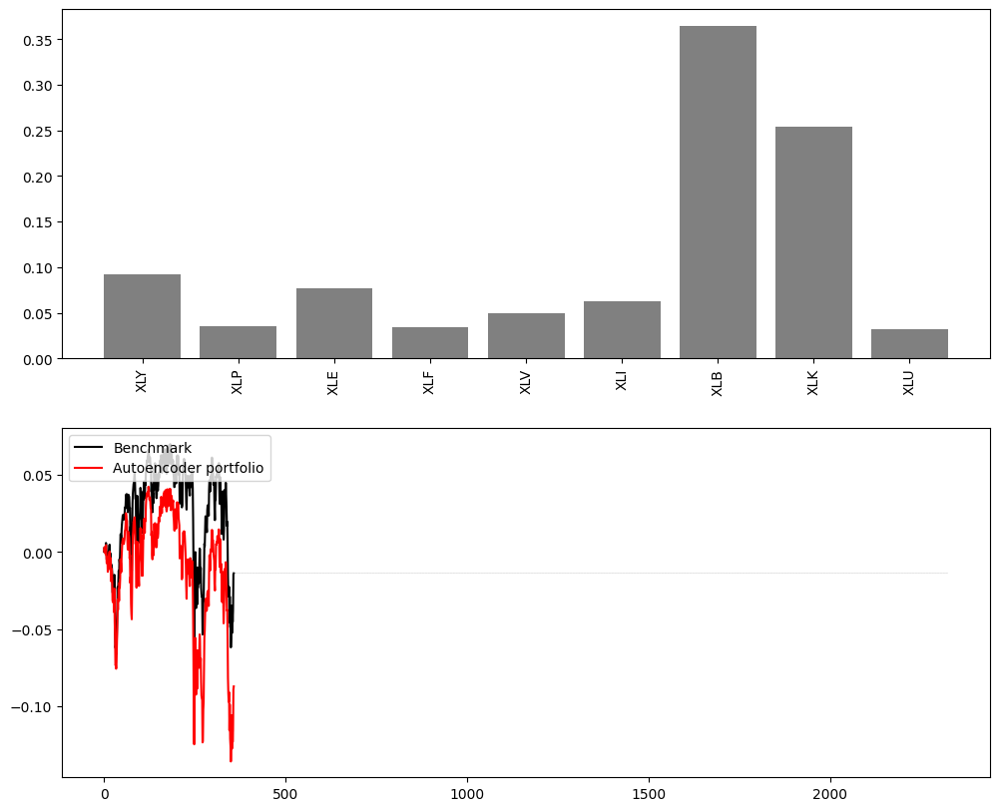

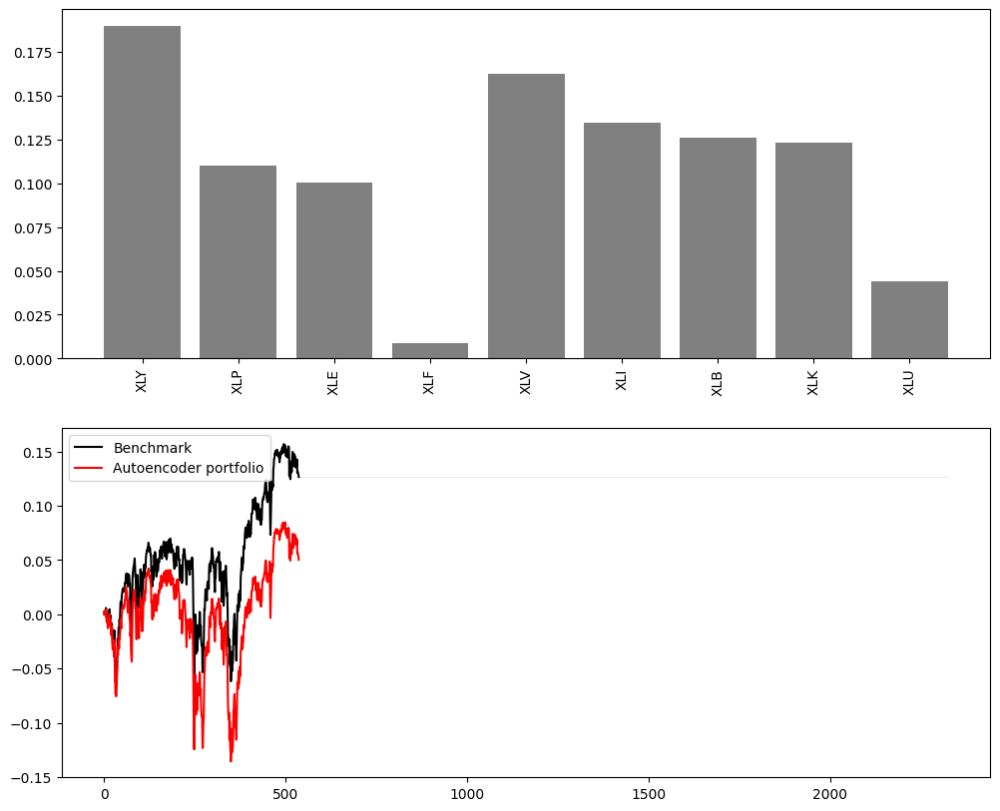

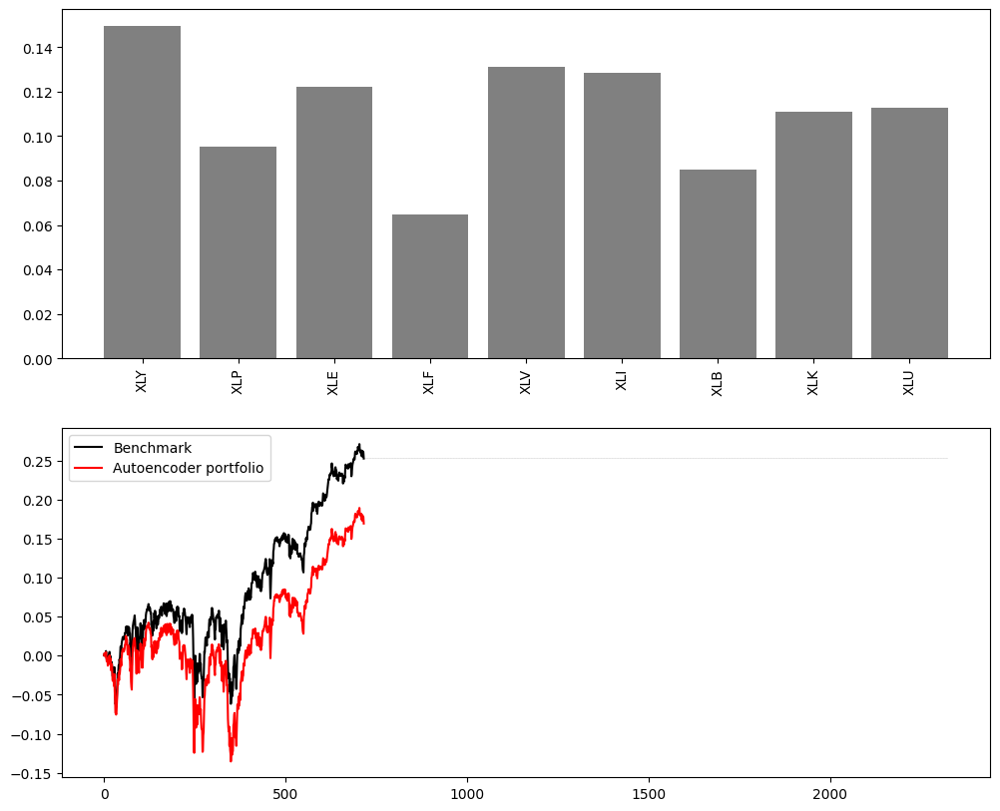

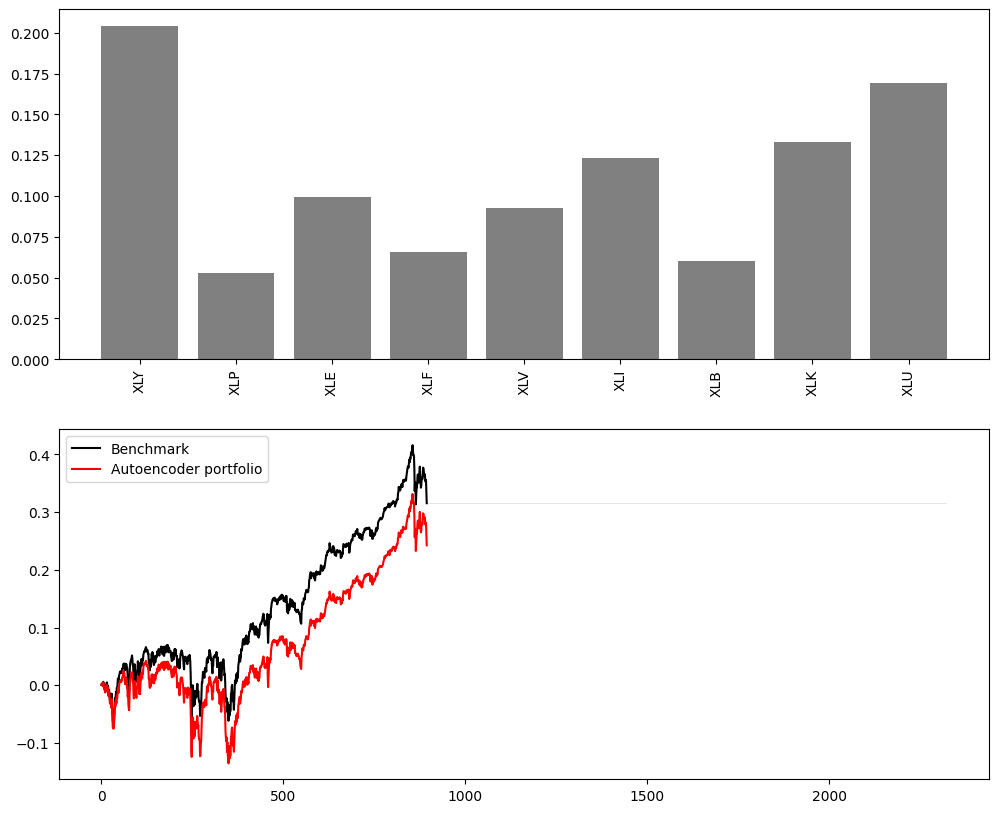

...

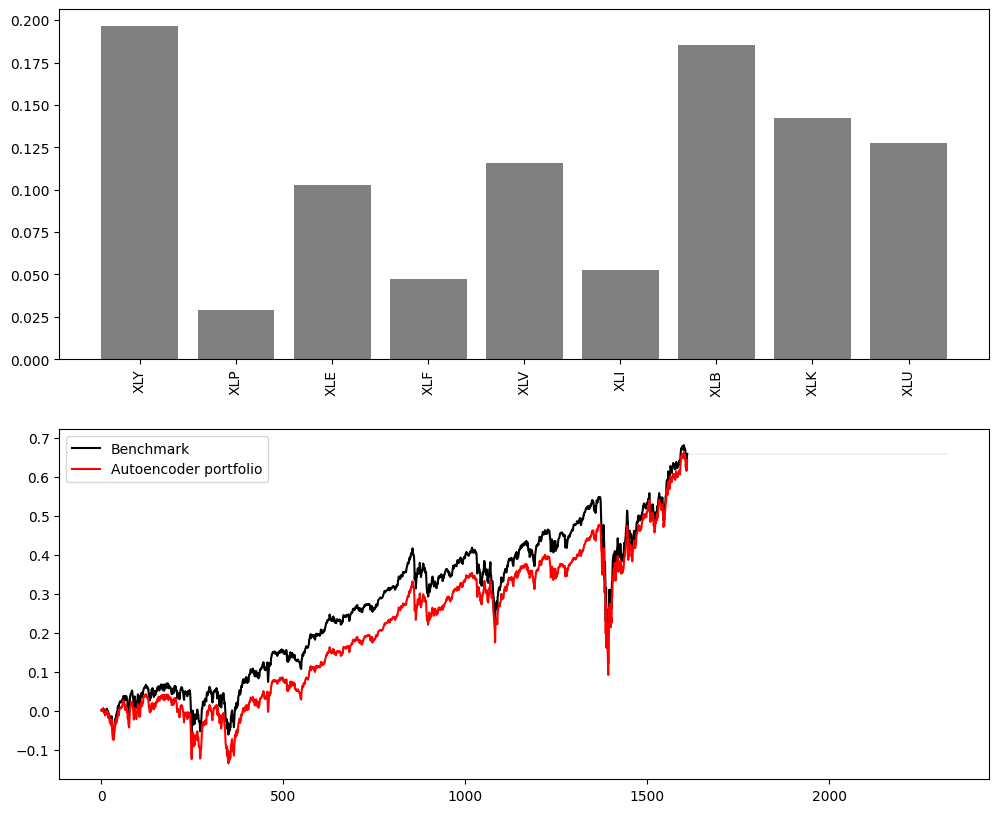

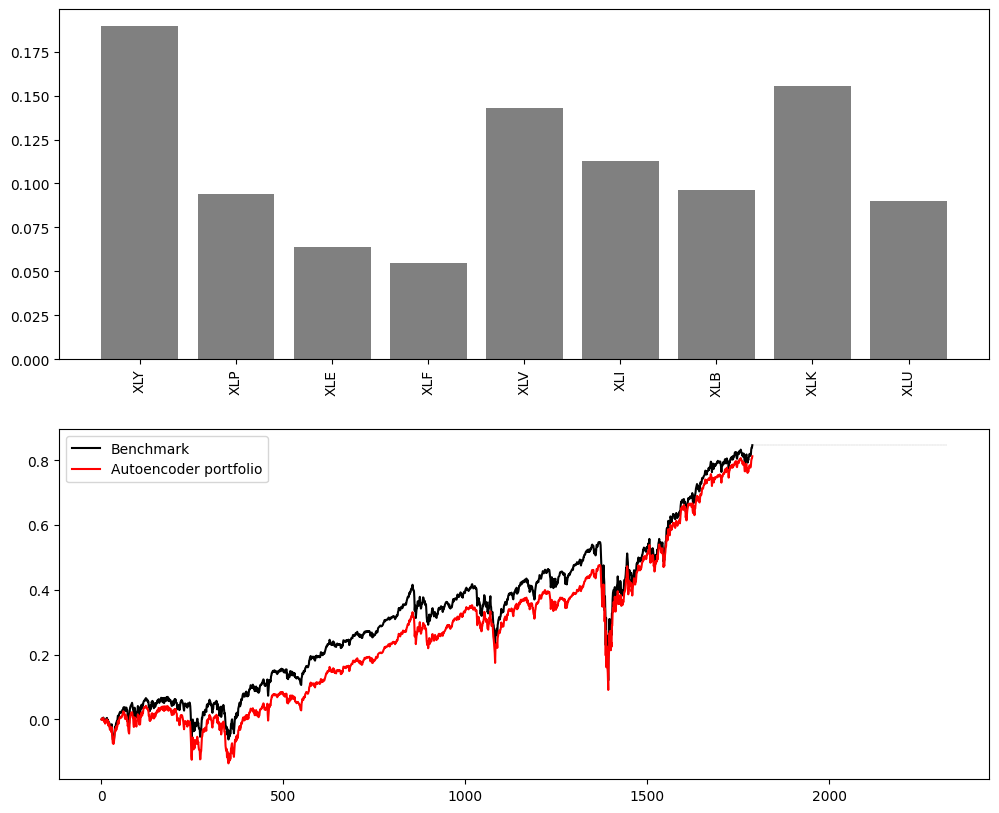

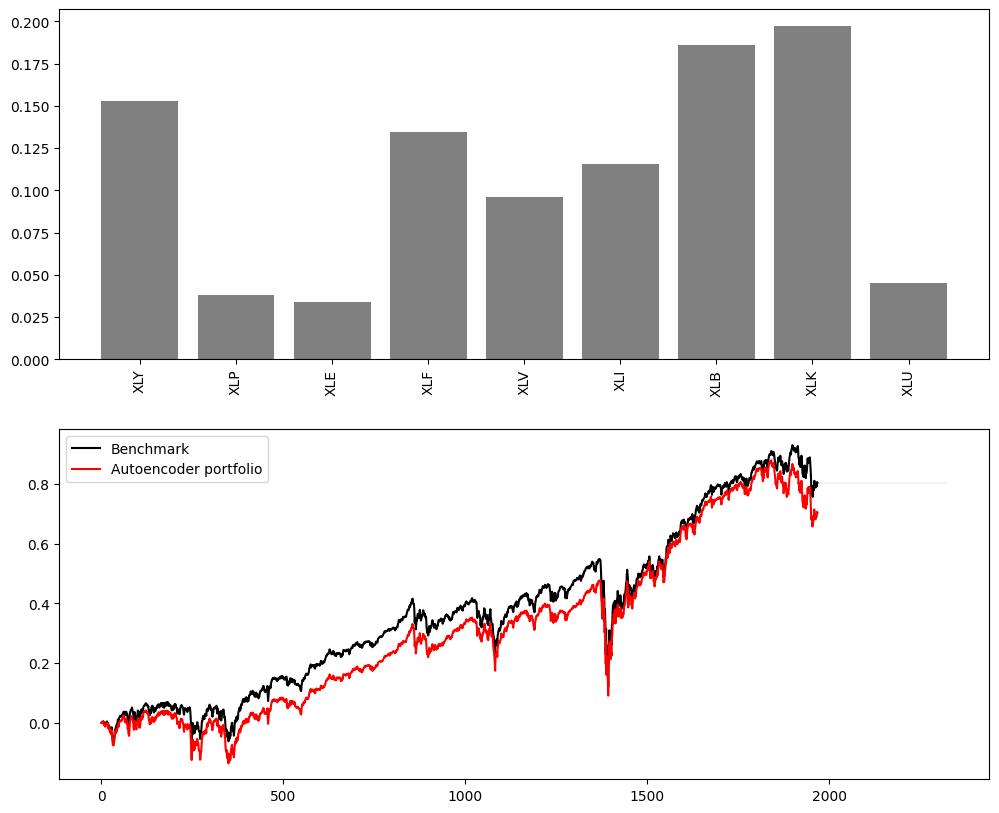

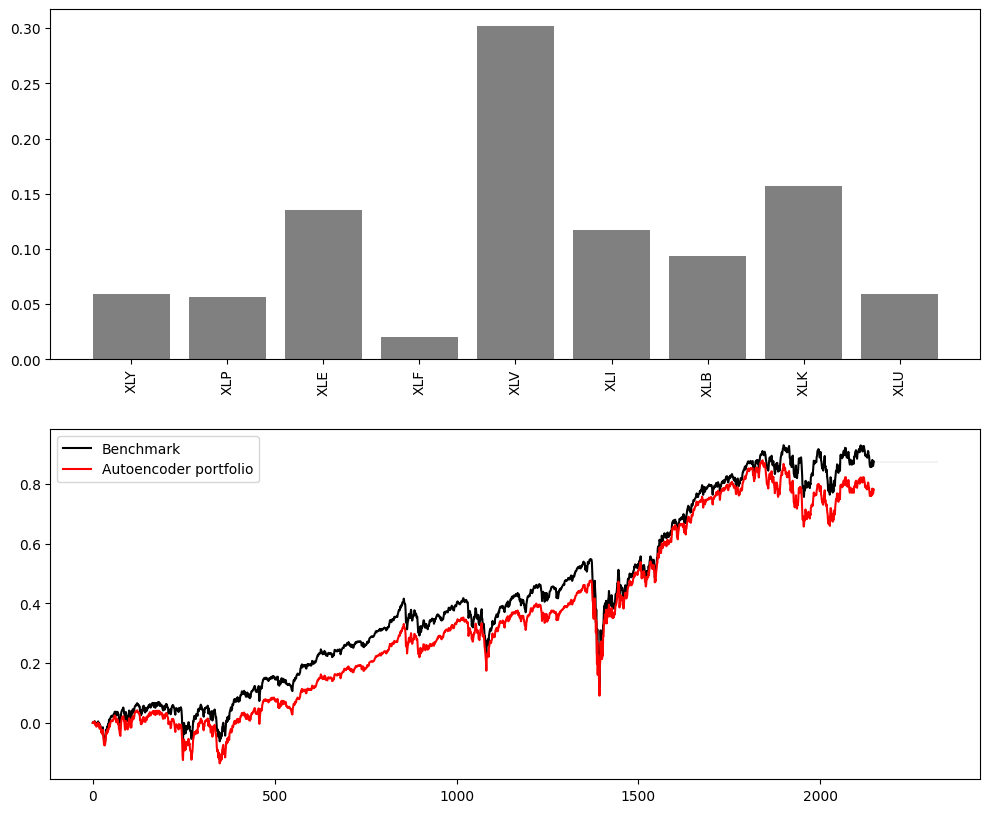

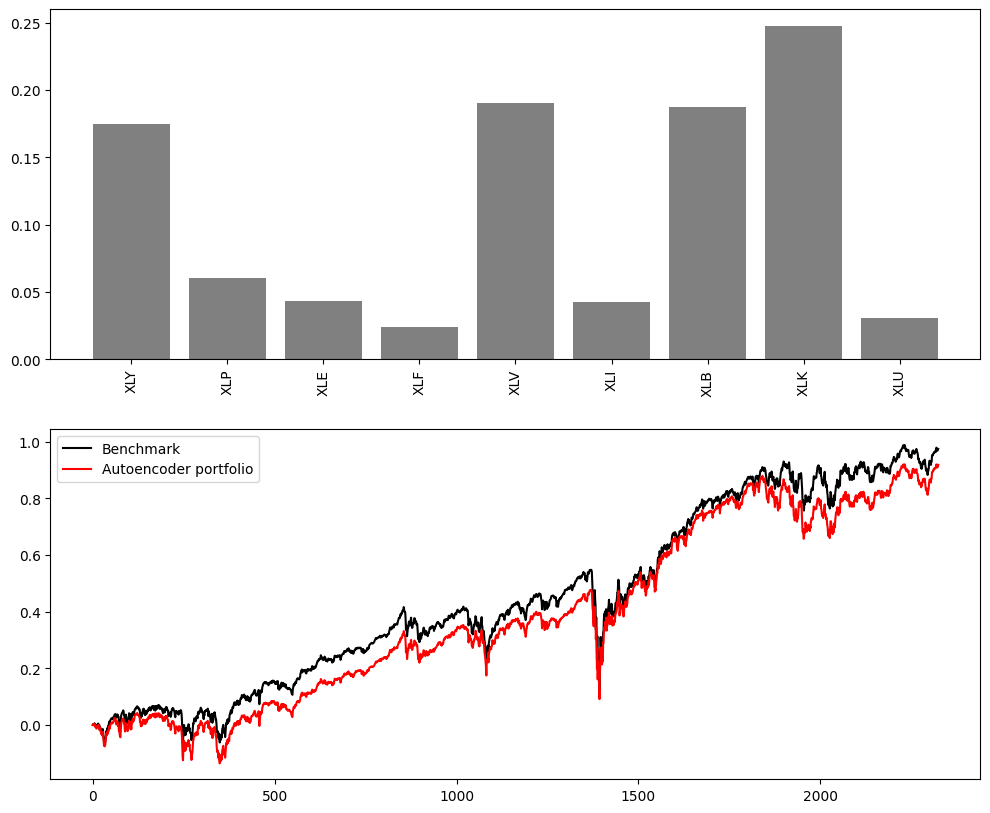

In [ ]:
plot_results(result_equal1,
             result_ae1,
             actions_ae1,
             N_ASSETS1,
             state1.columns,
             'Autoencoder portfolio', './images_etf/ae1/', 'series')

### Supplement

In [ ]:
name = 'ae1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'decorr1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'hrp1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'maxret1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'minvar1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'pca1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'sharpe1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)

In [ ]:
name = 'smoothing1'
filenames = glob.glob('./images_etf/' + name + '/series*.jpg')
filenames.sort(key=lambda x: os.path.getmtime(x))
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./images_etf/' + name + '_gif.gif', images, duration=3)